In [1]:
# importing the required libraries
import csv
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline
from matplotlib.ticker import MaxNLocator  
import warnings
warnings.filterwarnings('ignore')
import cv2
import os
import PIL
import itertools
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from tensorflow.keras.callbacks import ModelCheckpoint
# For Grubb's test
import scipy.stats as stats
# For isolation forest
from sklearn.ensemble import IsolationForest

In [2]:
# Displaying all the columns in a df. Code gotten from stack overflow
pd.options.display.max_columns = None

In [3]:
# Assigning values to units for easy conversion 
KWh = 1000
MWh = 1000000
GWh = 1000000000
TWh = 1000000000000

In [4]:
# Reading in the kaggle dataset
df_kaggle = pd.read_csv("World Energy Consumption.csv")
df_kaggle

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,energy_cons_change_twh,biofuel_share_elec,biofuel_elec_per_capita,biofuel_cons_change_pct,biofuel_share_energy,biofuel_cons_change_twh,biofuel_consumption,biofuel_cons_per_capita,carbon_intensity_elec,coal_share_elec,coal_cons_change_pct,coal_share_energy,coal_cons_change_twh,coal_consumption,coal_elec_per_capita,coal_cons_per_capita,coal_production,coal_prod_per_capita,electricity_generation,biofuel_electricity,coal_electricity,fossil_electricity,gas_electricity,hydro_electricity,nuclear_electricity,oil_electricity,other_renewable_electricity,other_renewable_exc_biofuel_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_share_energy,fossil_cons_change_twh,fossil_fuel_consumption,fossil_energy_per_capita,fossil_cons_per_capita,fossil_share_elec,gas_share_elec,gas_cons_change_pct,gas_share_energy,gas_cons_change_twh,gas_consumption,gas_elec_per_capita,gas_energy_per_capita,gas_production,gas_prod_per_capita,hydro_share_elec,hydro_cons_change_pct,hydro_share_energy,hydro_cons_change_twh,hydro_consumption,hydro_elec_per_capita,hydro_energy_per_capita,low_carbon_share_elec,low_carbon_electricity,low_carbon_elec_per_capita,low_carbon_cons_change_pct,low_carbon_share_energy,low_carbon_cons_change_twh,low_carbon_consumption,low_carbon_energy_per_capita,nuclear_share_elec,nuclear_cons_change_pct,nuclear_share_energy,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,oil_share_elec,oil_cons_change_pct,oil_share_energy,oil_cons_change_twh,oil_consumption,oil_elec_per_capita,oil_energy_per_capita,oil_production,oil_prod_per_capita,other_renewables_elec_per_capita,other_renewables_share_elec,other_renewables_cons_change_pct,other_renewables_share_energy,other_renewables_cons_change_twh,other_renewable_consumption,other_renewables_energy_per_capita,per_capita_electricity,population,primary_energy_consumption,renewables_elec_per_capita,renewables_share_elec,renewables_cons_change_pct,renewables_share_energy,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,solar_cons_change_pct,solar_share_energy,solar_cons_change_twh,solar_consumption,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
0,AFG,Afghanistan,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5021241.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AFG,Afghanistan,1901,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5053439.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AFG,Afghanistan,1902,NaN,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [5]:
# Obtaining the columns in the kaggle dataset
for col in df_kaggle.columns:
    print(col)

iso_code
country
year
coal_prod_change_pct
coal_prod_change_twh
gas_prod_change_pct
gas_prod_change_twh
oil_prod_change_pct
oil_prod_change_twh
energy_cons_change_pct
energy_cons_change_twh
biofuel_share_elec
biofuel_elec_per_capita
biofuel_cons_change_pct
biofuel_share_energy
biofuel_cons_change_twh
biofuel_consumption
biofuel_cons_per_capita
carbon_intensity_elec
coal_share_elec
coal_cons_change_pct
coal_share_energy
coal_cons_change_twh
coal_consumption
coal_elec_per_capita
coal_cons_per_capita
coal_production
coal_prod_per_capita
electricity_generation
biofuel_electricity
coal_electricity
fossil_electricity
gas_electricity
hydro_electricity
nuclear_electricity
oil_electricity
other_renewable_electricity
other_renewable_exc_biofuel_electricity
renewables_electricity
solar_electricity
wind_electricity
energy_per_gdp
energy_per_capita
fossil_cons_change_pct
fossil_share_energy
fossil_cons_change_twh
fossil_fuel_consumption
fossil_energy_per_capita
fossil_cons_per_capita
fossil_share_e

In [6]:
# Countries in the kaggle dataset
df_kaggle["country"].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'American Samoa',
       'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia Pacific', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas',
       'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium',
       'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'CIS', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Central America',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Cook Islands', 'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba',
       'Cyprus', 'Czechia', 'Czechoslovakia',
       'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Eastern Africa', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia'

In [7]:
# Filtering out the G7 Countries
df_kaggle = df_kaggle[(df_kaggle["country"]== "Canada")|
                     (df_kaggle["country"]== "France")|
                     (df_kaggle["country"]== "Germany")|
                     (df_kaggle["country"]== "United Kingdom")|
                     (df_kaggle["country"]== "United States")|
                     (df_kaggle["country"]== "Italy")|
                     (df_kaggle["country"]== "Japan")]
df_kaggle

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,energy_cons_change_twh,biofuel_share_elec,biofuel_elec_per_capita,biofuel_cons_change_pct,biofuel_share_energy,biofuel_cons_change_twh,biofuel_consumption,biofuel_cons_per_capita,carbon_intensity_elec,coal_share_elec,coal_cons_change_pct,coal_share_energy,coal_cons_change_twh,coal_consumption,coal_elec_per_capita,coal_cons_per_capita,coal_production,coal_prod_per_capita,electricity_generation,biofuel_electricity,coal_electricity,fossil_electricity,gas_electricity,hydro_electricity,nuclear_electricity,oil_electricity,other_renewable_electricity,other_renewable_exc_biofuel_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_share_energy,fossil_cons_change_twh,fossil_fuel_consumption,fossil_energy_per_capita,fossil_cons_per_capita,fossil_share_elec,gas_share_elec,gas_cons_change_pct,gas_share_energy,gas_cons_change_twh,gas_consumption,gas_elec_per_capita,gas_energy_per_capita,gas_production,gas_prod_per_capita,hydro_share_elec,hydro_cons_change_pct,hydro_share_energy,hydro_cons_change_twh,hydro_consumption,hydro_elec_per_capita,hydro_energy_per_capita,low_carbon_share_elec,low_carbon_electricity,low_carbon_elec_per_capita,low_carbon_cons_change_pct,low_carbon_share_energy,low_carbon_cons_change_twh,low_carbon_consumption,low_carbon_energy_per_capita,nuclear_share_elec,nuclear_cons_change_pct,nuclear_share_energy,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,oil_share_elec,oil_cons_change_pct,oil_share_energy,oil_cons_change_twh,oil_consumption,oil_elec_per_capita,oil_energy_per_capita,oil_production,oil_prod_per_capita,other_renewables_elec_per_capita,other_renewables_share_elec,other_renewables_cons_change_pct,other_renewables_share_energy,other_renewables_cons_change_twh,other_renewable_consumption,other_renewables_energy_per_capita,per_capita_electricity,population,primary_energy_consumption,renewables_elec_per_capita,renewables_share_elec,renewables_cons_change_pct,renewables_share_energy,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,solar_cons_change_pct,solar_share_energy,solar_cons_change_twh,solar_consumption,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
2891,CAN,Canada,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.667,7715.942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.419,256.588,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5529722.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.526591e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2892,CAN,Canada,1901,12.269,5.235,NaN,0.000,-17.213,-0.244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.902,8507.739,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.175,208.624,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5630366.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.719837e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2893,CAN,Canada,1902,15.126,7.245,NaN,0.000,-29.703,-0.349,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.147,9642.747,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [8]:
# Columns to be used for this work
df_kag_useful_cols = ["iso_code", "country", "year", "renewables_electricity", "solar_electricity",
                      "wind_electricity", "hydro_electricity", "nuclear_electricity",
                      "other_renewable_electricity", "fossil_electricity", "low_carbon_electricity",
                      "primary_energy_consumption", "population", "gdp", "energy_per_gdp", "energy_per_capita",
                      "renewables_consumption", "renewables_cons_change_twh", "renewables_energy_per_capita",
                      "renewables_cons_change_pct","renewables_share_elec", "solar_share_elec", "wind_share_elec",
                      "electricity_generation", "fossil_cons_change_pct",
                      "fossil_cons_change_twh", "fossil_fuel_consumption", "fossil_cons_per_capita",
                      "fossil_share_elec", "nuclear_share_elec", "nuclear_cons_change_pct",
                      "nuclear_cons_change_twh", "nuclear_consumption", 
                      "nuclear_elec_per_capita", "nuclear_energy_per_capita"]

In [9]:
len(df_kag_useful_cols)

35

In [10]:
# Dropping the non-relevant columns
for col in df_kaggle.columns:
    if col not in df_kag_useful_cols:
        df_kaggle = df_kaggle.drop(col, axis=1)

In [11]:
len(df_kaggle.columns)

35

In [12]:
df_kaggle

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec
2891,CAN,Canada,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5529722.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.526591e+10,NaN
2892,CAN,Canada,1901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5630366.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.719837e+10,NaN
2893,CAN,Canada,1902,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5719032.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.977550e+10,NaN
2894,CAN,Canada,1903,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5859590.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.057638e+10,NaN
2895,CAN,Canada,1904,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6017754.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.093503e+10,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16365,USA,United States,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.077,1998.776,6187.854,1.340,1.720000e+13,5.543
16366,USA,United States,2017,4058.261,2549.205,293.839,804.950,78.688,704.106,77.276,254.303,NaN,78894.410,-0.454,-97.226,21331.723,7841.657,62.815,1509.056,19.835,-0.680,-14.505,2118.290,2476.121,6516.112,325084992.0,25647.389,17.350,9.936,198.599,2197.375,6759.386,1.904,NaN,6.266
16367,USA,United States,2018,4203.937,2666.350,286.619,807.084,77.868,730.502,93.365,272.650,NaN,81188.359,4.054,864.750,22196.473,8151.584,63.425,1537.587,19.198,-0.321,-6.803,2111.488,2467.424,6455.254,327096000.0,26556.388,17.377,2.323,51.052,2248.427,6873.904,2.221,NaN,6.486
16368,USA,United States,2019,4161.834,2595.032,282.613,809.409,72.980,757.393,106.894,294.906,NaN,79897.151,-1.376,-305.371,21891.102,7886.077,62.353,1566.802,19.448,-0.082,-1.725,2109.762,2459.725,6411.385,329064992.0,26291.355,18.199,1.871,42.065,2290.491,6960.604,2.568,NaN,7.086


In [13]:
# Obtaining the years 2000 to 2019 for this work
df_kaggle = df_kaggle[(df_kaggle["year"]>=2000) & (df_kaggle["year"]<= 2019)]
df_kaggle

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec
2991,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045
2992,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059
2993,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070
2994,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144
2995,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16364,USA,United States,2015,4091.740,2741.274,243.989,797.178,79.549,553.289,39.032,190.719,1.515,79771.642,-1.229,-269.564,21670.455,8543.039,66.995,1350.467,19.483,-0.594,-12.680,2122.812,2484.364,6615.637,320878016.0,25596.966,13.522,1.738,30.810,1803.698,5621.134,0.954,1.690000e+13,4.661
16365,USA,United States,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.077,1998.776,6187.854,1.340,1.720000e+13,5.543
16366,USA,United States,2017,4058.261,2549.205,293.839,804.950,78.688,704.106,77.276,254.303,NaN,78894.410,-0.454,-97.226,21331.723,7841.657,62.815,1509.056,19.835,-0.680,-14.505,2118.290,2476.121,6516.112,325084992.0,25647.389,17.350,9.936,198.599,2197.375,6759.386,1.904,NaN,6.266
16367,USA,United States,2018,4203.937,2666.350,286.619,807.084,77.868,730.502,93.365,272.650,NaN,81188.359,4.054,864.750,22196.473,8151.584,63.425,1537.587,19.198,-0.321,-6.803,2111.488,2467.424,6455.254,327096000.0,26556.388,17.377,2.323,51.052,2248.427,6873.904,2.221,NaN,6.486


In [14]:
# Reseting the index
df_kaggle = df_kaggle.reset_index(drop=True)
df_kaggle

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,USA,United States,2015,4091.740,2741.274,243.989,797.178,79.549,553.289,39.032,190.719,1.515,79771.642,-1.229,-269.564,21670.455,8543.039,66.995,1350.467,19.483,-0.594,-12.680,2122.812,2484.364,6615.637,320878016.0,25596.966,13.522,1.738,30.810,1803.698,5621.134,0.954,1.690000e+13,4.661
136,USA,United States,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.077,1998.776,6187.854,1.340,1.720000e+13,5.543
137,USA,United States,2017,4058.261,2549.205,293.839,804.950,78.688,704.106,77.276,254.303,NaN,78894.410,-0.454,-97.226,21331.723,7841.657,62.815,1509.056,19.835,-0.680,-14.505,2118.290,2476.121,6516.112,325084992.0,25647.389,17.350,9.936,198.599,2197.375,6759.386,1.904,NaN,6.266
138,USA,United States,2018,4203.937,2666.350,286.619,807.084,77.868,730.502,93.365,272.650,NaN,81188.359,4.054,864.750,22196.473,8151.584,63.425,1537.587,19.198,-0.321,-6.803,2111.488,2467.424,6455.254,327096000.0,26556.388,17.377,2.323,51.052,2248.427,6873.904,2.221,NaN,6.486


In [15]:
# Reading in population dataset gotten from OECD
df_pop = pd.read_csv("Population.csv")
df_pop

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,POP,TOT,MLN_PER,A,1960,18.256447,NaN
1,CAN,POP,TOT,MLN_PER,A,1961,18.634666,NaN
2,CAN,POP,TOT,MLN_PER,A,1962,18.989309,NaN
3,CAN,POP,TOT,MLN_PER,A,1963,19.347231,NaN
4,CAN,POP,TOT,MLN_PER,A,1964,19.719595,NaN
...,...,...,...,...,...,...,...,...
491,RUS,POP,TOT,MLN_PER,A,2017,146.842404,NaN
492,RUS,POP,TOT,MLN_PER,A,2018,146.830572,NaN
493,RUS,POP,TOT,MLN_PER,A,2019,146.764661,NaN
494,RUS,POP,TOT,MLN_PER,A,2020,146.459803,NaN


In [16]:
"""Multiplying all the population values by 1000000
Hereby changing the measure"""

df_pop["Value"] = df_pop["Value"]*MWh
df_pop["MEASURE"] = df_pop["MEASURE"].replace("MLN_PER", "PERSONS")
df_pop

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,POP,TOT,PERSONS,A,1960,18256447.0,NaN
1,CAN,POP,TOT,PERSONS,A,1961,18634666.0,NaN
2,CAN,POP,TOT,PERSONS,A,1962,18989309.0,NaN
3,CAN,POP,TOT,PERSONS,A,1963,19347231.0,NaN
4,CAN,POP,TOT,PERSONS,A,1964,19719595.0,NaN
...,...,...,...,...,...,...,...,...
491,RUS,POP,TOT,PERSONS,A,2017,146842404.0,NaN
492,RUS,POP,TOT,PERSONS,A,2018,146830572.0,NaN
493,RUS,POP,TOT,PERSONS,A,2019,146764661.0,NaN
494,RUS,POP,TOT,PERSONS,A,2020,146459803.0,NaN


In [17]:
# filtering out the years and G7 countries
df_pop = df_pop[((df_pop["LOCATION"]== "CAN")|
               (df_pop["LOCATION"]== "FRA")|
               (df_pop["LOCATION"]== "DEU")|
               (df_pop["LOCATION"]== "ITA")|
               (df_pop["LOCATION"]== "JPN")|
               (df_pop["LOCATION"]== "GBR")|
               (df_pop["LOCATION"]== "USA")) & ((df_pop["TIME"]>=2000) & (df_pop["TIME"]<=2019))]
    
df_pop = df_pop.reset_index(drop = True)
df_pop

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,POP,TOT,PERSONS,A,2000,30685730.0,NaN
1,CAN,POP,TOT,PERSONS,A,2001,31020902.0,NaN
2,CAN,POP,TOT,PERSONS,A,2002,31360079.0,NaN
3,CAN,POP,TOT,PERSONS,A,2003,31644028.0,NaN
4,CAN,POP,TOT,PERSONS,A,2004,31940655.0,NaN
...,...,...,...,...,...,...,...,...
135,USA,POP,TOT,PERSONS,A,2015,320738994.0,NaN
136,USA,POP,TOT,PERSONS,A,2016,323071755.0,NaN
137,USA,POP,TOT,PERSONS,A,2017,325122128.0,NaN
138,USA,POP,TOT,PERSONS,A,2018,326838199.0,NaN


In [18]:
# Reading in GDP dataset gotten from OECD
df_GDP = pd.read_csv("Gross domestic product (GDP).csv")
df_GDP

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,GDP,TOT,MLN_USD,A,1961,44299.933,NaN
1,CAN,GDP,TOT,MLN_USD,A,1962,48574.474,NaN
2,CAN,GDP,TOT,MLN_USD,A,1963,51906.612,NaN
3,CAN,GDP,TOT,MLN_USD,A,1964,56381.698,NaN
4,CAN,GDP,TOT,MLN_USD,A,1965,61782.956,NaN
...,...,...,...,...,...,...,...,...
414,RUS,GDP,TOT,MLN_USD,A,2016,3538975.300,NaN
415,RUS,GDP,TOT,MLN_USD,A,2017,3807099.411,NaN
416,RUS,GDP,TOT,MLN_USD,A,2018,4231840.387,NaN
417,RUS,GDP,TOT,MLN_USD,A,2019,4398115.281,NaN


In [19]:
"""Multiplying all the gdp values by 1000000
Hereby changing the measure"""

df_GDP["Value"] = df_GDP["Value"]*MWh
df_GDP["MEASURE"] = df_GDP["MEASURE"].replace("MLN_USD", "USD")
df_GDP

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,GDP,TOT,USD,A,1961,4.429993e+10,NaN
1,CAN,GDP,TOT,USD,A,1962,4.857447e+10,NaN
2,CAN,GDP,TOT,USD,A,1963,5.190661e+10,NaN
3,CAN,GDP,TOT,USD,A,1964,5.638170e+10,NaN
4,CAN,GDP,TOT,USD,A,1965,6.178296e+10,NaN
...,...,...,...,...,...,...,...,...
414,RUS,GDP,TOT,USD,A,2016,3.538975e+12,NaN
415,RUS,GDP,TOT,USD,A,2017,3.807099e+12,NaN
416,RUS,GDP,TOT,USD,A,2018,4.231840e+12,NaN
417,RUS,GDP,TOT,USD,A,2019,4.398115e+12,NaN


In [20]:
# filtering out the years and G7 countries
df_GDP = df_GDP[(df_GDP["LOCATION"]== "CAN")|
               (df_GDP["LOCATION"]== "FRA")|
               (df_GDP["LOCATION"]== "DEU")|
               (df_GDP["LOCATION"]== "ITA")|
               (df_GDP["LOCATION"]== "JPN")|
               (df_GDP["LOCATION"]== "GBR")|
               (df_GDP["LOCATION"]== "USA")]

df_GDP

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,GDP,TOT,USD,A,1961,4.429993e+10,NaN
1,CAN,GDP,TOT,USD,A,1962,4.857447e+10,NaN
2,CAN,GDP,TOT,USD,A,1963,5.190661e+10,NaN
3,CAN,GDP,TOT,USD,A,1964,5.638170e+10,NaN
4,CAN,GDP,TOT,USD,A,1965,6.178296e+10,NaN
...,...,...,...,...,...,...,...,...
388,USA,GDP,TOT,USD,A,2017,1.947734e+13,NaN
389,USA,GDP,TOT,USD,A,2018,2.053306e+13,NaN
390,USA,GDP,TOT,USD,A,2019,2.138098e+13,NaN
391,USA,GDP,TOT,USD,A,2020,2.106047e+13,NaN


In [21]:
df_GDP = df_GDP[(df_GDP["TIME"]>=2000) & (df_GDP["TIME"]<=2019)]
df_GDP = df_GDP.reset_index(drop=True)
df_GDP

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,GDP,TOT,USD,A,2000,9.010033e+11,NaN
1,CAN,GDP,TOT,USD,A,2001,9.377930e+11,NaN
2,CAN,GDP,TOT,USD,A,2002,9.710091e+11,NaN
3,CAN,GDP,TOT,USD,A,2003,1.023687e+12,NaN
4,CAN,GDP,TOT,USD,A,2004,1.083615e+12,NaN
...,...,...,...,...,...,...,...,...
135,USA,GDP,TOT,USD,A,2015,1.820602e+13,NaN
136,USA,GDP,TOT,USD,A,2016,1.869511e+13,NaN
137,USA,GDP,TOT,USD,A,2017,1.947734e+13,NaN
138,USA,GDP,TOT,USD,A,2018,2.053306e+13,NaN


In [22]:
# Reading in the Gas emission datasets gotten from OECD
df_CO2 = pd.read_csv("Carbon dioxide (CO2).csv")
df_CO = pd.read_csv("Carbon monoxide (CO).csv")
df_GHG = pd.read_csv("Greenhouse gas (GHG).csv")
df_NOx = pd.read_csv("Nitrogen oxides (NOx).csv")
df_SOx = pd.read_csv("Sulphur oxides (SOx).csv")
df_VOC = pd.read_csv("Volatile organic compounds (VOC).csv")

In [23]:
# Storing the datasets in a dictionary
df_gas_emissions_dict = {}

df_gas_emissions_dict["Carbon dioxide (CO2)"] = df_CO2
df_gas_emissions_dict["Carbon monoxide (CO)"] = df_CO
df_gas_emissions_dict["Greenhouse gas (GHG)"] = df_GHG
df_gas_emissions_dict["Nitrogen oxides (NOx)"] = df_NOx
df_gas_emissions_dict["Sulphur oxides (SOx)"] = df_SOx
df_gas_emissions_dict["Volatile organic compounds (VOC)"] = df_VOC

In [24]:
# Filtering out the G7 countries and year span whilst storing them in a new dictionary
df_gas_emissions_dict2 = {}

for k,v in df_gas_emissions_dict.items():
    v = v[((v["LOCATION"]== "CAN")|
               (v["LOCATION"]== "FRA")|
               (v["LOCATION"]== "DEU")|
               (v["LOCATION"]== "ITA")|
               (v["LOCATION"]== "JPN")|
               (v["LOCATION"]== "GBR")|
               (v["LOCATION"]== "USA")) & ((v["TIME"]>=2000) & (v["TIME"]<=2019))]
    
    v = v.reset_index(drop = True)
    
    df_gas_emissions_dict2[k] = v

In [25]:
# Displaying the dfs in the dictionary
for k,v in df_gas_emissions_dict2.items():
    display(v)

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,AIREMISSION,CO2,TONNE_CAP,A,2000,16.41,NaN
1,CAN,AIREMISSION,CO2,TONNE_CAP,A,2001,15.99,NaN
2,CAN,AIREMISSION,CO2,TONNE_CAP,A,2002,16.41,NaN
3,CAN,AIREMISSION,CO2,TONNE_CAP,A,2003,16.88,NaN
4,CAN,AIREMISSION,CO2,TONNE_CAP,A,2004,16.47,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,CO2,TONNE_CAP,A,2015,15.36,NaN
136,USA,AIREMISSION,CO2,TONNE_CAP,A,2016,14.97,NaN
137,USA,AIREMISSION,CO2,TONNE_CAP,A,2017,14.64,NaN
138,USA,AIREMISSION,CO2,TONNE_CAP,A,2018,15.02,NaN


,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,AIREMISSION,CO,KG_CAP,A,2000,374.779,NaN
1,CAN,AIREMISSION,CO,KG_CAP,A,2001,358.638,NaN
2,CAN,AIREMISSION,CO,KG_CAP,A,2002,348.090,NaN
3,CAN,AIREMISSION,CO,KG_CAP,A,2003,328.556,NaN
4,CAN,AIREMISSION,CO,KG_CAP,A,2004,300.573,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,CO,KG_CAP,A,2015,134.480,NaN
136,USA,AIREMISSION,CO,KG_CAP,A,2016,125.925,NaN
137,USA,AIREMISSION,CO,KG_CAP,A,2017,133.023,NaN
138,USA,AIREMISSION,CO,KG_CAP,A,2018,133.020,NaN


,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,AIREMISSION,GHG,TONNE_CAP,A,2000,23.446,NaN
1,CAN,AIREMISSION,GHG,TONNE_CAP,A,2001,22.893,NaN
2,CAN,AIREMISSION,GHG,TONNE_CAP,A,2002,22.815,NaN
3,CAN,AIREMISSION,GHG,TONNE_CAP,A,2003,23.200,NaN
4,CAN,AIREMISSION,GHG,TONNE_CAP,A,2004,23.065,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,GHG,TONNE_CAP,A,2015,21.006,NaN
136,USA,AIREMISSION,GHG,TONNE_CAP,A,2016,20.362,NaN
137,USA,AIREMISSION,GHG,TONNE_CAP,A,2017,20.183,NaN
138,USA,AIREMISSION,GHG,TONNE_CAP,A,2018,20.667,NaN


,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,AIREMISSION,NOX,KG_CAP,A,2000,88.182,NaN
1,CAN,AIREMISSION,NOX,KG_CAP,A,2001,83.131,NaN
2,CAN,AIREMISSION,NOX,KG_CAP,A,2002,81.052,NaN
3,CAN,AIREMISSION,NOX,KG_CAP,A,2003,79.280,NaN
4,CAN,AIREMISSION,NOX,KG_CAP,A,2004,73.889,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,NOX,KG_CAP,A,2015,31.030,NaN
136,USA,AIREMISSION,NOX,KG_CAP,A,2016,27.820,NaN
137,USA,AIREMISSION,NOX,KG_CAP,A,2017,26.005,NaN
138,USA,AIREMISSION,NOX,KG_CAP,A,2018,24.790,NaN


,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,AIREMISSION,SOX,KG_CAP,A,2000,76.074,NaN
1,CAN,AIREMISSION,SOX,KG_CAP,A,2001,74.651,NaN
2,CAN,AIREMISSION,SOX,KG_CAP,A,2002,72.454,NaN
3,CAN,AIREMISSION,SOX,KG_CAP,A,2003,69.549,NaN
4,CAN,AIREMISSION,SOX,KG_CAP,A,2004,69.247,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,SOX,KG_CAP,A,2015,9.721,NaN
136,USA,AIREMISSION,SOX,KG_CAP,A,2016,7.367,NaN
137,USA,AIREMISSION,SOX,KG_CAP,A,2017,6.715,NaN
138,USA,AIREMISSION,SOX,KG_CAP,A,2018,6.403,NaN


,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,CAN,AIREMISSION,VOC,KG_CAP,A,2000,81.615,NaN
1,CAN,AIREMISSION,VOC,KG_CAP,A,2001,78.245,NaN
2,CAN,AIREMISSION,VOC,KG_CAP,A,2002,76.800,NaN
3,CAN,AIREMISSION,VOC,KG_CAP,A,2003,74.270,NaN
4,CAN,AIREMISSION,VOC,KG_CAP,A,2004,71.306,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,VOC,KG_CAP,A,2015,34.296,NaN
136,USA,AIREMISSION,VOC,KG_CAP,A,2016,33.162,NaN
137,USA,AIREMISSION,VOC,KG_CAP,A,2017,34.827,NaN
138,USA,AIREMISSION,VOC,KG_CAP,A,2018,35.131,NaN


In [26]:
"""Multiplying the values in the gas emission dfs by the population
to get them in their simplest form because they are in per capita.
Also changing the column names and unit"""

for k,v in df_gas_emissions_dict2.items():
    v["Value"] = v["Value"]* df_pop["Value"]
    v["MEASURE"] = v["MEASURE"].str.replace("_CAP", "")
    a = v.iloc[0,2]
    v.rename(columns = {"MEASURE": a+"_"+"MEASURE", 
                         "Value": a+"_"+"VALUE",
                         "TIME" : "YEAR"}, inplace = True)

In [27]:
# Displaying the dfs in the dictionary
for k,v in df_gas_emissions_dict2.items():
    display(v)

,LOCATION,INDICATOR,SUBJECT,CO2_MEASURE,FREQUENCY,YEAR,CO2_VALUE,Flag Codes
0,CAN,AIREMISSION,CO2,TONNE,A,2000,5.035528e+08,NaN
1,CAN,AIREMISSION,CO2,TONNE,A,2001,4.960242e+08,NaN
2,CAN,AIREMISSION,CO2,TONNE,A,2002,5.146189e+08,NaN
3,CAN,AIREMISSION,CO2,TONNE,A,2003,5.341512e+08,NaN
4,CAN,AIREMISSION,CO2,TONNE,A,2004,5.260626e+08,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,CO2,TONNE,A,2015,4.926551e+09,NaN
136,USA,AIREMISSION,CO2,TONNE,A,2016,4.836384e+09,NaN
137,USA,AIREMISSION,CO2,TONNE,A,2017,4.759788e+09,NaN
138,USA,AIREMISSION,CO2,TONNE,A,2018,4.909110e+09,NaN


,LOCATION,INDICATOR,SUBJECT,CO_MEASURE,FREQUENCY,YEAR,CO_VALUE,Flag Codes
0,CAN,AIREMISSION,CO,KG,A,2000,1.150037e+10,NaN
1,CAN,AIREMISSION,CO,KG,A,2001,1.112527e+10,NaN
2,CAN,AIREMISSION,CO,KG,A,2002,1.091613e+10,NaN
3,CAN,AIREMISSION,CO,KG,A,2003,1.039684e+10,NaN
4,CAN,AIREMISSION,CO,KG,A,2004,9.600498e+09,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,CO,KG,A,2015,4.313298e+10,NaN
136,USA,AIREMISSION,CO,KG,A,2016,4.068281e+10,NaN
137,USA,AIREMISSION,CO,KG,A,2017,4.324872e+10,NaN
138,USA,AIREMISSION,CO,KG,A,2018,4.347602e+10,NaN


,LOCATION,INDICATOR,SUBJECT,GHG_MEASURE,FREQUENCY,YEAR,GHG_VALUE,Flag Codes
0,CAN,AIREMISSION,GHG,TONNE,A,2000,7.194576e+08,NaN
1,CAN,AIREMISSION,GHG,TONNE,A,2001,7.101615e+08,NaN
2,CAN,AIREMISSION,GHG,TONNE,A,2002,7.154802e+08,NaN
3,CAN,AIREMISSION,GHG,TONNE,A,2003,7.341414e+08,NaN
4,CAN,AIREMISSION,GHG,TONNE,A,2004,7.367112e+08,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,GHG,TONNE,A,2015,6.737443e+09,NaN
136,USA,AIREMISSION,GHG,TONNE,A,2016,6.578387e+09,NaN
137,USA,AIREMISSION,GHG,TONNE,A,2017,6.561940e+09,NaN
138,USA,AIREMISSION,GHG,TONNE,A,2018,6.754765e+09,NaN


,LOCATION,INDICATOR,SUBJECT,NOX_MEASURE,FREQUENCY,YEAR,NOX_VALUE,Flag Codes
0,CAN,AIREMISSION,NOX,KG,A,2000,2.705929e+09,NaN
1,CAN,AIREMISSION,NOX,KG,A,2001,2.578799e+09,NaN
2,CAN,AIREMISSION,NOX,KG,A,2002,2.541797e+09,NaN
3,CAN,AIREMISSION,NOX,KG,A,2003,2.508739e+09,NaN
4,CAN,AIREMISSION,NOX,KG,A,2004,2.360063e+09,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,NOX,KG,A,2015,9.952531e+09,NaN
136,USA,AIREMISSION,NOX,KG,A,2016,8.987856e+09,NaN
137,USA,AIREMISSION,NOX,KG,A,2017,8.454801e+09,NaN
138,USA,AIREMISSION,NOX,KG,A,2018,8.102319e+09,NaN


,LOCATION,INDICATOR,SUBJECT,SOX_MEASURE,FREQUENCY,YEAR,SOX_VALUE,Flag Codes
0,CAN,AIREMISSION,SOX,KG,A,2000,2.334386e+09,NaN
1,CAN,AIREMISSION,SOX,KG,A,2001,2.315741e+09,NaN
2,CAN,AIREMISSION,SOX,KG,A,2002,2.272163e+09,NaN
3,CAN,AIREMISSION,SOX,KG,A,2003,2.200811e+09,NaN
4,CAN,AIREMISSION,SOX,KG,A,2004,2.211795e+09,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,SOX,KG,A,2015,3.117904e+09,NaN
136,USA,AIREMISSION,SOX,KG,A,2016,2.380070e+09,NaN
137,USA,AIREMISSION,SOX,KG,A,2017,2.183195e+09,NaN
138,USA,AIREMISSION,SOX,KG,A,2018,2.092745e+09,NaN


,LOCATION,INDICATOR,SUBJECT,VOC_MEASURE,FREQUENCY,YEAR,VOC_VALUE,Flag Codes
0,CAN,AIREMISSION,VOC,KG,A,2000,2.504416e+09,NaN
1,CAN,AIREMISSION,VOC,KG,A,2001,2.427230e+09,NaN
2,CAN,AIREMISSION,VOC,KG,A,2002,2.408454e+09,NaN
3,CAN,AIREMISSION,VOC,KG,A,2003,2.350202e+09,NaN
4,CAN,AIREMISSION,VOC,KG,A,2004,2.277560e+09,NaN
...,...,...,...,...,...,...,...,...
135,USA,AIREMISSION,VOC,KG,A,2015,1.100006e+10,NaN
136,USA,AIREMISSION,VOC,KG,A,2016,1.071371e+10,NaN
137,USA,AIREMISSION,VOC,KG,A,2017,1.132303e+10,NaN
138,USA,AIREMISSION,VOC,KG,A,2018,1.148215e+10,NaN


In [28]:
"""Obytaining the iso_codes of the kaggle and gas emission dfs
to ensure they are in the same order"""

df_kaggle["iso_code"].unique()

array(['CAN', 'FRA', 'DEU', 'ITA', 'JPN', 'GBR', 'USA'], dtype=object)

In [29]:
for k,v in df_gas_emissions_dict2.items():
    print(k,v["LOCATION"].unique())

Carbon dioxide (CO2) ['CAN' 'FRA' 'DEU' 'ITA' 'JPN' 'GBR' 'USA']
Carbon monoxide (CO) ['CAN' 'FRA' 'DEU' 'ITA' 'JPN' 'GBR' 'USA']
Greenhouse gas (GHG) ['CAN' 'FRA' 'DEU' 'ITA' 'JPN' 'GBR' 'USA']
Nitrogen oxides (NOx) ['CAN' 'FRA' 'DEU' 'ITA' 'JPN' 'GBR' 'USA']
Sulphur oxides (SOx) ['CAN' 'FRA' 'DEU' 'ITA' 'JPN' 'GBR' 'USA']
Volatile organic compounds (VOC) ['CAN' 'FRA' 'DEU' 'ITA' 'JPN' 'GBR' 'USA']


In [30]:
"""Adding the values of the gas emission dfs to the kaggle dataset using lambda"""

for k,v in df_gas_emissions_dict2.items():
    new_column = v.columns[6]
    df_kaggle[new_column] = v[new_column].apply(lambda x:x)

In [31]:
# Changing all the columns to lower case
df_kaggle.columns = df_kaggle.columns.str.lower()
df_kaggle

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+08,1.150037e+10,7.194576e+08,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+08,1.112527e+10,7.101615e+08,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+08,1.091613e+10,7.154802e+08,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+08,1.039684e+10,7.341414e+08,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+08,9.600498e+09,7.367112e+08,2.360063e+09,2.211795e+09,2.277560e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,USA,United States,2015,4091.740,2741.274,243.989,797.178,79.549,553.289,39.032,190.719,1.515,79771.642,-1.229,-269.564,21670.455,8543.039,66.995,1350.467,19.483,-0.594,-12.680,2122.812,2484.364,6615.637,320878016.0,25596.966,13.522,1.738,30.810,1803.698,5621.134,0.954,1.690000e+13,4.661,4.926551e+09,4.313298e+10,6.737443e+09,9.952531e+09,3.117904e+09,1.100006e+10
136,USA,United States,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.077,1998.776,6187.854,1.340,1.720000e+13,5.543,4.836384e+09,4.068281e+10,6.578387e+09,8.987856e+09,2.380070e+09,1.071371e+10
137,USA,United States,2017,4058.261,2549.205,293.839,804.950,78.688,704.106,77.276,254.303,NaN,78894.410,-0.454,-97.226,21331.723,7841.657,62.815,1509.056,19.835,-0.680,-14.505,2118.290,2476.121,6516.112,325084992.0,25647.389,17.350,9.936,198.599,2197.375,6759.386,1.904,NaN,6.266,4.759788e+09,4.324872e+10,6.561940e+09,8.454801e+09,2.183195e+09,1.132303e+10
138,USA,United States,2018,4203.937,2666.350,286.619,807.084,77.868,730.502,93.365,272.650,NaN,81188.359,4.054,864.750,22196.473,8151.584,63.425,1537.587,19.198,-0.321,-6.803,2111.488,2467.424,6455.254,327096000.0,26556.388,17.377,2.323,51.052,22

In [32]:
"""Converting the units of the gas emissions to KG"""

df_kaggle["co2_value"] = df_kaggle["co2_value"]*1000
df_kaggle["ghg_value"] = df_kaggle["ghg_value"]*1000

In [33]:
df_kaggle

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+11,1.150037e+10,7.194576e+11,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+11,1.112527e+10,7.101615e+11,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+11,1.091613e+10,7.154802e+11,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+11,1.039684e+10,7.341414e+11,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+11,9.600498e+09,7.367112e+11,2.360063e+09,2.211795e+09,2.277560e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,USA,United States,2015,4091.740,2741.274,243.989,797.178,79.549,553.289,39.032,190.719,1.515,79771.642,-1.229,-269.564,21670.455,8543.039,66.995,1350.467,19.483,-0.594,-12.680,2122.812,2484.364,6615.637,320878016.0,25596.966,13.522,1.738,30.810,1803.698,5621.134,0.954,1.690000e+13,4.661,4.926551e+12,4.313298e+10,6.737443e+12,9.952531e+09,3.117904e+09,1.100006e+10
136,USA,United States,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.077,1998.776,6187.854,1.340,1.720000e+13,5.543,4.836384e+12,4.068281e+10,6.578387e+12,8.987856e+09,2.380070e+09,1.071371e+10
137,USA,United States,2017,4058.261,2549.205,293.839,804.950,78.688,704.106,77.276,254.303,NaN,78894.410,-0.454,-97.226,21331.723,7841.657,62.815,1509.056,19.835,-0.680,-14.505,2118.290,2476.121,6516.112,325084992.0,25647.389,17.350,9.936,198.599,2197.375,6759.386,1.904,NaN,6.266,4.759788e+12,4.324872e+10,6.561940e+12,8.454801e+09,2.183195e+09,1.132303e+10
138,USA,United States,2018,4203.937,2666.350,286.619,807.084,77.868,730.502,93.365,272.650,NaN,81188.359,4.054,864.750,22196.473,8151.584,63.425,1537.587,19.198,-0.321,-6.803,2111.488,2467.424,6455.254,327096000.0,26556.388,17.377,2.323,51.052,22

In [34]:
df_kaggle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   iso_code                      140 non-null    object 
 1   country                       140 non-null    object 
 2   year                          140 non-null    int64  
 3   electricity_generation        140 non-null    float64
 4   fossil_electricity            140 non-null    float64
 5   hydro_electricity             140 non-null    float64
 6   nuclear_electricity           140 non-null    float64
 7   other_renewable_electricity   140 non-null    float64
 8   renewables_electricity        140 non-null    float64
 9   solar_electricity             140 non-null    float64
 10  wind_electricity              140 non-null    float64
 11  energy_per_gdp                119 non-null    float64
 12  energy_per_capita             140 non-null    float64
 13  fossi

In [35]:
df_kaggle.isna().any()

iso_code                        False
country                         False
year                            False
electricity_generation          False
fossil_electricity              False
hydro_electricity               False
nuclear_electricity             False
other_renewable_electricity     False
renewables_electricity          False
solar_electricity               False
wind_electricity                False
energy_per_gdp                   True
energy_per_capita               False
fossil_cons_change_pct          False
fossil_cons_change_twh          False
fossil_fuel_consumption         False
fossil_cons_per_capita          False
fossil_share_elec               False
low_carbon_electricity          False
nuclear_share_elec              False
nuclear_cons_change_pct          True
nuclear_cons_change_twh         False
nuclear_consumption             False
nuclear_elec_per_capita         False
nuclear_energy_per_capita       False
population                      False
primary_ener

In [36]:
df_kaggle.isna().sum()

iso_code                         0
country                          0
year                             0
electricity_generation           0
fossil_electricity               0
hydro_electricity                0
nuclear_electricity              0
other_renewable_electricity      0
renewables_electricity           0
solar_electricity                0
wind_electricity                 0
energy_per_gdp                  21
energy_per_capita                0
fossil_cons_change_pct           0
fossil_cons_change_twh           0
fossil_fuel_consumption          0
fossil_cons_per_capita           0
fossil_share_elec                0
low_carbon_electricity           0
nuclear_share_elec               0
nuclear_cons_change_pct         21
nuclear_cons_change_twh          0
nuclear_consumption              0
nuclear_elec_per_capita          0
nuclear_energy_per_capita        0
population                       0
primary_energy_consumption       0
renewables_share_elec            0
renewables_cons_chan

In [37]:
# filtering out the missing gdp entries
df_kaggle[df_kaggle["gdp"].isna()]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
17,CAN,Canada,2017,645.224,112.996,390.641,95.131,11.719,437.096,3.538,31.198,NaN,106699.981,1.257,31.601,2544.678,3076.240,17.513,532.227,14.744,-0.715,-1.812,251.487,2589.873,6846.540,36732000.0,3919.304,67.743,1.648,18.212,1123.138,30576.563,0.548,NaN,4.835,5.587767e+11,5.241574e+09,7.122301e+11,1.492361e+09,9.478738e+08,1.600937e+09
18,CAN,Canada,2018,637.221,112.569,382.020,95.037,10.982,429.615,3.759,32.854,NaN,107511.393,3.685,93.776,2638.454,3036.244,17.666,524.652,14.914,-1.142,-2.871,248.616,2563.372,6705.749,37075000.0,3985.985,67.420,-2.157,-24.223,1098.915,29640.321,0.590,NaN,5.156,5.700610e+11,5.115945e+09,7.246224e+11,1.455731e+09,8.048312e+08,1.626416e+09
19,CAN,Canada,2019,632.401,113.727,377.979,94.854,11.037,423.820,4.272,30.532,NaN,105539.881,-1.144,-30.174,2608.280,3039.931,17.983,518.674,14.999,0.084,0.209,248.825,2535.457,6651.117,37411000.0,3948.352,67.018,-0.698,-7.668,1091.247,29169.151,0.676,NaN,4.828,5.568742e+11,4.989458e+09,7.236733e+11,1.434938e+09,7.116785e+08,1.583989e+09
37,FRA,France,2017,556.077,65.101,50.001,398.359,8.421,92.617,9.585,24.609,NaN,41553.881,1.303,18.500,1438.369,1003.982,11.707,490.976,71.637,-1.781,-18.062,995.891,6143.441,15358.490,64843000.0,2694.478,16.655,-6.312,-17.533,260.218,4013.051,1.724,NaN,4.426,3.103386e+11,3.019514e+09,4.652403e+11,9.478703e+08,1.261419e+08,1.202562e+09
38,FRA,France,2018,575.970,49.631,65.285,412.942,8.945,113.397,10.569,28.599,NaN,42190.684,-2.332,-33.550,1404.820,763.661,8.617,526.339,71.695,3.281,32.674,1028.564,6353.831,15826.257,64991000.0,2742.015,19.688,18.605,48.412,308.631,4748.822,1.835,NaN,4.965,2.987066e+11,2.873289e+09,4.470530e+11,8.930991e+08,1.204224e+08,1.164083e+09
39,FRA,France,2019,564.970,53.631,57.285,398.942,8.945,112.397,12.569,33.599,NaN,41281.299,-1.475,-20.725,1384.094,823.446,9.493,511.339,70.613,-3.838,-39.475,989.090,6125.316,15186.391,65130000.0,2688.651,19.894,2.215,6.836,315.467,4843.653,2.225,NaN,5.947,2.922987e+11,2.813139e+09,4.376398e+11,8.401903e+08,9.711859e+07,1.128111e+09
57,DEU,Germany,2017,647.900,355.100,20.200,76.300,51.200,216.500,39.400,105.700,NaN,46322.041,0.106,3.256,3065.360,4296.015,54.808,292.800,11.777,-10.349,-22.026,190.811,923.081,2308.441,82658000.0,3828.887,33.416,12.669,64.398,572.716,6928.746,6.081,NaN,16.314,7.191159e+11,2.970693e+09,8.816196e+11,1.267958e+09,3.010368e+08,1.142485e+09
58,DEU,Germany,2018,637.400,336.500,18.000,76.000,51.100,224.900,45.800,110.000,NaN,44910.659,-3.684,-112.930,2952.430,4048.169,52.793,300.900,11.923,-1.001,-1.910,188.901,914.297,2272.526,83124000.0,3733.154,35.284,3.336,19.106,591.822,7119.751,7.185,NaN,17.258,6.947505e+11,2.852871e+09,8.461365e+11,1.180413e+09,2.896728e+08,1.095103e+09
59,DEU,Germany,2019,603.900,286.400,19.700,75.100,50.400,242.400,46.400,125.900,NaN,43703.379,-4.286,-126.530,2825.900,3429.242,47.425,317.500,12.436,-1.593,-3.009,185.893,899.218,2225.808,83517000.0,3649.975,40.139,7.834,46.361,638.183,7641.351,7.683,NaN,20.848,6.456323e+11,2.747635e+09,7.946179e+11,1.095913e+09,2.599148e+08,1.065667e+09
77,ITA,Italy,2017,293.332,189.445,36.199,0.000,25.568,103.886,24.378,17.742,NaN,29730.620,1.947,29.278,1533.070,3122.349,64.584,103.886,0.000,NaN,0.000,0.000,0.000,0.000,60674000.0,1803.876,35.

In [38]:
# Obtaing the gdp values from the OECD gdp df
missing_gdp = df_GDP[(df_GDP["TIME"]== 2017)|
                     (df_GDP["TIME"]== 2018)|
                     (df_GDP["TIME"]== 2019)]
missing_gdp

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
17,CAN,GDP,TOT,USD,A,2017,1.765763e+12,NaN
18,CAN,GDP,TOT,USD,A,2018,1.852988e+12,NaN
19,CAN,GDP,TOT,USD,A,2019,1.873760e+12,NaN
37,FRA,GDP,TOT,USD,A,2017,2.983011e+12,NaN
38,FRA,GDP,TOT,USD,A,2018,3.125380e+12,NaN
39,FRA,GDP,TOT,USD,A,2019,3.403159e+12,NaN
57,DEU,GDP,TOT,USD,A,2017,4.386729e+12,NaN
58,DEU,GDP,TOT,USD,A,2018,4.576057e+12,NaN
59,DEU,GDP,TOT,USD,A,2019,4.770495e+12,P
77,ITA,GDP,TOT,USD,A,2017,2.517184e+12,NaN


In [39]:
# Comparing the gdp values of both dfs
df_kaggle[(df_kaggle["iso_code"]=="CAN") & (df_kaggle["year"]==2000)]["gdp"].values

array([1.15e+12])

In [40]:
df_GDP[(df_GDP["LOCATION"]=="CAN") & (df_GDP["TIME"]==2000)]["Value"].values

array([9.0100329e+11])

In [41]:
1.15e+12

1150000000000.0

In [42]:
9.0100329e+11

901003290000.0

In [43]:
((1150000000000.0-901003290000.0)/1150000000000.0)*100

21.651887826086956

In [44]:
# storing the gdp values in a list
missing_gdp_list = missing_gdp["Value"].to_list()
missing_gdp_list

[1765763154000.0,
 1852987755000.0,
 1873760081000.0,
 2983010673000.0,
 3125379860000.0,
 3403158941000.0,
 4386729188000.0,
 4576056532000.0,
 4770495488000.0,
 2517184468000.0,
 2600326872000.0,
 2735577365000.0,
 5262254967000.0,
 5344060937000.0,
 5352898847000.0,
 3045581584000.0,
 3137072362000.0,
 3294277295000.0,
 19477337000000.0,
 20533058000000.0,
 21380976000000.0]

In [45]:
# obtaining the indexes whilst storing them in a list
missing_gdp_indexes_list = df_kaggle[df_kaggle["gdp"].isna()]["gdp"].index.to_list()
missing_gdp_indexes_list

[17,
 18,
 19,
 37,
 38,
 39,
 57,
 58,
 59,
 77,
 78,
 79,
 97,
 98,
 99,
 117,
 118,
 119,
 137,
 138,
 139]

In [46]:
# Storing the indexes and the gdp values in a dictionary
gdp_index_and_value_dict = {index : value for index,value in zip(missing_gdp_indexes_list,missing_gdp_list)}
gdp_index_and_value_dict

{17: 1765763154000.0,
 18: 1852987755000.0,
 19: 1873760081000.0,
 37: 2983010673000.0,
 38: 3125379860000.0,
 39: 3403158941000.0,
 57: 4386729188000.0,
 58: 4576056532000.0,
 59: 4770495488000.0,
 77: 2517184468000.0,
 78: 2600326872000.0,
 79: 2735577365000.0,
 97: 5262254967000.0,
 98: 5344060937000.0,
 99: 5352898847000.0,
 117: 3045581584000.0,
 118: 3137072362000.0,
 119: 3294277295000.0,
 137: 19477337000000.0,
 138: 20533058000000.0,
 139: 21380976000000.0}

In [47]:
# Imputing the missing gdp entries
for k,v in gdp_index_and_value_dict.items():
    df_kaggle.at[k, "gdp"] = v

In [48]:
# filtering out the missing energy_per_gdp entries
missing_energy_per_gdp = df_kaggle[df_kaggle["energy_per_gdp"].isna()]
missing_energy_per_gdp                                    

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
17,CAN,Canada,2017,645.224,112.996,390.641,95.131,11.719,437.096,3.538,31.198,NaN,106699.981,1.257,31.601,2544.678,3076.240,17.513,532.227,14.744,-0.715,-1.812,251.487,2589.873,6846.540,36732000.0,3919.304,67.743,1.648,18.212,1123.138,30576.563,0.548,1.765763e+12,4.835,5.587767e+11,5.241574e+09,7.122301e+11,1.492361e+09,9.478738e+08,1.600937e+09
18,CAN,Canada,2018,637.221,112.569,382.020,95.037,10.982,429.615,3.759,32.854,NaN,107511.393,3.685,93.776,2638.454,3036.244,17.666,524.652,14.914,-1.142,-2.871,248.616,2563.372,6705.749,37075000.0,3985.985,67.420,-2.157,-24.223,1098.915,29640.321,0.590,1.852988e+12,5.156,5.700610e+11,5.115945e+09,7.246224e+11,1.455731e+09,8.048312e+08,1.626416e+09
19,CAN,Canada,2019,632.401,113.727,377.979,94.854,11.037,423.820,4.272,30.532,NaN,105539.881,-1.144,-30.174,2608.280,3039.931,17.983,518.674,14.999,0.084,0.209,248.825,2535.457,6651.117,37411000.0,3948.352,67.018,-0.698,-7.668,1091.247,29169.151,0.676,1.873760e+12,4.828,5.568742e+11,4.989458e+09,7.236733e+11,1.434938e+09,7.116785e+08,1.583989e+09
37,FRA,France,2017,556.077,65.101,50.001,398.359,8.421,92.617,9.585,24.609,NaN,41553.881,1.303,18.500,1438.369,1003.982,11.707,490.976,71.637,-1.781,-18.062,995.891,6143.441,15358.490,64843000.0,2694.478,16.655,-6.312,-17.533,260.218,4013.051,1.724,2.983011e+12,4.426,3.103386e+11,3.019514e+09,4.652403e+11,9.478703e+08,1.261419e+08,1.202562e+09
38,FRA,France,2018,575.970,49.631,65.285,412.942,8.945,113.397,10.569,28.599,NaN,42190.684,-2.332,-33.550,1404.820,763.661,8.617,526.339,71.695,3.281,32.674,1028.564,6353.831,15826.257,64991000.0,2742.015,19.688,18.605,48.412,308.631,4748.822,1.835,3.125380e+12,4.965,2.987066e+11,2.873289e+09,4.470530e+11,8.930991e+08,1.204224e+08,1.164083e+09
39,FRA,France,2019,564.970,53.631,57.285,398.942,8.945,112.397,12.569,33.599,NaN,41281.299,-1.475,-20.725,1384.094,823.446,9.493,511.339,70.613,-3.838,-39.475,989.090,6125.316,15186.391,65130000.0,2688.651,19.894,2.215,6.836,315.467,4843.653,2.225,3.403159e+12,5.947,2.922987e+11,2.813139e+09,4.376398e+11,8.401903e+08,9.711859e+07,1.128111e+09
57,DEU,Germany,2017,647.900,355.100,20.200,76.300,51.200,216.500,39.400,105.700,NaN,46322.041,0.106,3.256,3065.360,4296.015,54.808,292.800,11.777,-10.349,-22.026,190.811,923.081,2308.441,82658000.0,3828.887,33.416,12.669,64.398,572.716,6928.746,6.081,4.386729e+12,16.314,7.191159e+11,2.970693e+09,8.816196e+11,1.267958e+09,3.010368e+08,1.142485e+09
58,DEU,Germany,2018,637.400,336.500,18.000,76.000,51.100,224.900,45.800,110.000,NaN,44910.659,-3.684,-112.930,2952.430,4048.169,52.793,300.900,11.923,-1.001,-1.910,188.901,914.297,2272.526,83124000.0,3733.154,35.284,3.336,19.106,591.822,7119.751,7.185,4.576057e+12,17.258,6.947505e+11,2.852871e+09,8.461365e+11,1.180413e+09,2.896728e+08,1.095103e+09
59,DEU,Germany,2019,603.900,286.400,19.700,75.100,50.400,242.400,46.400,125.900,NaN,43703.379,-4.286,-126.530,2825.900,3429.242,47.425,317.500,12.436,-1.593,-3.009,185.893,899.218,2225.808,83517000.0,3649.975,40.139,7.834,46.361,638.183,7641.351,7.683,4.770495e+12,20.848,6.456323e+11,2.747635e+09,7.946179e+11,1.095913e+09,2.599148e+08,1.065667e+09
77,ITA,Italy,2017,293.332,189.445,36.199,0.000,25.568,103.886,24.378,17.742,NaN,29730.620,1.947,29.278,1533.070,

In [49]:
df_kaggle.head(10)

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+11,1.150037e+10,7.194576e+11,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+11,1.112527e+10,7.101615e+11,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+11,1.091613e+10,7.154802e+11,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+11,1.039684e+10,7.341414e+11,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+11,9.600498e+09,7.367112e+11,2.360063e+09,2.211795e+09,2.277560e+09
5,CAN,Canada,2005,606.367,150.535,358.301,86.831,9.212,369.001,0.017,1.471,2.762,114226.697,-0.934,-22.865,2425.669,4680.233,24.826,455.832,14.320,1.185,2.879,245.855,2699.633,7643.783,32164000.0,3673.987,60.854,6.060,57.279,1002.464,31167.271,0.003,1.330000e+12,0.243,5.387931e+11,8.913141e+09,7.322234e+11,2.263802e+09,2.099101e+09,2.288565e+09
6,CAN,Canada,2006,592.658,139.640,349.323,92.436,8.738,360.582,0.021,2.500,2.667,111460.326,-1.565,-37.956,2387.713,4291.729,23.562,453.018,15.597,5.767,14.179,260.034,2840.950,7991.942,32537000.0,3626.585,60.841,-2.357,-23.626,978.838,30083.849,0.004,1.360000e+12,0.422,5.296073e+11,8.204842e+09,7.252949e+11,2.108951e+09,1.898281e+09,2.158557e+09
7,CAN,Canada,2007,612.989,149.362,363.909,88.193,8.475,375.434,0.026,3.024,2.682,114003.105,4.411,105.328,2493.041,4535.605,24.366,463.627,14.387,-5.162,-13.422,246.612,2678.115,7488.750,32931000.0,3754.236,61.246,3.652,35.745,1014.583,30809.373,0.004,1.400000e+12,0.493,5.601001e+11,7.373193e+09,7.480609e+11,2.100589e+09,1.853461e+09,2.093452e+09
8,CAN,Canada,2008,614.747,141.806,373.676,88.299,7.225,384.642,0.035,3.706,2.561,112169.432,-1.657,-41.304,2451.737,4253.584,23.067,472.941,14.363,2.066,5.095,251.708,2648.599,7550.168,33338000.0,3739.505,62.569,2.117,21.477,1036.060,31077.451,0.006,1.460000e+12,0.603,5.399332e+11,6.942962e+09,7.308049e+11,2.020361e+09,1.668307e+09,2.011617e+09
9,CAN,Canada,2009,597.067,130.475,364.964,85.129,9.755,381.463,0.103,6.641,2.680,104834.380,-6.797,-166.647,2285.090,386

In [50]:
"""Confirming the maths used to obtain the energy_per_gdp
Doing same in the next two cells"""

round(((df_kaggle.at[0,"primary_energy_consumption"]*TWh)/df_kaggle.at[0, "gdp"])/KWh,3)

3.094

In [51]:
round(((df_kaggle.at[1,"primary_energy_consumption"]*TWh)/df_kaggle.at[1, "gdp"])/KWh,3)

3.019

In [52]:
round(((df_kaggle.at[5,"primary_energy_consumption"]*TWh)/df_kaggle.at[5, "gdp"])/KWh,3)

2.762

In [53]:
"""Using the maths to obtain the missing energy_per_gdp values
whilst storing them in a dict"""

missing_energy_per_gdp_list = round(((missing_energy_per_gdp["primary_energy_consumption"]*TWh)
                                     /missing_energy_per_gdp["gdp"])/KWh,3).to_list()
missing_energy_per_gdp_list

[2.22,
 2.151,
 2.107,
 0.903,
 0.877,
 0.79,
 0.873,
 0.816,
 0.765,
 0.717,
 0.697,
 0.647,
 0.997,
 0.979,
 0.969,
 0.729,
 0.705,
 0.661,
 1.317,
 1.293,
 1.23]

In [54]:
# storing the values and indexes in a dictionmary 
energy_per_gdp_index_and_value_dict = {index : value for index,value in 
                                       zip(missing_gdp_indexes_list,missing_energy_per_gdp_list)}
energy_per_gdp_index_and_value_dict

{17: 2.22,
 18: 2.151,
 19: 2.107,
 37: 0.903,
 38: 0.877,
 39: 0.79,
 57: 0.873,
 58: 0.816,
 59: 0.765,
 77: 0.717,
 78: 0.697,
 79: 0.647,
 97: 0.997,
 98: 0.979,
 99: 0.969,
 117: 0.729,
 118: 0.705,
 119: 0.661,
 137: 1.317,
 138: 1.293,
 139: 1.23}

In [55]:
# imputing the missing energy_per_gdp values
for k,v in energy_per_gdp_index_and_value_dict.items():
    df_kaggle.at[k, "energy_per_gdp"] = v

In [56]:
# filtering out the missing nuclear_cons_change_pct
df_kaggle[df_kaggle["nuclear_cons_change_pct"].isna()]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
60,ITA,Italy,2000,269.155,218.276,44.199,0.000,6.099,50.879,0.018,0.563,1.101,36712.499,1.588,30.320,1939.972,3850.206,81.097,50.879,0.000,NaN,0.000,0.000,0.000,0.00,56692000.0,2081.305,18.903,-0.848,-1.208,141.333,2493.005,0.007,1.890000e+12,0.209,4.202328e+11,4.724373e+09,5.599687e+11,1.502588e+09,7.561912e+08,1.624558e+09
61,ITA,Italy,2001,271.073,216.725,46.810,0.000,6.339,54.348,0.019,1.179,1.078,36782.430,0.105,2.045,1942.017,3810.552,79.951,54.348,0.000,NaN,0.000,0.000,0.000,0.00,56875000.0,2092.001,20.049,6.120,8.650,149.984,2637.076,0.007,1.940000e+12,0.435,4.199203e+11,4.419248e+09,5.618500e+11,1.472912e+09,7.044633e+08,1.560998e+09
62,ITA,Italy,2002,276.764,228.448,39.519,0.000,7.371,48.316,0.021,1.404,1.104,36291.158,0.038,0.741,1942.758,3995.041,82.543,48.316,0.000,NaN,0.000,0.000,0.000,0.00,57183000.0,2075.237,17.457,-11.671,-17.504,132.479,2316.763,0.008,1.880000e+12,0.507,4.270319e+11,3.822392e+09,5.677583e+11,1.415942e+09,6.231925e+08,1.466010e+09
63,ITA,Italy,2003,285.389,238.524,36.670,0.000,8.714,46.865,0.024,1.458,1.152,37231.016,3.745,72.766,2015.524,4143.552,83.578,46.865,0.000,NaN,0.000,0.000,0.000,0.00,57565000.0,2143.203,16.422,-3.623,-4.800,127.680,2218.013,0.008,1.860000e+12,0.511,4.454177e+11,3.896773e+09,5.872511e+11,1.395202e+09,5.255470e+08,1.446058e+09
64,ITA,Italy,2004,294.827,240.956,42.338,0.000,9.658,53.872,0.029,1.847,1.167,37656.207,0.893,17.995,2033.519,4158.138,81.728,53.872,0.000,NaN,0.000,0.000,0.000,0.00,57948000.0,2182.102,18.272,16.372,20.903,148.583,2564.076,0.010,1.870000e+12,0.626,4.551078e+11,3.356868e+09,5.929123e+11,1.345951e+09,4.889372e+08,1.343002e+09
65,ITA,Italy,2005,295.725,247.285,36.067,0.000,9.999,48.440,0.031,2.343,1.144,37480.773,0.918,18.670,2052.189,4242.986,83.620,48.440,0.000,NaN,0.000,0.000,0.000,0.00,58281000.0,2184.417,16.380,-11.008,-16.355,132.228,2268.795,0.010,1.910000e+12,0.792,4.566085e+11,3.434161e+09,5.941727e+11,1.286763e+09,4.107731e+08,1.334402e+09
66,ITA,Italy,2006,306.664,256.030,36.994,0.000,10.634,50.634,0.035,2.971,1.098,37137.490,-0.759,-15.573,2036.617,4373.363,83.489,50.634,0.000,NaN,0.000,0.000,0.000,0.00,58543000.0,2174.140,16.511,4.005,5.296,137.523,2349.101,0.011,1.980000e+12,0.969,4.490949e+11,3.292993e+09,5.840570e+11,1.235566e+09,3.887679e+08,1.299280e+09
67,ITA,Italy,2007,307.201,259.486,32.815,0.000,10.826,47.715,0.039,4.034,1.021,36315.127,-1.566,-31.896,2004.721,4416.940,84.468,47.715,0.000,NaN,0.000,0.000,0.000,0.00,58748000.0,2133.441,15.532,-6.401,-8.803,128.720,2191.060,0.013,2.090000e+12,1.313,4.412594e+11,3.349811e+09,5.788078e+11,1.168603e+09,3.475432e+08,1.281356e+09
68,ITA,Italy,2008,312.507,254.343,41.623,0.000,11.487,58.164,0.193,4.861,0.997,35705.990,-3.113,-62.404,1942.317,4316.611,81.388,58.164,0.000,NaN,0.000,0.000,0.000,0.00,58922000.0,2103.868,18.612,25.506,32.831,161.552,2741.789,0.062,2.110000e+12,1.556,4.286890e+11,3.482743e+09,5.662365e+11,1.052005e+09,2.934506e+08,1.259363e+09
69,ITA,Italy,2009,287.572,218.318,49.137,0.000,12.897,69.254,0.676,6.543,0.953,33230.019,-8.899,-172.844,1769.473,3693.676,75.918,69.254,0.000,NaN,0.000,0.000,0.000,0.00,59106000.0,1964.093,24.082,20.469,33.069,194.620,3292.735,0.235,2.060000e+12,2.275,3.835371e+11,3.086938e+09,5.116409e+11,9.6

In [57]:
df_kaggle.head(10)

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+11,1.150037e+10,7.194576e+11,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+11,1.112527e+10,7.101615e+11,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+11,1.091613e+10,7.154802e+11,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+11,1.039684e+10,7.341414e+11,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+11,9.600498e+09,7.367112e+11,2.360063e+09,2.211795e+09,2.277560e+09
5,CAN,Canada,2005,606.367,150.535,358.301,86.831,9.212,369.001,0.017,1.471,2.762,114226.697,-0.934,-22.865,2425.669,4680.233,24.826,455.832,14.320,1.185,2.879,245.855,2699.633,7643.783,32164000.0,3673.987,60.854,6.060,57.279,1002.464,31167.271,0.003,1.330000e+12,0.243,5.387931e+11,8.913141e+09,7.322234e+11,2.263802e+09,2.099101e+09,2.288565e+09
6,CAN,Canada,2006,592.658,139.640,349.323,92.436,8.738,360.582,0.021,2.500,2.667,111460.326,-1.565,-37.956,2387.713,4291.729,23.562,453.018,15.597,5.767,14.179,260.034,2840.950,7991.942,32537000.0,3626.585,60.841,-2.357,-23.626,978.838,30083.849,0.004,1.360000e+12,0.422,5.296073e+11,8.204842e+09,7.252949e+11,2.108951e+09,1.898281e+09,2.158557e+09
7,CAN,Canada,2007,612.989,149.362,363.909,88.193,8.475,375.434,0.026,3.024,2.682,114003.105,4.411,105.328,2493.041,4535.605,24.366,463.627,14.387,-5.162,-13.422,246.612,2678.115,7488.750,32931000.0,3754.236,61.246,3.652,35.745,1014.583,30809.373,0.004,1.400000e+12,0.493,5.601001e+11,7.373193e+09,7.480609e+11,2.100589e+09,1.853461e+09,2.093452e+09
8,CAN,Canada,2008,614.747,141.806,373.676,88.299,7.225,384.642,0.035,3.706,2.561,112169.432,-1.657,-41.304,2451.737,4253.584,23.067,472.941,14.363,2.066,5.095,251.708,2648.599,7550.168,33338000.0,3739.505,62.569,2.117,21.477,1036.060,31077.451,0.006,1.460000e+12,0.603,5.399332e+11,6.942962e+09,7.308049e+11,2.020361e+09,1.668307e+09,2.011617e+09
9,CAN,Canada,2009,597.067,130.475,364.964,85.129,9.755,381.463,0.103,6.641,2.680,104834.380,-6.797,-166.647,2285.090,386

In [58]:
"""Confirming the maths used to obtain the nuclear_cons_change_pct
Doing same in the next three cells"""

round(((df_kaggle.at[1,"nuclear_consumption"] - df_kaggle.at[0,"nuclear_consumption"]) 
      / df_kaggle.at[0,"nuclear_consumption"])*100,3)


4.667

In [59]:
round(((df_kaggle.at[2,"nuclear_consumption"] - df_kaggle.at[1,"nuclear_consumption"]) 
      / df_kaggle.at[1,"nuclear_consumption"])*100,3)


-2.161

In [60]:
len(df_kaggle[df_kaggle["nuclear_cons_change_pct"].isna()])

21

In [61]:
round(((df_kaggle.at[67,"nuclear_consumption"] - df_kaggle.at[66,"nuclear_consumption"]) 
      / df_kaggle.at[66,"nuclear_consumption"])*100,3)


nan

In [62]:
if df_kaggle.at[66,"nuclear_electricity"] == 0:
    print("yes")
else:
    print(df_kaggle.at[66,"nuclear_electricity"])

yes


In [63]:
df_kaggle[(df_kaggle["iso_code"]=="JPN") & ((df_kaggle["year"]==2014)|
                                              (df_kaggle["year"]==2015))]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
94,JPN,Japan,2014,1017.708,851.163,83.162,0.000,55.214,166.545,22.952,5.217,1.188,41699.910,-2.649,-136.074,5000.090,6640.946,83.635,166.545,0.000,-100.0,-37.387,0.000,0.000,0.00,128169000.0,5344.636,16.365,10.408,32.122,340.760,2658.675,2.255,4.500000e+12,0.513,1.190940e+12,2.621594e+09,1.356475e+12,1.366145e+09,7.115101e+08,9.454993e+08
95,JPN,Japan,2015,997.227,809.469,86.751,4.346,56.278,183.412,34.803,5.580,1.155,41168.225,-2.737,-136.877,4863.212,6324.716,81.172,187.758,0.436,NaN,11.446,11.446,33.957,89.43,127985000.0,5268.915,18.392,14.338,48.858,389.617,3044.241,3.490,4.560000e+12,0.560,1.152749e+12,2.720082e+09,1.317845e+12,1.310855e+09,6.719499e+08,9.347818e+08


In [64]:
# Assigning 0 to the missing nuclear_cons_change_pct
df_kaggle["nuclear_cons_change_pct"].fillna(value=0, inplace=True)

In [65]:
df_kaggle.isna().sum()

iso_code                        0
country                         0
year                            0
electricity_generation          0
fossil_electricity              0
hydro_electricity               0
nuclear_electricity             0
other_renewable_electricity     0
renewables_electricity          0
solar_electricity               0
wind_electricity                0
energy_per_gdp                  0
energy_per_capita               0
fossil_cons_change_pct          0
fossil_cons_change_twh          0
fossil_fuel_consumption         0
fossil_cons_per_capita          0
fossil_share_elec               0
low_carbon_electricity          0
nuclear_share_elec              0
nuclear_cons_change_pct         0
nuclear_cons_change_twh         0
nuclear_consumption             0
nuclear_elec_per_capita         0
nuclear_energy_per_capita       0
population                      0
primary_energy_consumption      0
renewables_share_elec           0
renewables_cons_change_pct      0
renewables_con

In [66]:
""" Years 2000 to 2017 would be used for the analysis and
also to build and train models for predictions and forecasting.
Years 2018 and 2019 would be used to validate the models as well
as the dataset"""

df_project = df_kaggle[(df_kaggle["year"]>=2000) & (df_kaggle["year"]<= 2017)]
df_project = df_project.reset_index(drop=True)
df_project

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+11,1.150037e+10,7.194576e+11,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+11,1.112527e+10,7.101615e+11,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+11,1.091613e+10,7.154802e+11,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+11,1.039684e+10,7.341414e+11,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+11,9.600498e+09,7.367112e+11,2.360063e+09,2.211795e+09,2.277560e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,USA,United States,2013,4065.964,2759.555,263.884,789.016,76.633,517.392,9.036,167.840,1.589,80853.407,2.509,531.954,21729.859,8721.702,67.870,1306.409,19.405,1.941,40.486,2126.394,2493.723,6720.565,316400992.0,25582.098,12.725,5.914,96.371,1725.846,5454.616,0.222,1.610000e+13,4.128,5.034835e+12,4.753636e+10,6.841750e+12,1.163922e+10,4.381539e+09,1.148878e+10
122,USA,United States,2014,4104.839,2764.034,253.193,797.166,79.866,543.638,28.924,181.655,1.567,81112.618,0.967,210.161,21940.020,8673.575,67.336,1340.804,19.420,0.428,9.098,2135.492,2501.517,6701.202,318672992.0,25848.401,13.244,2.726,47.043,1772.889,5563.348,0.705,1.650000e+13,4.425,5.043239e+12,4.594028e+10,6.898477e+12,1.098369e+10,4.150166e+09,1.144854e+10
123,USA,United States,2015,4091.740,2741.274,243.989,797.178,79.549,553.289,39.032,190.719,1.515,79771.642,-1.229,-269.564,21670.455,8543.039,66.995,1350.467,19.483,-0.594,-12.680,2122.812,2484.364,6615.637,320878016.0,25596.966,13.522,1.738,30.810,1803.698,5621.134,0.954,1.690000e+13,4.661,4.926551e+12,4.313298e+10,6.737443e+12,9.952531e+09,3.117904e+09,1.100006e+10
124,USA,United States,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.

In [67]:
df_2018 = df_kaggle[(df_kaggle["year"]==2018)]
df_2018 = df_2018.reset_index(drop=True)
df_2018

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2018,637.221,112.569,382.020,95.037,10.982,429.615,3.759,32.854,2.151,107511.393,3.685,93.776,2638.454,3036.244,17.666,524.652,14.914,-1.142,-2.871,248.616,2563.372,6705.749,37075000.0,3985.985,67.420,-2.157,-24.223,1098.915,29640.321,0.590,1.852988e+12,5.156,5.700610e+11,5.115945e+09,7.246224e+11,1.455731e+09,8.048312e+08,1.626416e+09
1,FRA,France,2018,575.970,49.631,65.285,412.942,8.945,113.397,10.569,28.599,0.877,42190.684,-2.332,-33.550,1404.820,763.661,8.617,526.339,71.695,3.281,32.674,1028.564,6353.831,15826.257,64991000.0,2742.015,19.688,18.605,48.412,308.631,4748.822,1.835,3.125380e+12,4.965,2.987066e+11,2.873289e+09,4.470530e+11,8.930991e+08,1.204224e+08,1.164083e+09
2,DEU,Germany,2018,637.400,336.500,18.000,76.000,51.100,224.900,45.800,110.000,0.816,44910.659,-3.684,-112.930,2952.430,4048.169,52.793,300.900,11.923,-1.001,-1.910,188.901,914.297,2272.526,83124000.0,3733.154,35.284,3.336,19.106,591.822,7119.751,7.185,4.576057e+12,17.258,6.947505e+11,2.852871e+09,8.461365e+11,1.180413e+09,2.896728e+08,1.095103e+09
3,ITA,Italy,2018,287.379,172.976,48.786,0.000,25.246,114.402,22.654,17.716,0.697,29915.232,-1.011,-15.492,1517.578,2853.122,60.191,114.402,0.000,0.000,0.000,0.000,0.000,0.000,60627000.0,1813.671,39.809,9.338,25.287,296.093,4883.847,7.883,2.600327e+12,6.165,3.173492e+11,2.057980e+09,4.336308e+11,6.724211e+08,1.130482e+08,9.075590e+08
4,JPN,Japan,2018,987.954,722.412,80.634,49.199,65.560,216.343,62.668,7.481,0.979,41142.951,-2.147,-102.319,4664.021,5679.247,73.122,265.542,4.980,67.912,49.362,122.047,386.779,959.475,127202000.0,5233.466,21.898,9.705,39.087,441.828,3473.436,6.343,5.344061e+12,0.757,1.087502e+12,3.250212e+09,1.245684e+12,1.246318e+09,5.631436e+08,9.118288e+08
5,GBR,United Kingdom,2018,328.244,155.050,5.490,65.064,32.879,108.131,12.857,56.904,0.705,32950.188,-1.330,-23.754,1762.097,2309.282,47.236,173.194,19.822,-8.037,-14.133,161.709,969.048,2408.456,67142000.0,2212.342,32.942,11.782,30.412,288.536,4297.396,3.917,3.137072e+12,17.336,3.541015e+11,1.415874e+09,4.678391e+11,8.400111e+08,1.743933e+08,8.391474e+08
6,USA,United States,2018,4203.937,2666.350,286.619,807.084,77.868,730.502,93.365,272.650,1.293,81188.359,4.054,864.750,22196.473,8151.584,63.425,1537.587,19.198,-0.321,-6.803,2111.488,2467.424,6455.254,327096000.0,26556.388,17.377,2.323,51.052,2248.427,6873.904,2.221,2.053306e+13,6.486,4.909110e+12,4.347602e+10,6.754765e+12,8.102319e+09,2.092745e+09,1.148215e+10


In [68]:
df_2019 = df_kaggle[(df_kaggle["year"]==2019)]
df_2019 = df_2019.reset_index(drop=True)
df_2019 

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2019,632.401,113.727,377.979,94.854,11.037,423.820,4.272,30.532,2.107,105539.881,-1.144,-30.174,2608.280,3039.931,17.983,518.674,14.999,0.084,0.209,248.825,2535.457,6651.117,37411000.0,3948.352,67.018,-0.698,-7.668,1091.247,29169.151,0.676,1.873760e+12,4.828,5.568742e+11,4.989458e+09,7.236733e+11,1.434938e+09,7.116785e+08,1.583989e+09
1,FRA,France,2019,564.970,53.631,57.285,398.942,8.945,112.397,12.569,33.599,0.790,41281.299,-1.475,-20.725,1384.094,823.446,9.493,511.339,70.613,-3.838,-39.475,989.090,6125.316,15186.391,65130000.0,2688.651,19.894,2.215,6.836,315.467,4843.653,2.225,3.403159e+12,5.947,2.922987e+11,2.813139e+09,4.376398e+11,8.401903e+08,9.711859e+07,1.128111e+09
2,DEU,Germany,2019,603.900,286.400,19.700,75.100,50.400,242.400,46.400,125.900,0.765,43703.379,-4.286,-126.530,2825.900,3429.242,47.425,317.500,12.436,-1.593,-3.009,185.893,899.218,2225.808,83517000.0,3649.975,40.139,7.834,46.361,638.183,7641.351,7.683,4.770495e+12,20.848,6.456323e+11,2.747635e+09,7.946179e+11,1.095913e+09,2.599148e+08,1.065667e+09
3,ITA,Italy,2019,290.153,173.074,46.877,0.000,25.212,117.079,24.670,20.319,0.647,29239.012,-2.343,-35.554,1482.024,2858.366,59.649,117.079,0.000,0.000,0.000,0.000,0.000,0.000,60550000.0,1770.422,40.351,-2.599,-7.694,288.399,4762.984,8.503,2.735577e+12,7.003,3.093966e+11,2.075944e+09,4.222846e+11,6.560642e+08,1.111558e+08,9.032828e+08
4,JPN,Japan,2019,952.384,661.164,79.820,65.682,62.662,225.538,74.522,8.534,0.969,40888.804,-2.742,-127.891,4536.130,5211.761,69.422,291.220,6.897,33.169,40.482,162.529,517.752,1281.169,126860000.0,5187.154,23.681,9.337,41.254,483.082,3807.995,7.825,5.352899e+12,0.896,1.051673e+12,3.187037e+09,1.211512e+12,1.165952e+09,5.249505e+08,8.868980e+08
5,GBR,United Kingdom,2019,319.515,145.006,5.858,57.176,33.977,117.333,12.970,64.527,0.661,32249.735,-2.167,-38.184,1723.913,2147.280,45.383,174.509,17.895,-13.966,-22.585,139.124,846.681,2060.176,67530000.0,2177.825,36.722,9.098,26.252,314.788,4661.450,4.059,3.294277e+12,20.195,3.393278e+11,1.327119e+09,4.532163e+11,7.795187e+08,1.541002e+08,8.212667e+08
6,USA,United States,2019,4161.834,2595.032,282.613,809.409,72.980,757.393,106.894,294.906,1.230,79897.151,-1.376,-305.371,21891.102,7886.077,62.353,1566.802,19.448,-0.082,-1.725,2109.762,2459.725,6411.385,329064992.0,26291.355,18.199,1.871,42.065,2290.491,6960.604,2.568,2.138098e+13,7.086,4.741085e+12,4.150485e+10,6.617819e+12,7.735454e+09,1.759520e+09,1.089300e+10


In [69]:
df_2018_2019 = df_kaggle[(df_kaggle["year"]==2018)|(df_kaggle["year"]==2019)]
df_2018_2019 = df_2018_2019.reset_index(drop=True)
df_2018_2019 

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2018,637.221,112.569,382.020,95.037,10.982,429.615,3.759,32.854,2.151,107511.393,3.685,93.776,2638.454,3036.244,17.666,524.652,14.914,-1.142,-2.871,248.616,2563.372,6705.749,37075000.0,3985.985,67.420,-2.157,-24.223,1098.915,29640.321,0.590,1.852988e+12,5.156,5.700610e+11,5.115945e+09,7.246224e+11,1.455731e+09,8.048312e+08,1.626416e+09
1,CAN,Canada,2019,632.401,113.727,377.979,94.854,11.037,423.820,4.272,30.532,2.107,105539.881,-1.144,-30.174,2608.280,3039.931,17.983,518.674,14.999,0.084,0.209,248.825,2535.457,6651.117,37411000.0,3948.352,67.018,-0.698,-7.668,1091.247,29169.151,0.676,1.873760e+12,4.828,5.568742e+11,4.989458e+09,7.236733e+11,1.434938e+09,7.116785e+08,1.583989e+09
2,FRA,France,2018,575.970,49.631,65.285,412.942,8.945,113.397,10.569,28.599,0.877,42190.684,-2.332,-33.550,1404.820,763.661,8.617,526.339,71.695,3.281,32.674,1028.564,6353.831,15826.257,64991000.0,2742.015,19.688,18.605,48.412,308.631,4748.822,1.835,3.125380e+12,4.965,2.987066e+11,2.873289e+09,4.470530e+11,8.930991e+08,1.204224e+08,1.164083e+09
3,FRA,France,2019,564.970,53.631,57.285,398.942,8.945,112.397,12.569,33.599,0.790,41281.299,-1.475,-20.725,1384.094,823.446,9.493,511.339,70.613,-3.838,-39.475,989.090,6125.316,15186.391,65130000.0,2688.651,19.894,2.215,6.836,315.467,4843.653,2.225,3.403159e+12,5.947,2.922987e+11,2.813139e+09,4.376398e+11,8.401903e+08,9.711859e+07,1.128111e+09
4,DEU,Germany,2018,637.400,336.500,18.000,76.000,51.100,224.900,45.800,110.000,0.816,44910.659,-3.684,-112.930,2952.430,4048.169,52.793,300.900,11.923,-1.001,-1.910,188.901,914.297,2272.526,83124000.0,3733.154,35.284,3.336,19.106,591.822,7119.751,7.185,4.576057e+12,17.258,6.947505e+11,2.852871e+09,8.461365e+11,1.180413e+09,2.896728e+08,1.095103e+09
5,DEU,Germany,2019,603.900,286.400,19.700,75.100,50.400,242.400,46.400,125.900,0.765,43703.379,-4.286,-126.530,2825.900,3429.242,47.425,317.500,12.436,-1.593,-3.009,185.893,899.218,2225.808,83517000.0,3649.975,40.139,7.834,46.361,638.183,7641.351,7.683,4.770495e+12,20.848,6.456323e+11,2.747635e+09,7.946179e+11,1.095913e+09,2.599148e+08,1.065667e+09
6,ITA,Italy,2018,287.379,172.976,48.786,0.000,25.246,114.402,22.654,17.716,0.697,29915.232,-1.011,-15.492,1517.578,2853.122,60.191,114.402,0.000,0.000,0.000,0.000,0.000,0.000,60627000.0,1813.671,39.809,9.338,25.287,296.093,4883.847,7.883,2.600327e+12,6.165,3.173492e+11,2.057980e+09,4.336308e+11,6.724211e+08,1.130482e+08,9.075590e+08
7,ITA,Italy,2019,290.153,173.074,46.877,0.000,25.212,117.079,24.670,20.319,0.647,29239.012,-2.343,-35.554,1482.024,2858.366,59.649,117.079,0.000,0.000,0.000,0.000,0.000,0.000,60550000.0,1770.422,40.351,-2.599,-7.694,288.399,4762.984,8.503,2.735577e+12,7.003,3.093966e+11,2.075944e+09,4.222846e+11,6.560642e+08,1.111558e+08,9.032828e+08
8,JPN,Japan,2018,987.954,722.412,80.634,49.199,65.560,216.343,62.668,7.481,0.979,41142.951,-2.147,-102.319,4664.021,5679.247,73.122,265.542,4.980,67.912,49.362,122.047,386.779,959.475,127202000.0,5233.466,21.898,9.705,39.087,441.828,3473.436,6.343,5.344061e+12,0.757,1.087502e+12,3.250212e+09,1.245684e+12,1.246318e+09,5.631436e+08,9.118288e+08
9,JPN,Japan,2019,952.384,661.164,79.820,65.682,62.662,225.538,74.522,8.534,0.969,40888.804,-2.742,-127.891,4536.130,5211.761,69.422,2

In [70]:
# storing the columns of the project dataset in a list

list_of_df_project_cols = []

for col in df_project.columns:
    list_of_df_project_cols.append(col)
    
list_of_df_project_cols

['iso_code',
 'country',
 'year',
 'electricity_generation',
 'fossil_electricity',
 'hydro_electricity',
 'nuclear_electricity',
 'other_renewable_electricity',
 'renewables_electricity',
 'solar_electricity',
 'wind_electricity',
 'energy_per_gdp',
 'energy_per_capita',
 'fossil_cons_change_pct',
 'fossil_cons_change_twh',
 'fossil_fuel_consumption',
 'fossil_cons_per_capita',
 'fossil_share_elec',
 'low_carbon_electricity',
 'nuclear_share_elec',
 'nuclear_cons_change_pct',
 'nuclear_cons_change_twh',
 'nuclear_consumption',
 'nuclear_elec_per_capita',
 'nuclear_energy_per_capita',
 'population',
 'primary_energy_consumption',
 'renewables_share_elec',
 'renewables_cons_change_pct',
 'renewables_cons_change_twh',
 'renewables_consumption',
 'renewables_energy_per_capita',
 'solar_share_elec',
 'gdp',
 'wind_share_elec',
 'co2_value',
 'co_value',
 'ghg_value',
 'nox_value',
 'sox_value',
 'voc_value']

### Detecting outliers in the dataset

In [71]:
# Defining a function to see the unique values in any column of a df
def get_unique_values(df):
    for col in df.columns:
        print(f"{col}: {df[col].unique()}")

In [72]:
get_unique_values(df_project)

iso_code: ['CAN' 'FRA' 'DEU' 'ITA' 'JPN' 'GBR' 'USA']
country: ['Canada' 'France' 'Germany' 'Italy' 'Japan' 'United Kingdom'
 'United States']
year: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017]
electricity_generation: [ 588.424  572.362  583.94   572.384  582.408  606.367  592.658  612.989
  614.747  597.067  585.804  615.165  615.806  640.339  636.321  639.504
  645.838  645.224  535.185  545.287  553.631  561.504  568.71   571.21
  569.433  563.809  568.852  530.712  564.341  567.805  566.978  576.208
  566.009  573.867  558.773  556.077  571.94   582.     581.9    604.1
  611.9    616.5    633.6    634.5    635.5    590.938  626.8    607.5
  623.1    632.9    622.     642.4    644.8    647.9    269.155  271.073
  276.764  285.389  294.827  295.725  306.664  307.201  312.507  287.572
  297.895  299.738  296.481  287.078  277.43   280.954  287.196  293.332
 1014.478  996.924 1014.289 1005.432 1033.309 1044.508 1062.509 1103.864
 1030.672

In [73]:
# defining a function to get count plots of columns
def get_count_plot(df, column):
    sns.histplot(data = df, x = column)
    plt.title("Count Plot of {}".format(column))
    plt.xticks(rotation=60)
    plt.show()

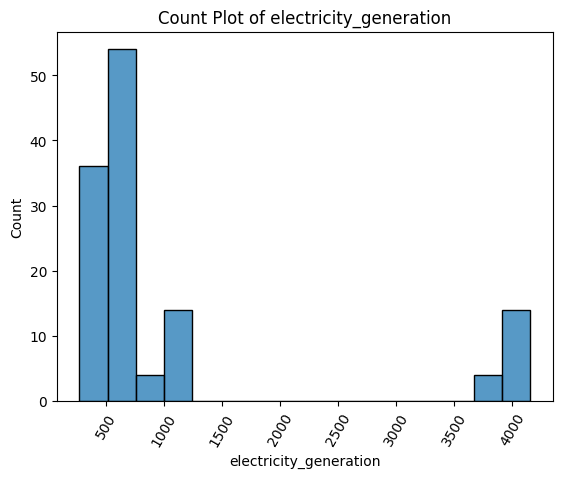

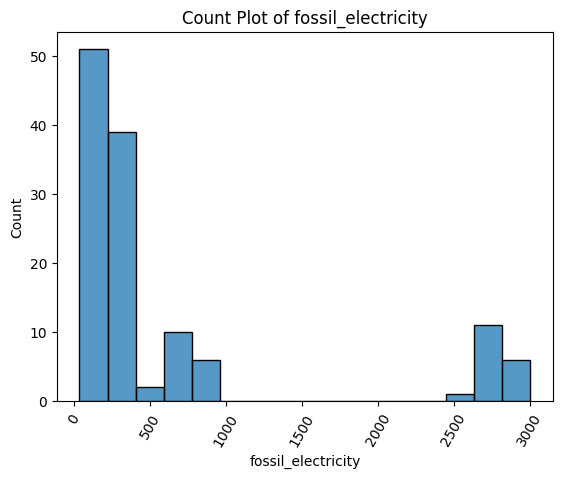

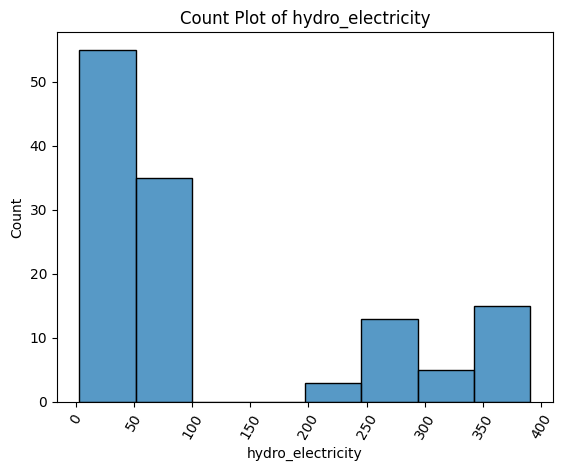

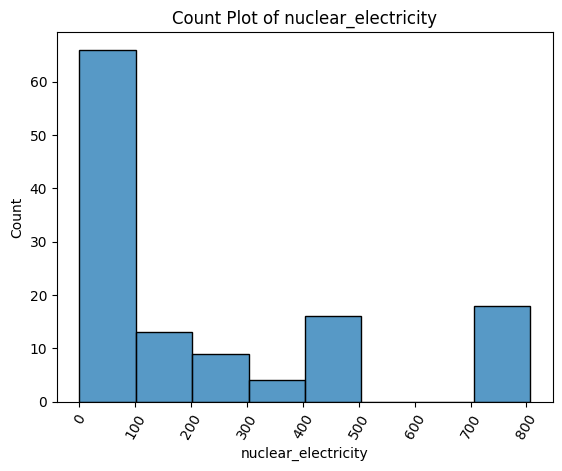

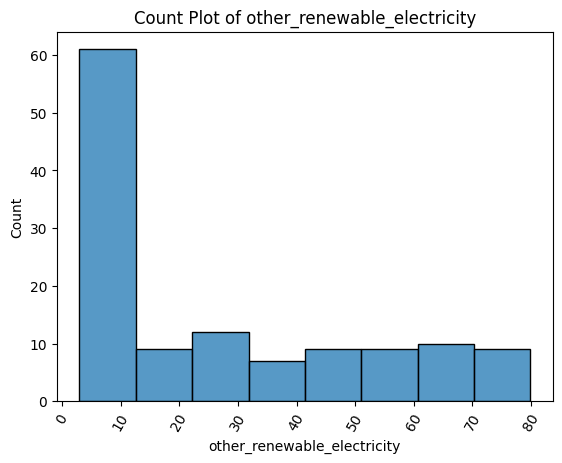

...

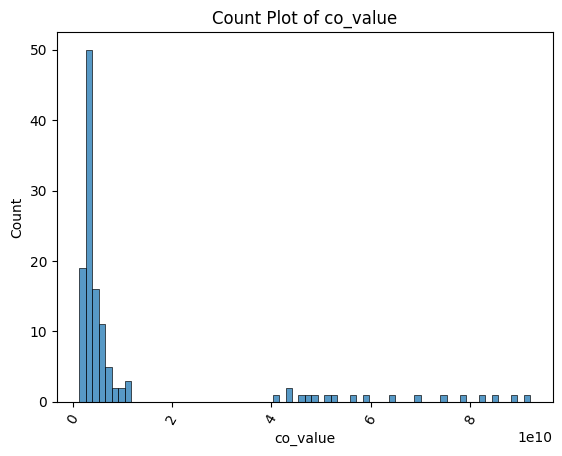

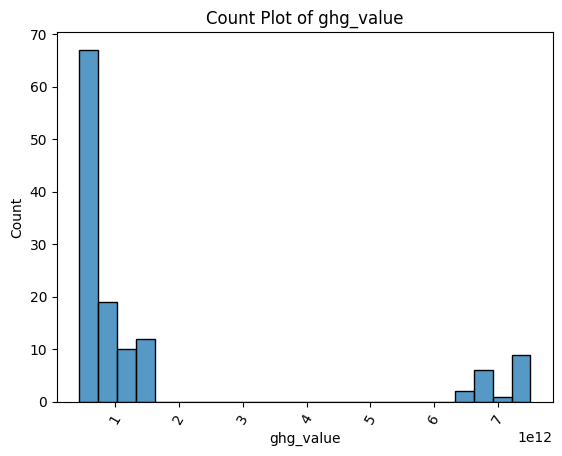

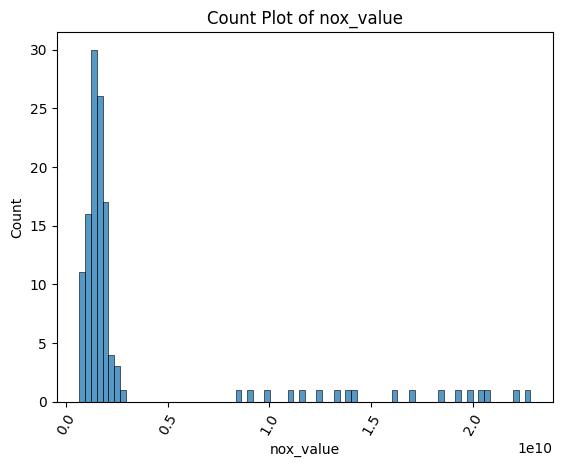

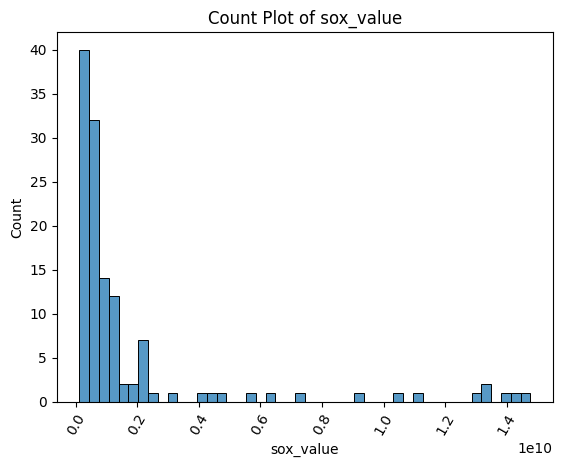

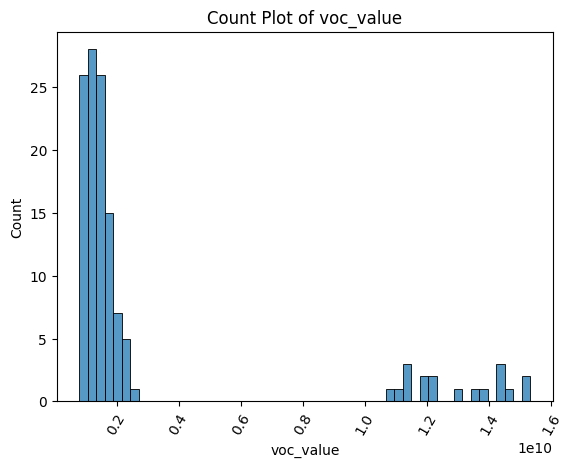

In [74]:
for col in df_project.columns[3:]:
    get_count_plot(df_project, col)

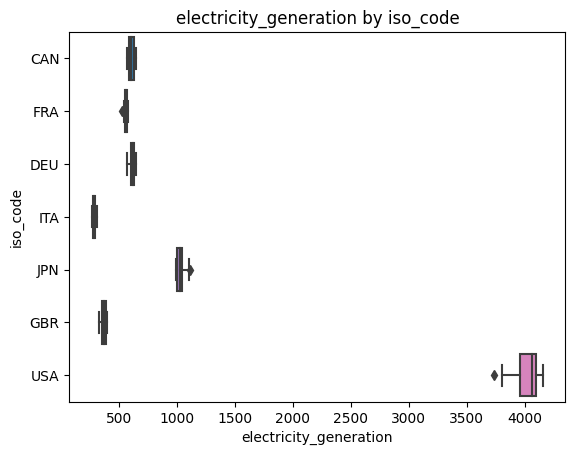

electricity_generation                                     \
                          count         mean         std       min   
iso_code                                                             
CAN                        18.0   608.185944   25.258254   572.362   
DEU                        18.0   617.237667   23.208105   571.940   
FRA                        18.0   561.021722   12.681405   530.712   
GBR                        18.0   370.373333   22.799247   333.231   
ITA                        18.0   290.387833   12.355258   269.155   
JPN                        18.0  1033.995500   39.122804   992.688   
USA                        18.0  4015.932611  121.574527  3736.644   

                                                       
                 25%        50%         75%       max  
iso_code                                               
CAN        586.45900   609.6780   631.19225   645.838  
DEU        604.95000   622.5500   634.27500   647.900  
FRA        556.75100   565.1750   568.81650   576.208  
GBR        356.76675   376.6470   389.66700   395.466  
ITA        282.06275   290.4520   297.54150   312.507  
JPN       1002.92400  1024.1900  1046.06575  1111.465  
USA       3955.38700  4061.4815  4098.97750  4156.745

************************************************************************


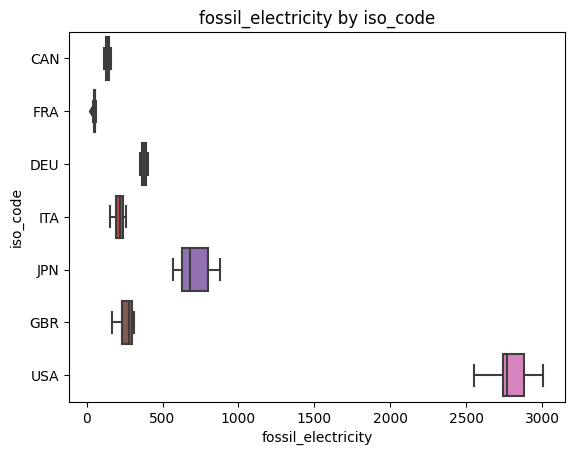

fossil_electricity                                                 \
                      count         mean         std       min         25%   
iso_code                                                                     
CAN                    18.0   138.359556   14.521553   112.996   125.86200   
DEU                    18.0   377.677778   14.029320   355.100   366.00000   
FRA                    18.0    54.302778    6.924615    35.569    51.65450   
GBR                    18.0   261.457444   47.460388   165.857   235.98750   
ITA                    18.0   216.271611   31.225245   156.760   193.14875   
JPN                    18.0   710.144167  104.868593   570.140   629.00475   
USA                    18.0  2789.663222  111.636239  2549.205  2739.10350   

                                           
                50%         75%       max  
iso_code                                   
CAN        136.0270   150.24175   160.520  
DEU        377.9500   389.32500   404.600  
FRA         56.4465    57.56225    65.101  
GBR        281.0335   296.69275   310.498  
ITA        218.2970   240.34800   259.486  
JPN        678.1080   802.60400   880.520  
USA       2768.3640  2881.92025  3004.469

************************************************************************


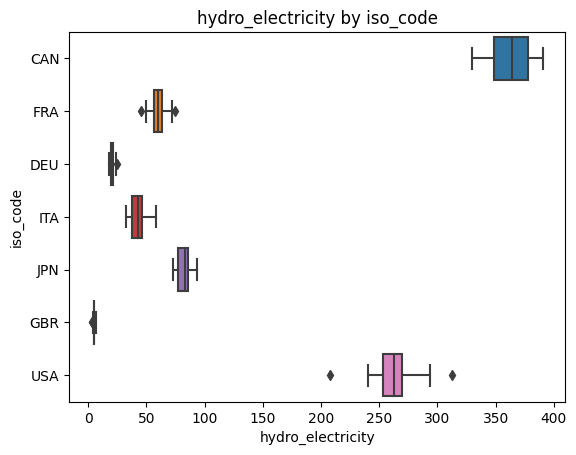

hydro_electricity                                             \
                     count        mean        std      min        25%   
iso_code                                                                
CAN                   18.0  362.615000  18.670486  329.986  348.23400   
DEU                   18.0   20.700000   1.987609   17.700   19.60000   
FRA                   18.0   59.774667   7.055965   45.745   56.47650   
GBR                   18.0    4.985333   0.783712    3.228    4.72275   
ITA                   18.0   43.359611   6.681731   32.815   37.62525   
JPN                   18.0   82.285500   5.823752   73.269   76.89175   
USA                   18.0  262.241222  22.106342  208.138  253.57025   

                                        
               50%        75%      max  
iso_code                                
CAN       364.4365  377.89525  390.641  
DEU        20.3000   21.65000   24.900  
FRA        59.6935   63.41900   74.267  
GBR         5.0815    5.37300    6.297  
ITA        42.3850   46.56325   58.545  
JPN        83.2430   85.92275   93.661  
USA       262.4445  269.73000  312.934

************************************************************************


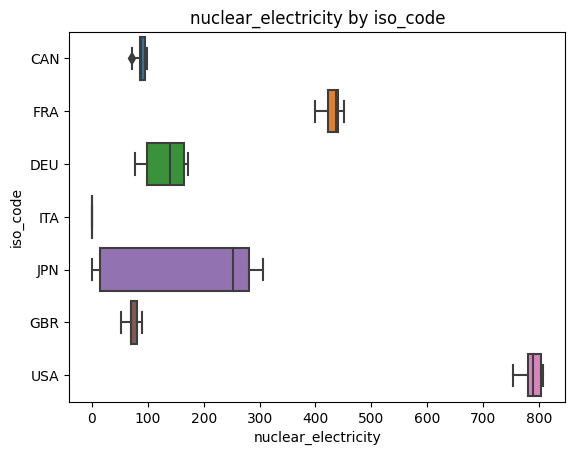

nuclear_electricity                                              \
                       count        mean         std      min        25%   
iso_code                                                                   
CAN                     18.0   86.473667    9.368678   69.159   85.22200   
DEU                     18.0  132.650000   34.320946   76.300   97.85000   
FRA                     18.0  430.466833   15.896778  398.359  421.72825   
GBR                     18.0   73.425444   10.328884   52.486   69.00950   
ITA                     18.0    0.000000    0.000000    0.000    0.00000   
JPN                     18.0  179.055667  127.792835    0.000   14.76775   
USA                     18.0  788.680222   16.239397  753.893  780.54450   

                                        
               50%        75%      max  
iso_code                                
CAN        88.2460   94.45725   98.588  
DEU       140.5500  165.02500  171.300  
FRA       436.6195  440.73500  451.529  
GBR        70.5060   81.21325   90.094  
ITA         0.0000    0.00000    0.000  
JPN       252.1535  280.31675  305.947  
USA       789.6100  803.42625  806.968

************************************************************************


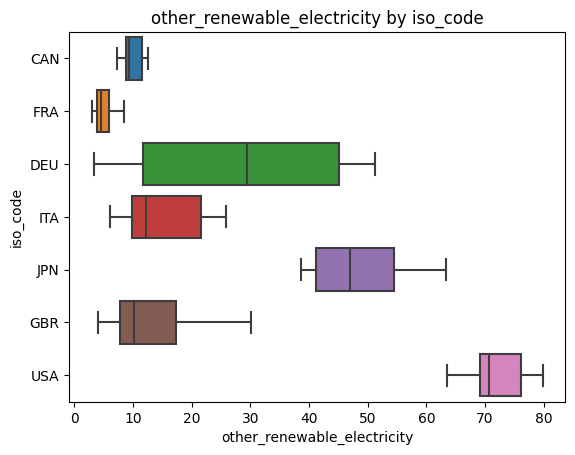

other_renewable_electricity                                          \
                               count       mean        std     min       25%   
iso_code                                                                       
CAN                             18.0   9.917444   1.629850   7.225   8.76600   
DEU                             18.0  28.472222  17.460672   3.400  11.70000   
FRA                             18.0   5.040611   1.643525   2.986   3.79675   
GBR                             18.0  13.510333   8.566549   3.936   7.79200   
ITA                             18.0  14.872611   7.124027   6.099   9.74325   
JPN                             18.0  48.143944   7.511317  38.562  41.19000   
USA                             18.0  72.242944   4.760347  63.489  69.08400   

                                     
              50%       75%     max  
iso_code                             
CAN        9.3080  11.56925  12.571  
DEU       29.4000  45.02500  51.200  
FRA        4.5070   5.97325   8.421  
GBR       10.1415  17.26425  30.028  
ITA       12.1920  21.57575  25.786  
JPN       47.0375  54.49850  63.374  
USA       70.7425  76.17950  79.866

************************************************************************


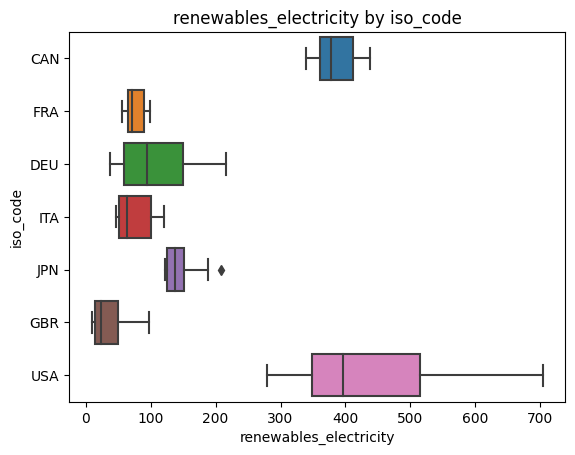

renewables_electricity                                              \
                          count        mean         std      min        25%   
iso_code                                                                      
CAN                        18.0  383.352611   30.216392  338.984  361.30150   
DEU                        18.0  106.909889   56.991427   37.840   59.00000   
FRA                        18.0   76.252167   13.991799   56.325   64.63225   
GBR                        18.0   35.490500   28.272335    9.549   14.83775   
ITA                        18.0   74.116278   26.784414   46.865   50.69525   
JPN                        18.0  144.795667   25.708876  121.830  125.06800   
USA                        18.0  437.589000  115.805015  278.906  347.80325   

                                        
               50%        75%      max  
iso_code                                
CAN       378.4485  410.93400  437.096  
DEU        95.0690  150.00000  216.500  
FRA        71.7420   90.17600   99.283  
GBR        23.5460   50.22275   97.038  
ITA        63.7090  100.96975  120.670  
JPN       137.6925  150.61750  208.350  
USA       396.1550  514.77300  704.106

************************************************************************


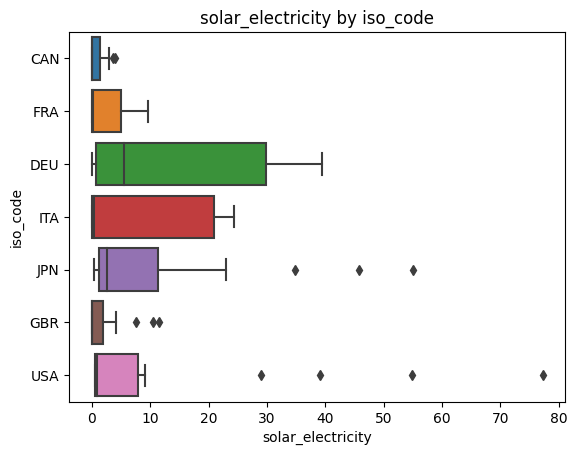

solar_electricity                                                \
                     count       mean        std    min      25%     50%   
iso_code                                                                   
CAN                   18.0   0.886944   1.334502  0.013  0.02125  0.0690   
DEU                   18.0  14.435556  15.927237  0.040  0.77500  5.5000   
FRA                   18.0   2.514167   3.485056  0.005  0.00875  0.1080   
GBR                   18.0   2.066722   3.774797  0.001  0.00500  0.0185   
ITA                   18.0   8.109333  10.475772  0.018  0.02950  0.4345   
JPN                   18.0  11.130722  16.986858  0.347  1.26500  2.5045   
USA                   18.0  12.367556  22.619383  0.493  0.55125  0.8775   

                            
               75%     max  
iso_code                    
CAN        1.33100   3.992  
DEU       29.85000  39.400  
FRA        5.00250   9.585  
GBR        1.84600  11.475  
ITA       20.90725  24.378  
JPN       11.31250  55.069  
USA        7.85875  77.276

************************************************************************


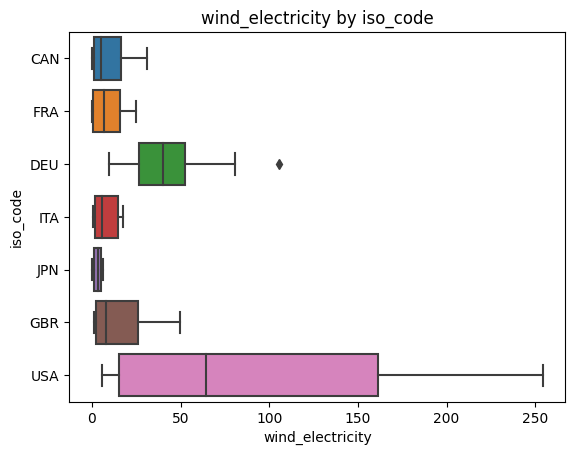

wind_electricity                                                  \
                    count       mean        std    min       25%      50%   
iso_code                                                                    
CAN                  18.0   9.933222  10.969653  0.264   1.08325   5.1735   
DEU                  18.0  43.302111  25.829113  9.500  26.55000  40.0190   
FRA                  18.0   8.922611   8.571470  0.048   0.68700   6.8030   
GBR                  18.0  14.928278  15.786613  0.947   2.17725   8.2015   
ITA                  18.0   7.774556   6.318724  0.563   1.97100   5.7020   
JPN                  18.0   3.235500   2.136838  0.109   1.42100   3.2810   
USA                  18.0  90.737500  84.022310  5.593  15.06075  64.6245   

                              
                75%      max  
iso_code                      
CAN        16.23425   31.198  
DEU        52.42500  105.700  
FRA        15.88975   24.609  
GBR        26.25950   49.633  
ITA        14.48475   17.742  
JPN         5.09975    6.490  
USA       161.08550  254.303

************************************************************************


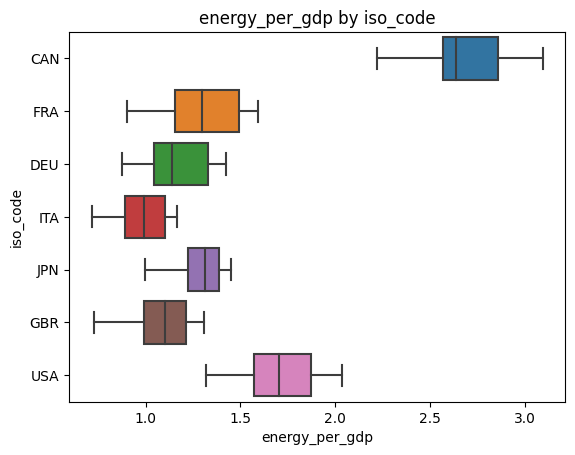

energy_per_gdp                                                       \
                  count      mean       std    min      25%     50%      75%   
iso_code                                                                       
CAN                18.0  2.694944  0.230419  2.220  2.56575  2.6360  2.85500   
DEU                18.0  1.165944  0.178166  0.873  1.04300  1.1380  1.33000   
FRA                18.0  1.303944  0.209843  0.903  1.15425  1.2965  1.49400   
GBR                18.0  1.083667  0.161869  0.729  0.98925  1.0995  1.21375   
ITA                18.0  0.987278  0.131432  0.717  0.89075  0.9920  1.10025   
JPN                18.0  1.292389  0.123158  0.997  1.22150  1.3140  1.38575   
USA                18.0  1.715500  0.192798  1.317  1.57250  1.7030  1.87000   

                 
            max  
iso_code         
CAN       3.094  
DEU       1.424  
FRA       1.590  
GBR       1.310  
ITA       1.167  
JPN       1.449  
USA       2.033

************************************************************************


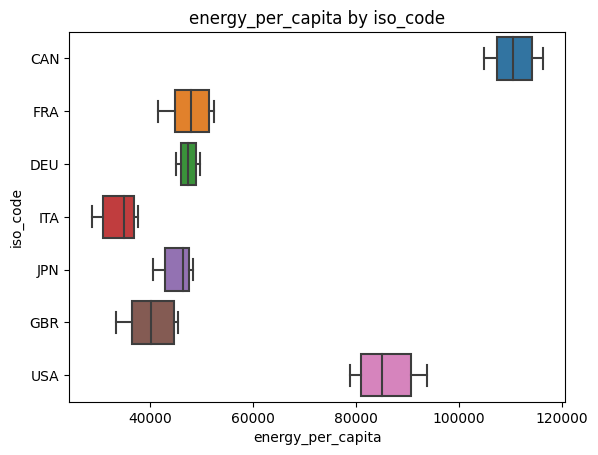

energy_per_capita                                          \
                     count           mean          std         min   
iso_code                                                             
CAN                   18.0  110585.225500  3605.143881  104834.380   
DEU                   18.0   47310.907889  1598.753173   44902.427   
FRA                   18.0   47474.319833  3847.905516   41553.881   
GBR                   18.0   39959.488833  4594.570929   33267.134   
ITA                   18.0   33966.666389  3276.414323   28650.492   
JPN                   18.0   45060.619333  2883.433844   40543.449   
USA                   18.0   85576.480667  5300.726671   78894.410   

                                                               
                   25%          50%           75%         max  
iso_code                                                       
CAN       107322.33150  110439.4715  114106.81950  116316.445  
DEU        45903.50200   47287.4840   48814.17050   49653.537  
FRA        44721.09700   47984.9010   51307.55650   52299.909  
GBR        36454.33450   40073.8885   44638.15850   45473.165  
ITA        30858.64350   34907.2325   36764.94725   37656.207  
JPN        42775.53600   46336.8835   47561.82300   48373.422  
USA        80918.20975   85081.3215   90651.02750   93810.546

************************************************************************


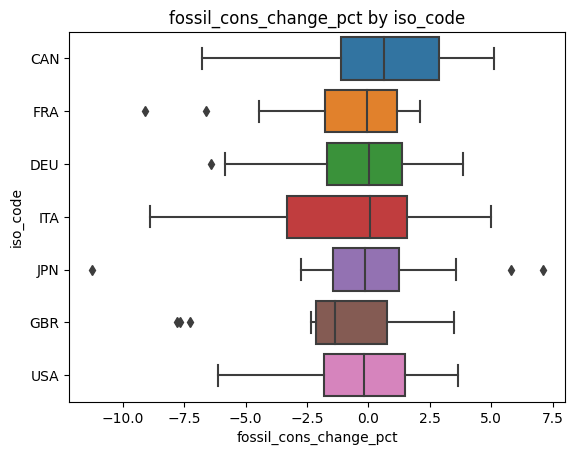

fossil_cons_change_pct                                               \
                          count      mean       std     min      25%     50%   
iso_code                                                                       
CAN                        18.0  0.677278  2.990592  -6.797 -1.13325  0.6370   
DEU                        18.0 -0.521167  2.933111  -6.431 -1.68225  0.0365   
FRA                        18.0 -0.952111  3.040121  -9.109 -1.75425 -0.0770   
GBR                        18.0 -1.451000  3.280195  -7.789 -2.14150 -1.3595   
ITA                        18.0 -1.132056  4.076372  -8.899 -3.31625  0.0715   
JPN                        18.0 -0.081444  3.893180 -11.258 -1.44200 -0.1335   
USA                        18.0 -0.291389  2.451697  -6.118 -1.79350 -0.1980   

                          
              75%    max  
iso_code                  
CAN       2.87450  5.113  
DEU       1.35125  3.846  
FRA       1.15050  2.096  
GBR       0.75925  3.468  
ITA       1.56375  5.003  
JPN       1.22550  7.099  
USA       1.50625  3.641

************************************************************************


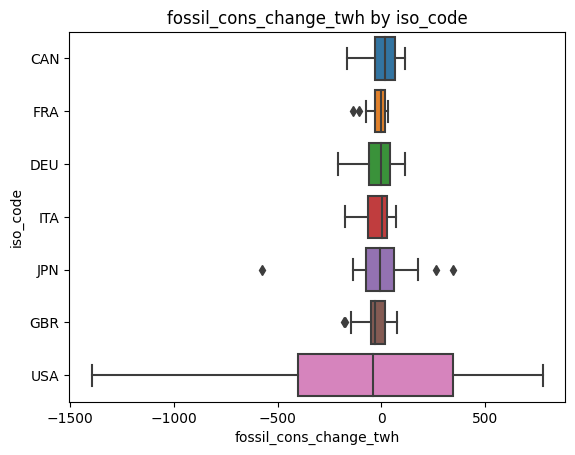

fossil_cons_change_twh                                              \
                          count       mean         std       min        25%   
iso_code                                                                      
CAN                        18.0  15.222000   71.935668  -166.647  -28.89050   
DEU                        18.0 -18.195667   93.257105  -207.452  -56.99750   
FRA                        18.0 -15.803389   47.197954  -136.777  -30.49500   
GBR                        18.0 -31.100778   73.050527  -179.710  -48.80525   
ITA                        18.0 -20.921333   70.573564  -172.844  -62.08925   
JPN                        18.0  -7.488667  193.280562  -575.105  -73.63825   
USA                        18.0 -70.412944  551.635870 -1394.278 -402.42425   

                                       
              50%        75%      max  
iso_code                               
CAN       16.0145   67.51550  116.840  
DEU        1.0765   44.24525  116.097  
FRA       -1.1260   16.87425   32.635  
GBR      -28.3440   18.26650   75.037  
ITA        1.3930   27.48050   72.766  
JPN       -6.5905   59.75575  344.585  
USA      -41.8365  345.69650  779.038

************************************************************************


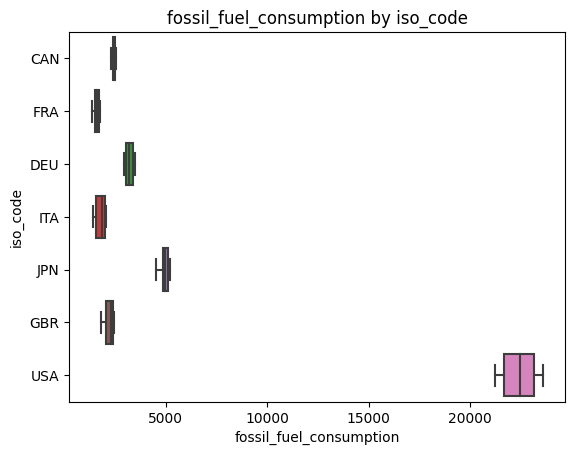

fossil_fuel_consumption                                       \
                           count          mean         std        min   
iso_code                                                                
CAN                         18.0   2444.596611   80.415832   2285.090   
DEU                         18.0   3199.908056  169.257791   2963.166   
FRA                         18.0   1595.736889  134.018568   1364.758   
GBR                         18.0   2194.432833  236.210339   1785.851   
ITA                         18.0   1797.725167  223.426735   1411.109   
JPN                         18.0   4959.285333  172.991708   4533.407   
USA                         18.0  22396.048722  850.900755  21197.905   

                                                           
                  25%         50%          75%        max  
iso_code                                                   
CAN        2391.26750   2448.3200   2505.63825   2568.967  
DEU        3054.95050   3180.7585   3365.26475   3460.384  
FRA        1501.08875   1635.8465   1717.58900   1742.590  
GBR        2042.64550   2291.3725   2395.12200   2442.832  
ITA        1566.68225   1873.4310   1989.23025   2052.189  
JPN        4856.09750   4980.9300   5105.12450   5198.311  
USA       21685.30600  22459.2575  23149.27025  23576.561

************************************************************************


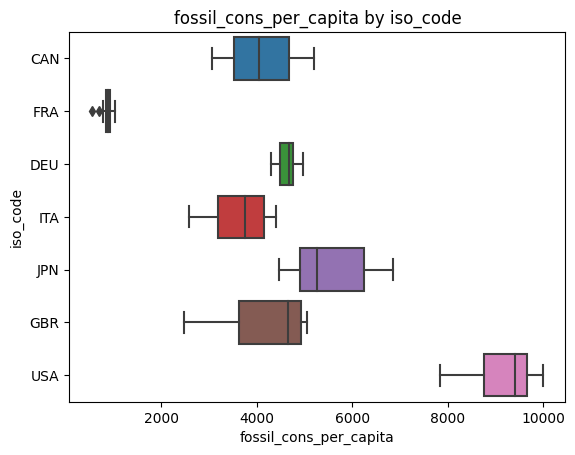

fossil_cons_per_capita                                     \
                          count         mean         std       min   
iso_code                                                             
CAN                        18.0  4157.785556  674.668331  3076.240   
DEU                        18.0  4638.037167  182.032909  4296.015   
FRA                        18.0   873.393167  112.450984   554.090   
GBR                        18.0  4213.599111  892.071458  2485.602   
ITA                        18.0  3677.526444  580.305800  2594.930   
JPN                        18.0  5540.690222  816.449365  4464.193   
USA                        18.0  9188.747389  607.456456  7841.657   

                                                       
                 25%        50%         75%       max  
iso_code                                               
CAN       3533.45550  4059.9840  4689.51875  5198.188  
DEU       4485.28100  4670.9595  4770.33925  4977.977  
FRA        839.37975   890.0770   937.38650  1036.584  
GBR       3638.29300  4660.0145  4928.87200  5048.485  
ITA       3194.56475  3767.3210  4154.49150  4416.940  
JPN       4904.17300  5275.4415  6254.94225  6862.226  
USA       8761.35650  9410.1535  9655.60550  9994.640

************************************************************************


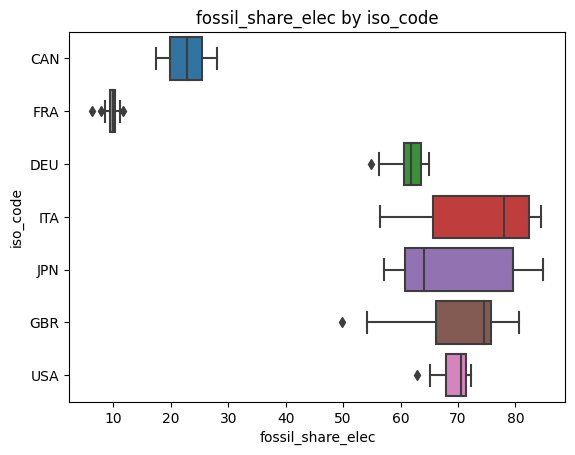

fossil_share_elec                                                   \
                     count       mean        std     min       25%      50%   
iso_code                                                                      
CAN                   18.0  22.863000   3.207186  17.513  19.93950  22.7470   
DEU                   18.0  61.255167   2.864991  54.808  60.61775  61.7780   
FRA                   18.0   9.679500   1.210438   6.284   9.47150   9.9405   
GBR                   18.0  70.098778   9.192638  49.772  66.13500  74.4405   
ITA                   18.0  74.381556   9.544405  56.504  65.66175  77.9345   
JPN                   18.0  68.731000  10.275646  57.190  60.83700  64.0200   
USA                   18.0  69.491722   2.641966  62.815  67.99350  70.5760   

                            
               75%     max  
iso_code                    
CAN       25.43200  28.045  
DEU       63.62125  65.039  
FRA       10.21625  11.707  
GBR       75.72475  80.684  
ITA       82.33925  84.468  
JPN       79.59475  84.774  
USA       71.38575  72.279

************************************************************************


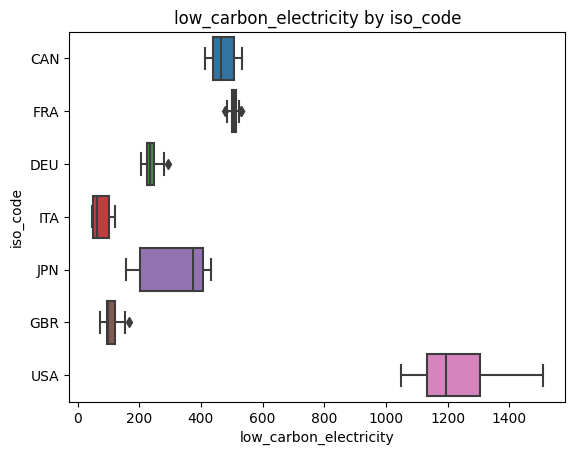

low_carbon_electricity                                     \
                          count         mean         std       min   
iso_code                                                             
CAN                        18.0   469.826278   38.087215   411.842   
DEU                        18.0   239.559889   24.763742   207.440   
FRA                        18.0   506.719000   13.437885   479.394   
GBR                        18.0   108.916000   26.013406    74.333   
ITA                        18.0    74.116278   26.784414    46.865   
JPN                        18.0   323.851333  107.790666   157.804   
USA                        18.0  1226.269444  124.350858  1047.733   

                                                       
                 25%        50%         75%       max  
iso_code                                               
CAN        438.08850   465.1095   507.14000   532.227  
DEU        225.07500   236.0000   248.65000   292.800  
FRA        501.27725   507.2855   512.44350   530.440  
GBR         94.18850    99.1390   120.77925   167.375  
ITA         50.69525    63.7090   100.96975   120.670  
JPN        202.96050   375.8055   405.76175   431.345  
USA       1131.91350  1196.4020  1304.08675  1509.056

************************************************************************


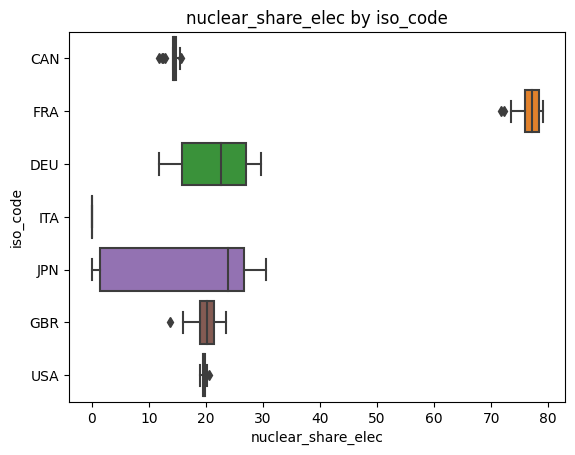

nuclear_share_elec                                                   \
                      count       mean        std     min       25%      50%   
iso_code                                                                       
CAN                    18.0  14.190444   1.119866  11.753  14.27350  14.4245   
DEU                    18.0  21.646722   6.097173  11.777  15.70050  22.6295   
FRA                    18.0  76.730611   2.283008  71.637  76.00600  77.2365   
GBR                    18.0  19.844889   2.576613  13.639  18.92550  20.1570   
ITA                    18.0   0.000000   0.000000   0.000   0.00000   0.0000   
JPN                    18.0  17.219611  12.350946   0.000   1.41525  23.8125   
USA                    18.0  19.647056   0.391384  19.006  19.40125  19.5670   

                            
               75%     max  
iso_code                    
CAN       14.79350  15.597  
DEU       27.09100  29.653  
FRA       78.41225  79.060  
GBR       21.34325  23.562  
ITA        0.00000   0.000  
JPN       26.70375  30.480  
USA       19.83325  20.575

************************************************************************


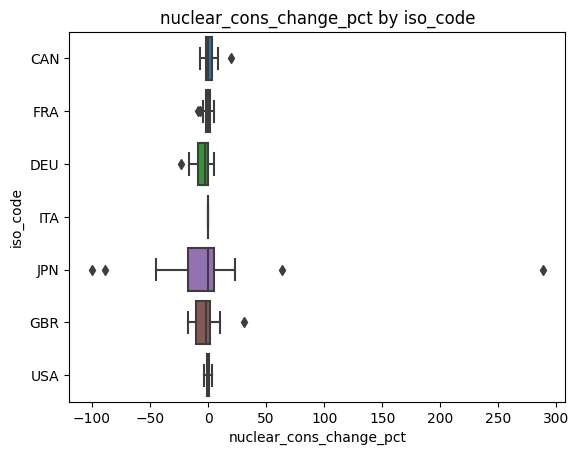

nuclear_cons_change_pct                                          \
                           count      mean        std      min       25%   
iso_code                                                                   
CAN                         18.0  1.367167   6.061422   -6.754  -1.34625   
DEU                         18.0 -4.628000   7.319817  -23.651  -8.41525   
FRA                         18.0 -0.463444   3.606600   -8.371  -1.58700   
GBR                         18.0 -1.642889  11.484398  -17.244 -10.34125   
ITA                         18.0  0.000000   0.000000    0.000   0.00000   
JPN                         18.0  5.166611  79.936089 -100.000 -17.07525   
USA                         18.0 -0.012444   1.874522   -3.232  -1.26275   

                                    
             50%      75%      max  
iso_code                            
CAN       0.3790  2.96975   19.920  
DEU      -2.8990  0.20100    5.208  
FRA      -0.1415  2.04700    5.306  
GBR      -1.4155  1.42975   30.838  
ITA       0.0000  0.00000    0.000  
JPN      -0.1040  5.14150  288.413  
USA       0.2160  1.19100    3.521

************************************************************************


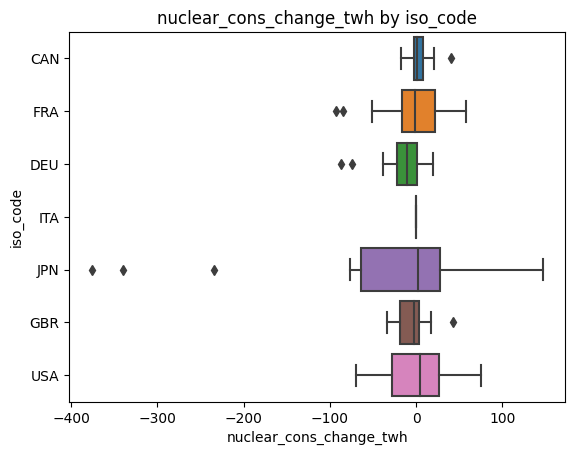

nuclear_cons_change_twh                                            \
                           count       mean         std      min       25%   
iso_code                                                                     
CAN                         18.0   2.709111   13.478671  -17.000  -2.88800   
DEU                         18.0 -15.634611   27.694414  -86.677 -21.71225   
FRA                         18.0  -5.512889   40.543244  -92.637 -16.35025   
GBR                         18.0  -4.912111   19.740825  -34.257 -19.07500   
ITA                         18.0   0.000000    0.000000    0.000   0.00000   
JPN                         18.0 -44.917944  136.819329 -375.879 -63.52600   
USA                         18.0  -0.617278   40.888814  -69.658 -28.20950   

                                      
              50%       75%      max  
iso_code                              
CAN        0.9125   7.62650   40.360  
DEU      -10.3955   0.94600   19.441  
FRA       -1.5230  22.48750   58.106  
GBR       -2.5555   2.88450   42.725  
ITA        0.0000   0.00000    0.000  
JPN        1.6970  27.45175  147.026  
USA        4.7655  26.30675   74.967

************************************************************************


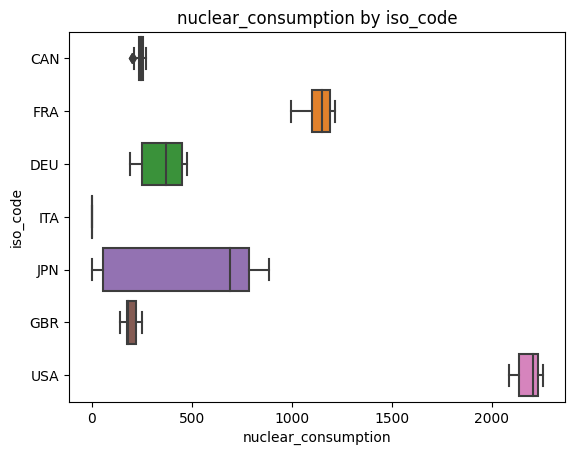

nuclear_consumption                                                 \
                       count         mean         std       min         25%   
iso_code                                                                      
CAN                     18.0   239.668778   21.341771   200.816   234.71500   
DEU                     18.0   352.127611  100.861077   190.811   250.86075   
FRA                     18.0  1134.457500   64.985841   995.891  1098.45550   
GBR                     18.0   193.985167   32.333256   138.550   176.36975   
ITA                     18.0     0.000000    0.000000     0.000     0.00000   
JPN                     18.0   508.776833  360.255852     0.000    52.92775   
USA                     18.0  2186.032667   54.010006  2085.908  2133.46925   

                                           
                50%         75%       max  
iso_code                                   
CAN        244.4150   252.90125   271.121  
DEU        369.8875   449.09625   472.758  
FRA       1149.8310  1190.18525  1214.557  
GBR        181.0230   218.79675   248.633  
ITA          0.0000     0.00000     0.000  
JPN        692.5385   784.63725   886.450  
USA       2205.2160  2228.81300  2254.808

************************************************************************


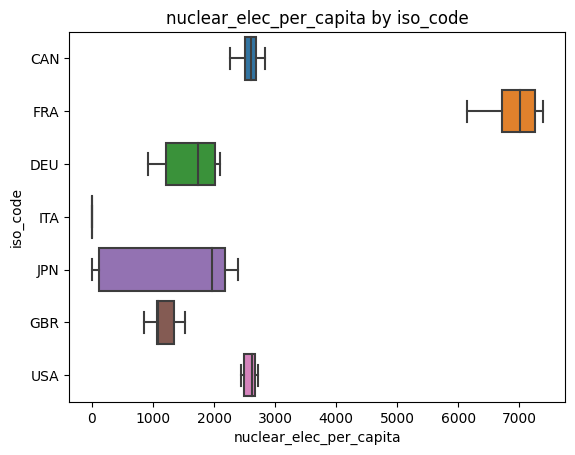

nuclear_elec_per_capita                                     \
                           count         mean         std       min   
iso_code                                                              
CAN                         18.0  2570.351444  174.994308  2259.496   
DEU                         18.0  1629.488056  422.514822   923.081   
FRA                         18.0  6925.770222  375.092575  6143.441   
GBR                         18.0  1180.577778  206.145656   844.573   
ITA                         18.0     0.000000    0.000000     0.000   
JPN                         18.0  1396.642611  997.241515     0.000   
USA                         18.0  2595.241500   91.367159  2449.756   

                                                       
                 25%        50%         75%       max  
iso_code                                               
CAN       2508.53700  2609.4265  2693.76225  2840.950  
DEU       1206.19625  1734.0765  2022.50725  2103.027  
FRA       6716.11450  7016.1135  7254.34400  7387.582  
GBR       1057.59350  1088.8280  1349.38775  1523.814  
ITA          0.00000     0.0000     0.00000     0.000  
JPN        115.06175  1961.5610  2184.44650  2399.133  
USA       2496.09300  2623.3440  2671.21475  2715.354

************************************************************************


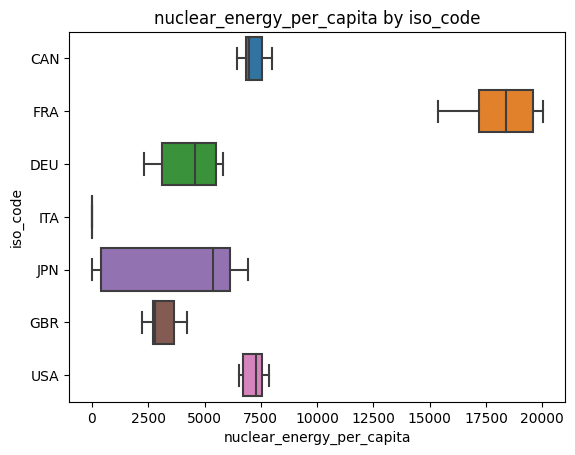

nuclear_energy_per_capita                                        \
                             count          mean          std        min   
iso_code                                                                   
CAN                           18.0   7134.730222   443.937328   6434.675   
DEU                           18.0   4325.607667  1240.564373   2308.441   
FRA                           18.0  18269.253222  1503.120174  15358.490   
GBR                           18.0   3123.373222   637.607264   2229.457   
ITA                           18.0      0.000000     0.000000      0.000   
JPN                           18.0   3968.888167  2812.030152      0.000   
USA                           18.0   7203.613444   478.295908   6516.112   

                                                           
                  25%         50%          75%        max  
iso_code                                                   
CAN        6853.42250   6967.5860   7534.81350   7991.942  
DEU        3092.36700   4563.4695   5505.07350   5803.984  
FRA       17199.84575  18390.3925  19567.36200  20025.228  
GBR        2706.69900   2801.3285   3635.41225   4205.274  
ITA           0.00000      0.0000      0.00000      0.000  
JPN         413.15225   5387.4200   6115.84125   6951.237  
USA        6706.04275   7291.8400   7544.32925   7847.405

************************************************************************


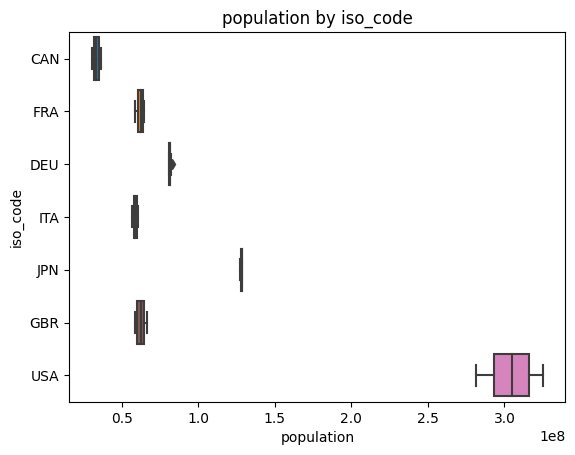

population                                                        \
              count          mean           std          min          25%   
iso_code                                                                    
CAN            18.0  3.357650e+07  1.988459e+06   30588000.0   31902250.0   
DEU            18.0  8.143822e+07  4.694759e+05   80827000.0   81093000.0   
FRA            18.0  6.222889e+07  1.880114e+06   59015000.0   60803500.0   
GBR            18.0  6.253578e+07  2.705718e+06   58923000.0   59976750.0   
ITA            18.0  5.895267e+07  1.321971e+06   56692000.0   58031250.0   
JPN            18.0  1.281627e+08  3.572012e+05  127503000.0  127916000.0   
USA            18.0  3.043120e+08  1.386548e+07  281711008.0  293014752.0   

                                                 
                  50%          75%          max  
iso_code                                         
CAN        33542000.0   35203250.0   36732000.0  
DEU        81452000.0   81611250.0   82658000.0  
FRA        62376000.0   63811500.0   64843000.0  
GBR        62487000.0   64869250.0   66727000.0  
ITA        59014000.0   60095000.0   60674000.0  
JPN       128259000.0  128476500.0  128555000.0  
USA       304897008.0  315811744.0  325084992.0

************************************************************************


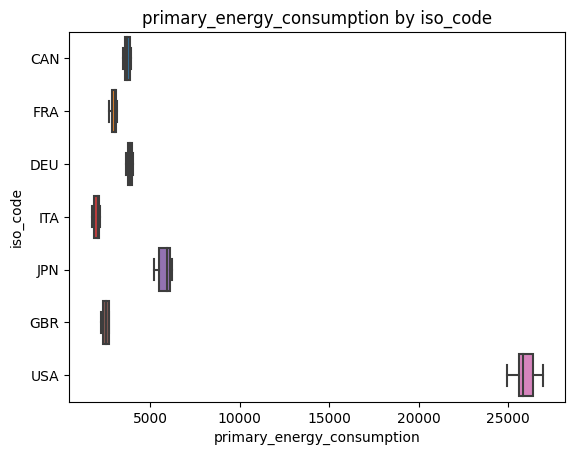

primary_energy_consumption                                       \
                              count          mean         std        min   
iso_code                                                                   
CAN                            18.0   3707.520778  139.290938   3471.460   
DEU                            18.0   3852.969833  133.616544   3653.974   
FRA                            18.0   2947.667222  156.045584   2694.478   
GBR                            18.0   2487.301833  183.448226   2219.816   
ITA                            18.0   1998.776389  156.053268   1730.776   
JPN                            18.0   5775.214222  371.554418   5179.953   
USA                            18.0  25975.586111  590.925320  24913.288   

                                                           
                  25%         50%          75%        max  
iso_code                                                   
CAN        3598.79300   3706.7460   3836.84450   3919.304  
DEU        3737.45425   3843.6145   3980.96275   4044.479  
FRA        2841.23850   2996.6770   3085.71700   3132.569  
GBR        2351.50825   2516.1160   2663.84500   2708.794  
ITA        1854.36000   2049.3610   2126.04775   2184.417  
JPN        5491.28200   5948.6175   6091.79450   6207.568  
USA       25585.81500  25837.0705  26390.09625  26943.482

************************************************************************


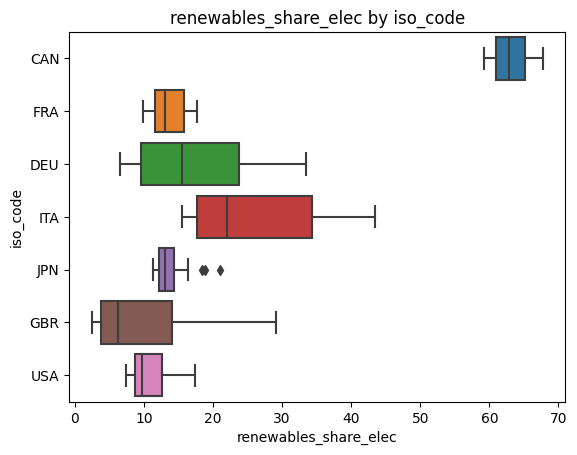

renewables_share_elec                                         \
                         count       mean       std     min       25%   
iso_code                                                                
CAN                       18.0  62.946333  2.494630  59.225  60.90575   
DEU                       18.0  17.098167  8.708963   6.616   9.62275   
FRA                       18.0  13.589833  2.443989   9.861  11.60475   
GBR                       18.0  10.056333  8.673053   2.497   3.78050   
ITA                       18.0  25.618444  9.544405  15.532  17.66075   
JPN                       18.0  14.049389  2.763609  11.353  12.26550   
USA                       18.0  10.861056  2.719692   7.464   8.73800   

                                     
              50%       75%     max  
iso_code                             
CAN       62.7735  65.12500  67.743  
DEU       15.5290  23.78950  33.416  
FRA       13.0515  15.75875  17.720  
GBR        6.2220  14.08775  29.120  
ITA       22.0655  34.33825  43.496  
JPN       13.0645  14.32900  20.988  
USA        9.7780  12.63450  17.350

************************************************************************


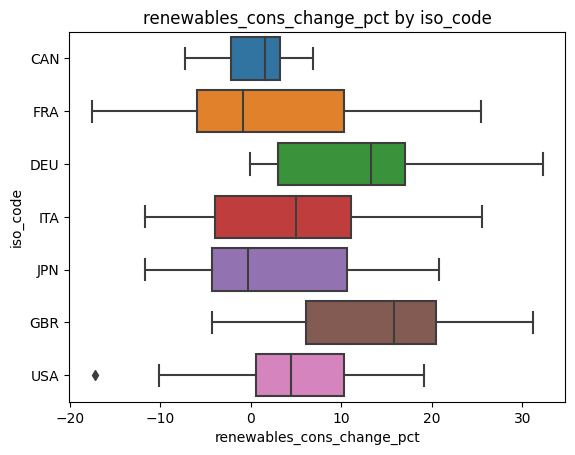

renewables_cons_change_pct                                         \
                              count       mean        std     min      25%   
iso_code                                                                     
CAN                            18.0   0.808333   3.817687  -7.278 -2.20500   
DEU                            18.0  11.598111   9.288077  -0.105  3.03800   
FRA                            18.0   1.770167  11.741808 -17.551 -5.90200   
GBR                            18.0  13.922667  10.772413  -4.326  6.06625   
ITA                            18.0   4.198667  11.263765 -11.671 -4.00550   
JPN                            18.0   2.454167   9.372196 -11.655 -4.27975   
USA                            18.0   4.253167   9.173563 -17.253  0.53650   

                                     
              50%       75%     max  
iso_code                             
CAN        1.5805   3.23450   6.873  
DEU       13.2590  17.10050  32.286  
FRA       -0.8100  10.28275  25.456  
GBR       15.8780  20.47075  31.241  
ITA        5.0165  11.10925  25.506  
JPN       -0.3425  10.59775  20.816  
USA        4.4250  10.35650  19.130

************************************************************************


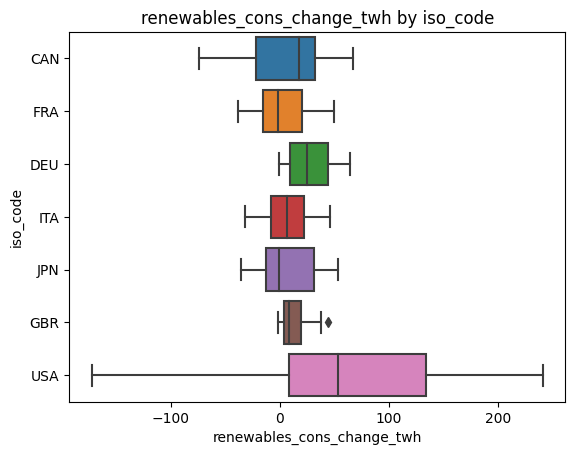

renewables_cons_change_twh                                            \
                              count       mean         std      min       25%   
iso_code                                                                        
CAN                            18.0   7.748444   37.998144  -73.982 -22.24875   
DEU                            18.0  27.140111   20.840858   -0.533   9.63850   
FRA                            18.0   2.647833   24.645392  -38.309 -15.06575   
GBR                            18.0  12.856500   14.063695   -1.427   4.02625   
ITA                            18.0   7.125889   20.914628  -32.290  -7.82625   
JPN                            18.0   6.860167   28.335390  -35.661 -12.88475   
USA                            18.0  60.284944  111.091250 -172.330   8.66575   

                                       
              50%        75%      max  
iso_code                               
CAN       17.3425   32.35575   67.094  
DEU       24.9170   44.41225   64.398  
FRA       -1.4785   20.07725   49.422  
GBR        8.5500   19.77400   43.965  
ITA        6.9730   21.70700   46.406  
JPN       -0.9515   31.46050   53.117  
USA       53.0485  134.36750  241.208

************************************************************************


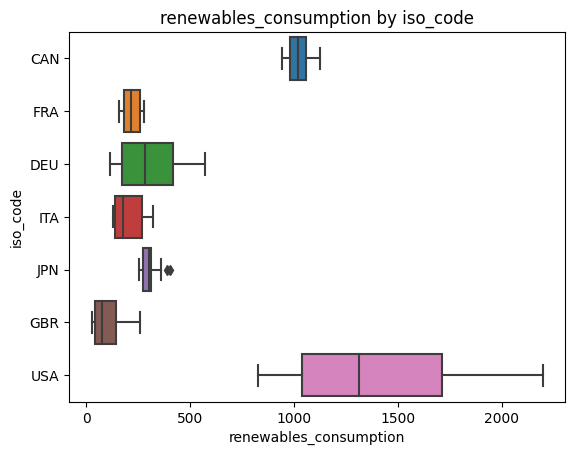

renewables_consumption                                                \
                          count         mean         std      min         25%   
iso_code                                                                        
CAN                        18.0  1023.255278   55.609301  942.567   980.73050   
DEU                        18.0   300.934167  149.161181  111.337   170.13875   
FRA                        18.0   217.472889   39.160401  158.155   182.80250   
GBR                        18.0    98.883944   75.350065   26.349    40.46475   
ITA                        18.0   201.051278   69.352784  127.680   138.47550   
JPN                        18.0   305.433833   41.946241  255.170   272.61975   
USA                        18.0  1393.504722  401.630232  826.501  1038.55125   

                                           
                50%         75%       max  
iso_code                                   
CAN       1017.2465  1057.49775  1123.138  
DEU        279.8350   417.57925   572.716  
FRA        214.5890   255.28775   278.372  
GBR         72.4585   140.48575   258.123  
ITA        178.0860   266.87650   319.667  
JPN        299.2305   308.55025   402.741  
USA       1312.8250  1713.82275  2197.375

************************************************************************


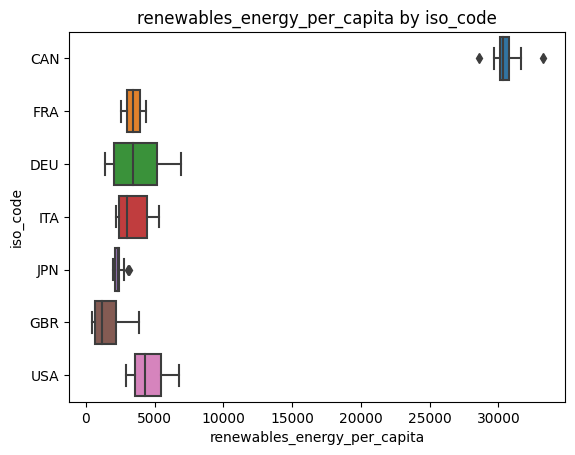

renewables_energy_per_capita                                        \
                                count          mean          std        min   
iso_code                                                                      
CAN                              18.0  30497.290778   954.815807  28588.883   
DEU                              18.0   3692.238889  1816.935195   1366.874   
FRA                              18.0   3483.863722   547.077538   2587.616   
GBR                              18.0   1538.295833  1115.178976    445.657   
ITA                              18.0   3390.087000  1102.851323   2191.060   
JPN                              18.0   2383.581333   331.022482   1984.910   
USA                              18.0   4533.596222  1108.561224   2904.000   

                                                           
                  25%         50%          75%        max  
iso_code                                                   
CAN       30104.09725  30317.5890  30783.94250  33233.606  
DEU        2084.16150   3455.5085   5147.34650   6928.746  
FRA        3024.70600   3464.2375   3967.75575   4356.782  
GBR         674.50625   1159.1425   2165.04950   3868.351  
ITA        2385.07700   3017.2620   4412.48525   5291.623  
JPN        2132.02950   2331.3830   2403.58325   3158.677  
USA        3563.79750   4304.9085   5437.11000   6759.386

************************************************************************


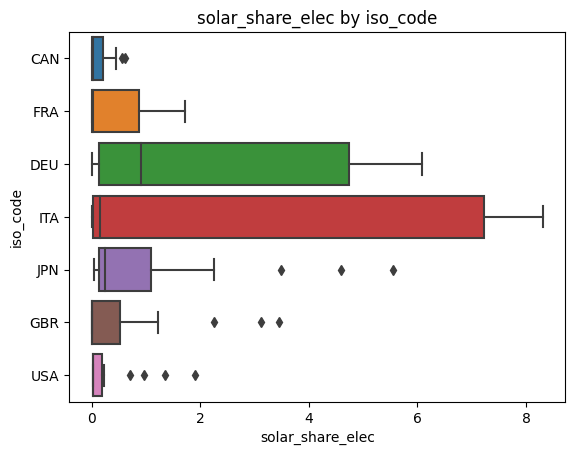

solar_share_elec                                              \
                    count      mean       std    min      25%     50%   
iso_code                                                                
CAN                  18.0  0.139056  0.207009  0.002  0.00400  0.0115   
DEU                  18.0  2.283778  2.496678  0.007  0.12625  0.9045   
FRA                  18.0  0.444944  0.619055  0.001  0.00125  0.0200   
GBR                  18.0  0.613778  1.130275  0.000  0.00125  0.0045   
ITA                  18.0  2.817167  3.656221  0.007  0.01000  0.1485   
JPN                  18.0  1.103056  1.710100  0.034  0.12200  0.2465   
USA                  18.0  0.303333  0.555072  0.012  0.01400  0.0220   

                          
              75%    max  
iso_code                  
CAN       0.20950  0.618  
DEU       4.73275  6.081  
FRA       0.87100  1.724  
GBR       0.51825  3.444  
ITA       7.23050  8.311  
JPN       1.08275  5.547  
USA       0.19325  1.904

************************************************************************


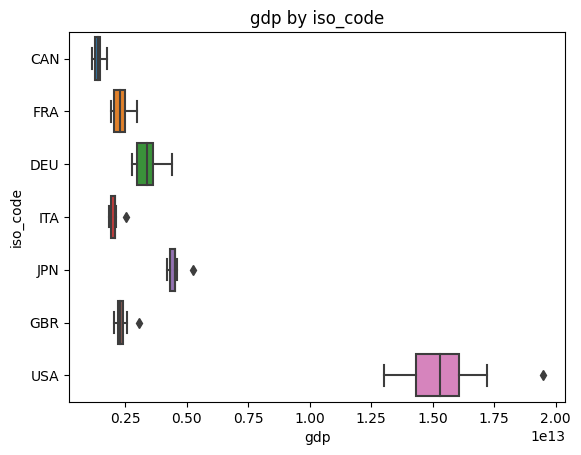

gdp                                                          \
         count          mean           std           min           25%   
iso_code                                                                 
CAN       18.0  1.388654e+12  1.644179e+11  1.150000e+12  1.275000e+12   
DEU       18.0  3.365929e+12  4.398489e+11  2.790000e+12  2.987500e+12   
FRA       18.0  2.301278e+12  2.732241e+11  1.930000e+12  2.065000e+12   
GBR       18.0  2.325866e+12  2.359523e+11  2.030000e+12  2.195000e+12   
ITA       18.0  2.041510e+12  1.529252e+11  1.860000e+12  1.917500e+12   
JPN       18.0  4.485125e+12  2.333074e+11  4.210000e+12  4.330000e+12   
USA       18.0  1.530985e+13  1.619157e+12  1.300000e+13  1.432500e+13   

                                                    
                   50%           75%           max  
iso_code                                            
CAN       1.395000e+12  1.475000e+12  1.765763e+12  
DEU       3.370000e+12  3.620000e+12  4.386729e+12  
FRA       2.295000e+12  2.477500e+12  2.983011e+12  
GBR       2.290000e+12  2.407500e+12  3.045582e+12  
ITA       2.070000e+12  2.090000e+12  2.517184e+12  
JPN       4.505000e+12  4.542500e+12  5.262255e+12  
USA       1.530000e+13  1.605000e+13  1.947734e+13

************************************************************************


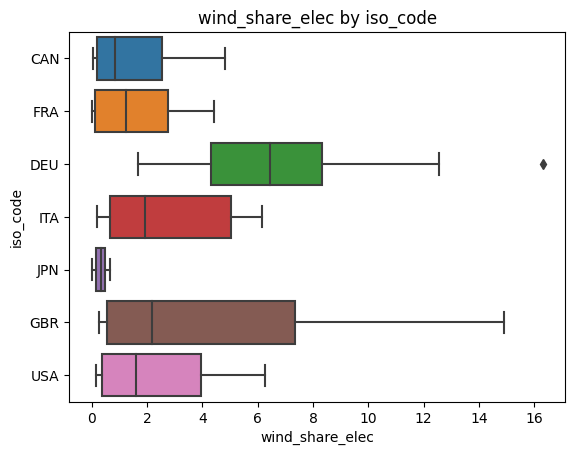

wind_share_elec                                                       \
                   count      mean       std    min      25%     50%      75%   
iso_code                                                                        
CAN                 18.0  1.574611  1.699364  0.045  0.18375  0.8575  2.55225   
DEU                 18.0  6.908167  3.947708  1.661  4.33025  6.4490  8.31550   
FRA                 18.0  1.582444  1.519524  0.009  0.12100  1.2460  2.76850   
GBR                 18.0  4.291722  4.745437  0.252  0.55475  2.1695  7.36725   
ITA                 18.0  2.678667  2.206887  0.209  0.66750  1.9155  5.02225   
JPN                 18.0  0.313389  0.211280  0.011  0.13725  0.3235  0.48875   
USA                 18.0  2.227944  2.056467  0.147  0.37675  1.6070  3.96575   

                  
             max  
iso_code          
CAN        4.835  
DEU       16.314  
FRA        4.426  
GBR       14.894  
ITA        6.159  
JPN        0.654  
USA        6.266

************************************************************************


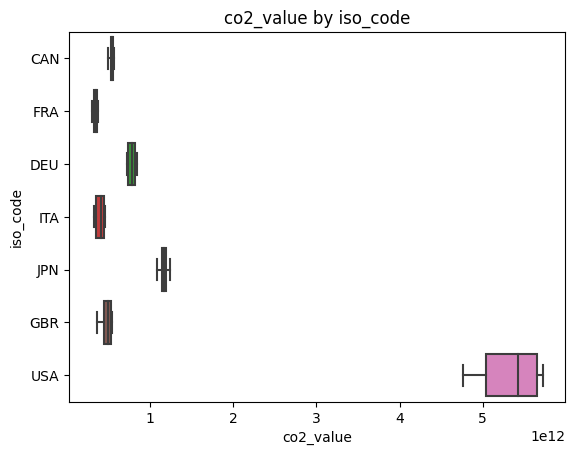

co2_value                                                          \
             count          mean           std           min           25%   
iso_code                                                                     
CAN           18.0  5.340354e+11  1.822389e+10  4.960242e+11  5.261459e+11   
DEU           18.0  7.755435e+11  4.185375e+10  7.191159e+11  7.334068e+11   
FRA           18.0  3.410300e+11  2.451247e+10  2.989078e+11  3.269734e+11   
GBR           18.0  4.756140e+11  6.005453e+10  3.599192e+11  4.411033e+11   
ITA           18.0  3.946215e+11  5.029717e+10  3.190965e+11  3.449500e+11   
JPN           18.0  1.165189e+12  3.926732e+10  1.076745e+12  1.139332e+12   
USA           18.0  5.321888e+12  3.483888e+11  4.759788e+12  5.036936e+12   

                                                    
                   50%           75%           max  
iso_code                                            
CAN       5.380801e+11  5.478423e+11  5.601001e+11  
DEU       7.759273e+11  8.140916e+11  8.399692e+11  
FRA       3.435034e+11  3.632108e+11  3.701950e+11  
GBR       4.925816e+11  5.291840e+11  5.355639e+11  
ITA       4.058687e+11  4.381168e+11  4.566085e+11  
JPN       1.168144e+12  1.187427e+12  1.241011e+12  
USA       5.424637e+12  5.659152e+12  5.725075e+12

************************************************************************


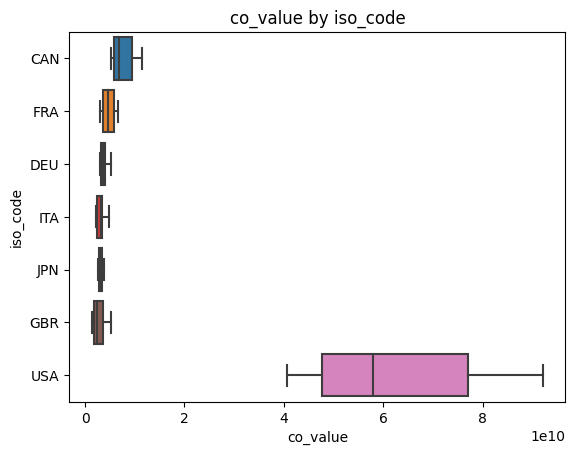

co_value                                                          \
            count          mean           std           min           25%   
iso_code                                                                    
CAN          18.0  7.669683e+09  2.191799e+09  5.241574e+09  5.922156e+09   
DEU          18.0  3.710212e+09  6.764310e+08  2.963152e+09  3.165256e+09   
FRA          18.0  4.671294e+09  1.286916e+09  3.019514e+09  3.603716e+09   
GBR          18.0  2.717574e+09  1.208598e+09  1.394759e+09  1.717326e+09   
ITA          18.0  3.135631e+09  7.650738e+08  2.187533e+09  2.430074e+09   
JPN          18.0  3.065493e+09  3.508822e+08  2.621594e+09  2.734504e+09   
USA          18.0  6.232594e+10  1.716321e+10  4.068281e+10  4.771969e+10   

                                                    
                   50%           75%           max  
iso_code                                            
CAN       6.842658e+09  9.428659e+09  1.150037e+10  
DEU       3.638223e+09  4.021874e+09  5.125312e+09  
FRA       4.706166e+09  5.924499e+09  6.704562e+09  
GBR       2.316537e+09  3.514085e+09  5.165191e+09  
ITA       3.189966e+09  3.470597e+09  4.724373e+09  
JPN       2.958980e+09  3.336020e+09  3.764240e+09  
USA       5.787399e+10  7.695044e+10  9.208286e+10

************************************************************************


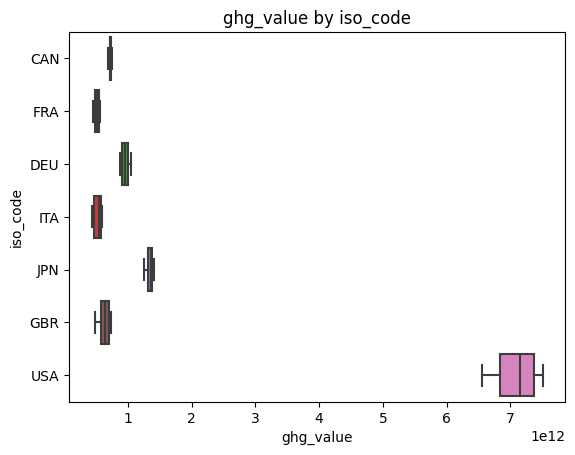

ghg_value                                                          \
             count          mean           std           min           25%   
iso_code                                                                     
CAN           18.0  7.197104e+11  1.398924e+10  6.895605e+11  7.115362e+11   
DEU           18.0  9.572119e+11  5.853037e+10  8.816196e+11  9.008187e+11   
FRA           18.0  5.133425e+11  3.704701e+10  4.567788e+11  4.866736e+11   
GBR           18.0  6.257427e+11  8.573952e+10  4.768765e+11  5.707005e+11   
ITA           18.0  5.249391e+11  5.972816e+10  4.353949e+11  4.653597e+11   
JPN           18.0  1.346930e+12  4.263217e+10  1.246515e+12  1.318008e+12   
USA           18.0  7.084416e+12  3.308851e+11  6.561940e+12  6.840961e+12   

                                                    
                   50%           75%           max  
iso_code                                            
CAN       7.198263e+11  7.294274e+11  7.480609e+11  
DEU       9.491876e+11  1.005721e+12  1.054903e+12  
FRA       5.195988e+11  5.486020e+11  5.542613e+11  
GBR       6.372327e+11  7.042899e+11  7.270901e+11  
ITA       5.417241e+11  5.760454e+11  5.941727e+11  
JPN       1.356302e+12  1.376434e+12  1.405375e+12  
USA       7.155913e+12  7.365123e+12  7.511501e+12

************************************************************************


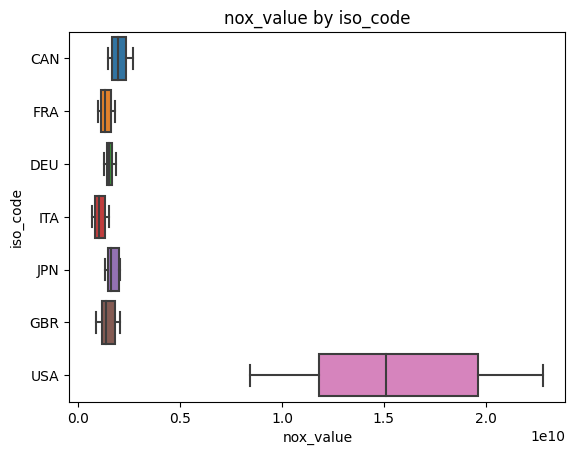

nox_value                                                          \
             count          mean           std           min           25%   
iso_code                                                                     
CAN           18.0  2.012814e+09  4.047569e+08  1.468392e+09  1.660049e+09   
DEU           18.0  1.533093e+09  1.719777e+08  1.267958e+09  1.425113e+09   
FRA           18.0  1.355083e+09  2.898165e+08  9.478703e+08  1.130730e+09   
GBR           18.0  1.453547e+09  3.952961e+08  8.823635e+08  1.140927e+09   
ITA           18.0  1.065577e+09  2.897063e+08  6.691451e+08  8.003611e+08   
JPN           18.0  1.692617e+09  2.788764e+08  1.310855e+09  1.435039e+09   
USA           18.0  1.556656e+10  4.660802e+09  8.454801e+09  1.182621e+10   

                                                    
                   50%           75%           max  
iso_code                                            
CAN       1.956979e+09  2.335998e+09  2.705929e+09  
DEU       1.485702e+09  1.648935e+09  1.859953e+09  
FRA       1.308325e+09  1.616539e+09  1.809416e+09  
GBR       1.378109e+09  1.802317e+09  2.055124e+09  
ITA       1.008968e+09  1.331154e+09  1.502588e+09  
JPN       1.628295e+09  1.975341e+09  2.062535e+09  
USA       1.512649e+10  1.964409e+10  2.281357e+10

************************************************************************


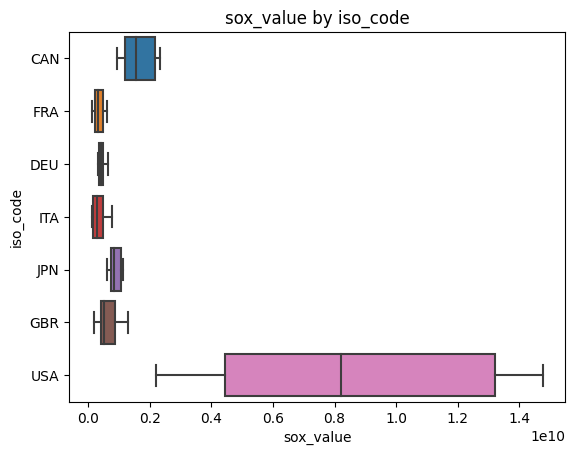

sox_value                                                          \
             count          mean           std           min           25%   
iso_code                                                                     
CAN           18.0  1.628206e+09  5.151513e+08  9.478738e+08  1.180897e+09   
DEU           18.0  4.381546e+08  1.024713e+08  3.010368e+08  3.597704e+08   
FRA           18.0  3.361973e+08  1.608461e+08  1.261419e+08  2.031616e+08   
GBR           18.0  6.422309e+08  3.511131e+08  1.885449e+08  4.190585e+08   
ITA           18.0  3.355639e+08  2.086038e+08  1.189245e+08  1.574888e+08   
JPN           18.0  8.711092e+08  1.839363e+08  5.991825e+08  7.220549e+08   
USA           18.0  8.552439e+09  4.569279e+09  2.183195e+09  4.436594e+09   

                                                    
                   50%           75%           max  
iso_code                                            
CAN       1.536241e+09  2.175383e+09  2.334386e+09  
DEU       4.266853e+08  4.869956e+08  6.424829e+08  
FRA       3.189662e+08  4.709825e+08  6.156885e+08  
GBR       5.142383e+08  8.734808e+08  1.295906e+09  
ITA       2.682184e+08  4.693962e+08  7.561912e+08  
JPN       8.353906e+08  1.047130e+09  1.130275e+09  
USA       8.219307e+09  1.322241e+10  1.476697e+10

************************************************************************


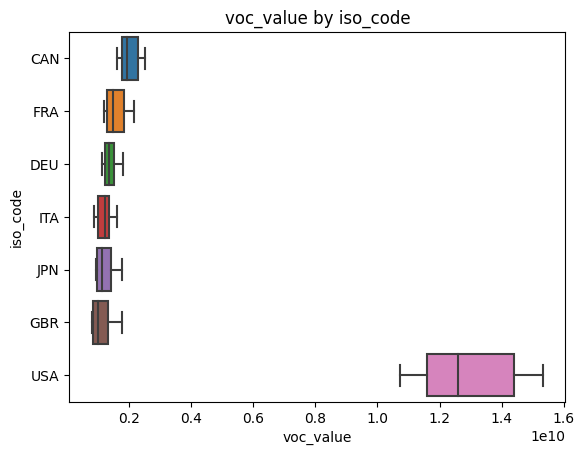

voc_value                                                          \
             count          mean           std           min           25%   
iso_code                                                                     
CAN           18.0  2.016443e+09  3.006722e+08  1.600937e+09  1.782936e+09   
DEU           18.0  1.385876e+09  2.062235e+08  1.138800e+09  1.220574e+09   
FRA           18.0  1.568962e+09  3.219101e+08  1.202562e+09  1.297005e+09   
GBR           18.0  1.117464e+09  3.149431e+08  8.055673e+08  8.467828e+08   
ITA           18.0  1.199441e+09  2.364259e+08  8.864590e+08  1.000926e+09   
JPN           18.0  1.219962e+09  2.739423e+08  9.267592e+08  9.790099e+08   
USA           18.0  1.292667e+10  1.520514e+09  1.071371e+10  1.161058e+10   

                                                    
                   50%           75%           max  
iso_code                                            
CAN       1.939414e+09  2.285814e+09  2.504416e+09  
DEU       1.361360e+09  1.525824e+09  1.813504e+09  
FRA       1.488937e+09  1.830884e+09  2.148382e+09  
GBR       1.002114e+09  1.323189e+09  1.759869e+09  
ITA       1.219191e+09  1.340852e+09  1.624558e+09  
JPN       1.120367e+09  1.431497e+09  1.781023e+09  
USA       1.259060e+10  1.440458e+10  1.532932e+10

************************************************************************


In [75]:
# obtaining box plots for the columns in the dataset
for index in range(len(list_of_df_project_cols)):
    if index == 0:
        y = list_of_df_project_cols[index]
    elif index >2:
        x = list_of_df_project_cols[index]
        
        sns.boxplot(data = df_project, x = x, y = y)
        plt.title(f"{x} by {y}")
        plt.show()
                
        display(df_project[[x, y]].groupby(y).describe())
        print("************************************************************************")

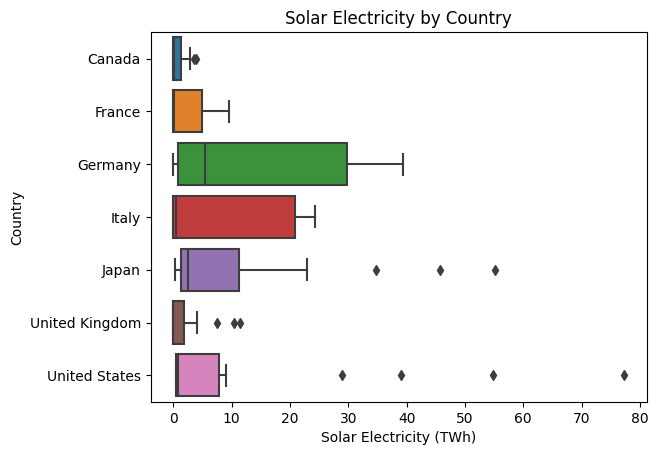

In [76]:
sns.boxplot(data = df_project, x = "solar_electricity", y = "country")
plt.title("Solar Electricity by Country")
plt.ylabel("Country")
plt.xlabel("Solar Electricity (TWh)")
plt.show()

In [77]:
"""Defining a function using different outlier
methods to take in a series, a couple of columns,
or an entire df """

def get_outliers(df_series, alpha):

    # Using IQR
    q75, q25 = np.percentile(df_series, [75, 25])
    iqr = q75-q25
    print("USING INTERQUARTILE RANGE")
    print("")
    print(f"IQR: {iqr}")
    print("")
    print(f"for near outliers: {q25-1.5*iqr, q75+1.5*iqr}")
    print("")
    print(f"for far outliers: {q25-3*iqr, q75+3*iqr}")
    print("")
    print("*******************************")
    print("")

    # Using Grubb"s Test
    print("USING GRUBB'S TEST")
    print("")

    # computing the mean
    avg = np.mean(df_series)
    print(f"mean: {avg}")
    print("")

    # computing the absolute value of x(i)-avg(x)
    absvalues = abs(df_series-avg)
    print(f"absvalues: {absvalues}")
    print("")

    # obtaining the maximum value of the absolute value
    maxvalue = max(absvalues)
    print(f"maxvalue: {maxvalue}")
    print("")

    # computing the G value from the above and from the standard deviation
    std = np.std(df_series)
    Grubbs = maxvalue/std
    print(f"Grubbs: {Grubbs}")
    print("")

    # computing the critical value of G needed to accept or reject H0
    size = len(df_series)

    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))

    critical_value = numerator / denominator

    print(f"Grubbs Critical Value: {critical_value}")

In [78]:
get_outliers(df_project["electricity_generation"], 0.5)

USING INTERQUARTILE RANGE

IQR: 609.17025

for near outliers: (-522.052875, 1914.628125)

for far outliers: (-1435.80825, 2828.3835)

*******************************

USING GRUBB'S TEST

mean: 1071.0192301587301

absvalues: 0       482.59523
1       498.65723
2       487.07923
3       498.63523
4       488.61123
          ...    
121    2994.94477
122    3033.81977
123    3020.72077
124    3024.46777
125    2987.24177
Name: electricity_generation, Length: 126, dtype: float64

maxvalue: 3085.7257698412695

Grubbs: 2.522885706861715

Grubbs Critical Value: 2.8387324015909843


In [79]:
df_project[(df_project["electricity_generation"] < -1435.80825)|
          (df_project["electricity_generation"] > 2828.3835)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
108,USA,United States,2000,3802.105,2697.273,270.034,753.893,74.819,350.939,0.493,5.593,2.033,93810.546,2.766,625.106,23224.264,9574.610,70.942,1104.832,19.828,3.521,74.967,2204.367,2676.122,7824.923,281711008.0,26427.463,9.230,-10.197,-113.415,998.832,3545.591,0.013,1.300000e+13,0.147,5.725075e+12,9.208286e+10,7.369236e+12,2.026265e+10,1.476697e+10,1.532932e+10
109,USA,United States,2001,3736.644,2688.911,208.138,768.826,63.489,278.906,0.543,6.737,1.970,90665.250,-2.067,-480.145,22744.120,9447.771,71.961,1047.733,20.575,1.319,29.067,2233.434,2701.352,7847.405,284608000.0,25804.055,7.464,-17.253,-172.330,826.501,2904.000,0.015,1.310000e+13,0.180,5.696529e+12,8.853074e+10,7.253600e+12,1.939385e+10,1.441316e+10,1.514923e+10
110,USA,United States,2002,3858.452,2743.693,255.586,780.064,68.200,334.695,0.555,10.354,1.968,91122.307,0.868,197.339,22941.458,9550.622,71.109,1114.759,20.217,0.807,18.026,2251.460,2715.354,7837.190,287279008.0,26177.526,8.674,19.130,158.106,984.608,3427.357,0.014,1.330000e+13,0.268,5.539661e+12,8.463947e+10,7.293312e+12,2.281357e+10,1.342519e+10,1.441549e+10
111,USA,United States,2003,3883.185,2772.694,267.271,763.733,67.765,346.758,0.534,11.187,1.917,90608.360,0.430,98.565,23040.023,9567.086,71.403,1110.491,19.668,-2.721,-61.267,2190.193,2635.233,7557.186,289816000.0,26259.752,8.930,4.563,44.929,1029.536,3552.380,0.014,1.370000e+13,0.288,5.601984e+12,8.175155e+10,7.352786e+12,2.222372e+10,1.388776e+10,1.441865e+10
112,USA,United States,2004,3970.555,2839.030,259.929,788.528,68.348,342.996,0.575,14.144,1.886,91590.312,1.992,459.031,23499.054,9710.901,71.502,1131.525,19.859,2.589,56.705,2246.898,2697.161,7685.512,292355008.0,26776.886,8.639,0.136,1.398,1030.934,3526.310,0.014,1.420000e+13,0.356,5.680423e+12,7.785107e+10,7.464485e+12,2.061203e+10,1.323861e+10,1.454832e+10
113,USA,United States,2005,4055.423,2922.344,263.763,781.986,68.969,351.093,0.550,17.811,1.822,90809.188,0.058,13.553,23512.607,9906.451,72.060,1133.079,19.282,-1.457,-32.744,2214.154,2650.855,7505.759,294993984.0,26788.164,8.657,2.955,30.469,1061.403,3598.050,0.014,1.470000e+13,0.439,5.694605e+12,7.424855e+10,7.477457e+12,1.972751e+10,1.317383e+10,1.437186e+10
114,USA,United States,2006,4064.702,2898.270,282.689,787.219,69.429,379.214,0.508,26.589,1.760,89239.243,-1.390,-326.921,23185.686,9733.608,71.303,1166.433,19.367,0.036,0.796,2214.950,2643.811,7438.734,297759008.0,26571.789,9.329,10.340,109.749,1171.152,3933.222,0.012,1.510000e+13,0.654,5.594623e+12,6.892039e+10,7.407878e+12,1.830919e+10,1.124504e+10,1.373652e+10
115,USA,United States,2007,4156.745,3004.469,240.614,806.425,70.176,345.851,0.612,34.450,1.750,89629.957,1.686,390.875,23576.561,9994.640,72.279,1152.276,19.400,1.799,39.858,2254.808,2682.646,7500.825,300608000.0,26943.482,8.320,-5.041,-59.039,1112.113,3699.545,0.015,1.540000e+13,0.829,5.678208e+12,6.446950e+10,7.511501e+12,1.712379e+10,1.046688e+10,1.346022e+10
116,USA,United States,2008,4119.388,2938.535,248.543,806.208,69.874,374.644,0.864,55.363,1.718,86587.174,-3.338,-786.925,22789.636,9682.604,71.334,1180.853,19.571,-0.648,-14.606,2240.202,2656.493,7381.565,303486016.0,26277.996,9.095,12.233,136.046,1248.159,4112.739,0.021,1.530000e+13,1.344,5.504101e+12,5.961124e+10,7.294606e+1

In [80]:
get_outliers(df_project["fossil_electricity"], 0.5)

USING INTERQUARTILE RANGE

IQR: 472.86699999999996

for near outliers: (-557.4912499999999, 1333.9767499999998)

for far outliers: (-1266.7917499999999, 2043.2772499999999)

*******************************

USING GRUBB'S TEST

mean: 649.6966507936507

absvalues: 0       493.891651
1       489.176651
2       494.064651
3       492.468651
4       500.401651
          ...     
121    2109.858349
122    2114.337349
123    2091.577349
124    2018.525349
125    1899.508349
Name: fossil_electricity, Length: 126, dtype: float64

maxvalue: 2354.772349206349

Grubbs: 2.6239942702776973

Grubbs Critical Value: 2.8387324015909843


In [81]:
df_project[(df_project["fossil_electricity"] < -1266.7917499999999)|
          (df_project["fossil_electricity"] > 2043.2772499999999)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
108,USA,United States,2000,3802.105,2697.273,270.034,753.893,74.819,350.939,0.493,5.593,2.033,93810.546,2.766,625.106,23224.264,9574.610,70.942,1104.832,19.828,3.521,74.967,2204.367,2676.122,7824.923,281711008.0,26427.463,9.230,-10.197,-113.415,998.832,3545.591,0.013,1.300000e+13,0.147,5.725075e+12,9.208286e+10,7.369236e+12,2.026265e+10,1.476697e+10,1.532932e+10
109,USA,United States,2001,3736.644,2688.911,208.138,768.826,63.489,278.906,0.543,6.737,1.970,90665.250,-2.067,-480.145,22744.120,9447.771,71.961,1047.733,20.575,1.319,29.067,2233.434,2701.352,7847.405,284608000.0,25804.055,7.464,-17.253,-172.330,826.501,2904.000,0.015,1.310000e+13,0.180,5.696529e+12,8.853074e+10,7.253600e+12,1.939385e+10,1.441316e+10,1.514923e+10
110,USA,United States,2002,3858.452,2743.693,255.586,780.064,68.200,334.695,0.555,10.354,1.968,91122.307,0.868,197.339,22941.458,9550.622,71.109,1114.759,20.217,0.807,18.026,2251.460,2715.354,7837.190,287279008.0,26177.526,8.674,19.130,158.106,984.608,3427.357,0.014,1.330000e+13,0.268,5.539661e+12,8.463947e+10,7.293312e+12,2.281357e+10,1.342519e+10,1.441549e+10
111,USA,United States,2003,3883.185,2772.694,267.271,763.733,67.765,346.758,0.534,11.187,1.917,90608.360,0.430,98.565,23040.023,9567.086,71.403,1110.491,19.668,-2.721,-61.267,2190.193,2635.233,7557.186,289816000.0,26259.752,8.930,4.563,44.929,1029.536,3552.380,0.014,1.370000e+13,0.288,5.601984e+12,8.175155e+10,7.352786e+12,2.222372e+10,1.388776e+10,1.441865e+10
112,USA,United States,2004,3970.555,2839.030,259.929,788.528,68.348,342.996,0.575,14.144,1.886,91590.312,1.992,459.031,23499.054,9710.901,71.502,1131.525,19.859,2.589,56.705,2246.898,2697.161,7685.512,292355008.0,26776.886,8.639,0.136,1.398,1030.934,3526.310,0.014,1.420000e+13,0.356,5.680423e+12,7.785107e+10,7.464485e+12,2.061203e+10,1.323861e+10,1.454832e+10
113,USA,United States,2005,4055.423,2922.344,263.763,781.986,68.969,351.093,0.550,17.811,1.822,90809.188,0.058,13.553,23512.607,9906.451,72.060,1133.079,19.282,-1.457,-32.744,2214.154,2650.855,7505.759,294993984.0,26788.164,8.657,2.955,30.469,1061.403,3598.050,0.014,1.470000e+13,0.439,5.694605e+12,7.424855e+10,7.477457e+12,1.972751e+10,1.317383e+10,1.437186e+10
114,USA,United States,2006,4064.702,2898.270,282.689,787.219,69.429,379.214,0.508,26.589,1.760,89239.243,-1.390,-326.921,23185.686,9733.608,71.303,1166.433,19.367,0.036,0.796,2214.950,2643.811,7438.734,297759008.0,26571.789,9.329,10.340,109.749,1171.152,3933.222,0.012,1.510000e+13,0.654,5.594623e+12,6.892039e+10,7.407878e+12,1.830919e+10,1.124504e+10,1.373652e+10
115,USA,United States,2007,4156.745,3004.469,240.614,806.425,70.176,345.851,0.612,34.450,1.750,89629.957,1.686,390.875,23576.561,9994.640,72.279,1152.276,19.400,1.799,39.858,2254.808,2682.646,7500.825,300608000.0,26943.482,8.320,-5.041,-59.039,1112.113,3699.545,0.015,1.540000e+13,0.829,5.678208e+12,6.446950e+10,7.511501e+12,1.712379e+10,1.046688e+10,1.346022e+10
116,USA,United States,2008,4119.388,2938.535,248.543,806.208,69.874,374.644,0.864,55.363,1.718,86587.174,-3.338,-786.925,22789.636,9682.604,71.334,1180.853,19.571,-0.648,-14.606,2240.202,2656.493,7381.565,303486016.0,26277.996,9.095,12.233,136.046,1248.159,4112.739,0.021,1.530000e+13,1.344,5.504101e+12,5.961124e+10,7.294606e+1

In [82]:
get_outliers(df_project["solar_electricity"], 0.5)

USING INTERQUARTILE RANGE

IQR: 6.57775

for near outliers: (-9.834624999999999, 16.476374999999997)

for far outliers: (-19.701249999999998, 26.342999999999996)

*******************************

USING GRUBB'S TEST

mean: 7.358714285714284

absvalues: 0       7.342714
1       7.339714
2       7.336714
3       7.335714
4       7.345714
         ...    
121     1.677286
122    21.565286
123    31.673286
124    47.507286
125    69.917286
Name: solar_electricity, Length: 126, dtype: float64

maxvalue: 69.91728571428571

Grubbs: 5.113065033281017

Grubbs Critical Value: 2.8387324015909843


In [83]:
df_project[(df_project["solar_electricity"] < -19.701249999999998)|
          (df_project["solar_electricity"] > 26.342999999999996)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
48,DEU,Germany,2012,623.100,380.500,21.800,99.500,43.300,143.100,26.400,51.600,1.052,45861.865,0.656,19.895,3052.566,4699.097,61.066,242.600,15.969,-8.441,-23.619,256.185,1228.805,3163.833,80973000.0,3713.573,22.966,14.100,50.026,404.821,4999.460,4.237,3.530000e+12,8.281,7.455474e+11,3.192584e+09,9.133157e+11,1.424341e+09,3.685111e+08,1.256895e+09
49,DEU,Germany,2013,632.900,383.300,23.000,97.300,45.600,152.300,31.000,52.700,1.046,47038.770,3.107,94.840,3147.407,4721.955,60.562,249.600,15.374,-2.771,-7.099,249.086,1198.660,3068.545,81174000.0,3818.325,24.064,4.202,17.011,421.832,5196.642,4.898,3.650000e+12,8.327,7.637139e+11,3.156146e+09,9.334729e+11,1.427427e+09,3.568568e+08,1.211942e+09
50,DEU,Germany,2014,622.000,362.300,19.600,97.100,48.400,162.600,36.100,58.500,0.968,44902.427,-5.854,-184.241,2963.166,4448.128,58.248,259.700,15.611,-0.763,-1.901,247.185,1192.142,3034.804,81450000.0,3657.303,26.141,5.955,25.120,446.952,5487.443,5.804,3.780000e+12,9.405,7.231737e+11,2.987930e+09,8.933989e+11,1.384153e+09,3.354295e+08,1.172788e+09
51,DEU,Germany,2015,642.400,361.800,19.000,91.800,50.500,188.800,38.700,80.600,0.967,45510.725,0.606,17.971,2981.137,4423.686,56.320,280.600,14.290,-6.063,-14.987,232.198,1122.428,2839.054,81787000.0,3722.186,29.390,13.849,61.899,508.851,6221.666,6.024,3.850000e+12,12.547,7.294614e+11,3.088652e+09,8.966739e+11,1.358612e+09,3.339349e+08,1.145981e+09
52,DEU,Germany,2016,644.800,370.500,20.500,84.600,51.100,189.700,38.100,80.000,0.965,46028.413,2.716,80.967,3062.104,4507.628,57.460,274.300,13.120,-8.338,-19.361,212.837,1029.272,2589.449,82194000.0,3783.259,29.420,-0.105,-0.533,508.319,6184.376,5.909,3.920000e+12,12.407,7.345501e+11,2.963152e+09,8.985887e+11,1.324002e+09,3.095486e+08,1.138800e+09
53,DEU,Germany,2017,647.900,355.100,20.200,76.300,51.200,216.500,39.400,105.700,0.873,46322.041,0.106,3.256,3065.360,4296.015,54.808,292.800,11.777,-10.349,-22.026,190.811,923.081,2308.441,82658000.0,3828.887,33.416,12.669,64.398,572.716,6928.746,6.081,4.386729e+12,16.314,7.191159e+11,2.970693e+09,8.816196e+11,1.267958e+09,3.010368e+08,1.142485e+09
87,JPN,Japan,2015,997.227,809.469,86.751,4.346,56.278,183.412,34.803,5.580,1.155,41168.225,-2.737,-136.877,4863.212,6324.716,81.172,187.758,0.436,0.000,11.446,11.446,33.957,89.430,127985000.0,5268.915,18.392,14.338,48.858,389.617,3044.241,3.490,4.560000e+12,0.560,1.152749e+12,2.720082e+09,1.317845e+12,1.310855e+09,6.719499e+08,9.347818e+08
88,JPN,Japan,2016,995.365,798.071,79.138,9.266,56.963,188.028,45.761,6.166,1.126,40543.449,-1.858,-90.374,4772.839,6246.498,80.179,197.294,0.931,288.413,33.011,44.457,72.525,347.961,127763000.0,5179.953,18.890,-8.261,-32.188,357.429,2797.594,4.597,4.600000e+12,0.619,1.139565e+12,3.208949e+09,1.301289e+12,1.411307e+09,6.382581e+08,9.418880e+08
89,JPN,Japan,2017,992.688,772.728,83.417,11.610,63.374,208.350,55.069,6.490,0.997,41155.311,-0.136,-6.499,4766.340,6060.469,77.842,219.960,1.170,63.497,28.229,72.685,91.057,570.065,127503000.0,5247.426,20.988,12.677,45.312,402.741,3158.677,5.547,5.262255e+12,0.654,1.125768e+12,3.349380e+09,1.288858e+12,1.328837e+09,5.991825e+08,9.267592e+08
122,USA,United States,2014,4104.839,2764.034,253.193,797.166,79.866,543.638,28.924,181.655,1.567,81112.618,0.967,

In [84]:
# solar_electricity needs checking

In [85]:
get_outliers(df_project["fossil_fuel_consumption"], 0.5)

USING INTERQUARTILE RANGE

IQR: 2898.9629999999997

for near outliers: (-2407.9612499999994, 9187.890749999999)

for far outliers: (-6756.405749999999, 13536.33525)

*******************************

USING GRUBB'S TEST

mean: 5512.533373015874

absvalues: 0       3172.011373
1       3193.828373
2       3126.330373
3       3064.427373
4       3063.999373
           ...     
121    16217.325627
122    16427.486627
123    16157.921627
124    15916.416627
125    15819.189627
Name: fossil_fuel_consumption, Length: 126, dtype: float64

maxvalue: 18064.027626984127

Grubbs: 2.5876290270439903

Grubbs Critical Value: 2.8387324015909843


In [86]:
df_project[(df_project["fossil_fuel_consumption"] < -6756.405749999999)|
          (df_project["fossil_fuel_consumption"] > 13536.33525)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
108,USA,United States,2000,3802.105,2697.273,270.034,753.893,74.819,350.939,0.493,5.593,2.033,93810.546,2.766,625.106,23224.264,9574.610,70.942,1104.832,19.828,3.521,74.967,2204.367,2676.122,7824.923,281711008.0,26427.463,9.230,-10.197,-113.415,998.832,3545.591,0.013,1.300000e+13,0.147,5.725075e+12,9.208286e+10,7.369236e+12,2.026265e+10,1.476697e+10,1.532932e+10
109,USA,United States,2001,3736.644,2688.911,208.138,768.826,63.489,278.906,0.543,6.737,1.970,90665.250,-2.067,-480.145,22744.120,9447.771,71.961,1047.733,20.575,1.319,29.067,2233.434,2701.352,7847.405,284608000.0,25804.055,7.464,-17.253,-172.330,826.501,2904.000,0.015,1.310000e+13,0.180,5.696529e+12,8.853074e+10,7.253600e+12,1.939385e+10,1.441316e+10,1.514923e+10
110,USA,United States,2002,3858.452,2743.693,255.586,780.064,68.200,334.695,0.555,10.354,1.968,91122.307,0.868,197.339,22941.458,9550.622,71.109,1114.759,20.217,0.807,18.026,2251.460,2715.354,7837.190,287279008.0,26177.526,8.674,19.130,158.106,984.608,3427.357,0.014,1.330000e+13,0.268,5.539661e+12,8.463947e+10,7.293312e+12,2.281357e+10,1.342519e+10,1.441549e+10
111,USA,United States,2003,3883.185,2772.694,267.271,763.733,67.765,346.758,0.534,11.187,1.917,90608.360,0.430,98.565,23040.023,9567.086,71.403,1110.491,19.668,-2.721,-61.267,2190.193,2635.233,7557.186,289816000.0,26259.752,8.930,4.563,44.929,1029.536,3552.380,0.014,1.370000e+13,0.288,5.601984e+12,8.175155e+10,7.352786e+12,2.222372e+10,1.388776e+10,1.441865e+10
112,USA,United States,2004,3970.555,2839.030,259.929,788.528,68.348,342.996,0.575,14.144,1.886,91590.312,1.992,459.031,23499.054,9710.901,71.502,1131.525,19.859,2.589,56.705,2246.898,2697.161,7685.512,292355008.0,26776.886,8.639,0.136,1.398,1030.934,3526.310,0.014,1.420000e+13,0.356,5.680423e+12,7.785107e+10,7.464485e+12,2.061203e+10,1.323861e+10,1.454832e+10
113,USA,United States,2005,4055.423,2922.344,263.763,781.986,68.969,351.093,0.550,17.811,1.822,90809.188,0.058,13.553,23512.607,9906.451,72.060,1133.079,19.282,-1.457,-32.744,2214.154,2650.855,7505.759,294993984.0,26788.164,8.657,2.955,30.469,1061.403,3598.050,0.014,1.470000e+13,0.439,5.694605e+12,7.424855e+10,7.477457e+12,1.972751e+10,1.317383e+10,1.437186e+10
114,USA,United States,2006,4064.702,2898.270,282.689,787.219,69.429,379.214,0.508,26.589,1.760,89239.243,-1.390,-326.921,23185.686,9733.608,71.303,1166.433,19.367,0.036,0.796,2214.950,2643.811,7438.734,297759008.0,26571.789,9.329,10.340,109.749,1171.152,3933.222,0.012,1.510000e+13,0.654,5.594623e+12,6.892039e+10,7.407878e+12,1.830919e+10,1.124504e+10,1.373652e+10
115,USA,United States,2007,4156.745,3004.469,240.614,806.425,70.176,345.851,0.612,34.450,1.750,89629.957,1.686,390.875,23576.561,9994.640,72.279,1152.276,19.400,1.799,39.858,2254.808,2682.646,7500.825,300608000.0,26943.482,8.320,-5.041,-59.039,1112.113,3699.545,0.015,1.540000e+13,0.829,5.678208e+12,6.446950e+10,7.511501e+12,1.712379e+10,1.046688e+10,1.346022e+10
116,USA,United States,2008,4119.388,2938.535,248.543,806.208,69.874,374.644,0.864,55.363,1.718,86587.174,-3.338,-786.925,22789.636,9682.604,71.334,1180.853,19.571,-0.648,-14.606,2240.202,2656.493,7381.565,303486016.0,26277.996,9.095,12.233,136.046,1248.159,4112.739,0.021,1.530000e+13,1.344,5.504101e+12,5.961124e+10,7.294606e+1

In [87]:
get_outliers(df_project["low_carbon_electricity"], 0.5)

USING INTERQUARTILE RANGE

IQR: 382.63625

for near outliers: (-449.02087500000005, 1081.524125)

for far outliers: (-1022.9752500000001, 1655.4785000000002)

*******************************

USING GRUBB'S TEST

mean: 421.3226031746031

absvalues: 0        11.296397
1         9.480603
2         6.985397
3         6.166603
4        11.789397
          ...     
121     885.086397
122     919.481397
123     929.144397
124    1005.942397
125    1087.733397
Name: low_carbon_electricity, Length: 126, dtype: float64

maxvalue: 1087.733396825397

Grubbs: 2.9568597793827966

Grubbs Critical Value: 2.8387324015909843


In [88]:
df_project[(df_project["low_carbon_electricity"] < -449.02087500000005)|
          (df_project["low_carbon_electricity"] > 1081.524125)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
108,USA,United States,2000,3802.105,2697.273,270.034,753.893,74.819,350.939,0.493,5.593,2.033,93810.546,2.766,625.106,23224.264,9574.610,70.942,1104.832,19.828,3.521,74.967,2204.367,2676.122,7824.923,281711008.0,26427.463,9.230,-10.197,-113.415,998.832,3545.591,0.013,1.300000e+13,0.147,5.725075e+12,9.208286e+10,7.369236e+12,2.026265e+10,1.476697e+10,1.532932e+10
110,USA,United States,2002,3858.452,2743.693,255.586,780.064,68.200,334.695,0.555,10.354,1.968,91122.307,0.868,197.339,22941.458,9550.622,71.109,1114.759,20.217,0.807,18.026,2251.460,2715.354,7837.190,287279008.0,26177.526,8.674,19.130,158.106,984.608,3427.357,0.014,1.330000e+13,0.268,5.539661e+12,8.463947e+10,7.293312e+12,2.281357e+10,1.342519e+10,1.441549e+10
111,USA,United States,2003,3883.185,2772.694,267.271,763.733,67.765,346.758,0.534,11.187,1.917,90608.360,0.430,98.565,23040.023,9567.086,71.403,1110.491,19.668,-2.721,-61.267,2190.193,2635.233,7557.186,289816000.0,26259.752,8.930,4.563,44.929,1029.536,3552.380,0.014,1.370000e+13,0.288,5.601984e+12,8.175155e+10,7.352786e+12,2.222372e+10,1.388776e+10,1.441865e+10
112,USA,United States,2004,3970.555,2839.030,259.929,788.528,68.348,342.996,0.575,14.144,1.886,91590.312,1.992,459.031,23499.054,9710.901,71.502,1131.525,19.859,2.589,56.705,2246.898,2697.161,7685.512,292355008.0,26776.886,8.639,0.136,1.398,1030.934,3526.310,0.014,1.420000e+13,0.356,5.680423e+12,7.785107e+10,7.464485e+12,2.061203e+10,1.323861e+10,1.454832e+10
113,USA,United States,2005,4055.423,2922.344,263.763,781.986,68.969,351.093,0.550,17.811,1.822,90809.188,0.058,13.553,23512.607,9906.451,72.060,1133.079,19.282,-1.457,-32.744,2214.154,2650.855,7505.759,294993984.0,26788.164,8.657,2.955,30.469,1061.403,3598.050,0.014,1.470000e+13,0.439,5.694605e+12,7.424855e+10,7.477457e+12,1.972751e+10,1.317383e+10,1.437186e+10
114,USA,United States,2006,4064.702,2898.270,282.689,787.219,69.429,379.214,0.508,26.589,1.760,89239.243,-1.390,-326.921,23185.686,9733.608,71.303,1166.433,19.367,0.036,0.796,2214.950,2643.811,7438.734,297759008.0,26571.789,9.329,10.340,109.749,1171.152,3933.222,0.012,1.510000e+13,0.654,5.594623e+12,6.892039e+10,7.407878e+12,1.830919e+10,1.124504e+10,1.373652e+10
115,USA,United States,2007,4156.745,3004.469,240.614,806.425,70.176,345.851,0.612,34.450,1.750,89629.957,1.686,390.875,23576.561,9994.640,72.279,1152.276,19.400,1.799,39.858,2254.808,2682.646,7500.825,300608000.0,26943.482,8.320,-5.041,-59.039,1112.113,3699.545,0.015,1.540000e+13,0.829,5.678208e+12,6.446950e+10,7.511501e+12,1.712379e+10,1.046688e+10,1.346022e+10
116,USA,United States,2008,4119.388,2938.535,248.543,806.208,69.874,374.644,0.864,55.363,1.718,86587.174,-3.338,-786.925,22789.636,9682.604,71.334,1180.853,19.571,-0.648,-14.606,2240.202,2656.493,7381.565,303486016.0,26277.996,9.095,12.233,136.046,1248.159,4112.739,0.021,1.530000e+13,1.344,5.504101e+12,5.961124e+10,7.294606e+12,1.618966e+10,9.203100e+09,1.304533e+10
117,USA,United States,2009,3950.331,2738.380,268.818,798.855,69.501,413.096,0.891,73.886,1.676,81548.356,-6.118,-1394.278,21395.358,8939.955,69.320,1211.951,20.222,-1.524,-34.136,2206.065,2608.011,7202.115,306308000.0,24978.914,10.457,10.362,129.332,1377.491,4497.078,0.023,1.490000e+13,1.870,5.113881e+12,5.613674e+10,6.84069

In [89]:
get_outliers(df_project["nuclear_share_elec"], 0.5)

USING INTERQUARTILE RANGE

IQR: 11.62725

for near outliers: (-3.2893749999999997, 43.21962499999999)

for far outliers: (-20.730249999999998, 60.6605)

*******************************

USING GRUBB'S TEST

mean: 24.182761904761907

absvalues: 0      12.429762
1      11.453762
2      11.895762
3      11.752762
4       9.438762
         ...    
121     4.777762
122     4.762762
123     4.699762
124     4.509762
125     4.347762
Name: nuclear_share_elec, Length: 126, dtype: float64

maxvalue: 54.8772380952381

Grubbs: 2.376698088879992

Grubbs Critical Value: 2.8387324015909843


In [90]:
df_project[(df_project["nuclear_share_elec"] < -20.730249999999998)|
          (df_project["nuclear_share_elec"] > 60.6605)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
18,FRA,France,2000,535.185,50.620,66.363,415.162,2.986,69.403,0.005,0.048,1.590,52010.660,-0.181,-3.123,1719.708,857.748,9.458,484.565,77.574,5.306,58.106,1153.229,7034.856,19541.281,59015000.0,3069.409,12.968,-7.568,-16.087,196.472,3329.194,0.001,1.930000e+12,0.009,3.637414e+11,6.704562e+09,5.487091e+11,1.809416e+09,6.156885e+08,2.148382e+09
19,FRA,France,2001,545.287,46.472,74.267,421.076,3.334,77.739,0.006,0.131,1.545,52299.909,0.333,5.733,1725.441,782.568,8.522,498.815,77.221,0.766,8.833,1162.061,7090.732,19568.593,59384000.0,3105.778,14.256,11.097,21.803,218.276,3675.663,0.001,2.010000e+12,0.024,3.669794e+11,6.372659e+09,5.542613e+11,1.769636e+09,5.596436e+08,2.080284e+09
20,FRA,France,2002,553.631,52.664,60.397,436.760,3.537,64.207,0.007,0.266,1.500,51419.992,-1.617,-27.906,1697.535,880.625,9.512,500.967,78.890,3.056,35.507,1197.569,7303.313,20025.228,59803000.0,3075.070,11.597,-17.551,-38.309,179.966,3009.317,0.001,2.050000e+12,0.048,3.616187e+11,6.207459e+09,5.482805e+11,1.725605e+09,5.157533e+08,1.964261e+09
21,FRA,France,2003,561.504,57.377,58.944,441.070,3.717,63.057,0.008,0.388,1.585,51569.863,1.923,32.635,1730.170,952.284,10.218,504.127,78.552,0.339,4.065,1201.634,7320.421,19943.470,60252000.0,3107.187,11.230,-2.547,-4.583,175.383,2910.826,0.001,1.960000e+12,0.069,3.672623e+11,6.005482e+09,5.526304e+11,1.675448e+09,4.973550e+08,1.939852e+09
22,FRA,France,2004,568.710,56.529,59.555,448.241,3.782,63.940,0.008,0.595,1.551,51609.093,0.693,11.997,1742.167,931.316,9.940,512.181,78.817,0.979,11.758,1213.392,7384.774,19990.646,60698000.0,3132.569,11.243,0.927,1.626,177.009,2916.229,0.001,2.020000e+12,0.105,3.674459e+11,6.136409e+09,5.522312e+11,1.628885e+09,4.756175e+08,1.847041e+09
23,FRA,France,2005,571.210,63.356,51.480,451.529,3.872,56.325,0.011,0.963,1.476,50970.250,0.024,0.423,1742.590,1036.584,11.092,507.854,79.048,0.096,1.165,1214.557,7387.582,19871.676,61120000.0,3115.302,9.861,-10.652,-18.854,158.155,2587.616,0.002,2.110000e+12,0.169,3.701950e+11,5.681548e+09,5.539074e+11,1.579499e+09,4.570775e+08,1.782413e+09
24,FRA,France,2006,569.433,56.902,56.304,450.191,3.841,62.340,0.012,2.183,1.424,50224.625,-1.800,-31.358,1711.232,925.100,9.993,512.531,79.060,-0.923,-11.215,1203.342,7319.108,19563.669,61509000.0,3089.266,10.948,10.457,16.538,174.693,2840.119,0.002,2.170000e+12,0.383,3.613424e+11,5.125674e+09,5.432815e+11,1.490633e+09,4.242287e+08,1.694379e+09
25,FRA,France,2007,563.809,58.171,57.604,439.730,4.216,65.908,0.018,4.070,1.325,49048.521,-2.103,-35.995,1675.237,940.229,10.317,505.638,77.993,-2.934,-35.308,1168.034,7107.437,18879.144,61869000.0,3034.583,11.690,9.514,16.620,191.312,3092.219,0.003,2.290000e+12,0.722,3.520726e+11,4.874739e+09,5.335304e+11,1.421174e+09,4.031614e+08,1.572017e+09
26,FRA,France,2008,568.852,55.579,63.654,439.447,4.436,73.826,0.042,5.694,1.323,48915.553,-0.807,-13.519,1661.717,893.426,9.770,513.273,77.252,-0.685,-8.002,1160.032,7064.042,18647.331,62209000.0,3042.988,12.978,15.642,29.926,221.238,3556.371,0.007,2.300000e+12,1.001,3.482431e+11,4.711031e+09,5.280726e+11,1.343462e+09,3.459343e+08,1.513222e+09
27,FRA,France,2009,530.712,51.318,56.994,409.736,4.578,69.658,0.174,7.912,1.260,45944.468,-4.456,-74.040,1587.678,820.527,9.670,479.394,77.205,-

In [91]:
get_outliers(df_project["population"], 0.5)

USING INTERQUARTILE RANGE

IQR: 68535250.0

for near outliers: (-43477625.0, 230663375.0)

for far outliers: (-146280500.0, 333466250.0)

*******************************

USING GRUBB'S TEST

mean: 104458111.36507936

absvalues: 0      7.387011e+07
1      7.357811e+07
2      7.328011e+07
3      7.297011e+07
4      7.264311e+07
           ...     
121    2.119429e+08
122    2.142149e+08
123    2.164199e+08
124    2.185579e+08
125    2.206269e+08
Name: population, Length: 126, dtype: float64

maxvalue: 220626880.63492066

Grubbs: 2.563086340449341

Grubbs Critical Value: 2.8387324015909843


In [92]:
df_project[(df_project["population"] < -43477625.0)|
          (df_project["population"] > 230663375.0)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
108,USA,United States,2000,3802.105,2697.273,270.034,753.893,74.819,350.939,0.493,5.593,2.033,93810.546,2.766,625.106,23224.264,9574.610,70.942,1104.832,19.828,3.521,74.967,2204.367,2676.122,7824.923,281711008.0,26427.463,9.230,-10.197,-113.415,998.832,3545.591,0.013,1.300000e+13,0.147,5.725075e+12,9.208286e+10,7.369236e+12,2.026265e+10,1.476697e+10,1.532932e+10
109,USA,United States,2001,3736.644,2688.911,208.138,768.826,63.489,278.906,0.543,6.737,1.970,90665.250,-2.067,-480.145,22744.120,9447.771,71.961,1047.733,20.575,1.319,29.067,2233.434,2701.352,7847.405,284608000.0,25804.055,7.464,-17.253,-172.330,826.501,2904.000,0.015,1.310000e+13,0.180,5.696529e+12,8.853074e+10,7.253600e+12,1.939385e+10,1.441316e+10,1.514923e+10
110,USA,United States,2002,3858.452,2743.693,255.586,780.064,68.200,334.695,0.555,10.354,1.968,91122.307,0.868,197.339,22941.458,9550.622,71.109,1114.759,20.217,0.807,18.026,2251.460,2715.354,7837.190,287279008.0,26177.526,8.674,19.130,158.106,984.608,3427.357,0.014,1.330000e+13,0.268,5.539661e+12,8.463947e+10,7.293312e+12,2.281357e+10,1.342519e+10,1.441549e+10
111,USA,United States,2003,3883.185,2772.694,267.271,763.733,67.765,346.758,0.534,11.187,1.917,90608.360,0.430,98.565,23040.023,9567.086,71.403,1110.491,19.668,-2.721,-61.267,2190.193,2635.233,7557.186,289816000.0,26259.752,8.930,4.563,44.929,1029.536,3552.380,0.014,1.370000e+13,0.288,5.601984e+12,8.175155e+10,7.352786e+12,2.222372e+10,1.388776e+10,1.441865e+10
112,USA,United States,2004,3970.555,2839.030,259.929,788.528,68.348,342.996,0.575,14.144,1.886,91590.312,1.992,459.031,23499.054,9710.901,71.502,1131.525,19.859,2.589,56.705,2246.898,2697.161,7685.512,292355008.0,26776.886,8.639,0.136,1.398,1030.934,3526.310,0.014,1.420000e+13,0.356,5.680423e+12,7.785107e+10,7.464485e+12,2.061203e+10,1.323861e+10,1.454832e+10
113,USA,United States,2005,4055.423,2922.344,263.763,781.986,68.969,351.093,0.550,17.811,1.822,90809.188,0.058,13.553,23512.607,9906.451,72.060,1133.079,19.282,-1.457,-32.744,2214.154,2650.855,7505.759,294993984.0,26788.164,8.657,2.955,30.469,1061.403,3598.050,0.014,1.470000e+13,0.439,5.694605e+12,7.424855e+10,7.477457e+12,1.972751e+10,1.317383e+10,1.437186e+10
114,USA,United States,2006,4064.702,2898.270,282.689,787.219,69.429,379.214,0.508,26.589,1.760,89239.243,-1.390,-326.921,23185.686,9733.608,71.303,1166.433,19.367,0.036,0.796,2214.950,2643.811,7438.734,297759008.0,26571.789,9.329,10.340,109.749,1171.152,3933.222,0.012,1.510000e+13,0.654,5.594623e+12,6.892039e+10,7.407878e+12,1.830919e+10,1.124504e+10,1.373652e+10
115,USA,United States,2007,4156.745,3004.469,240.614,806.425,70.176,345.851,0.612,34.450,1.750,89629.957,1.686,390.875,23576.561,9994.640,72.279,1152.276,19.400,1.799,39.858,2254.808,2682.646,7500.825,300608000.0,26943.482,8.320,-5.041,-59.039,1112.113,3699.545,0.015,1.540000e+13,0.829,5.678208e+12,6.446950e+10,7.511501e+12,1.712379e+10,1.046688e+10,1.346022e+10
116,USA,United States,2008,4119.388,2938.535,248.543,806.208,69.874,374.644,0.864,55.363,1.718,86587.174,-3.338,-786.925,22789.636,9682.604,71.334,1180.853,19.571,-0.648,-14.606,2240.202,2656.493,7381.565,303486016.0,26277.996,9.095,12.233,136.046,1248.159,4112.739,0.021,1.530000e+13,1.344,5.504101e+12,5.961124e+10,7.294606e+1

In [93]:
get_outliers(df_project["primary_energy_consumption"], 0.5)

USING INTERQUARTILE RANGE

IQR: 2782.142

for near outliers: (-1505.2382499999994, 9623.32975)

for far outliers: (-5678.451249999999, 13796.54275)

*******************************

USING GRUBB'S TEST

mean: 6677.862341269841

absvalues: 0       3119.975341
1       3206.402341
2       3099.605341
3       3083.778341
4       3041.168341
           ...     
121    18904.235659
122    19170.538659
123    18919.103659
124    18882.657659
125    18969.526659
Name: primary_energy_consumption, Length: 126, dtype: float64

maxvalue: 20265.61965873016

Grubbs: 2.5446965799760313

Grubbs Critical Value: 2.8387324015909843


In [94]:
df_project[(df_project["primary_energy_consumption"] < -5678.451249999999)|
          (df_project["primary_energy_consumption"] > 13796.54275)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
108,USA,United States,2000,3802.105,2697.273,270.034,753.893,74.819,350.939,0.493,5.593,2.033,93810.546,2.766,625.106,23224.264,9574.610,70.942,1104.832,19.828,3.521,74.967,2204.367,2676.122,7824.923,281711008.0,26427.463,9.230,-10.197,-113.415,998.832,3545.591,0.013,1.300000e+13,0.147,5.725075e+12,9.208286e+10,7.369236e+12,2.026265e+10,1.476697e+10,1.532932e+10
109,USA,United States,2001,3736.644,2688.911,208.138,768.826,63.489,278.906,0.543,6.737,1.970,90665.250,-2.067,-480.145,22744.120,9447.771,71.961,1047.733,20.575,1.319,29.067,2233.434,2701.352,7847.405,284608000.0,25804.055,7.464,-17.253,-172.330,826.501,2904.000,0.015,1.310000e+13,0.180,5.696529e+12,8.853074e+10,7.253600e+12,1.939385e+10,1.441316e+10,1.514923e+10
110,USA,United States,2002,3858.452,2743.693,255.586,780.064,68.200,334.695,0.555,10.354,1.968,91122.307,0.868,197.339,22941.458,9550.622,71.109,1114.759,20.217,0.807,18.026,2251.460,2715.354,7837.190,287279008.0,26177.526,8.674,19.130,158.106,984.608,3427.357,0.014,1.330000e+13,0.268,5.539661e+12,8.463947e+10,7.293312e+12,2.281357e+10,1.342519e+10,1.441549e+10
111,USA,United States,2003,3883.185,2772.694,267.271,763.733,67.765,346.758,0.534,11.187,1.917,90608.360,0.430,98.565,23040.023,9567.086,71.403,1110.491,19.668,-2.721,-61.267,2190.193,2635.233,7557.186,289816000.0,26259.752,8.930,4.563,44.929,1029.536,3552.380,0.014,1.370000e+13,0.288,5.601984e+12,8.175155e+10,7.352786e+12,2.222372e+10,1.388776e+10,1.441865e+10
112,USA,United States,2004,3970.555,2839.030,259.929,788.528,68.348,342.996,0.575,14.144,1.886,91590.312,1.992,459.031,23499.054,9710.901,71.502,1131.525,19.859,2.589,56.705,2246.898,2697.161,7685.512,292355008.0,26776.886,8.639,0.136,1.398,1030.934,3526.310,0.014,1.420000e+13,0.356,5.680423e+12,7.785107e+10,7.464485e+12,2.061203e+10,1.323861e+10,1.454832e+10
113,USA,United States,2005,4055.423,2922.344,263.763,781.986,68.969,351.093,0.550,17.811,1.822,90809.188,0.058,13.553,23512.607,9906.451,72.060,1133.079,19.282,-1.457,-32.744,2214.154,2650.855,7505.759,294993984.0,26788.164,8.657,2.955,30.469,1061.403,3598.050,0.014,1.470000e+13,0.439,5.694605e+12,7.424855e+10,7.477457e+12,1.972751e+10,1.317383e+10,1.437186e+10
114,USA,United States,2006,4064.702,2898.270,282.689,787.219,69.429,379.214,0.508,26.589,1.760,89239.243,-1.390,-326.921,23185.686,9733.608,71.303,1166.433,19.367,0.036,0.796,2214.950,2643.811,7438.734,297759008.0,26571.789,9.329,10.340,109.749,1171.152,3933.222,0.012,1.510000e+13,0.654,5.594623e+12,6.892039e+10,7.407878e+12,1.830919e+10,1.124504e+10,1.373652e+10
115,USA,United States,2007,4156.745,3004.469,240.614,806.425,70.176,345.851,0.612,34.450,1.750,89629.957,1.686,390.875,23576.561,9994.640,72.279,1152.276,19.400,1.799,39.858,2254.808,2682.646,7500.825,300608000.0,26943.482,8.320,-5.041,-59.039,1112.113,3699.545,0.015,1.540000e+13,0.829,5.678208e+12,6.446950e+10,7.511501e+12,1.712379e+10,1.046688e+10,1.346022e+10
116,USA,United States,2008,4119.388,2938.535,248.543,806.208,69.874,374.644,0.864,55.363,1.718,86587.174,-3.338,-786.925,22789.636,9682.604,71.334,1180.853,19.571,-0.648,-14.606,2240.202,2656.493,7381.565,303486016.0,26277.996,9.095,12.233,136.046,1248.159,4112.739,0.021,1.530000e+13,1.344,5.504101e+12,5.961124e+10,7.294606e+1

In [95]:
get_outliers(df_project["renewables_energy_per_capita"], 0.5)

USING INTERQUARTILE RANGE

IQR: 2699.4632500000002

for near outliers: (-1740.5866250000004, 9057.266375)

for far outliers: (-5789.781500000001, 13106.46125)

*******************************

USING GRUBB'S TEST

mean: 7074.136253968255

absvalues: 0      26159.469746
1      23449.415746
2      24563.810746
3      22885.309746
4      22634.646746
           ...     
121     1619.520254
122     1510.788254
123     1453.002254
124      886.282254
125      314.750254
Name: renewables_energy_per_capita, Length: 126, dtype: float64

maxvalue: 26159.469746031744

Grubbs: 2.707429981094229

Grubbs Critical Value: 2.8387324015909843


In [96]:
df_project[(df_project["renewables_energy_per_capita"] < -5789.781500000001)|
          (df_project["renewables_energy_per_capita"] > 13106.46125)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+11,1.150037e+10,7.194576e+11,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+11,1.112527e+10,7.101615e+11,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+11,1.091613e+10,7.154802e+11,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+11,1.039684e+10,7.341414e+11,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+11,9.600498e+09,7.367112e+11,2.360063e+09,2.211795e+09,2.277560e+09
5,CAN,Canada,2005,606.367,150.535,358.301,86.831,9.212,369.001,0.017,1.471,2.762,114226.697,-0.934,-22.865,2425.669,4680.233,24.826,455.832,14.320,1.185,2.879,245.855,2699.633,7643.783,32164000.0,3673.987,60.854,6.060,57.279,1002.464,31167.271,0.003,1.330000e+12,0.243,5.387931e+11,8.913141e+09,7.322234e+11,2.263802e+09,2.099101e+09,2.288565e+09
6,CAN,Canada,2006,592.658,139.640,349.323,92.436,8.738,360.582,0.021,2.500,2.667,111460.326,-1.565,-37.956,2387.713,4291.729,23.562,453.018,15.597,5.767,14.179,260.034,2840.950,7991.942,32537000.0,3626.585,60.841,-2.357,-23.626,978.838,30083.849,0.004,1.360000e+12,0.422,5.296073e+11,8.204842e+09,7.252949e+11,2.108951e+09,1.898281e+09,2.158557e+09
7,CAN,Canada,2007,612.989,149.362,363.909,88.193,8.475,375.434,0.026,3.024,2.682,114003.105,4.411,105.328,2493.041,4535.605,24.366,463.627,14.387,-5.162,-13.422,246.612,2678.115,7488.750,32931000.0,3754.236,61.246,3.652,35.745,1014.583,30809.373,0.004,1.400000e+12,0.493,5.601001e+11,7.373193e+09,7.480609e+11,2.100589e+09,1.853461e+09,2.093452e+09
8,CAN,Canada,2008,614.747,141.806,373.676,88.299,7.225,384.642,0.035,3.706,2.561,112169.432,-1.657,-41.304,2451.737,4253.584,23.067,472.941,14.363,2.066,5.095,251.708,2648.599,7550.168,33338000.0,3739.505,62.569,2.117,21.477,1036.060,31077.451,0.006,1.460000e+12,0.603,5.399332e+11,6.942962e+09,7.308049e+11,2.020361e+09,1.668307e+09,2.011617e+09
9,CAN,Canada,2009,597.067,130.475,364.964,85.129,9.755,381.463,0.103,6.641,2.680,104834.380,-6.797,-166.647,2285.090,386

In [97]:
get_outliers(df_project["ghg_value"], 0.5)

USING INTERQUARTILE RANGE

IQR: 753267370619.75

for near outliers: (-569462048291.625, 2443607434187.375)

for far outliers: (-1699363104221.25, 3573508490117.0)

*******************************

USING GRUBB'S TEST

mean: 1681756171678.008

absvalues: 0      9.622985e+11
1      9.715947e+11
2      9.662760e+11
3      9.476147e+11
4      9.450450e+11
           ...     
121    5.159994e+12
122    5.216720e+12
123    5.055687e+12
124    4.896631e+12
125    4.880184e+12
Name: ghg_value, Length: 126, dtype: float64

maxvalue: 5829745206073.992

Grubbs: 2.618761880059699

Grubbs Critical Value: 2.8387324015909843


In [98]:
df_project[(df_project["ghg_value"] < -7850.125)|
          (df_project["ghg_value"] > 37196.875)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+11,1.150037e+10,7.194576e+11,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+11,1.112527e+10,7.101615e+11,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+11,1.091613e+10,7.154802e+11,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+11,1.039684e+10,7.341414e+11,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+11,9.600498e+09,7.367112e+11,2.360063e+09,2.211795e+09,2.277560e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,USA,United States,2013,4065.964,2759.555,263.884,789.016,76.633,517.392,9.036,167.840,1.589,80853.407,2.509,531.954,21729.859,8721.702,67.870,1306.409,19.405,1.941,40.486,2126.394,2493.723,6720.565,316400992.0,25582.098,12.725,5.914,96.371,1725.846,5454.616,0.222,1.610000e+13,4.128,5.034835e+12,4.753636e+10,6.841750e+12,1.163922e+10,4.381539e+09,1.148878e+10
122,USA,United States,2014,4104.839,2764.034,253.193,797.166,79.866,543.638,28.924,181.655,1.567,81112.618,0.967,210.161,21940.020,8673.575,67.336,1340.804,19.420,0.428,9.098,2135.492,2501.517,6701.202,318672992.0,25848.401,13.244,2.726,47.043,1772.889,5563.348,0.705,1.650000e+13,4.425,5.043239e+12,4.594028e+10,6.898477e+12,1.098369e+10,4.150166e+09,1.144854e+10
123,USA,United States,2015,4091.740,2741.274,243.989,797.178,79.549,553.289,39.032,190.719,1.515,79771.642,-1.229,-269.564,21670.455,8543.039,66.995,1350.467,19.483,-0.594,-12.680,2122.812,2484.364,6615.637,320878016.0,25596.966,13.522,1.738,30.810,1803.698,5621.134,0.954,1.690000e+13,4.661,4.926551e+12,4.313298e+10,6.737443e+12,9.952531e+09,3.117904e+09,1.100006e+10
124,USA,United States,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.

In [99]:
df_project[(df_project["ghg_value"] < -24742.75)|
          (df_project["ghg_value"] > 54089.5)]

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+11,1.150037e+10,7.194576e+11,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+11,1.112527e+10,7.101615e+11,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+11,1.091613e+10,7.154802e+11,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+11,1.039684e+10,7.341414e+11,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+11,9.600498e+09,7.367112e+11,2.360063e+09,2.211795e+09,2.277560e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,USA,United States,2013,4065.964,2759.555,263.884,789.016,76.633,517.392,9.036,167.840,1.589,80853.407,2.509,531.954,21729.859,8721.702,67.870,1306.409,19.405,1.941,40.486,2126.394,2493.723,6720.565,316400992.0,25582.098,12.725,5.914,96.371,1725.846,5454.616,0.222,1.610000e+13,4.128,5.034835e+12,4.753636e+10,6.841750e+12,1.163922e+10,4.381539e+09,1.148878e+10
122,USA,United States,2014,4104.839,2764.034,253.193,797.166,79.866,543.638,28.924,181.655,1.567,81112.618,0.967,210.161,21940.020,8673.575,67.336,1340.804,19.420,0.428,9.098,2135.492,2501.517,6701.202,318672992.0,25848.401,13.244,2.726,47.043,1772.889,5563.348,0.705,1.650000e+13,4.425,5.043239e+12,4.594028e+10,6.898477e+12,1.098369e+10,4.150166e+09,1.144854e+10
123,USA,United States,2015,4091.740,2741.274,243.989,797.178,79.549,553.289,39.032,190.719,1.515,79771.642,-1.229,-269.564,21670.455,8543.039,66.995,1350.467,19.483,-0.594,-12.680,2122.812,2484.364,6615.637,320878016.0,25596.966,13.522,1.738,30.810,1803.698,5621.134,0.954,1.690000e+13,4.661,4.926551e+12,4.313298e+10,6.737443e+12,9.952531e+09,3.117904e+09,1.100006e+10
124,USA,United States,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.

In [100]:
# The function that takes a couple of columns or a df
def get_iso_forest_outliers(df, contamination = 0.05 ):

    ranst = np.random.RandomState(0)

    if len(df.columns) ==2:

        model = IsolationForest(max_samples=100, random_state=ranst, contamination = contamination)
        model.fit(df)
        if_scores = model.decision_function(df)
        if_anomalies = model.predict(df)
        if_anomalies = pd.Series(if_anomalies).replace([-1,1], [1,0])
        if_anomalies = df[if_anomalies == 1]
        
        iso_code_column = df_project["iso_code"][if_anomalies.index]
        if_anomalies2 = pd.concat([iso_code_column, if_anomalies], axis=1)

        display(if_anomalies2)
        print("")

        fig = plt.figure(figsize = (6,6))
        plt.scatter(df[df.columns[0]], df[df.columns[1]], c="white", s=20, edgecolor = "k")
        plt.scatter(if_anomalies[if_anomalies.columns[0]], if_anomalies[if_anomalies.columns[1]], c="blue")
        plt.xlabel("{} (TWh)".format(df.columns[0]))
        plt.ylabel("{}".format(df.columns[1]))



    elif len(df.columns)>2:
        
        model = IsolationForest(max_samples=100, random_state=ranst, contamination = contamination)
        model.fit(df)
        if_anomalies = model.predict(df)
        if_anomalies = df[if_anomalies == -1]
        return if_anomalies

,iso_code,solar_electricity,year
48,DEU,26.400,2012
53,DEU,39.400,2017
71,ITA,24.378,2017
88,JPN,45.761,2016
89,JPN,55.069,2017
124,USA,54.866,2016
125,USA,77.276,2017


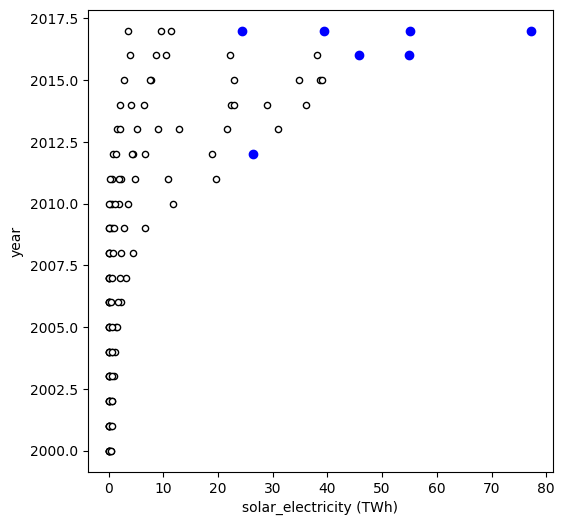

In [101]:
get_iso_forest_outliers(df_project[["solar_electricity", "year"]])

,iso_code,solar_electricity,population
88,JPN,45.761,127763000.0
89,JPN,55.069,127503000.0
121,USA,9.036,316400992.0
122,USA,28.924,318672992.0
123,USA,39.032,320878016.0
124,USA,54.866,323016000.0
125,USA,77.276,325084992.0


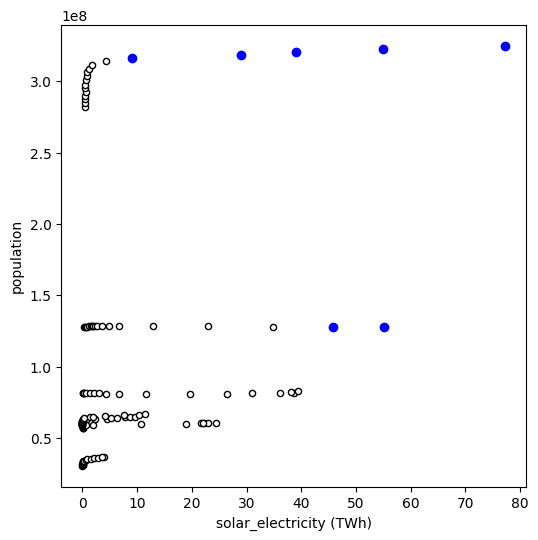

In [102]:
get_iso_forest_outliers(df_project[["solar_electricity", "population"]])

,iso_code,solar_electricity,electricity_generation
88,JPN,45.761,995.365
89,JPN,55.069,992.688
121,USA,9.036,4065.964
122,USA,28.924,4104.839
123,USA,39.032,4091.740
124,USA,54.866,4095.487
125,USA,77.276,4058.261


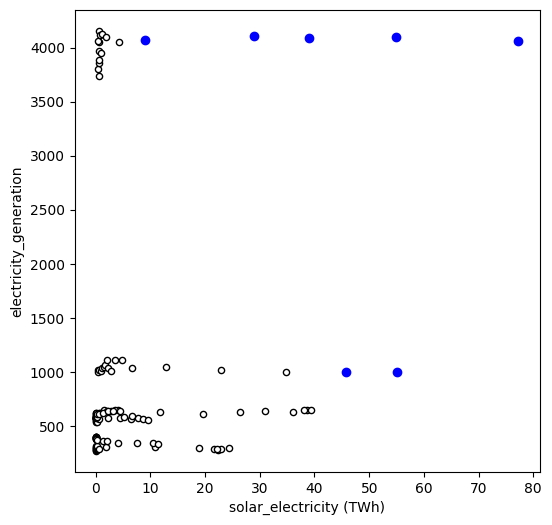

In [103]:
get_iso_forest_outliers(df_project[["solar_electricity", "electricity_generation"]])

,iso_code,solar_electricity,renewables_electricity
88,JPN,45.761,188.028
89,JPN,55.069,208.350
121,USA,9.036,517.392
122,USA,28.924,543.638
123,USA,39.032,553.289
124,USA,54.866,621.571
125,USA,77.276,704.106


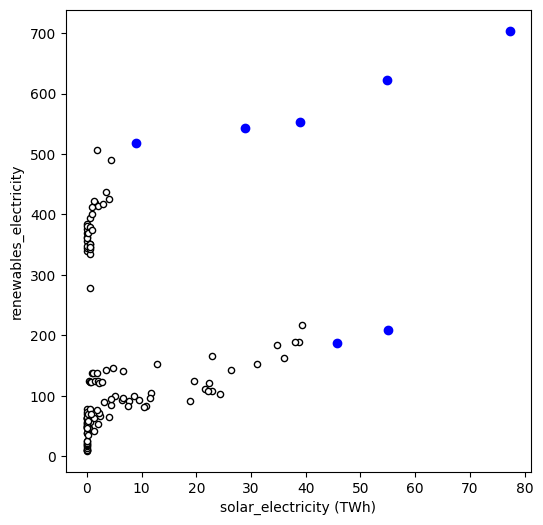

In [104]:
get_iso_forest_outliers(df_project[["solar_electricity", "renewables_electricity"]])

,iso_code,solar_electricity,primary_energy_consumption
88,JPN,45.761,5179.953
89,JPN,55.069,5247.426
120,USA,4.327,24913.288
122,USA,28.924,25848.401
123,USA,39.032,25596.966
124,USA,54.866,25560.520
125,USA,77.276,25647.389


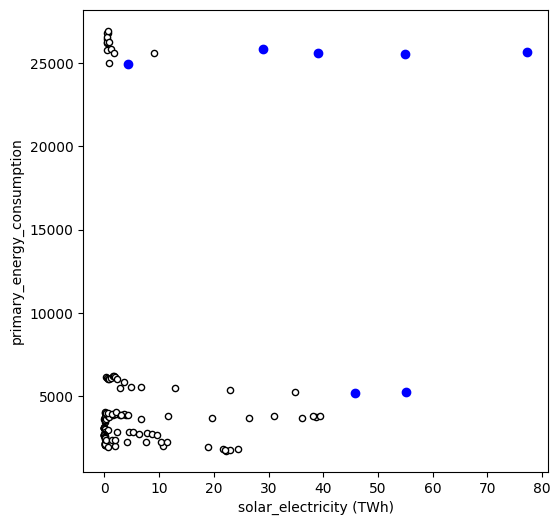

In [105]:
get_iso_forest_outliers(df_project[["solar_electricity", "primary_energy_consumption"]])

,iso_code,solar_electricity,renewables_cons_change_pct
29,FRA,2.334,-16.130
52,DEU,38.100,-0.105
69,ITA,22.942,-10.101
88,JPN,45.761,-8.261
89,JPN,55.069,12.677
124,USA,54.866,10.815
125,USA,77.276,9.936


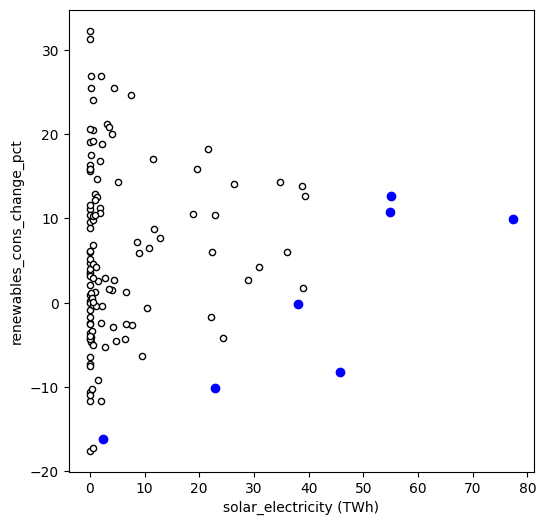

In [106]:
get_iso_forest_outliers(df_project[["solar_electricity", "renewables_cons_change_pct"]])

,iso_code,solar_electricity,renewables_consumption
88,JPN,45.761,357.429
89,JPN,55.069,402.741
121,USA,9.036,1725.846
122,USA,28.924,1772.889
123,USA,39.032,1803.698
124,USA,54.866,1998.776
125,USA,77.276,2197.375


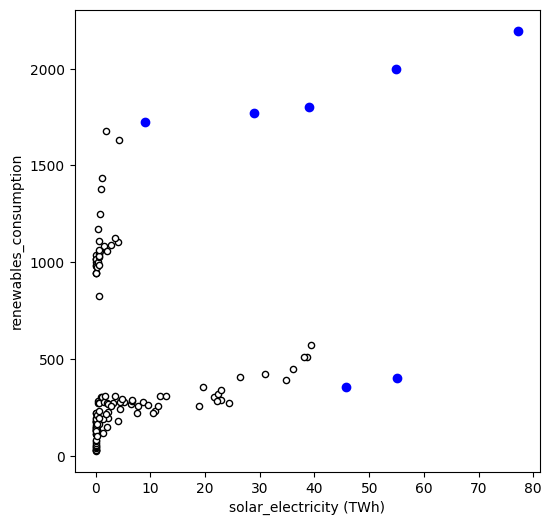

In [107]:
get_iso_forest_outliers(df_project[["solar_electricity", "renewables_consumption"]])

,iso_code,solar_electricity,solar_share_elec
66,ITA,18.862,6.362
71,ITA,24.378,8.311
88,JPN,45.761,4.597
89,JPN,55.069,5.547
123,USA,39.032,0.954
124,USA,54.866,1.340
125,USA,77.276,1.904


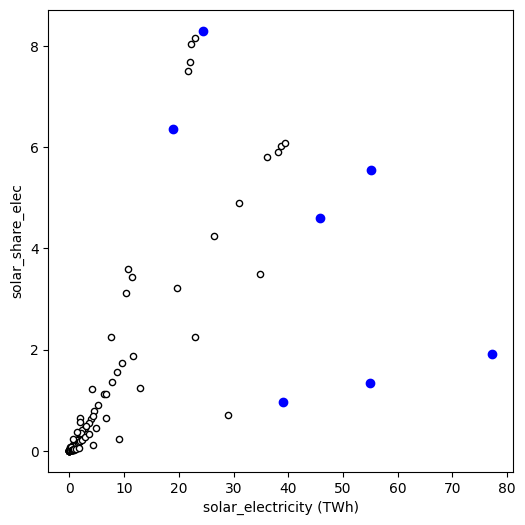

In [108]:
get_iso_forest_outliers(df_project[["solar_electricity", "solar_share_elec"]])

,iso_code,solar_electricity,gdp
88,JPN,45.761,4.600000e+12
89,JPN,55.069,5.262255e+12
121,USA,9.036,1.610000e+13
122,USA,28.924,1.650000e+13
123,USA,39.032,1.690000e+13
124,USA,54.866,1.720000e+13
125,USA,77.276,1.947734e+13


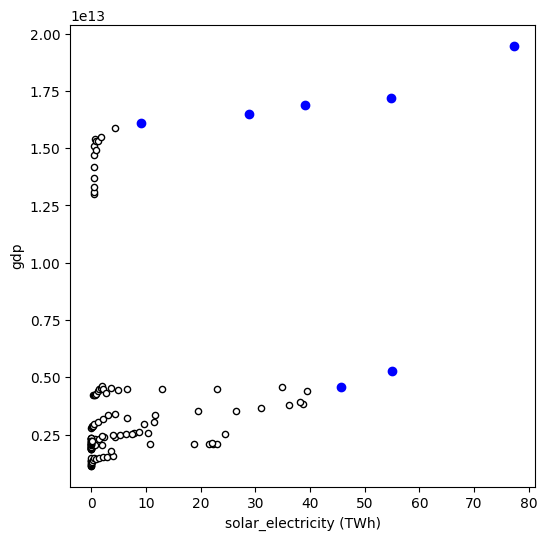

In [109]:
get_iso_forest_outliers(df_project[["solar_electricity", "gdp"]])

In [110]:
get_iso_forest_outliers(df_project.drop(["iso_code", "country"], axis=1))

,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
108,2000,3802.105,2697.273,270.034,753.893,74.819,350.939,0.493,5.593,2.033,93810.546,2.766,625.106,23224.264,9574.610,70.942,1104.832,19.828,3.521,74.967,2204.367,2676.122,7824.923,281711008.0,26427.463,9.230,-10.197,-113.415,998.832,3545.591,0.013,1.300000e+13,0.147,5.725075e+12,9.208286e+10,7.369236e+12,2.026265e+10,1.476697e+10,1.532932e+10
109,2001,3736.644,2688.911,208.138,768.826,63.489,278.906,0.543,6.737,1.970,90665.250,-2.067,-480.145,22744.120,9447.771,71.961,1047.733,20.575,1.319,29.067,2233.434,2701.352,7847.405,284608000.0,25804.055,7.464,-17.253,-172.330,826.501,2904.000,0.015,1.310000e+13,0.180,5.696529e+12,8.853074e+10,7.253600e+12,1.939385e+10,1.441316e+10,1.514923e+10
115,2007,4156.745,3004.469,240.614,806.425,70.176,345.851,0.612,34.450,1.750,89629.957,1.686,390.875,23576.561,9994.640,72.279,1152.276,19.400,1.799,39.858,2254.808,2682.646,7500.825,300608000.0,26943.482,8.320,-5.041,-59.039,1112.113,3699.545,0.015,1.540000e+13,0.829,5.678208e+12,6.446950e+10,7.511501e+12,1.712379e+10,1.046688e+10,1.346022e+10
117,2009,3950.331,2738.380,268.818,798.855,69.501,413.096,0.891,73.886,1.676,81548.356,-6.118,-1394.278,21395.358,8939.955,69.320,1211.951,20.222,-1.524,-34.136,2206.065,2608.011,7202.115,306308000.0,24978.914,10.457,10.362,129.332,1377.491,4497.078,0.023,1.490000e+13,1.870,5.113881e+12,5.613674e+10,6.840698e+12,1.406333e+10,7.235513e+09,1.213588e+10
120,2012,4047.765,2788.811,271.290,769.331,73.185,489.623,4.327,140.822,1.567,79330.565,-2.524,-548.898,21197.905,8880.320,68.898,1258.954,19.006,-3.232,-69.658,2085.908,2449.756,6642.088,314044000.0,24913.288,12.096,-2.878,-48.278,1629.475,5188.684,0.107,1.590000e+13,3.479,4.896492e+12,4.826968e+10,6.670528e+12,1.238718e+10,4.601760e+09,1.197600e+10
124,2016,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494.285,6602.753,323016000.0,25560.520,15.177,10.815,195.077,1998.776,6187.854,1.340,1.720000e+13,5.543,4.836384e+12,4.068281e+10,6.578387e+12,8.987856e+09,2.380070e+09,1.071371e+10
125,2017,4058.261,2549.205,293.839,804.950,78.688,704.106,77.276,254.303,1.317,78894.410,-0.454,-97.226,21331.723,7841.657,62.815,1509.056,19.835,-0.680,-14.505,2118.290,2476.121,6516.112,325084992.0,25647.389,17.350,9.936,198.599,2197.375,6759.386,1.904,1.947734e+13,6.266,4.759788e+12,4.324872e+10,6.561940e+12,8.454801e+09,2.183195e+09,1.132303e+10


### Performing EDA

In [111]:
# filtering out the numeric datatypes
df_project_numeric = df_project.select_dtypes(exclude="object")
df_project_numeric = df_project_numeric.drop("year", axis=1)

In [112]:
# obtaining a statistical summary
df_project_numeric.describe()

,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
count,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,1.260000e+02,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.00000,1.260000e+02,126.000000,1.260000e+02,1.260000e+02,1.260000e+02,1.260000e+02,1.260000e+02,1.260000e+02
mean,1071.019230,649.696651,119.423048,241.535976,27.457159,179.786587,7.358714,25.547683,1.463381,58561.958349,-0.535984,-21.242968,5512.533373,4612.825579,53.785817,421.322603,24.182762,-0.030429,-9.840817,659.292651,2328.295944,6289.352278,1.044581e+08,6677.862341,22.031365,5.572183,17.809127,505.790873,7074.136254,1.10073,4.459745e+12,2.796706,1.286846e+12,1.247083e+10,1.681756e+12,3.525613e+09,1.829129e+09,3.062117e+09
std,1227.976391,900.982408,128.136544,262.543531,24.246813,159.189292,13.728829,44.529014,0.576312,26595.992443,3.269917,225.043948,7008.786658,2386.341912,25.196344,369.336304,23.181872,30.151179,58.445564,724.120912,2101.844149,5573.615566,8.642223e+07,7995.656857,18.469144,10.556254,50.688091,490.207720,9700.675314,2.06971,4.589818e+12,3.354472,1.679900e+12,2.147862e+10,2.235032e+12,5.240826e+09,3.267816e+09,4.099563e+09
min,269.155000,35.569000,3.228000,0.000000,2.986000,9.549000,0.001000,0.048000,0.717000,28650.492000,-11.258000,-1394.278000,1364.758000,554.090000,6.284000,46.865000,0.000000,-100.000000,-375.879000,0.000000,0.000000,0.000000,3.058800e+07,1730.776000,2.497000,-17.551000,-172.330000,26.349000,445.657000,0.00000,1.150000e+12,0.009000,2.989078e+11,1.394759e+09,4.353949e+11,6.691451e+08,1.189245e+08,8.055673e+08
25%,391.702500,151.809250,22.100000,70.338250,8.516750,63.610000,0.032000,2.531000,1.087500,41590.388250,-1.852500,-61.897250,1940.483250,3505.623250,25.845000,124.933500,14.151500,-2.893250,-16.590000,180.474750,1070.434000,2721.582250,5.932525e+07,2667.974750,11.233250,-2.402750,-4.745750,177.258750,2308.608250,0.00800,2.052500e+12,0.361000,4.199984e+11,3.034666e+09,5.604390e+11,1.292786e+09,3.875064e+08,1.169387e+09
50%,589.681000,281.033500,59.693500,97.200000,14.007500,110.447500,0.881500,9.678000,1.280000,47060.487500,-0.060500,-1.889000,2448.320000,4542.899000,62.603000,375.805500,19.412500,0.000000,0.000000,258.109500,2082.026500,5777.731500,6.432350e+07,3655.638500,14.679000,4.244500,15.296000,277.935000,3399.730500,0.09500,2.490000e+12,1.482500,5.380801e+11,3.793140e+09,7.230036e+11,1.583206e+09,6.403705e+08,1.458074e+09
75%,1000.872750,624.676250,252.030500,419.597500,46.502750,343.755750,6.609750,26.670000,1.588000,80582.965750,1.586750,43.495750,4839.446250,4995.855750,72.035250,507.569750,25.778750,1.373500,9.031750,1092.992250,2650.291000,7447.750500,1.278605e+08,5450.116750,24.561500,12.675000,32.870750,968.486000,5008.071500,0.94075,4.367547e+12,4.411750,1.137768e+12,6.287705e+09,1.313706e+12,2.010681e+09,1.200292e+09,1.862168e+09
max,4156.745000,3004.469000,390.641000,806.968000,79.866000,704.106000,77.276000,254.303000,3.094000,116316.445000,7.099000,779.038000,23576.561000,9994.640000,84.774000,1509.056000,79.060000,288.413000,147.026000,2254.808000,7387.582000,20025.228000,3.250850e+08,26943.482000,67.743000,32.2

In [113]:
"""Getting a copy of the project df in order to
carry out feature engineering whilst obtaining
a stastical summary of the newly generated columns"""

df_project_feat_eng = df_project.copy()

In [114]:
df_project_feat_eng["renewables_consumption_per_capita"] = (df_project_feat_eng["renewables_consumption"]/
                                                           df_project_feat_eng["population"])*TWh

df_project_feat_eng["renewables_electricity_per_capita"] = (df_project_feat_eng["renewables_electricity"]/
                                                           df_project_feat_eng["population"])*TWh
df_project_feat_eng["renewables_share_elec_per_capita"] = (df_project_feat_eng["renewables_share_elec"]/
                                                           df_project_feat_eng["population"])*TWh

In [115]:
df_project_feat_eng[["renewables_consumption_per_capita", "iso_code"]].groupby("iso_code").describe()

renewables_consumption_per_capita                              \
                                     count          mean           std   
iso_code                                                                 
CAN                                   18.0  3.049729e+07  9.548190e+05   
DEU                                   18.0  3.692238e+06  1.816934e+06   
FRA                                   18.0  3.483862e+06  5.470771e+05   
GBR                                   18.0  1.538295e+06  1.115178e+06   
ITA                                   18.0  3.390085e+06  1.102851e+06   
JPN                                   18.0  2.383582e+06  3.310226e+05   
USA                                   18.0  4.533596e+06  1.108562e+06   

                                                                                
                   min           25%           50%           75%           max  
iso_code                                                                        
CAN       2.858888e+07  3.010409e+07  3.031760e+07  3.078393e+07  3.323362e+07  
DEU       1.366870e+06  2.084163e+06  3.455504e+06  5.147344e+06  6.928743e+06  
FRA       2.587615e+06  3.024705e+06  3.464239e+06  3.967753e+06  4.356778e+06  
GBR       4.456566e+05  6.745088e+05  1.159145e+06  2.165050e+06  3.868344e+06  
ITA       2.191053e+06  2.385070e+06  3.017261e+06  4.412486e+06  5.291624e+06  
JPN       1.984909e+06  2.132030e+06  2.331385e+06  2.403585e+06  3.158679e+06  
USA       2.903998e+06  3.563796e+06  4.304909e+06  5.437110e+06  6.759386e+06

In [116]:
df_project_feat_eng[["renewables_electricity_per_capita", "iso_code"]].groupby("iso_code").describe()

renewables_electricity_per_capita                               \
                                     count          mean            std   
iso_code                                                                  
CAN                                   18.0  1.140798e+07  346282.106244   
DEU                                   18.0  1.311434e+06  693698.559188   
FRA                                   18.0  1.221655e+06  196443.509528   
GBR                                   18.0  5.517228e+05  418696.136340   
ITA                                   18.0  1.249321e+06  426514.465442   
JPN                                   18.0  1.130014e+06  202473.430733   
USA                                   18.0  1.425816e+06  314565.971371   

                                                                                
                   min           25%           50%           75%           max  
iso_code                                                                        
CAN       1.080377e+07  1.113765e+07  1.145434e+07  1.160669e+07  1.189960e+07  
DEU       4.648592e+05  7.227343e+05  1.173950e+06  1.848976e+06  2.619226e+06  
FRA       9.215478e+05  1.056380e+06  1.181382e+06  1.403719e+06  1.553870e+06  
GBR       1.615080e+05  2.473336e+05  3.766768e+05  7.739768e+05  1.454254e+06  
ITA       8.121979e+05  8.730429e+05  1.079414e+06  1.669180e+06  1.997517e+06  
JPN       9.478057e+05  9.742923e+05  1.074624e+06  1.173410e+06  1.634079e+06  
USA       9.799654e+05  1.191747e+06  1.311095e+06  1.633156e+06  2.165914e+06

In [117]:
df_project_feat_eng[["renewables_share_elec_per_capita", "iso_code"]].groupby("iso_code").describe()

renewables_share_elec_per_capita                               \
                                    count          mean            std   
iso_code                                                                 
CAN                                  18.0  1.877082e+06   51180.747690   
DEU                                  18.0  2.097628e+05  106045.284838   
FRA                                  18.0  2.177900e+05   34590.680913   
GBR                                  18.0  1.560074e+05  128825.302826   
ITA                                  18.0  4.318871e+05  152380.693386   
JPN                                  18.0  1.096520e+05   21778.040839   
USA                                  18.0  3.542068e+04    7334.472929   

                                                                                
                   min           25%           50%           75%           max  
iso_code                                                                        
CAN       1.811419e+06  1.847298e+06  1.867529e+06  1.892922e+06  2.019354e+06  
DEU       8.127664e+04  1.178760e+05  1.917654e+05  2.932436e+05  4.042682e+05  
FRA       1.613384e+05  1.870248e+05  2.147982e+05  2.462216e+05  2.740150e+05  
GBR       4.223327e+04  6.301888e+04  9.952796e+04  2.171007e+05  4.364051e+05  
ITA       2.643835e+05  3.077916e+05  3.799737e+05  5.676483e+05  7.200132e+05  
JPN       8.835432e+04  9.556842e+04  1.016998e+05  1.117248e+05  1.646079e+05  
USA       2.622555e+04  3.002473e+04  3.292999e+04  4.008294e+04  5.337066e+04

In [118]:
# List of renewable energy related columns
corr_cols = df_project_numeric[["primary_energy_consumption", "renewables_electricity",
                               "electricity_generation", "population", "gdp",
                               "renewables_consumption", "renewables_share_elec",
                               "co2_value", "ghg_value", "fossil_electricity",
                               "low_carbon_electricity", "fossil_share_elec"]]


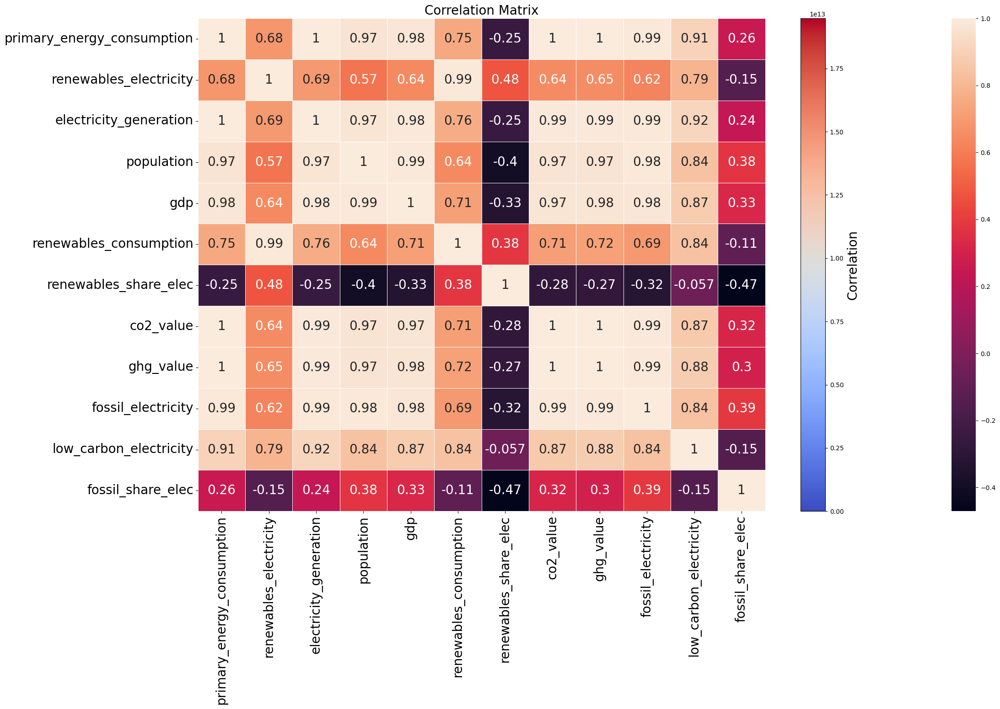

In [119]:
# Obtaining a correlation matrix of the renewable energy related columns
plt.figure(figsize=(25,14))
annot_kws = {'size': 20}
heatmap = sns.heatmap(corr_cols.corr(), annot = True, linewidths=0.5, annot_kws=annot_kws)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Correlation Matrix', fontsize=20)

# Creating a mappable
norm = plt.Normalize(corr_cols.min().min(), corr_cols.max().max())
sm = cm.ScalarMappable(cmap='coolwarm', norm=norm)
sm.set_array([])

# Creating colorbar using the mappable
cbar = plt.colorbar(sm)
cbar.set_label('Correlation', fontsize=20)

# Show the plot
plt.show()

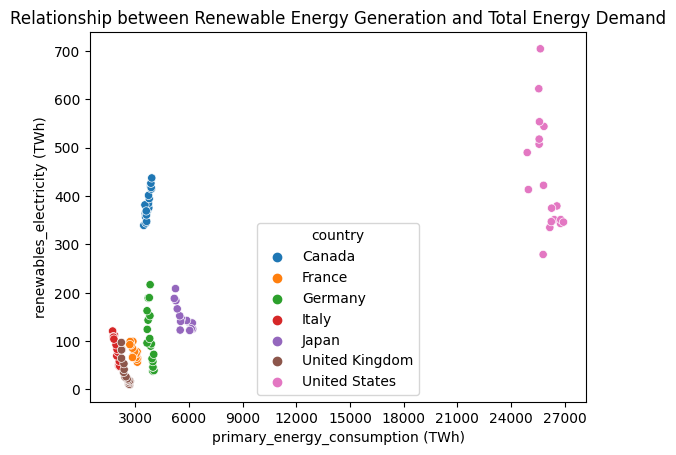

In [120]:
"""Various relationship plots would done for the 
renewable energy related columns whilst pairing most 
with renewables_electricity in order to obtain insights"""

sns.scatterplot(data = df_project, x = "primary_energy_consumption", y ="renewables_electricity", hue = "country")
plt.title("Relationship between Renewable Energy Generation and Total Energy Demand")
plt.xlabel("primary_energy_consumption (TWh)")
plt.ylabel("renewables_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

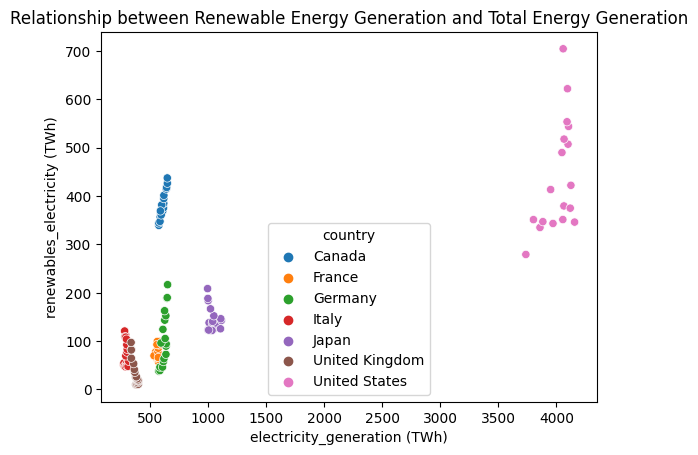

In [121]:
sns.scatterplot(data = df_project, x = "electricity_generation", y ="renewables_electricity", hue = "country")
plt.title("Relationship between Renewable Energy Generation and Total Energy Generation")
plt.xlabel("electricity_generation (TWh)")
plt.ylabel("renewables_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

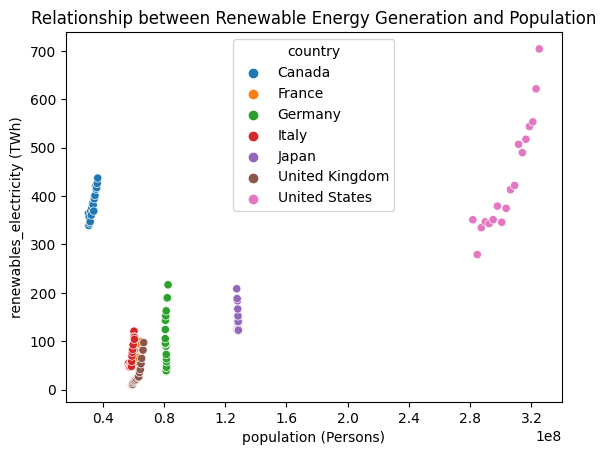

In [122]:
sns.scatterplot(data = df_project, x = "population", y ="renewables_electricity", hue = "country")
plt.title("Relationship between Renewable Energy Generation and Population")
plt.xlabel("population (Persons)")
plt.ylabel("renewables_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

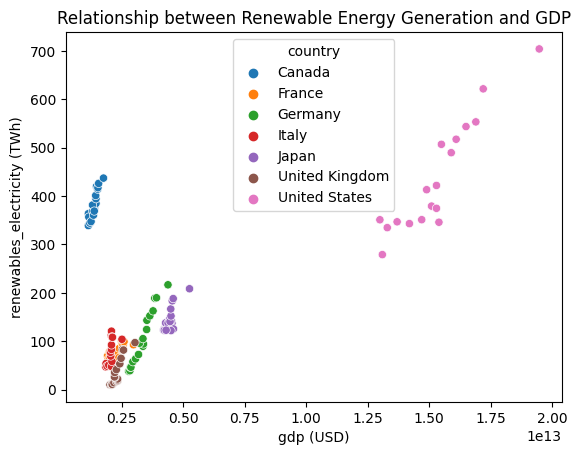

In [123]:
sns.scatterplot(data = df_project, x = "gdp", y ="renewables_electricity", hue = "country")
plt.title("Relationship between Renewable Energy Generation and GDP")
plt.xlabel("gdp (USD)")
plt.ylabel("renewables_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

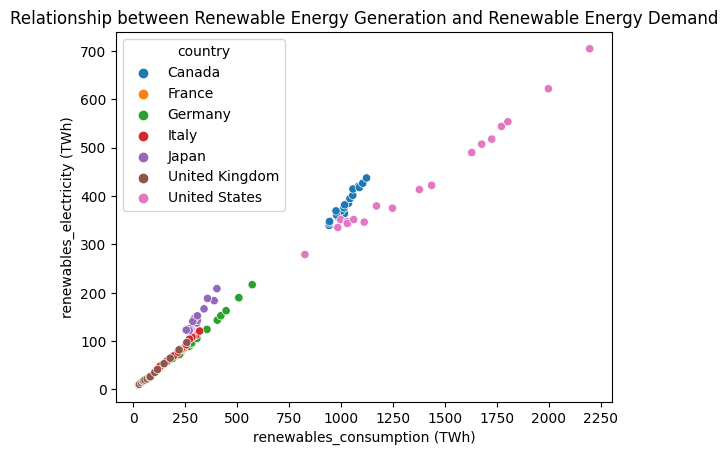

In [124]:
sns.scatterplot(data = df_project, x = "renewables_consumption", y ="renewables_electricity", hue = "country")
plt.title("Relationship between Renewable Energy Generation and Renewable Energy Demand")
plt.xlabel("renewables_consumption (TWh)")
plt.ylabel("renewables_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

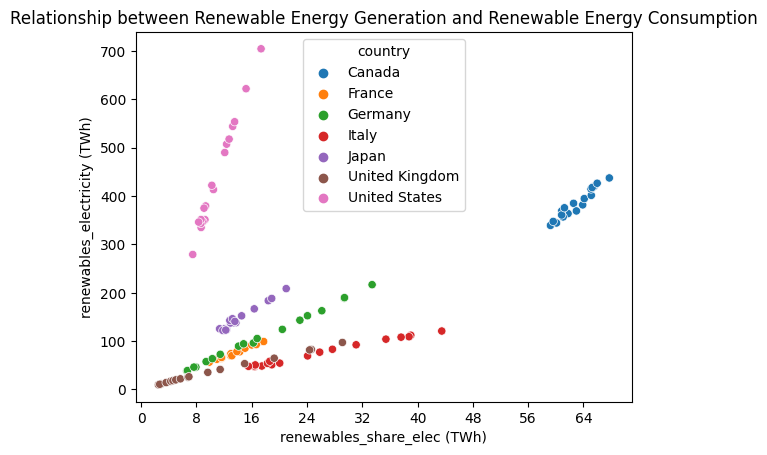

In [125]:
sns.scatterplot(data = df_project, x = "renewables_share_elec", y ="renewables_electricity", hue = "country")
plt.title("Relationship between Renewable Energy Generation and Renewable Energy Consumption")
plt.xlabel("renewables_share_elec (TWh)")
plt.ylabel("renewables_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

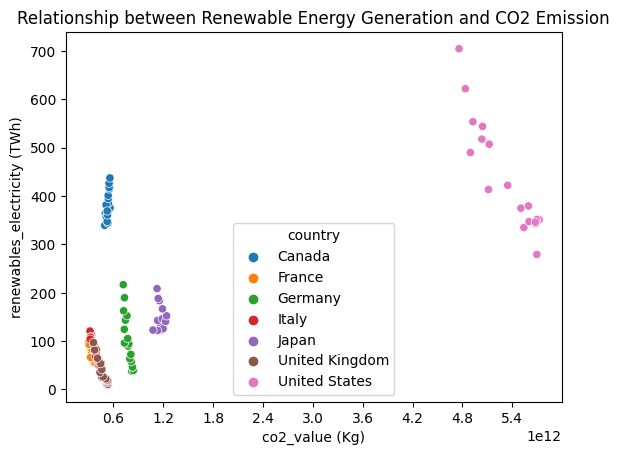

In [126]:
sns.scatterplot(data = df_project, x = "co2_value", y ="renewables_electricity", hue = "country")
plt.title("Relationship between Renewable Energy Generation and CO2 Emission")
plt.xlabel("co2_value (Kg)")
plt.ylabel("renewables_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

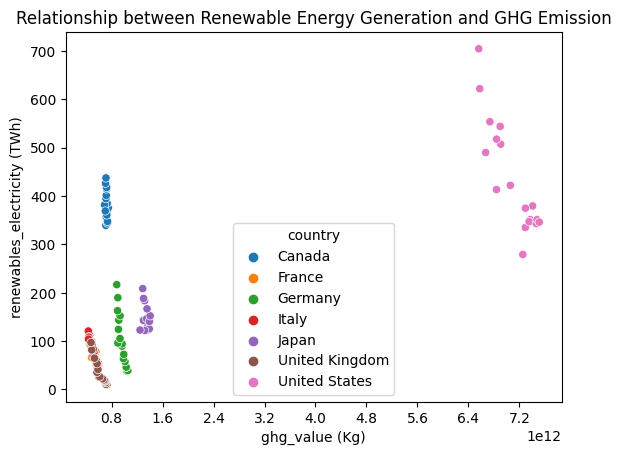

In [127]:
sns.scatterplot(data = df_project, x = "ghg_value", y ="renewables_electricity", hue = "country")
plt.title("Relationship between Renewable Energy Generation and GHG Emission")
plt.xlabel("ghg_value (Kg)")
plt.ylabel("renewables_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

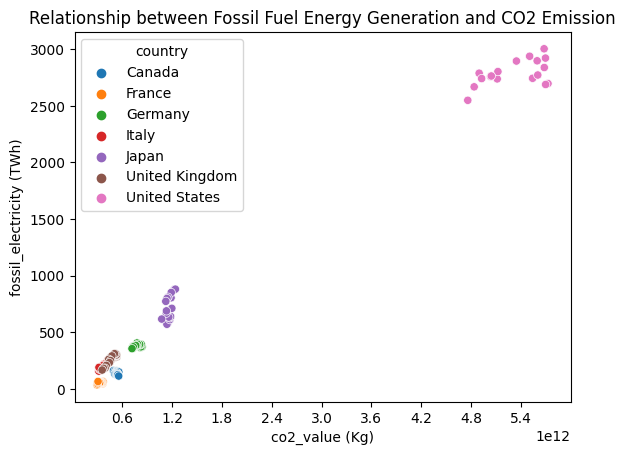

In [128]:
sns.scatterplot(data = df_project, x = "co2_value", y ="fossil_electricity", hue = "country")
plt.title("Relationship between Fossil Fuel Energy Generation and CO2 Emission")
plt.xlabel("co2_value (Kg)")
plt.ylabel("fossil_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

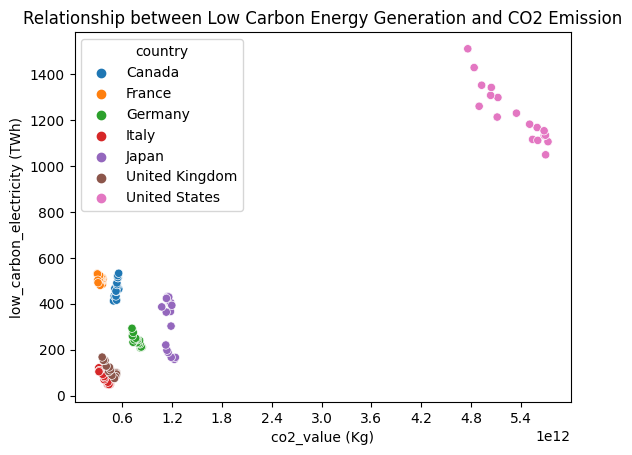

In [129]:
sns.scatterplot(data = df_project, x = "co2_value", y ="low_carbon_electricity", hue = "country")
plt.title("Relationship between Low Carbon Energy Generation and CO2 Emission")
plt.xlabel("co2_value (Kg)")
plt.ylabel("low_carbon_electricity (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

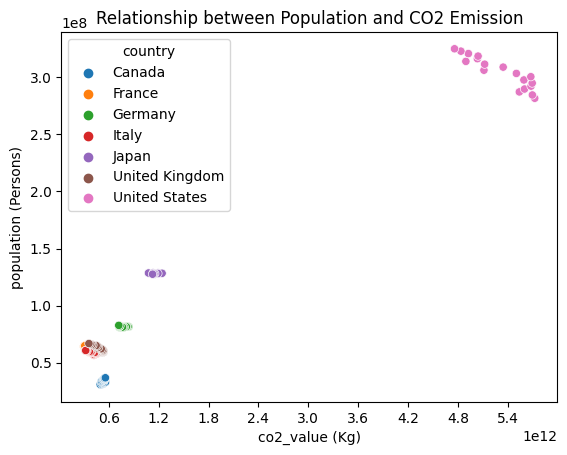

In [130]:
sns.scatterplot(data = df_project, x = "co2_value", y ="population", hue = "country")
plt.title("Relationship between Population and CO2 Emission")
plt.xlabel("co2_value (Kg)")
plt.ylabel("population (Persons)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

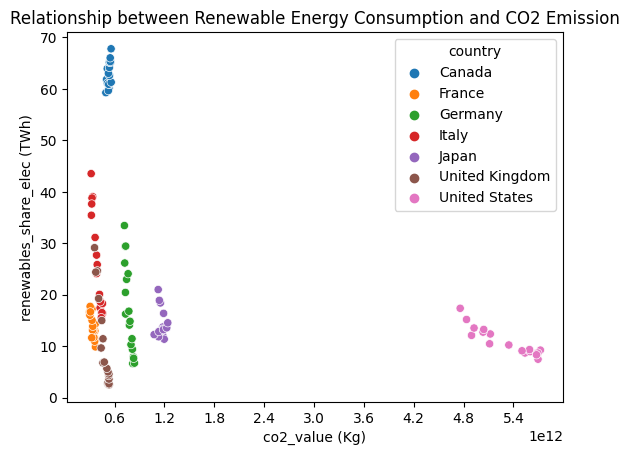

In [131]:
sns.scatterplot(data = df_project, x = "co2_value", y ="renewables_share_elec", hue = "country")
plt.title("Relationship between Renewable Energy Consumption and CO2 Emission")
plt.xlabel("co2_value (Kg)")
plt.ylabel("renewables_share_elec (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

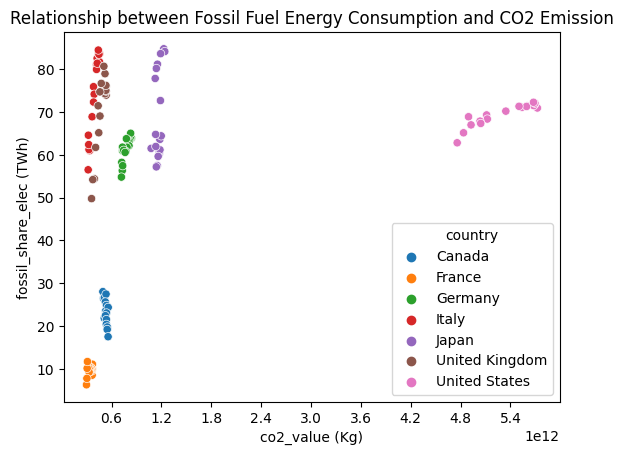

In [132]:
sns.scatterplot(data = df_project, x = "co2_value", y ="fossil_share_elec", hue = "country")
plt.title("Relationship between Fossil Fuel Energy Consumption and CO2 Emission")
plt.xlabel("co2_value (Kg)")
plt.ylabel("fossil_share_elec (TWh)")
ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

In [133]:
# Performing regression analysis to explore the relationships based on the plots
import statsmodels.api as sm

In [134]:
# defining a function for the regression analysis
def get_regression_analysis(independent_var, dependent_var):
    
    # Adding a constant term to the independent variable
    X = sm.add_constant(df_project[independent_var])
    
    # Dependent variable
    y = df_project[dependent_var]

    # Fitting the regression model
    model = sm.OLS(y, X).fit()
    
    # Printing the summary
    print(model.summary())

In [135]:
re_pop_summary_stats = get_regression_analysis("population", "renewables_electricity")
re_pop_summary_stats

                              OLS Regression Results                              
Dep. Variable:     renewables_electricity   R-squared:                       0.328
Model:                                OLS   Adj. R-squared:                  0.323
Method:                     Least Squares   F-statistic:                     60.61
Date:                    Thu, 14 Dec 2023   Prob (F-statistic):           2.36e-12
Time:                            13:43:05   Log-Likelihood:                -792.04
No. Observations:                     126   AIC:                             1588.
Df Residuals:                         124   BIC:                             1594.
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

In [136]:
re_pec_summary_stats = get_regression_analysis("primary_energy_consumption", "renewables_electricity")
re_pec_summary_stats

                              OLS Regression Results                              
Dep. Variable:     renewables_electricity   R-squared:                       0.467
Model:                                OLS   Adj. R-squared:                  0.462
Method:                     Least Squares   F-statistic:                     108.5
Date:                    Thu, 14 Dec 2023   Prob (F-statistic):           1.24e-18
Time:                            13:43:05   Log-Likelihood:                -777.52
No. Observations:                     126   AIC:                             1559.
Df Residuals:                         124   BIC:                             1565.
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

In [137]:
re_rse_summary_stats = get_regression_analysis("renewables_share_elec", "renewables_electricity")
re_rse_summary_stats

                              OLS Regression Results                              
Dep. Variable:     renewables_electricity   R-squared:                       0.226
Model:                                OLS   Adj. R-squared:                  0.220
Method:                     Least Squares   F-statistic:                     36.29
Date:                    Thu, 14 Dec 2023   Prob (F-statistic):           1.80e-08
Time:                            13:43:05   Log-Likelihood:                -800.95
No. Observations:                     126   AIC:                             1606.
Df Residuals:                         124   BIC:                             1612.
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

In [138]:
re_rc_summary_stats = get_regression_analysis("renewables_consumption", "renewables_electricity")
re_rc_summary_stats

                              OLS Regression Results                              
Dep. Variable:     renewables_electricity   R-squared:                       0.975
Model:                                OLS   Adj. R-squared:                  0.975
Method:                     Least Squares   F-statistic:                     4875.
Date:                    Thu, 14 Dec 2023   Prob (F-statistic):          2.10e-101
Time:                            13:43:05   Log-Likelihood:                -584.23
No. Observations:                     126   AIC:                             1172.
Df Residuals:                         124   BIC:                             1178.
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

In [139]:
re_co2_summary_stats = get_regression_analysis("co2_value", "renewables_electricity")
re_co2_summary_stats

                              OLS Regression Results                              
Dep. Variable:     renewables_electricity   R-squared:                       0.416
Model:                                OLS   Adj. R-squared:                  0.411
Method:                     Least Squares   F-statistic:                     88.29
Date:                    Thu, 14 Dec 2023   Prob (F-statistic):           3.65e-16
Time:                            13:43:05   Log-Likelihood:                -783.24
No. Observations:                     126   AIC:                             1570.
Df Residuals:                         124   BIC:                             1576.
Df Model:                               1                                         
Covariance Type:                nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       

In [140]:
fe_co2_summary_stats = get_regression_analysis("co2_value", "fossil_electricity")
fe_co2_summary_stats

                            OLS Regression Results                            
Dep. Variable:     fossil_electricity   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     9353.
Date:                Thu, 14 Dec 2023   Prob (F-statistic):          1.25e-118
Time:                        13:43:05   Log-Likelihood:                -762.34
No. Observations:                 126   AIC:                             1529.
Df Residuals:                     124   BIC:                             1534.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -35.9483     11.630     -3.091      0.0

In [141]:
"""Creating a dictionary to store the project columns and 
their respective units to aid the time series plots to come."""

list_of_df_project_numeric_cols = df_project_numeric.columns.to_list()
list_of_df_project_numeric_cols

['electricity_generation',
 'fossil_electricity',
 'hydro_electricity',
 'nuclear_electricity',
 'other_renewable_electricity',
 'renewables_electricity',
 'solar_electricity',
 'wind_electricity',
 'energy_per_gdp',
 'energy_per_capita',
 'fossil_cons_change_pct',
 'fossil_cons_change_twh',
 'fossil_fuel_consumption',
 'fossil_cons_per_capita',
 'fossil_share_elec',
 'low_carbon_electricity',
 'nuclear_share_elec',
 'nuclear_cons_change_pct',
 'nuclear_cons_change_twh',
 'nuclear_consumption',
 'nuclear_elec_per_capita',
 'nuclear_energy_per_capita',
 'population',
 'primary_energy_consumption',
 'renewables_share_elec',
 'renewables_cons_change_pct',
 'renewables_cons_change_twh',
 'renewables_consumption',
 'renewables_energy_per_capita',
 'solar_share_elec',
 'gdp',
 'wind_share_elec',
 'co2_value',
 'co_value',
 'ghg_value',
 'nox_value',
 'sox_value',
 'voc_value']

In [142]:
list_of_df_project_numeric_cols_unit = ["TWh", "TWh", "TWh", "TWh", "TWh", "TWh", "TWh", "TWh", "KWh",
                                        "KWh", "%", "TWh",
                                       "TWh", "KWh", "TWh", "TWh", "TWh", "%", "TWh", "TWh", "KWh",
                                        "KWh", "Persons", "TWh", "TWh", "%",
                                       "TWh", "TWh", "KWh", "TWh", "USD", "TWh",
                                        "Kg", "Kg", "Kg", "Kg", "Kg", "Kg",]

In [143]:
dict_of_df_project_numeric_cols_and_unit = {col:unit for col,unit
                                            in zip(list_of_df_project_numeric_cols,
                                            list_of_df_project_numeric_cols_unit)}
dict_of_df_project_numeric_cols_and_unit

{'electricity_generation': 'TWh',
 'fossil_electricity': 'TWh',
 'hydro_electricity': 'TWh',
 'nuclear_electricity': 'TWh',
 'other_renewable_electricity': 'TWh',
 'renewables_electricity': 'TWh',
 'solar_electricity': 'TWh',
 'wind_electricity': 'TWh',
 'energy_per_gdp': 'KWh',
 'energy_per_capita': 'KWh',
 'fossil_cons_change_pct': '%',
 'fossil_cons_change_twh': 'TWh',
 'fossil_fuel_consumption': 'TWh',
 'fossil_cons_per_capita': 'KWh',
 'fossil_share_elec': 'TWh',
 'low_carbon_electricity': 'TWh',
 'nuclear_share_elec': 'TWh',
 'nuclear_cons_change_pct': '%',
 'nuclear_cons_change_twh': 'TWh',
 'nuclear_consumption': 'TWh',
 'nuclear_elec_per_capita': 'KWh',
 'nuclear_energy_per_capita': 'KWh',
 'population': 'Persons',
 'primary_energy_consumption': 'TWh',
 'renewables_share_elec': 'TWh',
 'renewables_cons_change_pct': '%',
 'renewables_cons_change_twh': 'TWh',
 'renewables_consumption': 'TWh',
 'renewables_energy_per_capita': 'KWh',
 'solar_share_elec': 'TWh',
 'gdp': 'USD',
 'wi

In [144]:
list_of_countries = df_project["country"].unique().tolist()
list_of_countries

['Canada',
 'France',
 'Germany',
 'Italy',
 'Japan',
 'United Kingdom',
 'United States']

In [145]:
# defining a function to create time series plots
def time_series_plot(column_name, unit, plot_type = "line"):
    
    plt.figure(figsize=(10, 5))

    # Looping through the countries
    for country in list_of_countries:
        df = df_project[df_project["country"] == country]
        if plot_type == "bar":
            plt.bar(df["year"], df[column_name], label=country)
        else:
            plt.plot(df["year"], df[column_name], label=country)

    # Setting the plot labels and title
    plt.xlabel("Year", fontsize=20)
    plt.ylabel(f"{column_name} ({unit})", fontsize=20)
    plt.title(f"{column_name} over time", fontsize=20)  
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)

    # Adding a legend
    plt.legend(fontsize=14)

    # Formating the x-axis labels as integers
    ax = plt.gca()
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    # Showing the plot
    if plot_type == "bar":
        plt.grid(axis='y')
    else:
        plt.grid(True)
    plt.show()

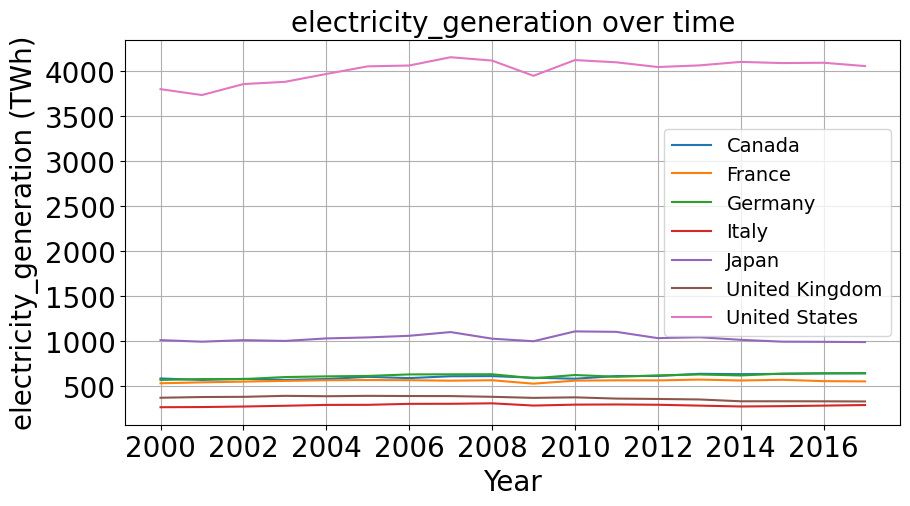

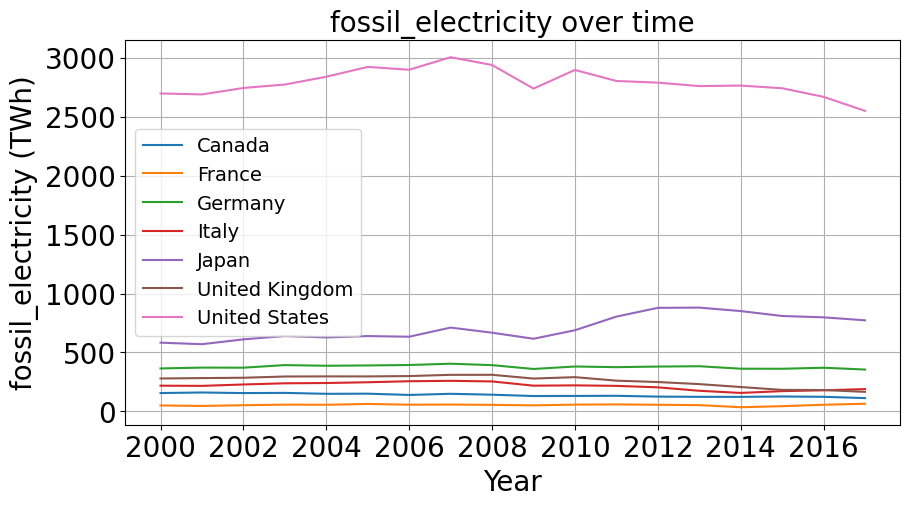

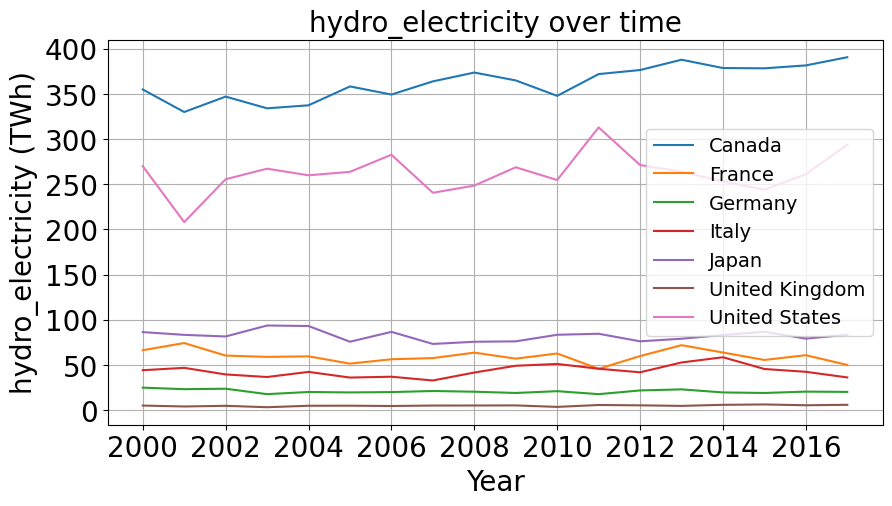

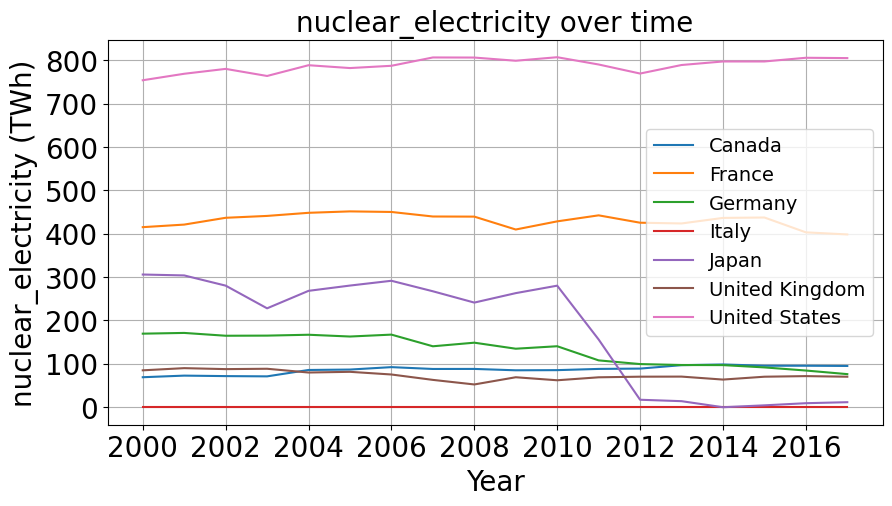

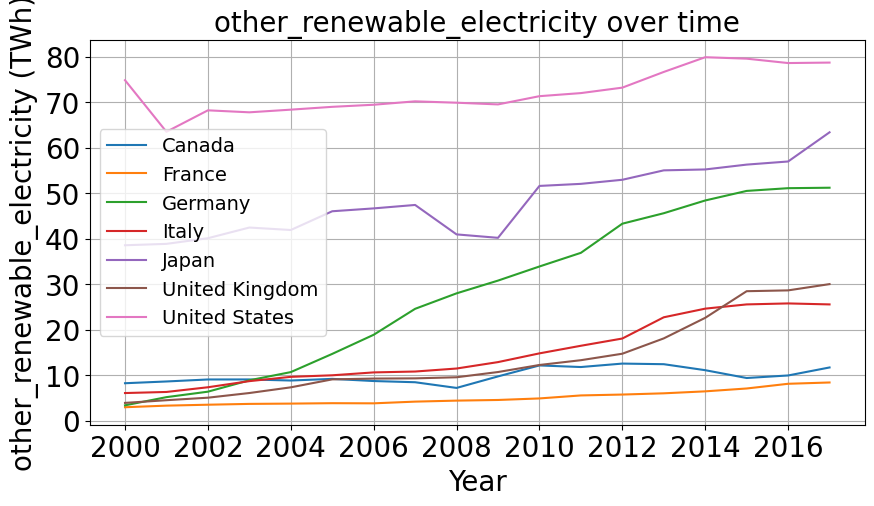

...

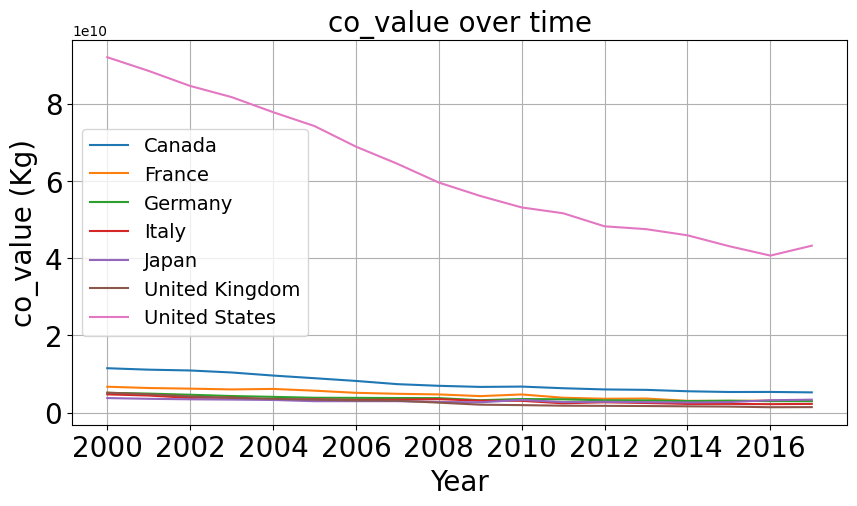

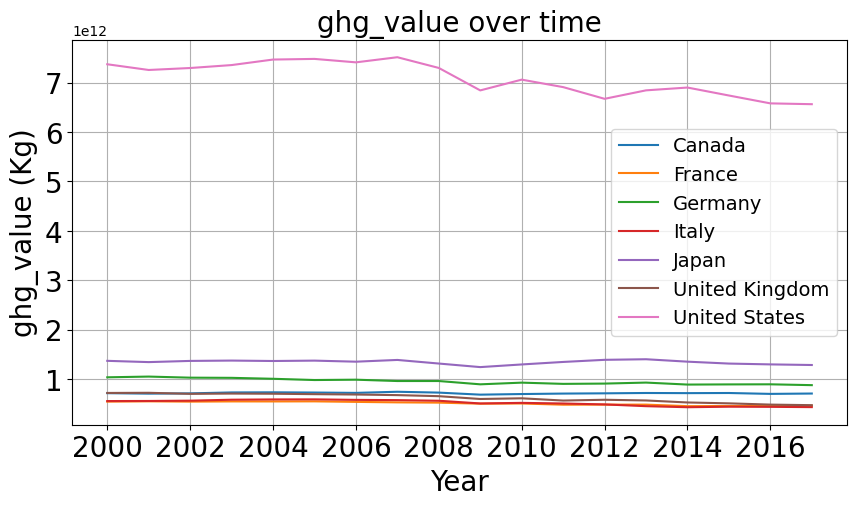

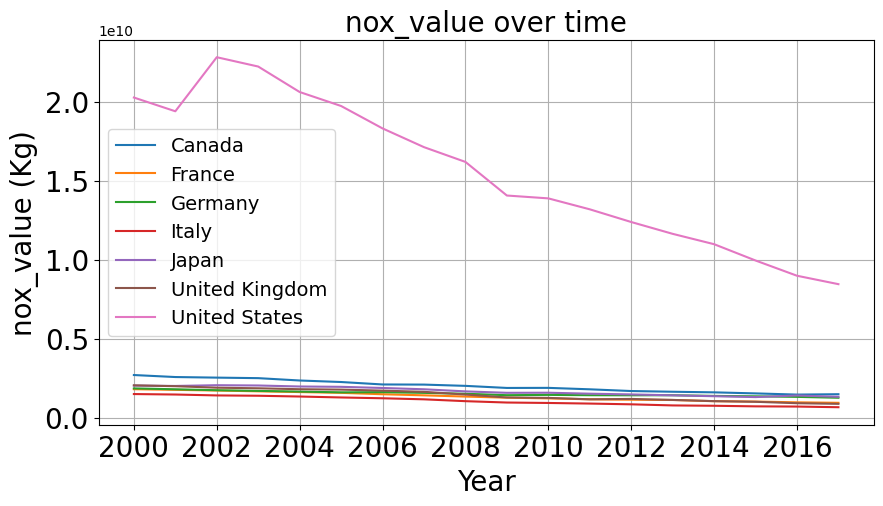

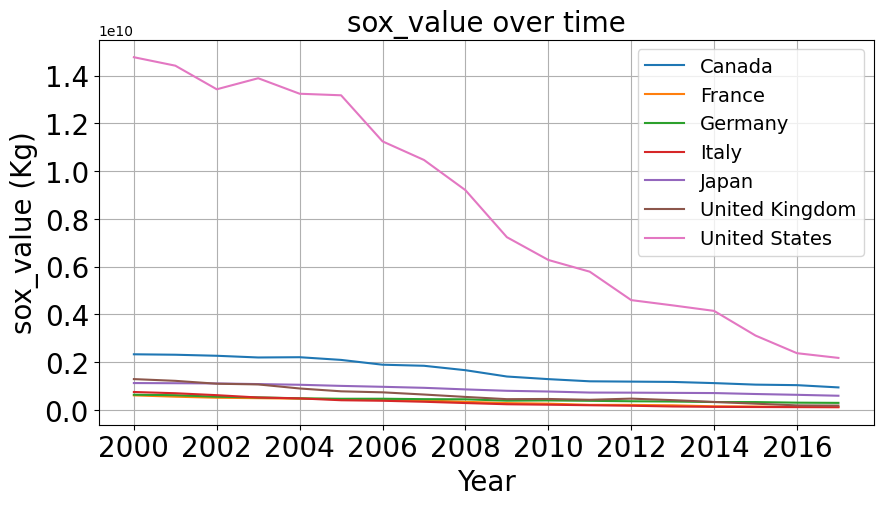

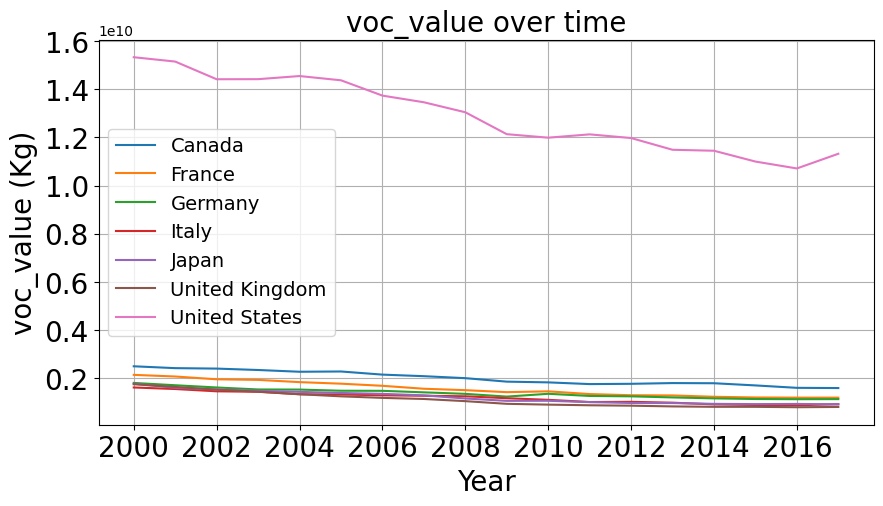

In [146]:
# visualising the time series plots
for col,unit in dict_of_df_project_numeric_cols_and_unit.items():
    if "change" in col:
        time_series_plot(col, unit, "bar")
    else:
        time_series_plot(col, unit)

### Facts and Questions obtained from the analysis

1. In renewable electricity generation, Canada closely follows the USA.

2. Canada takes the lead in hydroelectricity generation from 2000 to 2017, with the USA as the runner-up.

3. Solar electricity generation was minimal or absent among the G7 countries until 2007 when Germany and Japan pioneered it. In 2010, Italy joined the ranks, and by 2013, the USA entered the scene, surpassing all others until 2017, leaving Canada with little to no solar power generation.

4. Wind electricity generation remained minimal in the G7 countries until 2002, when Germany and the USA initiated substantial production. In 2007, the USA outpaced all others by a significant margin, followed by Germany.

5. The USA significantly outperformed other G7 nations in fossil fuel energy generation, with Japan following at a distance.

6. In 2009, none of the G7 countries experienced a percentage increase in energy demand from fossil fuels; instead, they observed decreases. The USA saw a decrease of approximately 5.9%, the UK around 7.5%, and Japan about 11.6%. However, in 2010, there were no percentage decreases, with the USA experiencing an increase of approximately 3.5% and Japan about 6%. What factors contributed to this change?

7. The USA exhibits the highest energy demand from fossil fuels, surpassing all others by a significant margin, with Japan in second place.

8. France boasts the lowest consumption of fossil fuels, closely followed by Canada. The remaining five countries exhibit higher consumption, with notable differences between them and both Canada and France.

9. The USA has experienced the most substantial population growth from 2000 to 2017, surpassing the rest by a wide margin, followed by Japan, Germany, the UK, France, and Italy, which all have similar populations. Canada has the smallest population.

10. The USA has the greatest energy demand, outstripping the other six countries by a considerable margin.

11. Canada leads in electricity consumption from renewable energy, with a significant lead over the others. In contrast, the USA has one of the lowest electricity consumption rates from renewable sources.

12. Why does the USA have such low consumption of renewable energy despite being a major producer?

13. In renewable electricity demand, Canada closely trails the USA.

14. The USA holds the highest GDP, far exceeding all others, while Canada has the lowest GDP.

15. How does Canada, with its smaller population and lower GDP, manage to have such high demand and consumption of renewable energy?

16. The USA surpasses the other six countries by a significant margin in emissions of all six gases, although emissions apart from CO2 and GHG are decreasing significantly.

### Building Machine Learning Models for Predictions

In [147]:
from sklearn.feature_selection import SelectKBest, f_regression, RFE

In [148]:
""" Importing train test split to split the dataset into 
    training and testing sets, and standardscaler
    to rescale the independent variables so that all columns 
    have equal effect when training the model.
    80% of the dataset will be used to train the model 
    while 20% would be used to test the model.
"""

from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
import joblib


In [149]:
# defining a function to carry out feature selection
def feature_selection(target):
    
    df_project_numeric_drp = df_project_numeric.drop(target, axis =1)
    
    # Obtaining the best 25 columns
    selector = SelectKBest(f_regression, k = 25)
    selector.fit(df_project_numeric_drp, df_project_numeric[target])
    
    # Obtaining the features and their scores
    mask = selector.get_support()
    names = selector.feature_names_in_[mask]
    scores = selector.scores_[mask]
    
    return names, scores
    

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24],
 [Text(0, 0, 'electricity_generation'),
  Text(1, 0, 'fossil_electricity'),
  Text(2, 0, 'hydro_electricity'),
  Text(3, 0, 'nuclear_electricity'),
  Text(4, 0, 'other_renewable_electricity'),
  Text(5, 0, 'renewables_electricity'),
  Text(6, 0, 'wind_electricity'),
  Text(7, 0, 'energy_per_gdp'),
  Text(8, 0, 'energy_per_capita'),
  Text(9, 0, 'fossil_fuel_consumption'),
  Text(10, 0, 'fossil_cons_per_capita'),
  Text(11, 0, 'low_carbon_electricity'),
  Text(12, 0, 'nuclear_consumption'),
  Text(13, 0, 'population'),
  Text(14, 0, 'primary_energy_consumption'),
  Text(15, 0, 'renewables_share_elec'),
  Text(16, 0, 'renewables_cons_change_twh'),
  Text(17, 0, 'renewables_energy_per_capita'),
  Text(18, 0, 'gdp'),
  Text(19, 0, 'co2_value'),
  Text(20, 0, 'co_value'),
  Text(21, 0, 'ghg_value'),
  Text(22, 0, 'nox_value'),
  Text(23, 0, 'sox_value'

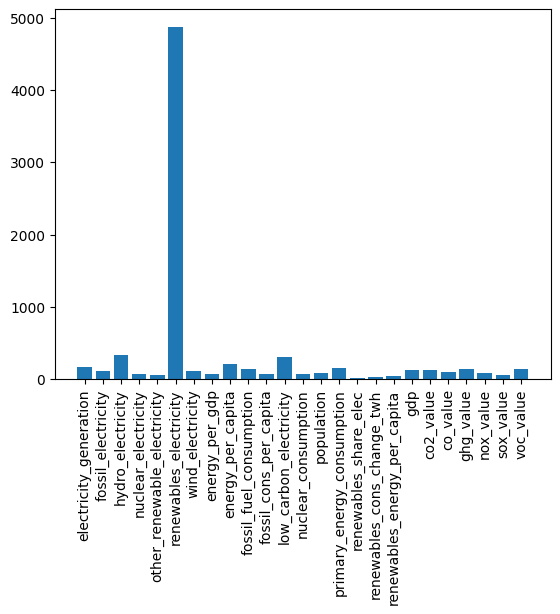

In [150]:
renewables_consumption_best_feat, scores = feature_selection("renewables_consumption")

# Obtaining a bar plot of the best 25 columns
plt.bar(renewables_consumption_best_feat, scores)
plt.xticks(rotation = 90)


In [151]:
algorithms = [Lasso(), Ridge(),
              RandomForestRegressor(),
              GradientBoostingRegressor()]

In [152]:
# defining a function to carry out recursive feauture selection
def recursive_feature_selection(target):
    
    X = df_project_numeric.drop(target, axis =1)
    y = df_project_numeric[target]

    num_features_to_select = 25  # Number of features to select

    # Initializing variables to keep track of the best estimator and its features
    best_estimator = None
    best_selected_features = None
    best_mse = float('inf')

    # Iterating through the list of estimators
    for estimator in algorithms:
        rfe = RFE(estimator, n_features_to_select = num_features_to_select)
        X_new = rfe.fit_transform(X, y) 

        # Training a model with the selected features and evaluating its performance
        selected_X = X.iloc[:, rfe.support_]
        estimator.fit(selected_X, y)
        y_pred = estimator.predict(selected_X)
        mse = mean_squared_error(y, y_pred)

        # Checking if the current estimator is better than the previous best estimator
        if mse < best_mse:
            best_estimator = estimator
            best_selected_features = rfe.support_
            best_mse = mse

    # Printing the selected features for the best estimator
    selected_features = [index for index, value in enumerate(best_selected_features) if value]
    print(f"Selected Features for the Best Estimator ({best_estimator.__class__.__name__}):", selected_features)
    print("")
    
    rfe_best_feat = (X.iloc[:,selected_features]).columns
    
    return rfe_best_feat

In [153]:
renewables_consumption_rfe_best_feat = recursive_feature_selection("renewables_consumption")
renewables_consumption_rfe_best_feat

Selected Features for the Best Estimator (Ridge): [0, 1, 3, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 28, 30]



Index(['electricity_generation', 'fossil_electricity', 'nuclear_electricity',
       'other_renewable_electricity', 'renewables_electricity',
       'solar_electricity', 'wind_electricity', 'energy_per_gdp',
       'fossil_cons_change_pct', 'fossil_fuel_consumption',
       'fossil_cons_per_capita', 'fossil_share_elec', 'low_carbon_electricity',
       'nuclear_share_elec', 'nuclear_cons_change_pct',
       'nuclear_cons_change_twh', 'nuclear_consumption',
       'nuclear_elec_per_capita', 'nuclear_energy_per_capita',
       'primary_energy_consumption', 'renewables_share_elec',
       'renewables_cons_change_pct', 'renewables_cons_change_twh',
       'solar_share_elec', 'wind_share_elec'],
      dtype='object')

In [154]:
"""defining a function to build and train models whilst
looping through the list of algorithms
"""

def get_best_regression_model(independent_var, 
                              target,
                              scaler = StandardScaler()):
    
    # Assigning the independent variable to X and the dependent variable to y
    X = df_project[independent_var]
    y = df_project[target]

    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Scaling the dataset
    scale =  scaler
    scale.fit(X_train)
    X_train_scaled = scale.transform(X_train)
    X_test_scaled = scale.transform(X_test)

    # Converting the scaled attributes to a dataframe
    X_train_scaled = pd.DataFrame(X_train_scaled, columns = X_train.columns) 
    X_test_scaled = pd.DataFrame(X_test_scaled, columns = X_test.columns)
        
    best_model = None
    best_mse = float("inf")  # Initializing with a high value
    best_mae = float("inf")
    best_coef = None
    
    # Fitting a model to the dataset using the regressors
    for algorithm in algorithms:
        
        model = algorithm

        # Training the model using the training sets
        model.fit(X_train_scaled,y_train)

        # Prediciting the target with the testing sets
        target_pred = model.predict(X_test_scaled)

        # Evaluating the performance of the models
        mean_abs = mean_absolute_error(y_test,target_pred)
        test_error = mean_squared_error(y_test,target_pred)
        coeff_of_deter = r2_score(y_test,target_pred)
        
        if test_error < best_mse and mean_abs < best_mae:
            
            best_mse = test_error
            best_mae = mean_abs
            best_coef = coeff_of_deter
            best_model = model
            
    # Evaluating the best model on the training data in order to check for overfitting 
    train_pred = best_model.predict(X_train_scaled)
    train_error = mean_squared_error(y_train, train_pred)
    
    error_diff = abs(train_error - best_mse)
            
            
    # Printing the results 
    print(f"The mean absolute error is: {best_mae}")
    print(f"The mean squared error is : {best_mse}")
    print(f"The root mean squared error is : {np.sqrt(best_mse)}")
    print(f"The coefficient of determination is: {best_coef}")
    print("")
    print("**********************************************")
    print("")
    
    if error_diff < 0.05:
        print(f"{error_diff:.2f} is less than 0.05, the model is not overfitting")
    else:
        print(f"{error_diff:.2f} is more than 0.05, the model is overfitting")


    return best_model



In [155]:
renewables_consumption_best_model = get_best_regression_model(renewables_consumption_best_feat,
                                                              "renewables_consumption")
renewables_consumption_best_model

The mean absolute error is: 13.004437521049624
The mean squared error is : 343.7332503016244
The root mean squared error is : 18.54004450646288
The coefficient of determination is: 0.9977855353188984

**********************************************

60.49 is more than 0.05, the model is overfitting


Ridge()

In [156]:
# defining a function to predict the unseen data with the obtained models
def predict_unseen_data(df,independent_var, model, target_name = str, feat_type = None):
    
    unseen_data = df[independent_var]
    
    scale = StandardScaler()
    scaled_unseen_data = scale.fit_transform(unseen_data)
    
    scaled_unseen_data = pd.DataFrame(scaled_unseen_data, columns = unseen_data.columns) 
    
    predicitons = model.predict(scaled_unseen_data)
    
    if feat_type == "rfe":
        df[target_name+"_rfe_pred"] = predicitons
    else:
        df[target_name+"_pred"] = predicitons


In [157]:
predict_unseen_data(df_2018_2019, 
                    renewables_consumption_best_feat, 
                    renewables_consumption_best_model,
                    "renewables_consumption")

In [158]:
renewables_consumption_rfe_best_model = get_best_regression_model(renewables_consumption_rfe_best_feat,
                                                                  "renewables_consumption")
renewables_consumption_rfe_best_model

The mean absolute error is: 14.998782969175606
The mean squared error is : 485.99000181174785
The root mean squared error is : 22.045180920367784
The coefficient of determination is: 0.9968690614206327

**********************************************

142.73 is more than 0.05, the model is overfitting


Ridge()

In [159]:
predict_unseen_data(df_2018_2019, 
                    renewables_consumption_rfe_best_feat, 
                    renewables_consumption_rfe_best_model,
                    "renewables_consumption", "rfe")

In [160]:
df_2018_2019[["iso_code", "year", "renewables_consumption",
         "renewables_consumption_pred",
         "renewables_consumption_rfe_pred"]]

,iso_code,year,renewables_consumption,renewables_consumption_pred,renewables_consumption_rfe_pred
0,CAN,2018,1098.915,898.358871,886.811805
1,CAN,2019,1091.247,899.852365,885.489354
2,FRA,2018,308.631,186.145156,149.526365
3,FRA,2019,315.467,171.752205,122.707226
4,DEU,2018,591.822,382.463570,405.972581
5,DEU,2019,638.183,445.997448,477.007195
6,ITA,2018,296.093,193.160000,190.983865
7,ITA,2019,288.399,183.838206,181.103050
8,JPN,2018,441.828,231.541198,246.778029
9,JPN,2019,483.082,248.966426,259.029279


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24],
 [Text(0, 0, 'electricity_generation'),
  Text(1, 0, 'fossil_electricity'),
  Text(2, 0, 'hydro_electricity'),
  Text(3, 0, 'nuclear_electricity'),
  Text(4, 0, 'other_renewable_electricity'),
  Text(5, 0, 'wind_electricity'),
  Text(6, 0, 'energy_per_gdp'),
  Text(7, 0, 'energy_per_capita'),
  Text(8, 0, 'fossil_fuel_consumption'),
  Text(9, 0, 'fossil_cons_per_capita'),
  Text(10, 0, 'low_carbon_electricity'),
  Text(11, 0, 'nuclear_consumption'),
  Text(12, 0, 'population'),
  Text(13, 0, 'primary_energy_consumption'),
  Text(14, 0, 'renewables_share_elec'),
  Text(15, 0, 'renewables_cons_change_twh'),
  Text(16, 0, 'renewables_consumption'),
  Text(17, 0, 'renewables_energy_per_capita'),
  Text(18, 0, 'gdp'),
  Text(19, 0, 'co2_value'),
  Text(20, 0, 'co_value'),
  Text(21, 0, 'ghg_value'),
  Text(22, 0, 'nox_value'),
  Text(23, 0, 'sox_value'

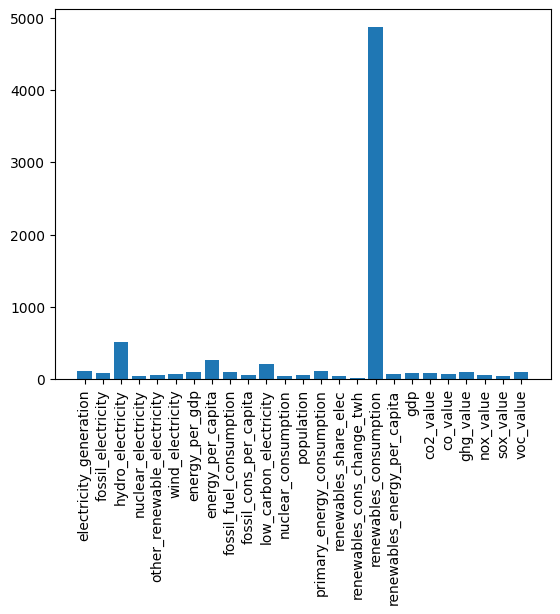

In [161]:
renewables_electricity_best_feat, scores = feature_selection("renewables_electricity")

# Obtaining a bar plot of the best 25 columns
plt.bar(renewables_electricity_best_feat, scores)
plt.xticks(rotation = 90)


In [162]:
renewables_electricity_rfe_best_feat = recursive_feature_selection("renewables_electricity")
renewables_electricity_rfe_best_feat

Selected Features for the Best Estimator (Ridge): [0, 1, 2, 3, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 25, 26, 28, 30]



Index(['electricity_generation', 'fossil_electricity', 'hydro_electricity',
       'nuclear_electricity', 'other_renewable_electricity',
       'solar_electricity', 'wind_electricity', 'energy_per_gdp',
       'fossil_cons_change_pct', 'fossil_fuel_consumption',
       'fossil_cons_per_capita', 'fossil_share_elec', 'low_carbon_electricity',
       'nuclear_share_elec', 'nuclear_cons_change_twh', 'nuclear_consumption',
       'nuclear_elec_per_capita', 'nuclear_energy_per_capita',
       'primary_energy_consumption', 'renewables_share_elec',
       'renewables_cons_change_pct', 'renewables_cons_change_twh',
       'renewables_consumption', 'solar_share_elec', 'wind_share_elec'],
      dtype='object')

In [163]:
renewables_electricity_best_model = get_best_regression_model(renewables_electricity_best_feat,
                                                              "renewables_electricity")
renewables_electricity_best_model

The mean absolute error is: 4.3582914522275775
The mean squared error is : 43.00906929898065
The root mean squared error is : 6.5581300154068805
The coefficient of determination is: 0.9975070835662848

**********************************************

33.61 is more than 0.05, the model is overfitting


Lasso()

In [164]:
predict_unseen_data(df_2018_2019, 
                    renewables_electricity_best_feat, 
                    renewables_electricity_best_model,
                    "renewables_electricity")

In [165]:
renewables_electricity_rfe_best_model = get_best_regression_model(renewables_electricity_rfe_best_feat,
                                                                  "renewables_electricity")
renewables_electricity_rfe_best_model

The mean absolute error is: 3.440205150461546
The mean squared error is : 15.37759942351946
The root mean squared error is : 3.921428237711288
The coefficient of determination is: 0.9991086747297996

**********************************************

2.21 is more than 0.05, the model is overfitting


Lasso()

In [166]:
predict_unseen_data(df_2018_2019, 
                    renewables_electricity_rfe_best_feat, 
                    renewables_electricity_rfe_best_model,
                    "renewables_electricity", "rfe")

In [167]:
df_2018_2019[["iso_code", "year", "renewables_electricity",
         "renewables_electricity_pred",
         "renewables_electricity_rfe_pred"]]

,iso_code,year,renewables_electricity,renewables_electricity_pred,renewables_electricity_rfe_pred
0,CAN,2018,429.615,336.732587,345.524956
1,CAN,2019,423.820,333.128527,341.617291
2,FRA,2018,113.397,57.561642,63.408335
3,FRA,2019,112.397,55.309277,60.717661
4,DEU,2018,224.900,137.699983,121.402508
5,DEU,2019,242.400,149.989993,130.602151
6,ITA,2018,114.402,73.706067,66.159493
7,ITA,2019,117.079,72.581472,65.993857
8,JPN,2018,216.343,134.555941,142.319040
9,JPN,2019,225.538,136.703448,147.789184


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24],
 [Text(0, 0, 'electricity_generation'),
  Text(1, 0, 'fossil_electricity'),
  Text(2, 0, 'hydro_electricity'),
  Text(3, 0, 'nuclear_electricity'),
  Text(4, 0, 'other_renewable_electricity'),
  Text(5, 0, 'renewables_electricity'),
  Text(6, 0, 'energy_per_gdp'),
  Text(7, 0, 'energy_per_capita'),
  Text(8, 0, 'fossil_fuel_consumption'),
  Text(9, 0, 'fossil_cons_per_capita'),
  Text(10, 0, 'fossil_share_elec'),
  Text(11, 0, 'nuclear_share_elec'),
  Text(12, 0, 'nuclear_consumption'),
  Text(13, 0, 'population'),
  Text(14, 0, 'primary_energy_consumption'),
  Text(15, 0, 'renewables_cons_change_pct'),
  Text(16, 0, 'renewables_consumption'),
  Text(17, 0, 'renewables_energy_per_capita'),
  Text(18, 0, 'solar_share_elec'),
  Text(19, 0, 'gdp'),
  Text(20, 0, 'co2_value'),
  Text(21, 0, 'co_value'),
  Text(22, 0, 'ghg_value'),
  Text(23, 0, 'nox_v

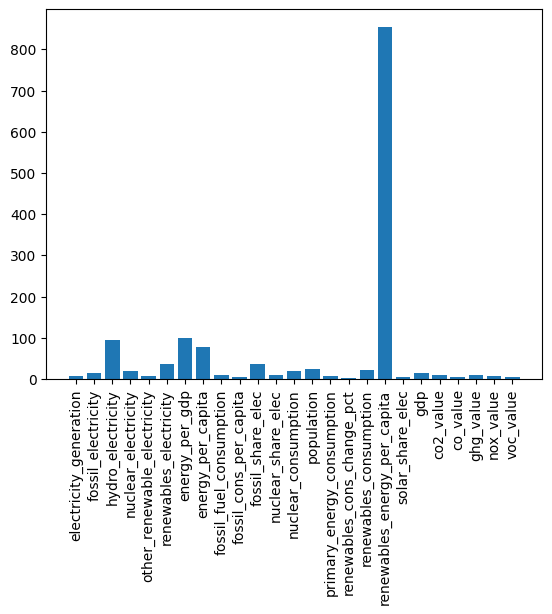

In [168]:
renewables_share_elec_best_feat, scores = feature_selection("renewables_share_elec")

# Obtaining a bar plot of the best 25 columns
plt.bar(renewables_share_elec_best_feat, scores)
plt.xticks(rotation = 90)


In [169]:
renewables_share_elec_rfe_best_feat = recursive_feature_selection("renewables_share_elec")
renewables_share_elec_rfe_best_feat

Selected Features for the Best Estimator (Ridge): [0, 1, 2, 3, 4, 5, 6, 7, 8, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 28, 30]



Index(['electricity_generation', 'fossil_electricity', 'hydro_electricity',
       'nuclear_electricity', 'other_renewable_electricity',
       'renewables_electricity', 'solar_electricity', 'wind_electricity',
       'energy_per_gdp', 'fossil_fuel_consumption', 'fossil_cons_per_capita',
       'fossil_share_elec', 'low_carbon_electricity', 'nuclear_share_elec',
       'nuclear_cons_change_pct', 'nuclear_cons_change_twh',
       'nuclear_consumption', 'nuclear_elec_per_capita',
       'nuclear_energy_per_capita', 'primary_energy_consumption',
       'renewables_cons_change_pct', 'renewables_cons_change_twh',
       'renewables_consumption', 'solar_share_elec', 'wind_share_elec'],
      dtype='object')

In [170]:
renewables_share_elec_best_model = get_best_regression_model(renewables_share_elec_best_feat,
                                                              "renewables_share_elec")
renewables_share_elec_best_model

The mean absolute error is: 0.8873877541501989
The mean squared error is : 1.2640252503364773
The root mean squared error is : 1.1242887753315325
The coefficient of determination is: 0.9964600324458689

**********************************************

0.02 is less than 0.05, the model is not overfitting


Ridge()

In [171]:
predict_unseen_data(df_2018_2019, 
                    renewables_share_elec_best_feat, 
                    renewables_share_elec_best_model,
                    "renewables_share_elec")

In [172]:
renewables_share_elec_rfe_best_model = get_best_regression_model(renewables_share_elec_rfe_best_feat,
                                                                  "renewables_share_elec")
renewables_share_elec_rfe_best_model

The mean absolute error is: 0.9817717515791362
The mean squared error is : 1.4323934580818372
The root mean squared error is : 1.1968264110061397
The coefficient of determination is: 0.9959885086433127

**********************************************

0.14 is more than 0.05, the model is overfitting


Ridge()

In [173]:
predict_unseen_data(df_2018_2019, 
                    renewables_share_elec_rfe_best_feat, 
                    renewables_share_elec_rfe_best_model,
                    "renewables_share_elec", "rfe")

In [174]:
df_2018_2019[["iso_code", "year", "renewables_share_elec", 
         "renewables_share_elec_pred", 
         "renewables_share_elec_rfe_pred"]]

,iso_code,year,renewables_share_elec,renewables_share_elec_pred,renewables_share_elec_rfe_pred
0,CAN,2018,67.420,58.651538,56.765713
1,CAN,2019,67.018,57.992474,55.781332
2,FRA,2018,19.688,8.645520,8.631720
3,FRA,2019,19.894,8.788661,9.208327
4,DEU,2018,35.284,21.389087,21.387236
5,DEU,2019,40.139,25.337821,25.357048
6,ITA,2018,39.809,25.072562,25.890829
7,ITA,2019,40.351,25.490320,26.983185
8,JPN,2018,21.898,11.795502,11.430682
9,JPN,2019,23.681,14.608287,14.836330


In [175]:
# list of gas emissions features
gas_emissions_feat = ["electricity_generation", "renewables_electricity", "hydro_electricity",
                      "nuclear_electricity", "other_renewable_electricity", "population", "gdp",
                     "solar_electricity", "wind_electricity", "energy_per_gdp", "energy_per_capita",
                     "nuclear_share_elec", "low_carbon_electricity", "nuclear_consumption", 
                      "primary_energy_consumption", "renewables_share_elec", "renewables_consumption",
                     "solar_share_elec", "wind_share_elec"]

len(gas_emissions_feat)

19

In [176]:
co2_value_best_model = get_best_regression_model(gas_emissions_feat, "co2_value")
co2_value_best_model

The mean absolute error is: 23696523137.39304
The mean squared error is : 8.149788028567392e+20
The root mean squared error is : 28547833593.054646
The coefficient of determination is: 0.9994988810407948

**********************************************

810213442940201074688.00 is more than 0.05, the model is overfitting


Lasso()

In [177]:
predict_unseen_data(df_2018_2019, 
                    gas_emissions_feat, 
                    co2_value_best_model,
                    "co2_value")

In [178]:
df_2018_2019[["iso_code", "year", "co2_value", 
         "co2_value_pred"]]

,iso_code,year,co2_value,co2_value_pred
0,CAN,2018,5.700610e+11,9.848769e+11
1,CAN,2019,5.568742e+11,9.635227e+11
2,FRA,2018,2.987066e+11,3.907020e+11
3,FRA,2019,2.922987e+11,3.748013e+11
4,DEU,2018,6.947505e+11,7.652928e+11
5,DEU,2019,6.456323e+11,7.263637e+11
6,ITA,2018,3.173492e+11,4.375694e+11
7,ITA,2019,3.093966e+11,4.529404e+11
8,JPN,2018,1.087502e+12,1.178062e+12
9,JPN,2019,1.051673e+12,1.117667e+12


In [179]:
co_value_best_model = get_best_regression_model(gas_emissions_feat, "co_value")
co_value_best_model

The mean absolute error is: 485181291.0560154
The mean squared error is : 1.6909605560639132e+18
The root mean squared error is : 1300369392.1589792
The coefficient of determination is: 0.9917953033310256

**********************************************

1251181914180957184.00 is more than 0.05, the model is overfitting


RandomForestRegressor()

In [180]:
predict_unseen_data(df_2018_2019, 
                    gas_emissions_feat, 
                    co_value_best_model,
                    "co_value")

In [181]:
df_2018_2019[["iso_code", "year", "co_value", 
         "co_value_pred"]]

,iso_code,year,co_value,co_value_pred
0,CAN,2018,5.115945e+09,7.226721e+09
1,CAN,2019,4.989458e+09,6.817788e+09
2,FRA,2018,2.873289e+09,4.491847e+09
3,FRA,2019,2.813139e+09,4.365776e+09
4,DEU,2018,2.852871e+09,4.033632e+09
5,DEU,2019,2.747635e+09,3.535453e+09
6,ITA,2018,2.057980e+09,3.099998e+09
7,ITA,2019,2.075944e+09,2.980938e+09
8,JPN,2018,3.250212e+09,3.139538e+09
9,JPN,2019,3.187037e+09,3.126876e+09


In [182]:
ghg_value_best_model = get_best_regression_model(gas_emissions_feat, "ghg_value")
ghg_value_best_model

The mean absolute error is: 32204036912.88392
The mean squared error is : 1.5986998015390256e+21
The root mean squared error is : 39983744216.106445
The coefficient of determination is: 0.999441542914586

**********************************************

579089445841874976768.00 is more than 0.05, the model is overfitting


Lasso()

In [183]:
predict_unseen_data(df_2018_2019, 
                    gas_emissions_feat, 
                    ghg_value_best_model,
                    "ghg_value")

In [184]:
df_2018_2019[["iso_code", "year", "ghg_value", 
         "ghg_value_pred"]]

,iso_code,year,ghg_value,ghg_value_pred
0,CAN,2018,7.246224e+11,1.257036e+12
1,CAN,2019,7.236733e+11,1.235986e+12
2,FRA,2018,4.470530e+11,5.814218e+11
3,FRA,2019,4.376398e+11,5.741540e+11
4,DEU,2018,8.461365e+11,9.579780e+11
5,DEU,2019,7.946179e+11,9.226520e+11
6,ITA,2018,4.336308e+11,6.001515e+11
7,ITA,2019,4.222846e+11,6.201149e+11
8,JPN,2018,1.245684e+12,1.349334e+12
9,JPN,2019,1.211512e+12,1.294205e+12


In [185]:
nox_value_best_model = get_best_regression_model(gas_emissions_feat, "nox_value")
nox_value_best_model

The mean absolute error is: 99190296.0415166
The mean squared error is : 2.2734002406967036e+16
The root mean squared error is : 150777990.45937386
The coefficient of determination is: 0.9982595177113345

**********************************************

22481047235757356.00 is more than 0.05, the model is overfitting


GradientBoostingRegressor()

In [186]:
predict_unseen_data(df_2018_2019, 
                    gas_emissions_feat, 
                    nox_value_best_model,
                    "nox_value")

In [187]:
df_2018_2019[["iso_code", "year", "nox_value", 
         "nox_value_pred"]]

,iso_code,year,nox_value,nox_value_pred
0,CAN,2018,1.455731e+09,1.786261e+09
1,CAN,2019,1.434938e+09,1.808416e+09
2,FRA,2018,8.930991e+08,1.687472e+09
3,FRA,2019,8.401903e+08,1.516786e+09
4,DEU,2018,1.180413e+09,1.507341e+09
5,DEU,2019,1.095913e+09,1.481893e+09
6,ITA,2018,6.724211e+08,1.126020e+09
7,ITA,2019,6.560642e+08,1.100426e+09
8,JPN,2018,1.246318e+09,1.931318e+09
9,JPN,2019,1.165952e+09,1.888682e+09


In [188]:
sox_value_best_model = get_best_regression_model(gas_emissions_feat, "sox_value")
sox_value_best_model

The mean absolute error is: 109271686.95088767
The mean squared error is : 2.8882097224830656e+16
The root mean squared error is : 169947336.62176248
The coefficient of determination is: 0.9931770936946066

**********************************************

28703763104825848.00 is more than 0.05, the model is overfitting


GradientBoostingRegressor()

In [189]:
predict_unseen_data(df_2018_2019, 
                    gas_emissions_feat, 
                    sox_value_best_model,
                    "sox_value")

In [190]:
df_2018_2019[["iso_code", "year", "sox_value", 
         "sox_value_pred"]]

,iso_code,year,sox_value,sox_value_pred
0,CAN,2018,8.048312e+08,1.739083e+09
1,CAN,2019,7.116785e+08,1.751347e+09
2,FRA,2018,1.204224e+08,5.897552e+08
3,FRA,2019,9.711859e+07,5.091052e+08
4,DEU,2018,2.896728e+08,3.920467e+08
5,DEU,2019,2.599148e+08,3.847552e+08
6,ITA,2018,1.130482e+08,2.901560e+08
7,ITA,2019,1.111558e+08,2.901560e+08
8,JPN,2018,5.631436e+08,9.088937e+08
9,JPN,2019,5.249505e+08,8.674665e+08


In [191]:
voc_value_best_model = get_best_regression_model(gas_emissions_feat, "voc_value")
voc_value_best_model

The mean absolute error is: 81768088.92226276
The mean squared error is : 1.2896309285148884e+16
The root mean squared error is : 113561918.28755309
The coefficient of determination is: 0.9985359254176635

**********************************************

12778590528352576.00 is more than 0.05, the model is overfitting


GradientBoostingRegressor()

In [192]:
predict_unseen_data(df_2018_2019, 
                    gas_emissions_feat, 
                    voc_value_best_model,
                    "voc_value")

In [193]:
df_2018_2019[["iso_code", "year","voc_value", 
         "voc_value_pred"]]

,iso_code,year,voc_value,voc_value_pred
0,CAN,2018,1.626416e+09,1.874451e+09
1,CAN,2019,1.583989e+09,1.874451e+09
2,FRA,2018,1.164083e+09,1.493751e+09
3,FRA,2019,1.128111e+09,1.421158e+09
4,DEU,2018,1.095103e+09,1.461491e+09
5,DEU,2019,1.065667e+09,1.450724e+09
6,ITA,2018,9.075590e+08,1.094759e+09
7,ITA,2019,9.032828e+08,1.060769e+09
8,JPN,2018,9.118288e+08,1.340480e+09
9,JPN,2019,8.868980e+08,1.300275e+09


In [194]:
"""Combining the project and validation dfs
whilst creating time series plots including the
predicted outputs to see the accuracy of the models"""

df_combined = pd.concat([df_project, df_2018_2019])


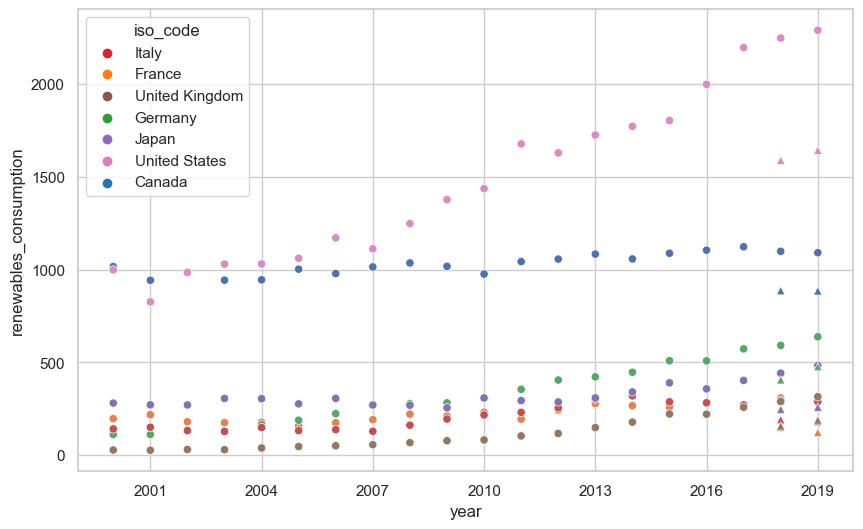

In [195]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="renewables_consumption", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="renewables_consumption_rfe_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

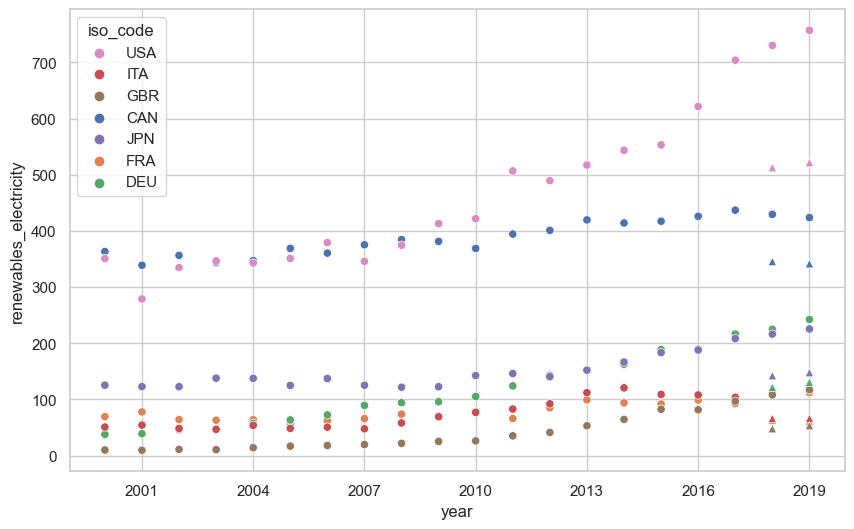

In [196]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="renewables_electricity", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="renewables_electricity_rfe_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

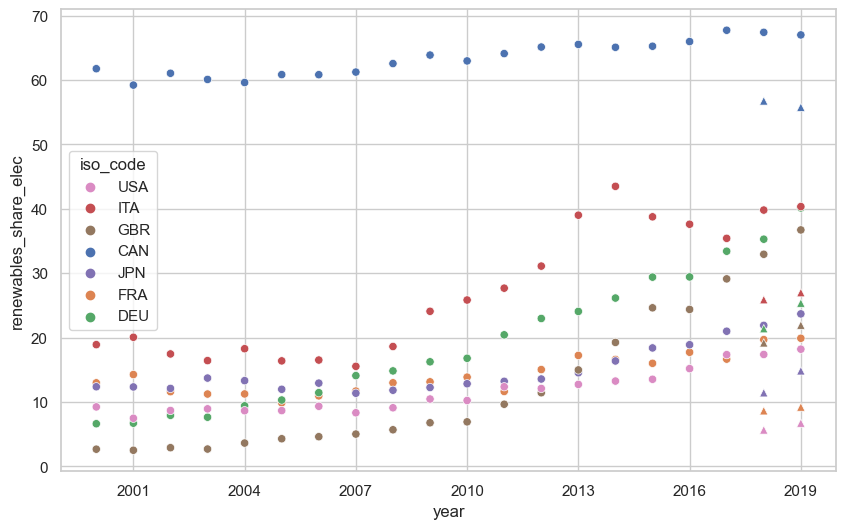

In [197]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="renewables_share_elec", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="renewables_share_elec_rfe_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

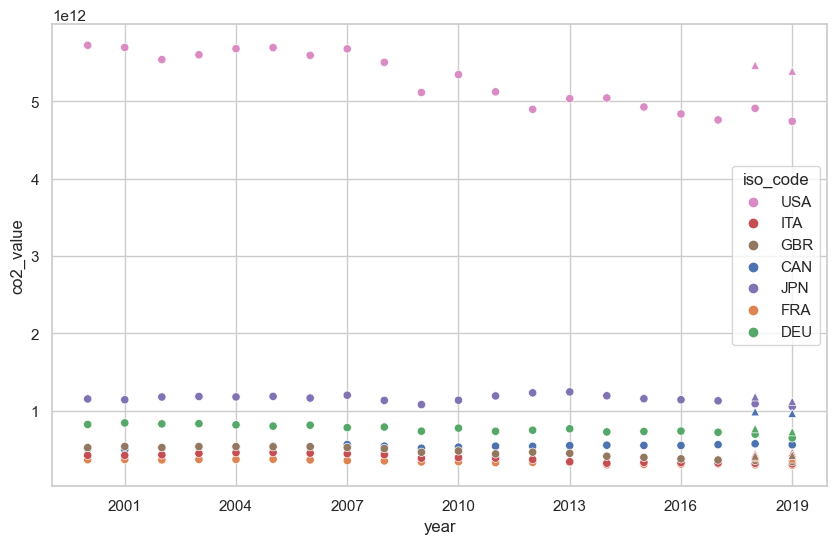

In [198]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="co2_value", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="co2_value_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

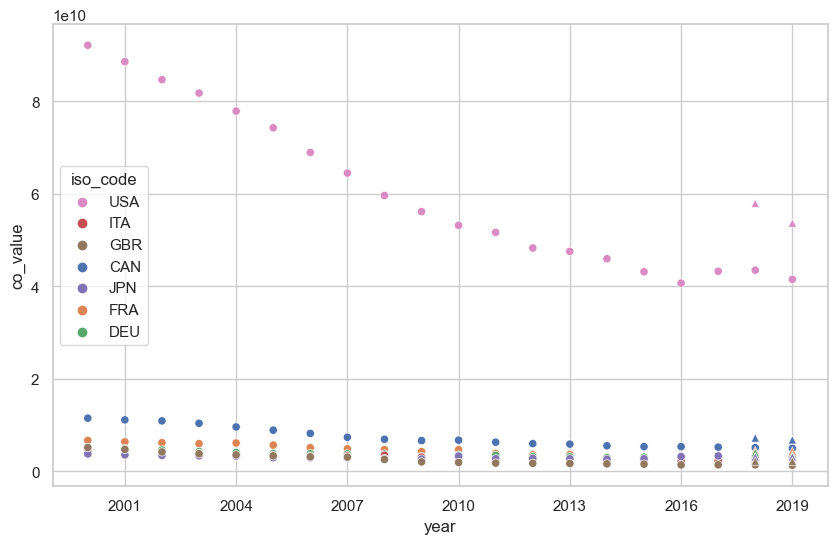

In [199]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="co_value", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="co_value_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

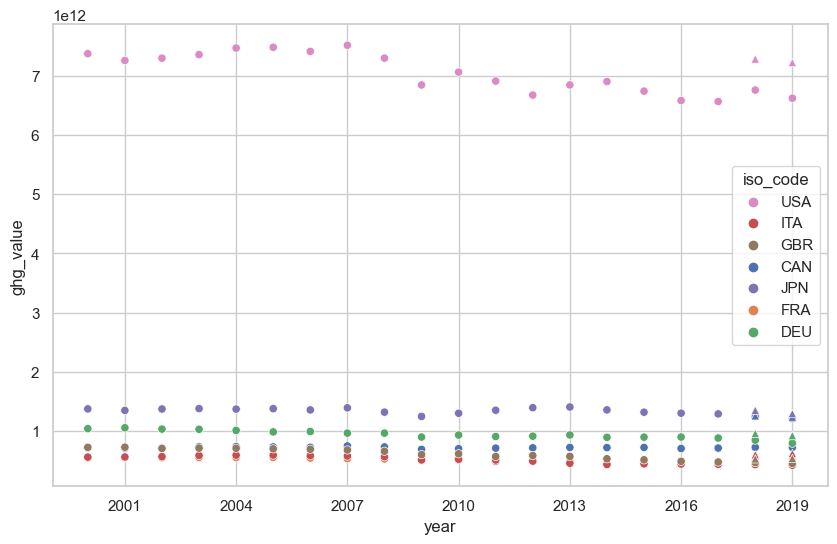

In [200]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="ghg_value", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="ghg_value_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

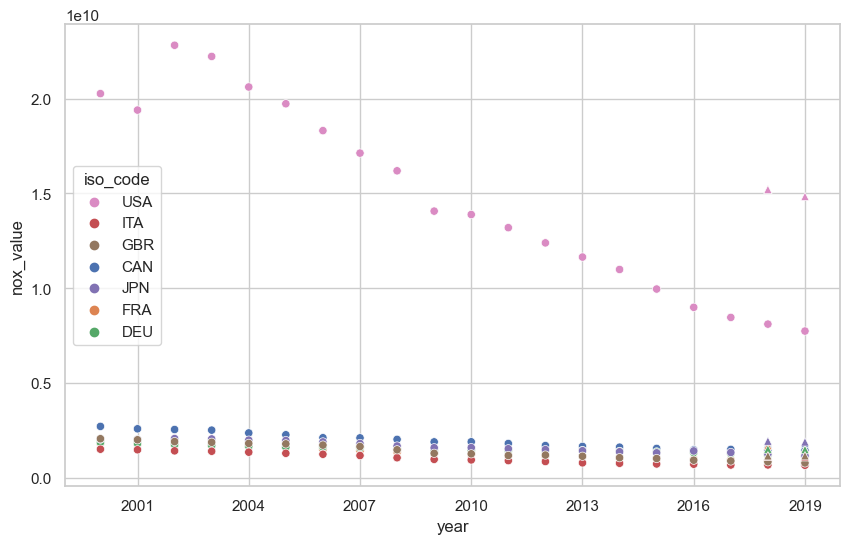

In [201]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="nox_value", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="nox_value_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

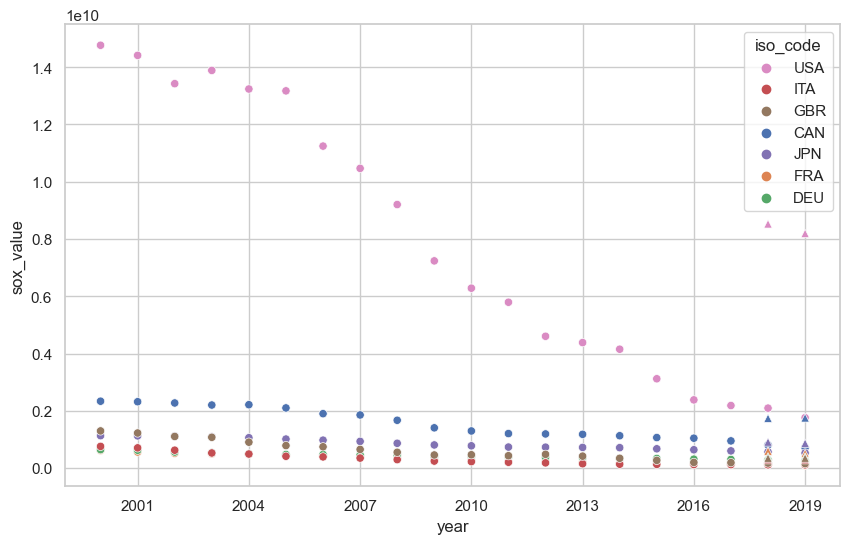

In [202]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="sox_value", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="sox_value_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

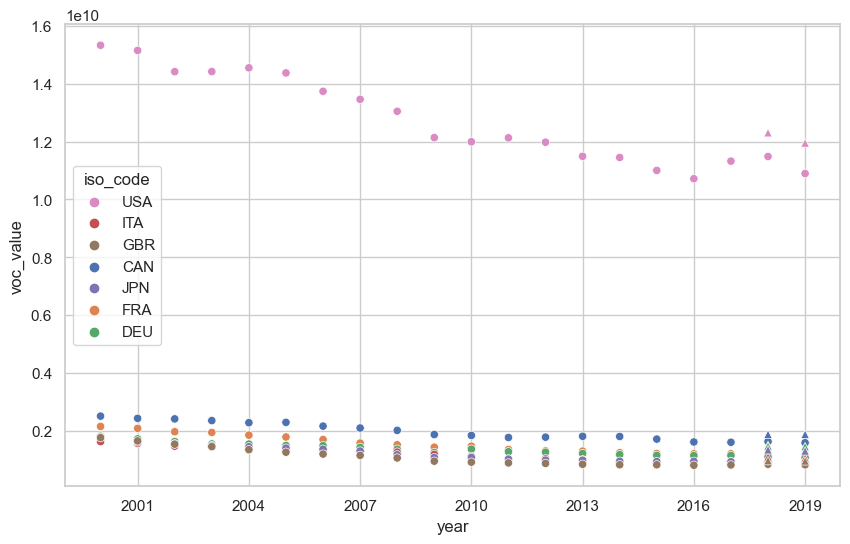

In [203]:
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.scatterplot(data = df_combined, x = "year", y ="voc_value", hue = "iso_code")
sns.scatterplot(data = df_combined, x = "year", y ="voc_value_pred", marker = "^", hue = "iso_code")

# Combining the legend from both scatterplots
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(set(labels))
unique_handles = [handles[labels.index(label)] for label in unique_labels]

plt.legend(unique_handles, unique_labels, title="iso_code")

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

### TWEAKING THE REGRESSION MODELS FOR BETTER PERFORMANCE

In [204]:
# Importing gridsearch to obtain the best hyperparameters for the regression models
from sklearn.model_selection import GridSearchCV

In [205]:
# Tweaking the renewables_consumption best model without scaling the input features

# Assigning the independent variable to X and the dependent variable to y
X = df_project[renewables_consumption_rfe_best_feat]
y = df_project["renewables_consumption"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Defining the Ridge regression model
ridge = Ridge()

# Defining the hyperparameter grid to search
param_grid = {'alpha': [0.1, 1, 10, 100]}

# Creating the GridSearchCV object
grid_search = GridSearchCV(ridge, param_grid, scoring='neg_mean_squared_error', cv=5)  # Using cross-validation for robustness

# Fitting the grid search to the data
grid_search.fit(X_train, y_train)

# Getting the best hyperparameters
best_params = grid_search.best_params_

# Using the best model for prediction
renewables_consumption_tweaked_best_model = grid_search.best_estimator_
y_train_pred = renewables_consumption_tweaked_best_model.predict(X_train)
y_test_pred = renewables_consumption_tweaked_best_model.predict(X_test)

# Evaluating the model
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Checking for overfitting
error_diff = abs(train_mse - test_mse)

print(f'Best hyperparameters: {best_params}')
print(f'Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}')
print(f'Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}')

print("")

if error_diff < 0.05:
    print(f"{error_diff:.2f} is less than 0.05, the model is not overfitting")
else:
    print(f"{error_diff:.2f} is more than 0.05, the model is overfitting")


Best hyperparameters: {'alpha': 10}
Train MSE: 0.0860, Test MSE: 0.0861
Train MAE: 0.2062, Test MAE: 0.2263

0.00 is less than 0.05, the model is not overfitting


In [206]:
def predict_tweaked_unseen_data(df,independent_var, model, target_name = str):
    
    unseen_data = df[independent_var]
        
    predicitons = model.predict(unseen_data)
    
    df["tweaked_"+target_name+"_pred"] = predicitons


In [207]:
predict_tweaked_unseen_data(df_2018_2019, 
                            renewables_consumption_rfe_best_feat,
                           renewables_consumption_tweaked_best_model, "renewables_consumption")

In [208]:
# Tweaking the renewables_consumption best model whilst scaling the input features

# Assigning the independent variable to X and the dependent variable to y
X = df_project[renewables_consumption_rfe_best_feat]
y = df_project["renewables_consumption"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Defining the Ridge regression model
ridge = Ridge()

# Defining the hyperparameter grid to search
param_grid = {'alpha': [0.1, 1, 10, 100]}

# Creating the GridSearchCV object
grid_search = GridSearchCV(ridge, param_grid, scoring='neg_mean_squared_error', cv=5)  # Using cross-validation for robustness

# Fitting the grid search to the scaled data
grid_search.fit(X_train_scaled, y_train)

# Getting the best hyperparameters
best_params = grid_search.best_params_

# Using the best model for prediction
scaled_renewables_consumption_tweaked_best_model = grid_search.best_estimator_
y_train_pred = scaled_renewables_consumption_tweaked_best_model.predict(X_train_scaled)
y_test_pred = scaled_renewables_consumption_tweaked_best_model.predict(X_test_scaled)

# Evaluating the model
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Checking for overfitting
error_diff = abs(train_mse - test_mse)

print(f'Best hyperparameters: {best_params}')
print(f'Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}')
print(f'Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}')

print("")

if error_diff < 0.05:
    print(f"{error_diff:.2f} is less than 0.05, the model is not overfitting")
else:
    print(f"{error_diff:.2f} is more than 0.05, the model is overfitting")


Best hyperparameters: {'alpha': 0.1}
Train MSE: 259.1725, Test MSE: 432.2063
Train MAE: 12.4867, Test MAE: 13.0474

173.03 is more than 0.05, the model is overfitting


In [209]:
def predict_scaled_tweaked_unseen_data(df,independent_var, model, target_name = str):
    
    unseen_data = df[independent_var]
    
    scale = StandardScaler()
    scaled_unseen_data = scale.fit_transform(unseen_data)
    
    scaled_unseen_data = pd.DataFrame(scaled_unseen_data, columns = unseen_data.columns) 
    
    predicitons = model.predict(scaled_unseen_data)
    
    df["scaled_tweaked_"+target_name+"_pred"] = predicitons


In [210]:
predict_scaled_tweaked_unseen_data(df_2018_2019, 
                            renewables_consumption_rfe_best_feat,
                           scaled_renewables_consumption_tweaked_best_model, "renewables_consumption")

In [211]:
df_2018_2019[["iso_code", "year", "renewables_consumption",
             "tweaked_renewables_consumption_pred",
             "scaled_tweaked_renewables_consumption_pred"]]

,iso_code,year,renewables_consumption,tweaked_renewables_consumption_pred,scaled_tweaked_renewables_consumption_pred
0,CAN,2018,1098.915,1098.826042,875.100158
1,CAN,2019,1091.247,1091.244132,871.024629
2,FRA,2018,308.631,308.455183,159.892668
3,FRA,2019,315.467,315.587753,133.022024
4,DEU,2018,591.822,591.897279,406.398303
5,DEU,2019,638.183,638.655086,471.108185
6,ITA,2018,296.093,296.011028,191.965216
7,ITA,2019,288.399,288.447773,186.993372
8,JPN,2018,441.828,442.782005,258.122241
9,JPN,2019,483.082,484.227590,267.482553


In [212]:
# obtaining the percentage differences of the predicted outputs and the actual values
diff = (df_2018_2019["renewables_consumption"] - 
                    df_2018_2019["tweaked_renewables_consumption_pred"])

percentage_diff = (diff/df_2018_2019["renewables_consumption"])*100

df_2018_2019["renewables_consumption_pred_percentage_diff"] = round(percentage_diff,4)

In [213]:
df_2018_2019[["iso_code", "year", "renewables_consumption",
             "tweaked_renewables_consumption_pred",
             "renewables_consumption_pred_percentage_diff"]]

,iso_code,year,renewables_consumption,tweaked_renewables_consumption_pred,renewables_consumption_pred_percentage_diff
0,CAN,2018,1098.915,1098.826042,0.0081
1,CAN,2019,1091.247,1091.244132,0.0003
2,FRA,2018,308.631,308.455183,0.0570
3,FRA,2019,315.467,315.587753,-0.0383
4,DEU,2018,591.822,591.897279,-0.0127
5,DEU,2019,638.183,638.655086,-0.0740
6,ITA,2018,296.093,296.011028,0.0277
7,ITA,2019,288.399,288.447773,-0.0169
8,JPN,2018,441.828,442.782005,-0.2159
9,JPN,2019,483.082,484.227590,-0.2371


In [214]:
# Tweaking the renewables_electricity best model without scaling the input features

# Assigning the independent variable to X and the dependent variable to y
X = df_project[renewables_electricity_rfe_best_feat]
y = df_project["renewables_electricity"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating a Lasso regression model
lasso_model = Lasso()

# Defining the hyperparameters to tune
param_grid = {
    'alpha': [0.01, 0.1, 1, 10],  # Regularization strength
    'max_iter': [1000, 2000, 3000]  # Maximum number of iterations
}

# Using grid search to find the best hyperparameters
grid_search = GridSearchCV(lasso_model, param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

# Getting the best hyperparameters
best_alpha = grid_search.best_params_['alpha']
best_max_iter = grid_search.best_params_['max_iter']

# Training the Lasso model with the best hyperparameters
renewables_electricity_tweaked_best_model = Lasso(alpha=best_alpha, max_iter=best_max_iter)
renewables_electricity_tweaked_best_model.fit(X_train, y_train)

# Making predictions on the training set
train_predictions = renewables_electricity_tweaked_best_model.predict(X_train)

# Making predictions on the test set
test_predictions = renewables_electricity_tweaked_best_model.predict(X_test)

# Evaluating the model
train_mse = mean_squared_error(y_train, train_predictions)
test_mse = mean_squared_error(y_test, test_predictions)

train_mae = mean_absolute_error(y_train, train_predictions)
test_mae = mean_absolute_error(y_test, test_predictions)

# Checking for overfitting
error_diff = abs(train_mse - test_mse)

print("Best Alpha:", best_alpha)
print("Best Max Iter:", best_max_iter)
print("Train MSE:", train_mse)
print("Test MSE:", test_mse)
print("Train MAE:", train_mae)
print("Test MAE:", test_mae)
print("")

if error_diff < 0.05:
    print(f"{error_diff:.2f} is less than 0.05, the model is not overfitting")
else:
    print(f"{error_diff:.2f} is more than 0.05, the model is overfitting")


Best Alpha: 1
Best Max Iter: 3000
Train MSE: 0.05615510944762199
Test MSE: 0.07238704750279833
Train MAE: 0.17273051746691956
Test MAE: 0.18962866190879762

0.02 is less than 0.05, the model is not overfitting


In [215]:
predict_tweaked_unseen_data(df_2018_2019, 
                            renewables_electricity_rfe_best_feat,
                           renewables_electricity_tweaked_best_model, "renewables_electricity")

In [216]:
# Tweaking the renewables_electricity best model whilst scaling the input features

# Assigning the independent variable to X and the dependent variable to y
X = df_project[renewables_electricity_rfe_best_feat]
y = df_project["renewables_electricity"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Creating a Lasso regression model
lasso_model = Lasso()

# Defining the hyperparameters to tune
param_grid = {
    'alpha': [0.01, 0.1, 1, 10],  # Regularization strength
    'max_iter': [1000, 2000, 3000]  # Maximum number of iterations
}

# Using grid search to find the best hyperparameters
grid_search = GridSearchCV(lasso_model, param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train_scaled, y_train)

# Getting the best hyperparameters
best_alpha = grid_search.best_params_['alpha']
best_max_iter = grid_search.best_params_['max_iter']

# Training the Lasso model with the best hyperparameters
scaled_renewables_electricity_tweaked_best_model = Lasso(alpha=best_alpha, max_iter=best_max_iter)
scaled_renewables_electricity_tweaked_best_model.fit(X_train_scaled, y_train)

# Making predictions on the training set
train_predictions = scaled_renewables_electricity_tweaked_best_model.predict(X_train_scaled)

# Making predictions on the test set
test_predictions = scaled_renewables_electricity_tweaked_best_model.predict(X_test_scaled)

# Evaluating the model
train_mse = mean_squared_error(y_train, train_predictions)
test_mse = mean_squared_error(y_test, test_predictions)

train_mae = mean_absolute_error(y_train, train_predictions)
test_mae = mean_absolute_error(y_test, test_predictions)

# Checking for overfitting
error_diff = abs(train_mse - test_mse)

print("Best Alpha:", best_alpha)
print("Best Max Iter:", best_max_iter)
print("Train MSE:", train_mse)
print("Test MSE:", test_mse)
print("Train MAE:", train_mae)
print("Test MAE:", test_mae)
print("")

if error_diff < 0.05:
    print(f"{error_diff:.2f} is less than 0.05, the model is not overfitting")
else:
    print(f"{error_diff:.2f} is more than 0.05, the model is overfitting")


Best Alpha: 0.01
Best Max Iter: 3000
Train MSE: 0.0006992442057319464
Test MSE: 0.0006303305921477452
Train MAE: 0.02000468372212092
Test MAE: 0.020963177721211146

0.00 is less than 0.05, the model is not overfitting


In [217]:
predict_scaled_tweaked_unseen_data(df_2018_2019, 
                            renewables_electricity_rfe_best_feat,
                           scaled_renewables_electricity_tweaked_best_model, "renewables_electricity")

In [218]:
df_2018_2019[["iso_code", "year", "renewables_electricity",
             "tweaked_renewables_electricity_pred",
             "scaled_tweaked_renewables_electricity_pred"]]

,iso_code,year,renewables_electricity,tweaked_renewables_electricity_pred,scaled_tweaked_renewables_electricity_pred
0,CAN,2018,429.615,429.030052,364.036777
1,CAN,2019,423.820,423.315722,359.238092
2,FRA,2018,113.397,113.289986,60.943665
3,FRA,2019,112.397,112.272522,56.789418
4,DEU,2018,224.900,224.080934,117.365270
5,DEU,2019,242.400,241.382568,126.874144
6,ITA,2018,114.402,114.508343,61.105330
7,ITA,2019,117.079,117.038073,61.493196
8,JPN,2018,216.343,216.443853,145.612744
9,JPN,2019,225.538,225.747974,147.577550


In [219]:
diff = (df_2018_2019["renewables_electricity"] - 
                    df_2018_2019["tweaked_renewables_electricity_pred"])

percentage_diff = (diff/df_2018_2019["renewables_electricity"])*100

df_2018_2019["renewables_electricity_pred_percentage_diff"] = round(percentage_diff,4)

In [220]:
df_2018_2019[["iso_code", "year", "renewables_electricity",
             "tweaked_renewables_electricity_pred",
             "renewables_electricity_pred_percentage_diff"]]

,iso_code,year,renewables_electricity,tweaked_renewables_electricity_pred,renewables_electricity_pred_percentage_diff
0,CAN,2018,429.615,429.030052,0.1362
1,CAN,2019,423.820,423.315722,0.1190
2,FRA,2018,113.397,113.289986,0.0944
3,FRA,2019,112.397,112.272522,0.1107
4,DEU,2018,224.900,224.080934,0.3642
5,DEU,2019,242.400,241.382568,0.4197
6,ITA,2018,114.402,114.508343,-0.0930
7,ITA,2019,117.079,117.038073,0.0350
8,JPN,2018,216.343,216.443853,-0.0466
9,JPN,2019,225.538,225.747974,-0.0931


In [221]:
# Tweaking the renewables_share_elec best model without scaling the input features

# Assigning the independent variable to X and the dependent variable to y
X = df_project[renewables_share_elec_rfe_best_feat]
y = df_project["renewables_share_elec"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Defining the Ridge regression model
ridge = Ridge()

# Defining the hyperparameter grid to search
param_grid = {'alpha': [0.1, 1, 10, 100]}

# Creating the GridSearchCV object
grid_search = GridSearchCV(ridge, param_grid, scoring='neg_mean_squared_error', cv=5)  # Using cross-validation for robustness

# Fitting the grid search to the data
grid_search.fit(X_train, y_train)

# Getting the best hyperparameters
best_params = grid_search.best_params_

# Using the best model for prediction
renewables_share_elec_tweaked_best_model = grid_search.best_estimator_
y_train_pred = renewables_share_elec_tweaked_best_model.predict(X_train)
y_test_pred = renewables_share_elec_tweaked_best_model.predict(X_test)

# Evaluating the model
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Checking for overfitting
error_diff = abs(train_mse - test_mse)

print(f'Best hyperparameters: {best_params}')
print(f'Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}')
print(f'Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}')

print("")

if error_diff < 0.05:
    print(f"{error_diff:.2f} is less than 0.05, the model is not overfitting")
else:
    print(f"{error_diff:.2f} is more than 0.05, the model is overfitting")


Best hyperparameters: {'alpha': 0.1}
Train MSE: 0.0000, Test MSE: 0.0000
Train MAE: 0.0011, Test MAE: 0.0014

0.00 is less than 0.05, the model is not overfitting


In [222]:
predict_tweaked_unseen_data(df_2018_2019, 
                            renewables_share_elec_rfe_best_feat,
                           renewables_share_elec_tweaked_best_model, "renewables_share_elec")

In [223]:
# Tweaking the renewables_share_elec best model whilst scaling the input features

# Assigning the independent variable to X and the dependent variable to y
X = df_project[renewables_share_elec_rfe_best_feat]
y = df_project["renewables_share_elec"]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Defining the Ridge regression model
ridge = Ridge()

# Defining the hyperparameter grid to search
param_grid = {'alpha': [0.1, 1, 10, 100]}

# Creating the GridSearchCV object
grid_search = GridSearchCV(ridge, param_grid, scoring='neg_mean_squared_error', cv=5)  # Using cross-validation for robustness

# Fitting the grid search to the scaled data
grid_search.fit(X_train_scaled, y_train)

# Getting the best hyperparameters
best_params = grid_search.best_params_

# Using the best model for prediction
scaled_renewables_share_elec_tweaked_best_model = grid_search.best_estimator_
y_train_pred = scaled_renewables_share_elec_tweaked_best_model.predict(X_train_scaled)
y_test_pred = scaled_renewables_share_elec_tweaked_best_model.predict(X_test_scaled)

# Evaluating the model
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Checking for overfitting
error_diff = abs(train_mse - test_mse)

print(f'Best hyperparameters: {best_params}')
print(f'Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}')
print(f'Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}')

print("")

if error_diff < 0.05:
    print(f"{error_diff:.2f} is less than 0.05, the model is not overfitting")
else:
    print(f"{error_diff:.2f} is more than 0.05, the model is overfitting")


Best hyperparameters: {'alpha': 0.1}
Train MSE: 0.2056, Test MSE: 0.2337
Train MAE: 0.3518, Test MAE: 0.4000

0.03 is less than 0.05, the model is not overfitting


In [224]:
predict_scaled_tweaked_unseen_data(df_2018_2019, 
                            renewables_share_elec_rfe_best_feat,
                           scaled_renewables_share_elec_tweaked_best_model, "renewables_share_elec")

In [225]:
df_2018_2019[["iso_code", "year", "renewables_share_elec",
             "tweaked_renewables_share_elec_pred",
             "scaled_tweaked_renewables_share_elec_pred"]]

,iso_code,year,renewables_share_elec,tweaked_renewables_share_elec_pred,scaled_tweaked_renewables_share_elec_pred
0,CAN,2018,67.420,67.418631,58.182579
1,CAN,2019,67.018,67.016193,57.460080
2,FRA,2018,19.688,19.686240,9.257166
3,FRA,2019,19.894,19.892431,9.683214
4,DEU,2018,35.284,35.282140,22.007826
5,DEU,2019,40.139,40.136702,26.856416
6,ITA,2018,39.809,39.806590,26.396091
7,ITA,2019,40.351,40.348663,27.138876
8,JPN,2018,21.898,21.902492,8.564142
9,JPN,2019,23.681,23.688816,11.460681


In [226]:
diff = (df_2018_2019["renewables_share_elec"] - 
                    df_2018_2019["tweaked_renewables_share_elec_pred"])

percentage_diff = (diff/df_2018_2019["renewables_share_elec"])*100

df_2018_2019["renewables_share_elec_pred_percentage_diff"] = round(percentage_diff,4)

In [227]:
df_2018_2019[["iso_code", "year", "renewables_share_elec",
             "tweaked_renewables_share_elec_pred",
             "renewables_share_elec_pred_percentage_diff"]]

,iso_code,year,renewables_share_elec,tweaked_renewables_share_elec_pred,renewables_share_elec_pred_percentage_diff
0,CAN,2018,67.420,67.418631,0.0020
1,CAN,2019,67.018,67.016193,0.0027
2,FRA,2018,19.688,19.686240,0.0089
3,FRA,2019,19.894,19.892431,0.0079
4,DEU,2018,35.284,35.282140,0.0053
5,DEU,2019,40.139,40.136702,0.0057
6,ITA,2018,39.809,39.806590,0.0061
7,ITA,2019,40.351,40.348663,0.0058
8,JPN,2018,21.898,21.902492,-0.0205
9,JPN,2019,23.681,23.688816,-0.0330


### USING ARIMA FOR FORECASTING

In [228]:
"""Getting a copy of the project df whilst 
changing the year column format"""
df_project_arima = df_project.copy()
df_project_arima["year"] = pd.to_datetime(df_project_arima["year"], format='%Y')


In [229]:
df_project_arima

,iso_code,country,year,electricity_generation,fossil_electricity,hydro_electricity,nuclear_electricity,other_renewable_electricity,renewables_electricity,solar_electricity,wind_electricity,energy_per_gdp,energy_per_capita,fossil_cons_change_pct,fossil_cons_change_twh,fossil_fuel_consumption,fossil_cons_per_capita,fossil_share_elec,low_carbon_electricity,nuclear_share_elec,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_energy_per_capita,population,primary_energy_consumption,renewables_share_elec,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables_energy_per_capita,solar_share_elec,gdp,wind_share_elec,co2_value,co_value,ghg_value,nox_value,sox_value,voc_value
0,CAN,Canada,2000-01-01,588.424,155.805,354.924,69.159,8.256,363.460,0.016,0.264,3.094,116316.445,3.076,69.839,2340.522,5093.664,26.478,432.619,11.753,-0.940,-1.906,200.816,2260.985,6565.187,30588000.0,3557.887,61.768,3.343,32.884,1016.550,33233.606,0.003,1.150000e+12,0.045,5.035528e+11,1.150037e+10,7.194576e+11,2.705929e+09,2.334386e+09,2.504416e+09
1,CAN,Canada,2001-01-01,572.362,160.520,329.986,72.858,8.642,338.984,0.019,0.337,3.019,112417.736,-0.932,-21.817,2318.705,5198.188,28.045,411.842,12.729,4.667,9.372,210.188,2359.391,6806.600,30880000.0,3471.460,59.225,-7.278,-73.982,942.567,30523.552,0.003,1.150000e+12,0.059,4.960242e+11,1.112527e+10,7.101615e+11,2.578799e+09,2.315741e+09,2.427230e+09
2,CAN,Canada,2002-01-01,583.940,155.632,347.048,71.750,9.080,356.558,0.022,0.408,3.058,114768.639,2.911,67.499,2386.203,4991.726,26.652,428.308,12.287,-2.161,-4.542,205.645,2301.302,6595.847,31178000.0,3578.257,61.061,4.651,43.841,986.408,31637.947,0.004,1.170000e+12,0.070,5.146189e+11,1.091613e+10,7.154802e+11,2.541797e+09,2.272163e+09,2.408454e+09
3,CAN,Canada,2003-01-01,572.384,157.228,334.071,71.147,9.089,344.009,0.023,0.826,2.970,114141.391,2.594,61.903,2448.106,4993.272,27.469,415.156,12.430,-1.474,-3.030,202.615,2259.496,6434.675,31488000.0,3594.084,60.101,-4.364,-43.045,943.363,29959.446,0.004,1.210000e+12,0.144,5.341512e+11,1.039684e+10,7.341414e+11,2.508739e+09,2.200811e+09,2.350202e+09
4,CAN,Canada,2004-01-01,582.408,149.295,337.427,85.868,8.850,347.244,0.013,0.954,2.886,114307.537,0.017,0.428,2448.534,4692.614,25.634,433.112,14.744,19.920,40.360,242.975,2698.978,7637.133,31815000.0,3636.694,59.622,0.193,1.822,945.185,29708.783,0.002,1.260000e+12,0.164,5.260626e+11,9.600498e+09,7.367112e+11,2.360063e+09,2.211795e+09,2.277560e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,USA,United States,2013-01-01,4065.964,2759.555,263.884,789.016,76.633,517.392,9.036,167.840,1.589,80853.407,2.509,531.954,21729.859,8721.702,67.870,1306.409,19.405,1.941,40.486,2126.394,2493.723,6720.565,316400992.0,25582.098,12.725,5.914,96.371,1725.846,5454.616,0.222,1.610000e+13,4.128,5.034835e+12,4.753636e+10,6.841750e+12,1.163922e+10,4.381539e+09,1.148878e+10
122,USA,United States,2014-01-01,4104.839,2764.034,253.193,797.166,79.866,543.638,28.924,181.655,1.567,81112.618,0.967,210.161,21940.020,8673.575,67.336,1340.804,19.420,0.428,9.098,2135.492,2501.517,6701.202,318672992.0,25848.401,13.244,2.726,47.043,1772.889,5563.348,0.705,1.650000e+13,4.425,5.043239e+12,4.594028e+10,6.898477e+12,1.098369e+10,4.150166e+09,1.144854e+10
123,USA,United States,2015-01-01,4091.740,2741.274,243.989,797.178,79.549,553.289,39.032,190.719,1.515,79771.642,-1.229,-269.564,21670.455,8543.039,66.995,1350.467,19.483,-0.594,-12.680,2122.812,2484.364,6615.637,320878016.0,25596.966,13.522,1.738,30.810,1803.698,5621.134,0.954,1.690000e+13,4.661,4.926551e+12,4.313298e+10,6.737443e+12,9.952531e+09,3.117904e+09,1.100006e+10
124,USA,United States,2016-01-01,4095.487,2668.222,261.126,805.694,78.586,621.571,54.866,226.993,1.486,79130.818,-1.114,-241.506,21428.950,8260.340,65.150,1427.265,19.673,0.470,9.982,2132.795,2494

In [230]:
"""Creating new dfs for each country and each target.
Also, the year column would be set as the index for all the dfs"""

df_CAN = df_project_arima[df_project_arima["iso_code"]== "CAN"]
df_CAN_RC = df_CAN[["year", "renewables_consumption"]]
df_CAN_RC

,year,renewables_consumption
0,2000-01-01,1016.550
1,2001-01-01,942.567
2,2002-01-01,986.408
3,2003-01-01,943.363
4,2004-01-01,945.185
5,2005-01-01,1002.464
6,2006-01-01,978.838
7,2007-01-01,1014.583
8,2008-01-01,1036.060
9,2009-01-01,1017.943


In [231]:
df_FRA = df_project_arima[df_project_arima["iso_code"]== "FRA"]
df_FRA_RC = df_FRA[["year", "renewables_consumption"]]
df_FRA_RC

,year,renewables_consumption
18,2000-01-01,196.472
19,2001-01-01,218.276
20,2002-01-01,179.966
21,2003-01-01,175.383
22,2004-01-01,177.009
23,2005-01-01,158.155
24,2006-01-01,174.693
25,2007-01-01,191.312
26,2008-01-01,221.238
27,2009-01-01,210.902


In [232]:
df_DEU = df_project_arima[df_project_arima["iso_code"]== "DEU"]
df_DEU_RC = df_DEU[["year", "renewables_consumption"]]
df_DEU_RC

,year,renewables_consumption
36,2000-01-01,111.377
37,2001-01-01,111.337
38,2002-01-01,130.843
39,2003-01-01,132.300
40,2004-01-01,164.129
41,2005-01-01,188.168
42,2006-01-01,223.500
43,2007-01-01,270.939
44,2008-01-01,278.119
45,2009-01-01,281.551


In [233]:
df_ITA = df_project_arima[df_project_arima["iso_code"]== "ITA"]
df_ITA_RC = df_ITA[["year", "renewables_consumption"]]
df_ITA_RC

,year,renewables_consumption
54,2000-01-01,141.333
55,2001-01-01,149.984
56,2002-01-01,132.479
57,2003-01-01,127.680
58,2004-01-01,148.583
59,2005-01-01,132.228
60,2006-01-01,137.523
61,2007-01-01,128.720
62,2008-01-01,161.552
63,2009-01-01,194.620


In [234]:
df_JPN = df_project_arima[df_project_arima["iso_code"]== "JPN"]
df_JPN_RC = df_JPN[["year", "renewables_consumption"]]
df_JPN_RC

,year,renewables_consumption
72,2000-01-01,280.645
73,2001-01-01,271.331
74,2002-01-01,270.484
75,2003-01-01,305.495
76,2004-01-01,304.355
77,2005-01-01,276.486
78,2006-01-01,305.962
79,2007-01-01,270.301
80,2008-01-01,269.245
81,2009-01-01,255.170


In [235]:
df_GBR = df_project_arima[df_project_arima["iso_code"]== "GBR"]
df_GBR_RC = df_GBR[["year", "renewables_consumption"]]
df_GBR_RC

,year,renewables_consumption
90,2000-01-01,27.540
91,2001-01-01,26.349
92,2002-01-01,30.535
93,2003-01-01,29.320
94,2004-01-01,38.480
95,2005-01-01,46.419
96,2006-01-01,50.521
97,2007-01-01,56.377
98,2008-01-01,67.131
99,2009-01-01,77.786


In [236]:
df_USA = df_project_arima[df_project_arima["iso_code"]== "USA"]
df_USA_RC = df_USA[["year", "renewables_consumption"]]
df_USA_RC

,year,renewables_consumption
108,2000-01-01,998.832
109,2001-01-01,826.501
110,2002-01-01,984.608
111,2003-01-01,1029.536
112,2004-01-01,1030.934
113,2005-01-01,1061.403
114,2006-01-01,1171.152
115,2007-01-01,1112.113
116,2008-01-01,1248.159
117,2009-01-01,1377.491


In [237]:
df_CAN_RC.set_index("year",inplace=True)

In [238]:
df_CAN_RC.head()

,renewables_consumption
year,
2000-01-01,1016.550
2001-01-01,942.567
2002-01-01,986.408
2003-01-01,943.363
2004-01-01,945.185


In [239]:
df_CAN_RC.describe()

,renewables_consumption
count,18.000000
mean,1023.255278
std,55.609301
min,942.567000
25%,980.730500
50%,1017.246500
75%,1057.497750
max,1123.138000


### Visualizing the Data

<Axes: xlabel='year'>

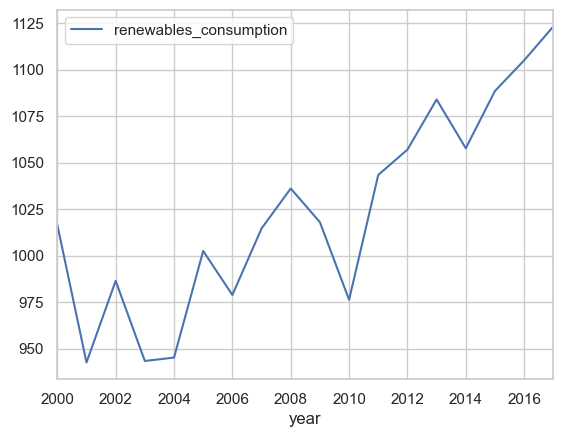

In [240]:
df_CAN_RC.plot()

In [241]:
# Testing For Stationarity

from statsmodels.tsa.stattools import adfuller

In [242]:
# defining a function to carry out adfuller test
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(df_series):
    result=adfuller(df_series)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")
    

In [243]:
adfuller_test(df_CAN_RC["renewables_consumption"])

ADF Test Statistic : 1.3819202210113333
p-value : 0.9970304405289893
#Lags Used : 7
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


### Differencing

In [244]:
df_CAN_RC["first_difference"] = (df_CAN_RC["renewables_consumption"]
                                 - df_CAN_RC["renewables_consumption"].shift(1))

In [245]:
df_CAN_RC.head()

,renewables_consumption,first_difference
year,,
2000-01-01,1016.550,NaN
2001-01-01,942.567,-73.983
2002-01-01,986.408,43.841
2003-01-01,943.363,-43.045
2004-01-01,945.185,1.822


In [246]:
adfuller_test(df_CAN_RC["first_difference"].dropna())

ADF Test Statistic : -2.0672041305981033
p-value : 0.25790476101021187
#Lags Used : 4
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [247]:
df_CAN_RC["seasonal_first_difference"] = (df_CAN_RC["renewables_consumption"]
                                                    - df_CAN_RC["renewables_consumption"].shift(5))

In [248]:
adfuller_test(df_CAN_RC["seasonal_first_difference"].dropna())

ADF Test Statistic : -3.8700475399694394
p-value : 0.0022666791909314345
#Lags Used : 0
Number of Observations Used : 12
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

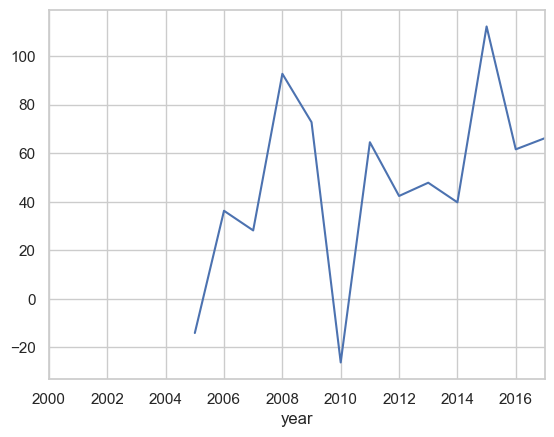

In [249]:
df_CAN_RC["seasonal_first_difference"].plot()

### Auto Regressive Model

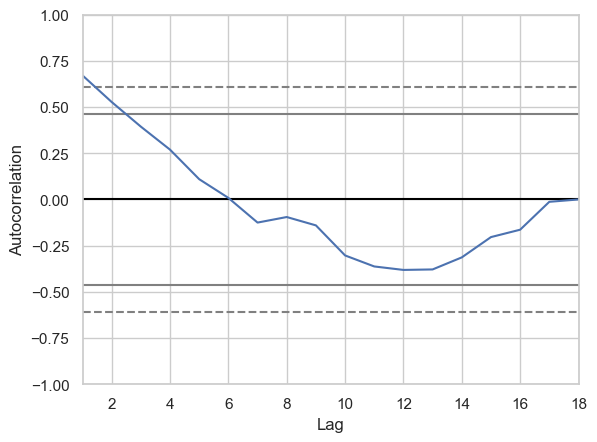

In [250]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(df_CAN_RC["renewables_consumption"])
plt.grid(True)
plt.show()

### Final Thoughts on Autocorrelation and Partial Autocorrelation

* Identification of an AR model is often best done with the PACF.
    * For an AR model, the theoretical PACF “shuts off” past the order of the model.  The phrase “shuts off” means that in theory the partial autocorrelations are equal to 0 beyond that point.  Put another way, the number of non-zero partial autocorrelations gives the order of the AR model.  By the “order of the model” we mean the most extreme lag of x that is used as a predictor.
    
    
* Identification of an MA model is often best done with the ACF rather than the PACF.
    * For an MA model, the theoretical PACF does not shut off, but instead tapers toward 0 in some manner.  A clearer pattern for an MA model is in the ACF.  The ACF will have non-zero autocorrelations only at lags involved in the model.
    
    p,d,q
    p AR model lags
    d differencing
    q MA lags

In [251]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm

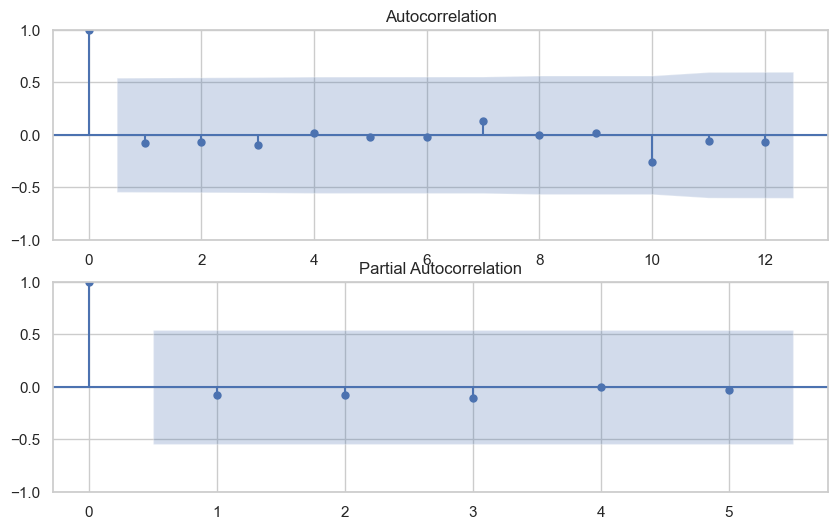

In [252]:
# obtaining the acf and pacf plots
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_CAN_RC["seasonal_first_difference"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_CAN_RC["seasonal_first_difference"].dropna(),lags=5,ax=ax2)

In [253]:
# building and fitting the model
model=sm.tsa.statespace.SARIMAX(df_CAN_RC["renewables_consumption"],order=(4, 1, 4),seasonal_order=(4,1,4,6))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.27488D+00    |proj g|=  2.13107D-01

At iterate    5    f=  3.10316D+00    |proj g|=  1.68076D-02

At iterate   10    f=  3.08938D+00    |proj g|=  2.32575D-02

At iterate   15    f=  3.08324D+00    |proj g|=  2.05425D-02

At iterate   20    f=  3.07488D+00    |proj g|=  8.98423D-03

At iterate   25    f=  3.07040D+00    |proj g|=  9.23558D-02

At iterate   30    f=  3.06459D+00    |proj g|=  3.11026D-02

At iterate   35    f=  3.03589D+00    |proj g|=  5.87290D-02

At iterate   40    f=  3.00133D+00    |proj g|=  2.16679D-01

At iterate   45    f=  2.94450D+00    |proj g|=  8.52135D-02

At iterate   50    f=  2.91958D+00    |proj g|=  5.43043D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

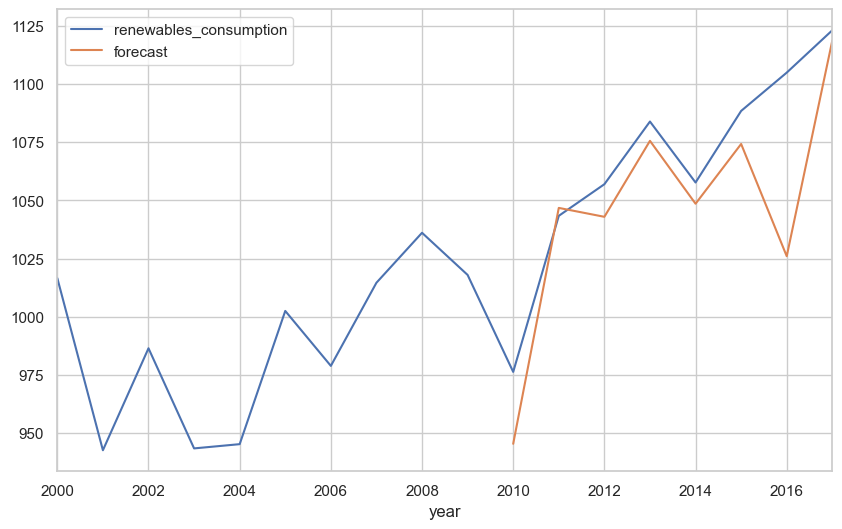

In [254]:
# training the model
df_CAN_RC["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_CAN_RC[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [255]:
df_CAN_RC[["renewables_consumption","forecast"]]

,renewables_consumption,forecast
year,,
2000-01-01,1016.550,NaN
2001-01-01,942.567,NaN
2002-01-01,986.408,NaN
2003-01-01,943.363,NaN
2004-01-01,945.185,NaN
2005-01-01,1002.464,NaN
2006-01-01,978.838,NaN
2007-01-01,1014.583,NaN
2008-01-01,1036.060,NaN


In [256]:
from pandas.tseries.offsets import DateOffset

In [257]:
"""Defining a function to create an empty df that
has the columns of any df assigned for the next 10 years"""

def get_future_df(df):
    
    future_dates=[df.index[-1]+ DateOffset(years=x)for x in range(0,11)]
    future_datest_df=pd.DataFrame(index=future_dates[1:],columns=df.columns)
    
    return future_datest_df

In [258]:
# Joining the newly created df to the old df
df_CAN_RC_future=pd.concat([df_CAN_RC,get_future_df(df_CAN_RC)])

In [259]:
df_CAN_RC_future.tail(11)

,renewables_consumption,first_difference,seasonal_first_difference,forecast
2017-01-01,1123.138,18.211,66.193,1118.761196
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

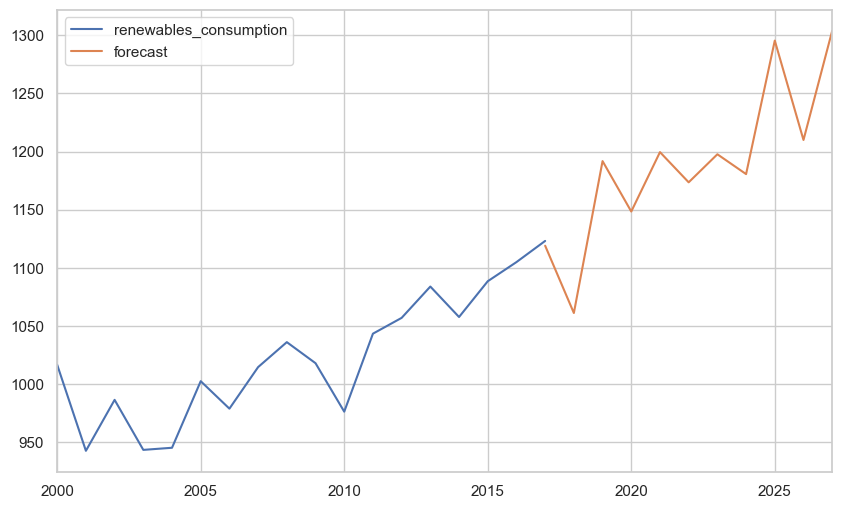

In [260]:
# using the model to forecast
df_CAN_RC_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_CAN_RC_future[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [261]:
# defining a function to get the percentage differences of the actual and forcasted values
def get_sarima_forecast_percentage_diff(df, iso_code, target):
    
    actual_2018_value_index = (df_2018_2019[(df_2018_2019["iso_code"]==iso_code) & 
                                      (df_2018_2019["year"]==2018)].index[0])
    
    actual_2019_value_index = (df_2018_2019[(df_2018_2019["iso_code"]==iso_code) & 
                                      (df_2018_2019["year"]==2019)].index[0])
    
    actual_2018_value = df_2018_2019.at[actual_2018_value_index, target]
    actual_2019_value = df_2018_2019.at[actual_2019_value_index, target]    
    
    forecasted_2018_value = df.at["2018-01-01", "forecast"]
    forecasted_2019_value = df.at["2019-01-01", "forecast"]
    
    absolute_diff_2018 = abs(actual_2018_value - forecasted_2018_value)
    absolute_diff_2019 = abs(actual_2019_value - forecasted_2019_value)
    
    percentage_diff_2018 = (absolute_diff_2018/actual_2018_value)*100
    percentage_diff_2019 = (absolute_diff_2019/actual_2019_value)*100
    
    print(f"{iso_code}'s actual 2018 {target} value: {round(actual_2018_value,3)} TWh")
    print(f"{iso_code}'s forecasted 2018 {target} value: {round(forecasted_2018_value,3)} TWh")
    
    print("")
    
    print(f"{iso_code}'s actual 2019 {target} value: {round(actual_2019_value,3)} TWh")
    print(f"{iso_code}'s forecasted 2019 {target} value: {round(forecasted_2019_value,3)} TWh")
    
    print("")

    
    if actual_2018_value < forecasted_2018_value:
        print(f"The Sarima model's {target} forecast for {iso_code} is {round(percentage_diff_2018,2)}% more in 2018")
        
    elif actual_2018_value == forecasted_2018_value:
        print(f"The Sarima model's {target} forecast for {iso_code} is 100% accurate in 2018")

    elif actual_2018_value > forecasted_2018_value:
        print(f"The Sarima model's {target} forecast for {iso_code} is {round(percentage_diff_2018,2)}% less in 2018")
        
    
    if actual_2019_value < forecasted_2019_value:
        print(f"The Sarima model's {target} forecast for {iso_code} is {round(percentage_diff_2019,2)}% more in 2019")
        
    elif actual_2019_value == forecasted_2019_value:
        print(f"The Sarima model's {target} forecast for {iso_code} is 100% accurate in 2019")

    elif actual_2019_value > forecasted_2019_value:
        print(f"The Sarima model's {target} forecast for {iso_code} is {round(percentage_diff_2019,2)}% less in 2019")
            
        

In [262]:
get_sarima_forecast_percentage_diff(df_CAN_RC_future, "CAN", "renewables_consumption")

CAN's actual 2018 renewables_consumption value: 1098.915 TWh
CAN's forecasted 2018 renewables_consumption value: 1061.122 TWh

CAN's actual 2019 renewables_consumption value: 1091.247 TWh
CAN's forecasted 2019 renewables_consumption value: 1191.822 TWh

The Sarima model's renewables_consumption forecast for CAN is 3.44% less in 2018
The Sarima model's renewables_consumption forecast for CAN is 9.22% more in 2019


### FRANCE

In [263]:
"""The above steps would be carried out for the
remaining dfs, all in same order"""

df_FRA_RC.set_index("year",inplace=True)

<Axes: xlabel='year'>

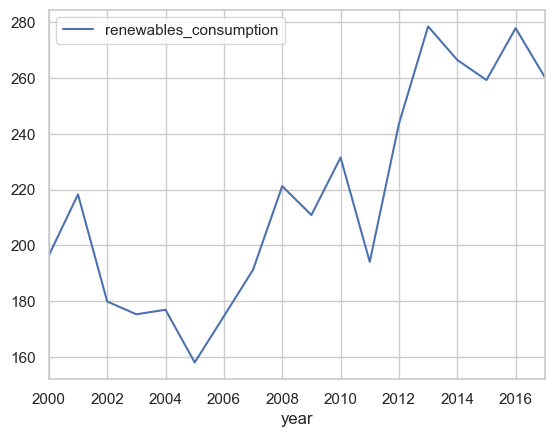

In [264]:
df_FRA_RC.plot()

In [265]:
adfuller_test(df_FRA_RC["renewables_consumption"])

ADF Test Statistic : -0.23207067382381405
p-value : 0.9345893430474017
#Lags Used : 6
Number of Observations Used : 11
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [266]:
df_FRA_RC["first_difference"] = (df_FRA_RC["renewables_consumption"]
                                 - df_FRA_RC["renewables_consumption"].shift(1))

In [267]:
adfuller_test(df_FRA_RC["first_difference"].dropna())

ADF Test Statistic : -4.95934450189982
p-value : 2.669399749007749e-05
#Lags Used : 6
Number of Observations Used : 10
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

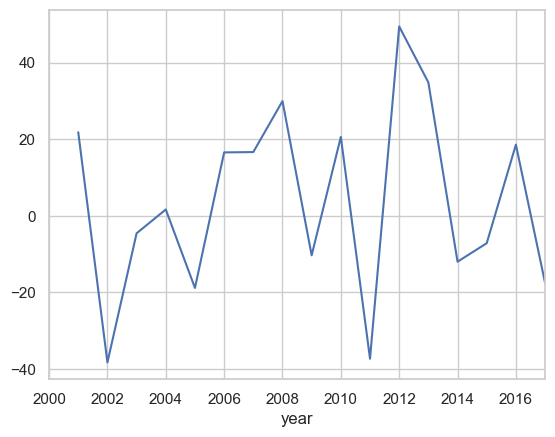

In [268]:
df_FRA_RC["first_difference"].plot()

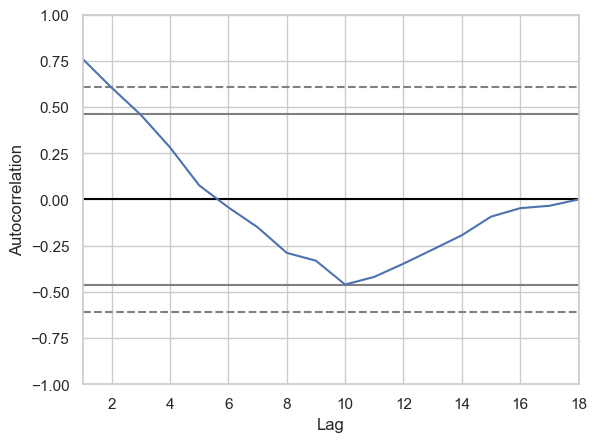

In [269]:
autocorrelation_plot(df_FRA_RC["renewables_consumption"])
plt.grid(True)
plt.show()

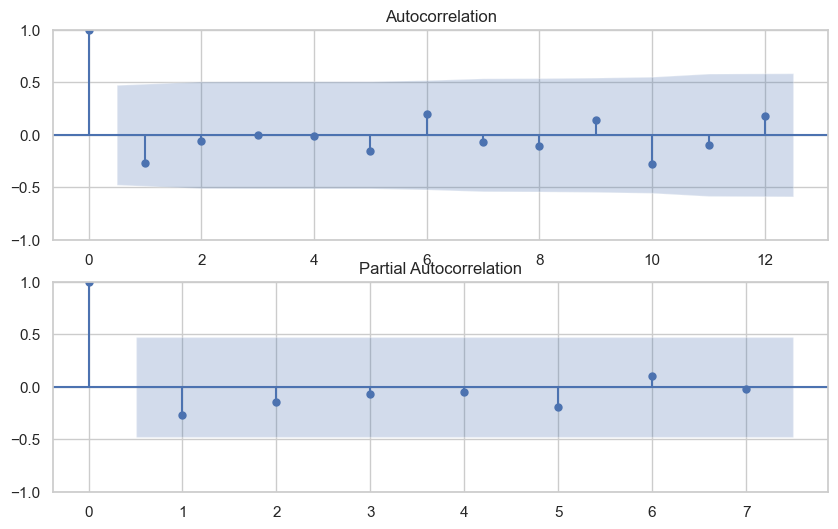

In [270]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_FRA_RC["first_difference"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_FRA_RC["first_difference"].dropna(),lags=7,ax=ax2)

In [271]:
model=ARIMA(df_FRA_RC["renewables_consumption"],order=(6,1,3))
model_fit=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [272]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                  
==================================================================================
Dep. Variable:     renewables_consumption   No. Observations:                   18
Model:                     ARIMA(6, 1, 3)   Log Likelihood                 -78.913
Date:                    Thu, 14 Dec 2023   AIC                            177.825
Time:                            13:43:25   BIC                            186.157
Sample:                        01-01-2000   HQIC                           178.653
                             - 01-01-2017                                         
Covariance Type:                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0033      9.668     -0.000      1.000     -18.953      18.946
ar.L2         -0.3730     10.842     -0.034      0.973     -21.623      20.877
ar.L3          0.5857     12.356      0.047      0.962     -23.632      24.803
ar.L4         -0.0971      6.767     -0.014      0.989     -13.361      13.167
ar.L5          0.3910      6.501      0.060      0.952     -12.350      13.132
ar.L6          0.1636      3.421      0.048      0.962      -6.541       6.868
ma.L1         -0.1359    171.933     -0.001      0.999    -337.119     336.847
ma.L2          0.2205    252.402      0.001      0.999    -494.478     494.919
ma.L3         -0.9515    379.368     -0.003      0.998    -744.500     742.597
sigma2       618.6557   2.49e+05      0.002      0.998   -4.88e+05    4.89e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.35   Jarque-Bera (JB):                 1.13
Prob(Q):                              0.56   Prob(JB):                         0.57
Heteroskedasticity (H):               2.51   Skew:                             0.13
Prob(H) (two-sided):                  0.29   Kurtosis:                         1.76
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Axes: xlabel='year'>

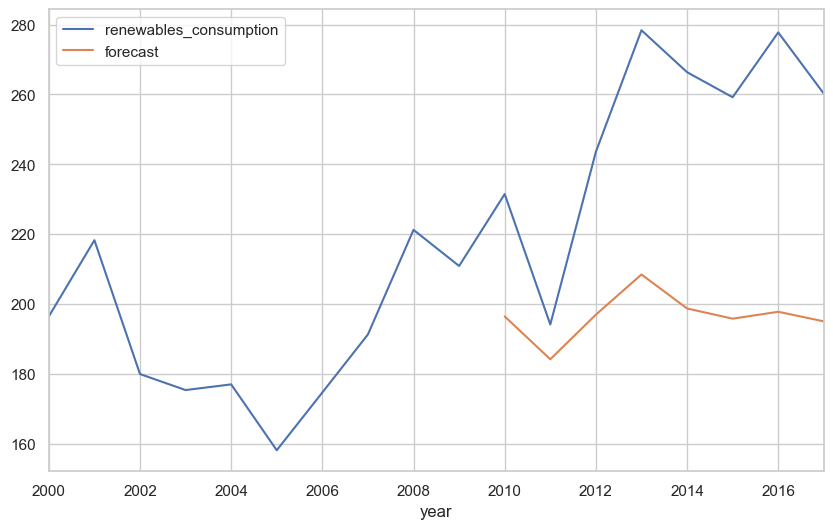

In [273]:
df_FRA_RC["forecast"]=model_fit.predict(start=10,end=17,dynamic=True)
df_FRA_RC[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [274]:
model=sm.tsa.statespace.SARIMAX(df_FRA_RC["renewables_consumption"],order=(6, 1, 3),seasonal_order=(6,1,3,12))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           19     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.30882D+00    |proj g|=  3.28590D-01

At iterate    5    f=  1.07220D+00    |proj g|=  2.15429D-02

At iterate   10    f=  1.06451D+00    |proj g|=  7.69678D-03

At iterate   15    f=  1.05612D+00    |proj g|=  4.28778D-02

At iterate   20    f=  1.02453D+00    |proj g|=  5.76251D-02

At iterate   25    f=  9.86866D-01    |proj g|=  1.28364D-01

At iterate   30    f=  9.30487D-01    |proj g|=  3.57989D-01

At iterate   35    f=  8.99666D-01    |proj g|=  4.85482D-01

At iterate   40    f=  8.67265D-01    |proj g|=  5.08001D+00

At iterate   45    f=  8.53166D-01    |proj g|=  1.94710D+00


/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   50    f=  8.37401D-01    |proj g|=  8.60510D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   19     50     90      1     0     0   8.605D-01   8.374D-01
  F =  0.83740133659937455     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


<Axes: xlabel='year'>

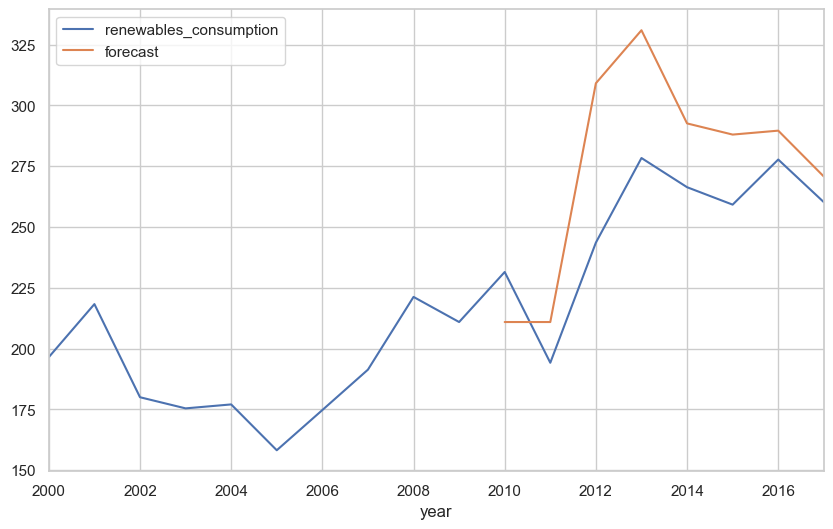

In [275]:
df_FRA_RC["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_FRA_RC[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [276]:
df_FRA_RC[["renewables_consumption","forecast"]]

,renewables_consumption,forecast
year,,
2000-01-01,196.472,NaN
2001-01-01,218.276,NaN
2002-01-01,179.966,NaN
2003-01-01,175.383,NaN
2004-01-01,177.009,NaN
2005-01-01,158.155,NaN
2006-01-01,174.693,NaN
2007-01-01,191.312,NaN
2008-01-01,221.238,NaN


In [277]:
df_FRA_RC_future=pd.concat([df_FRA_RC,get_future_df(df_FRA_RC)])

df_FRA_RC_future.tail(11)

,renewables_consumption,first_difference,forecast
2017-01-01,260.218,-17.533,270.758729
2018-01-01,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN


<Axes: >

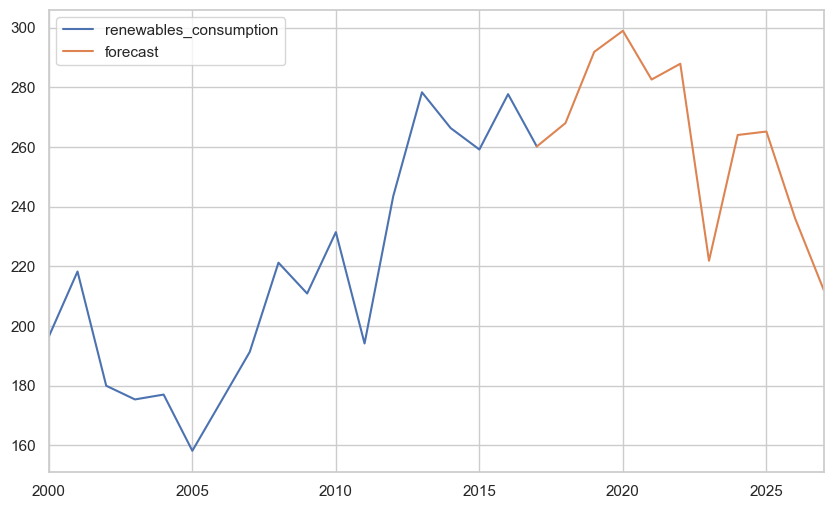

In [278]:
df_FRA_RC_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_FRA_RC_future[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [279]:
get_sarima_forecast_percentage_diff(df_FRA_RC_future, "FRA", "renewables_consumption")

FRA's actual 2018 renewables_consumption value: 308.631 TWh
FRA's forecasted 2018 renewables_consumption value: 268.052 TWh

FRA's actual 2019 renewables_consumption value: 315.467 TWh
FRA's forecasted 2019 renewables_consumption value: 291.918 TWh

The Sarima model's renewables_consumption forecast for FRA is 13.15% less in 2018
The Sarima model's renewables_consumption forecast for FRA is 7.46% less in 2019


### GERMANY

In [280]:
df_DEU_RC.set_index("year",inplace=True)

<Axes: xlabel='year'>

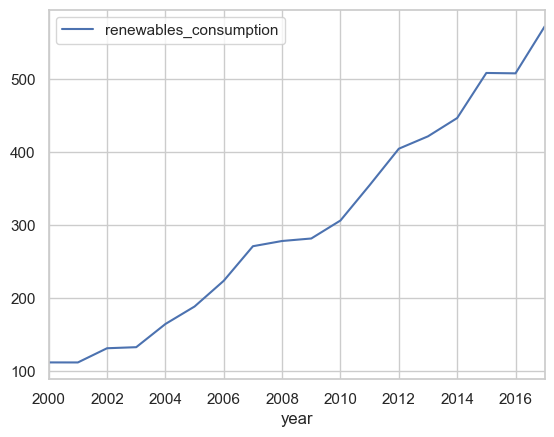

In [281]:
df_DEU_RC.plot()

In [282]:
adfuller_test(df_DEU_RC["renewables_consumption"])

ADF Test Statistic : 5.5933514517395535
p-value : 1.0
#Lags Used : 7
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [283]:
df_DEU_RC["first_difference"] = (df_DEU_RC["renewables_consumption"]
                                 - df_DEU_RC["renewables_consumption"].shift(1))

In [284]:
adfuller_test(df_DEU_RC["first_difference"].dropna())

ADF Test Statistic : -4.369485187555705
p-value : 0.0003360001752226661
#Lags Used : 0
Number of Observations Used : 16
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

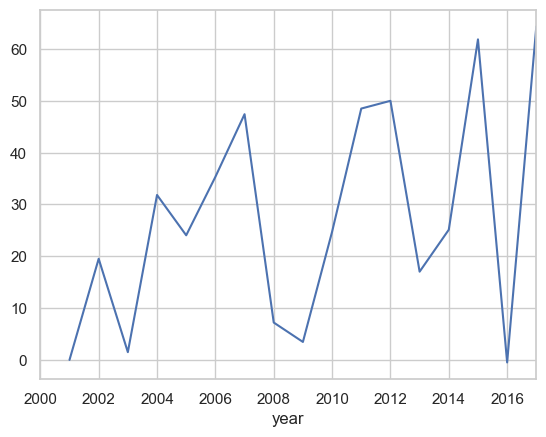

In [285]:
df_DEU_RC["first_difference"].plot()

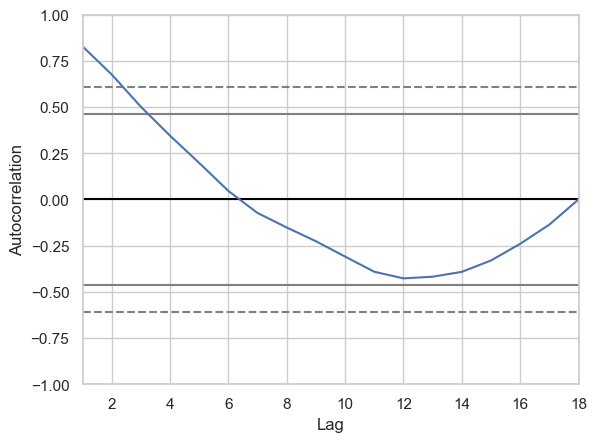

In [286]:
autocorrelation_plot(df_DEU_RC["renewables_consumption"])
plt.grid(True)
plt.show()

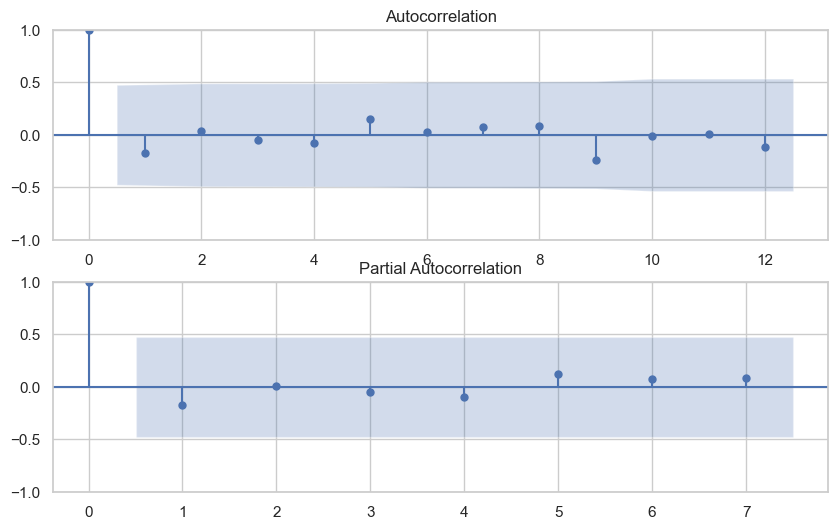

In [287]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_DEU_RC["first_difference"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_DEU_RC["first_difference"].dropna(),lags=7,ax=ax2)

In [288]:
model=ARIMA(df_DEU_RC["renewables_consumption"],order=(2,1,2))
model_fit=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [289]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                  
==================================================================================
Dep. Variable:     renewables_consumption   No. Observations:                   18
Model:                     ARIMA(2, 1, 2)   Log Likelihood                 -76.169
Date:                    Thu, 14 Dec 2023   AIC                            162.339
Time:                            13:43:40   BIC                            166.505
Sample:                        01-01-2000   HQIC                           162.753
                             - 01-01-2017                                         
Covariance Type:                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4741      0.633      2.330      0.020       0.234       2.714
ar.L2         -0.4826      0.642     -0.752      0.452      -1.740       0.775
ma.L1         -1.8475     32.424     -0.057      0.955     -65.397      61.702
ma.L2          0.9959     34.937      0.029      0.977     -67.479      69.471
sigma2       332.0019   1.15e+04      0.029      0.977   -2.21e+04    2.28e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.44   Jarque-Bera (JB):                 0.83
Prob(Q):                              0.51   Prob(JB):                         0.66
Heteroskedasticity (H):               1.88   Skew:                            -0.24
Prob(H) (two-sided):                  0.46   Kurtosis:                         2.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Axes: xlabel='year'>

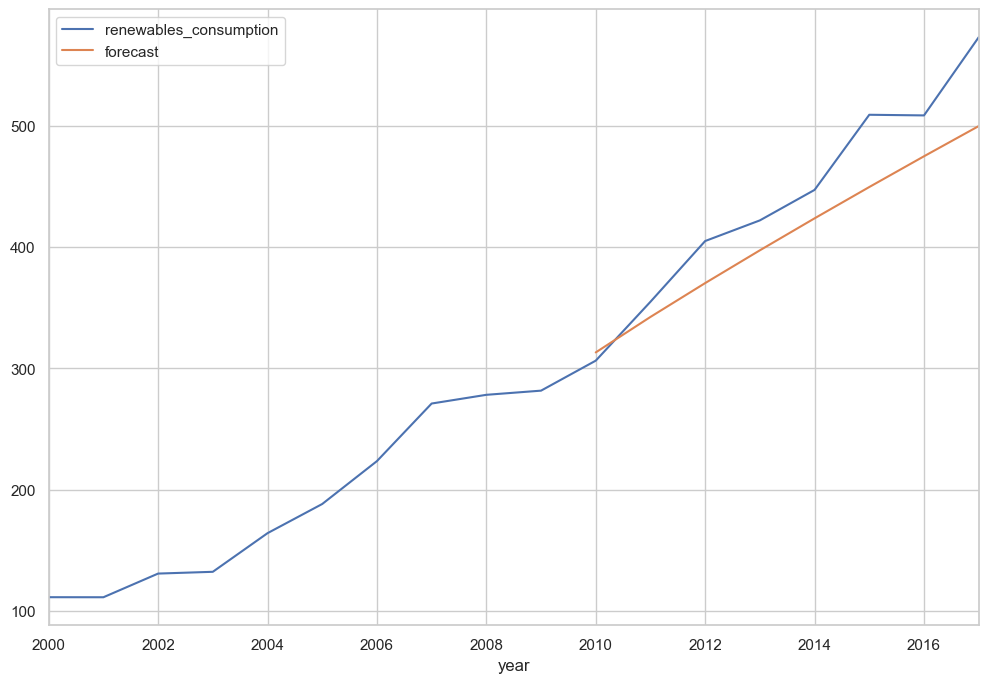

In [290]:
df_DEU_RC["forecast"]=model_fit.predict(start=10,end=17,dynamic=True)
df_DEU_RC[["renewables_consumption","forecast"]].plot(figsize=(12,8))

In [291]:
model=sm.tsa.statespace.SARIMAX(df_DEU_RC["renewables_consumption"],order=(2, 1, 2),seasonal_order=(2,1,2,5))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.11015D+00    |proj g|=  8.70183D-02

At iterate    5    f=  3.08962D+00    |proj g|=  1.50675D-02

At iterate   10    f=  3.04914D+00    |proj g|=  4.82014D-02

At iterate   15    f=  2.95970D+00    |proj g|=  7.07081D-02

At iterate   20    f=  2.94579D+00    |proj g|=  6.60611D-03

At iterate   25    f=  2.94553D+00    |proj g|=  8.11356D-03

At iterate   30    f=  2.94520D+00    |proj g|=  8.12265D-03

At iterate   35    f=  2.94404D+00    |proj g|=  6.99781D-03

At iterate   40    f=  2.94363D+00    |proj g|=  1.03253D-02

At iterate   45    f=  2.94282D+00    |proj g|=  8.39060D-03

At iterate   50    f=  2.94250D+00    |proj g|=  4.63399D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


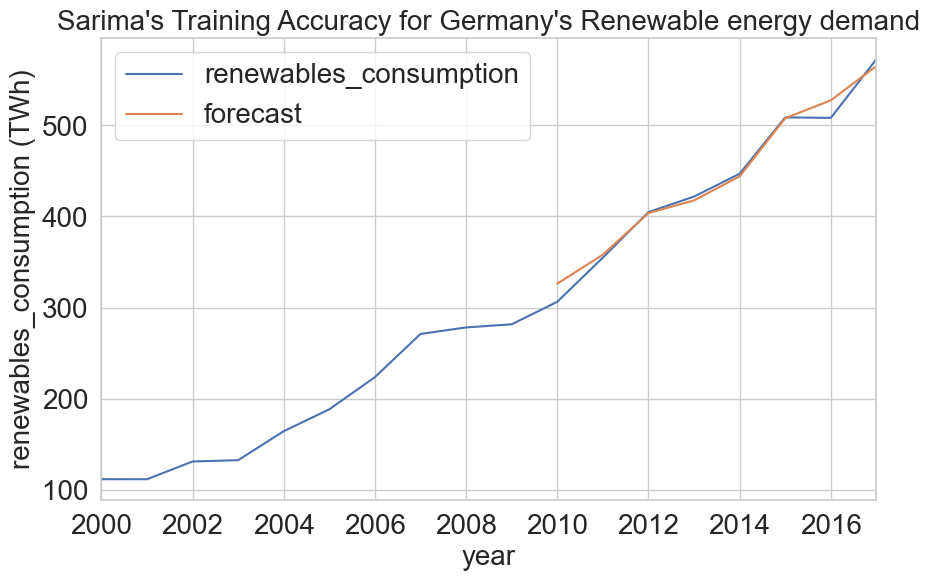

In [292]:
df_DEU_RC["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_DEU_RC[["renewables_consumption","forecast"]].plot(figsize=(10,6))
plt.title("Sarima's Training Accuracy for Germany's Renewable energy demand", fontsize=20)
plt.xlabel("year", fontsize=20)
plt.ylabel("renewables_consumption (TWh)", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

In [293]:
df_DEU_RC[["renewables_consumption","forecast"]]

,renewables_consumption,forecast
year,,
2000-01-01,111.377,NaN
2001-01-01,111.337,NaN
2002-01-01,130.843,NaN
2003-01-01,132.300,NaN
2004-01-01,164.129,NaN
2005-01-01,188.168,NaN
2006-01-01,223.500,NaN
2007-01-01,270.939,NaN
2008-01-01,278.119,NaN


In [294]:
df_DEU_RC_future=pd.concat([df_DEU_RC,get_future_df(df_DEU_RC)])
df_DEU_RC_future.tail(11)

,renewables_consumption,first_difference,forecast
2017-01-01,572.716,64.397,565.273224
2018-01-01,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN


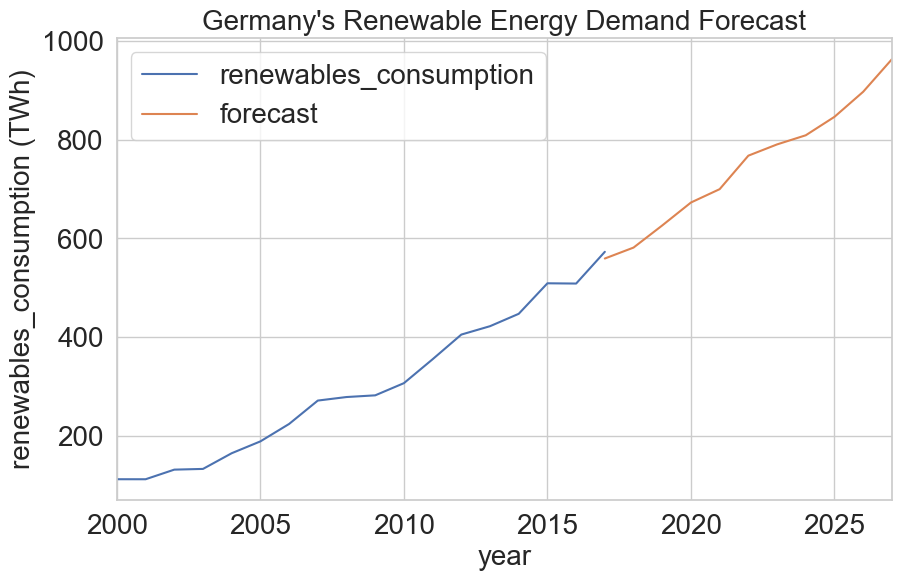

In [295]:
df_DEU_RC_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_DEU_RC_future[["renewables_consumption","forecast"]].plot(figsize=(10,6))
plt.title("Germany's Renewable Energy Demand Forecast", fontsize=20)
plt.xlabel("year", fontsize=20)
plt.ylabel("renewables_consumption (TWh)", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

In [296]:
get_sarima_forecast_percentage_diff(df_DEU_RC_future, "DEU", "renewables_consumption")

DEU's actual 2018 renewables_consumption value: 591.822 TWh
DEU's forecasted 2018 renewables_consumption value: 581.299 TWh

DEU's actual 2019 renewables_consumption value: 638.183 TWh
DEU's forecasted 2019 renewables_consumption value: 626.2 TWh

The Sarima model's renewables_consumption forecast for DEU is 1.78% less in 2018
The Sarima model's renewables_consumption forecast for DEU is 1.88% less in 2019


### ITALY

In [297]:
df_ITA_RC.set_index("year",inplace=True)

<Axes: xlabel='year'>

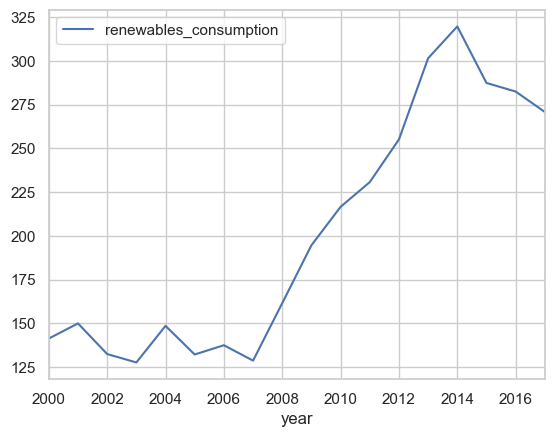

In [298]:
df_ITA_RC.plot()

In [299]:
adfuller_test(df_ITA_RC["renewables_consumption"])

ADF Test Statistic : -0.6219523789387524
p-value : 0.8659441390934567
#Lags Used : 7
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [300]:
df_ITA_RC["first_difference"] = (df_ITA_RC["renewables_consumption"]
                                 - df_ITA_RC["renewables_consumption"].shift(1))

In [301]:
adfuller_test(df_ITA_RC["first_difference"].dropna())

ADF Test Statistic : -2.843553404779664
p-value : 0.05231674138162524
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [302]:
df_ITA_RC["seasonal_first_difference"] = (df_ITA_RC["renewables_consumption"]
                                 - df_ITA_RC["renewables_consumption"].shift(10))

In [303]:
adfuller_test(df_ITA_RC["seasonal_first_difference"].dropna())

ADF Test Statistic : -9.747024366736392
p-value : 8.203978403665454e-17
#Lags Used : 2
Number of Observations Used : 5
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

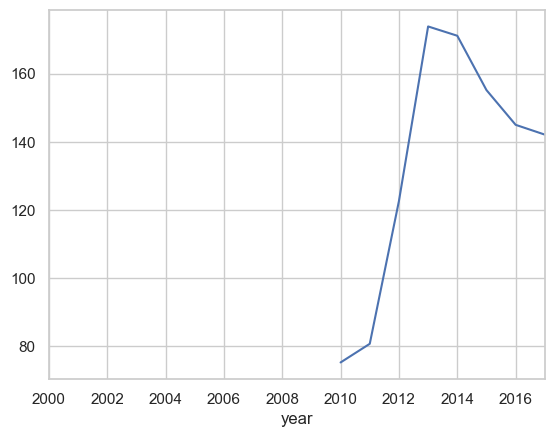

In [304]:
df_ITA_RC["seasonal_first_difference"].plot()

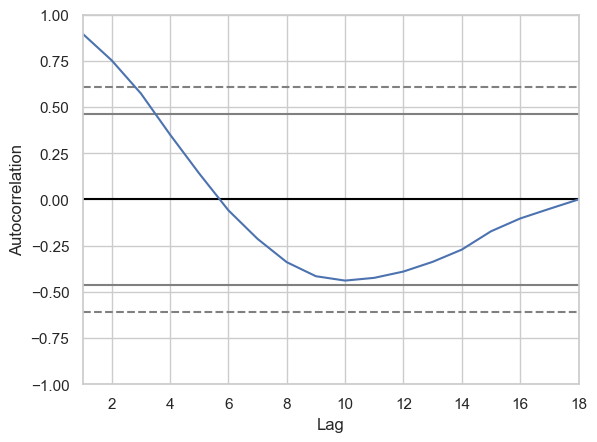

In [305]:
autocorrelation_plot(df_ITA_RC["renewables_consumption"])
plt.grid(True)
plt.show()

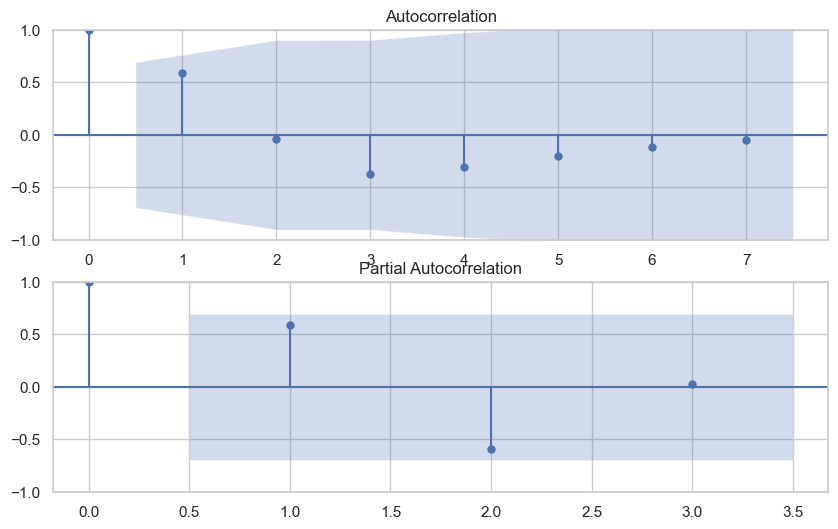

In [306]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_ITA_RC["seasonal_first_difference"].dropna(),lags=7,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_ITA_RC["seasonal_first_difference"].dropna(),lags=3,ax=ax2)

In [307]:
model=ARIMA(df_ITA_RC["renewables_consumption"],order=(1,1,1))
model_fit=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)


In [308]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                  
==================================================================================
Dep. Variable:     renewables_consumption   No. Observations:                   18
Model:                     ARIMA(1, 1, 1)   Log Likelihood                 -75.528
Date:                    Thu, 14 Dec 2023   AIC                            157.056
Time:                            13:43:42   BIC                            159.556
Sample:                        01-01-2000   HQIC                           157.305
                             - 01-01-2017                                         
Covariance Type:                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4744      0.584      0.812      0.417      -0.670       1.619
ma.L1         -0.1316      0.774     -0.170      0.865      -1.649       1.386
sigma2       419.6313    190.558      2.202      0.028      46.144     793.118
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 0.42
Prob(Q):                              0.91   Prob(JB):                         0.81
Heteroskedasticity (H):               2.09   Skew:                            -0.37
Prob(H) (two-sided):                  0.39   Kurtosis:                         2.76
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Axes: xlabel='year'>

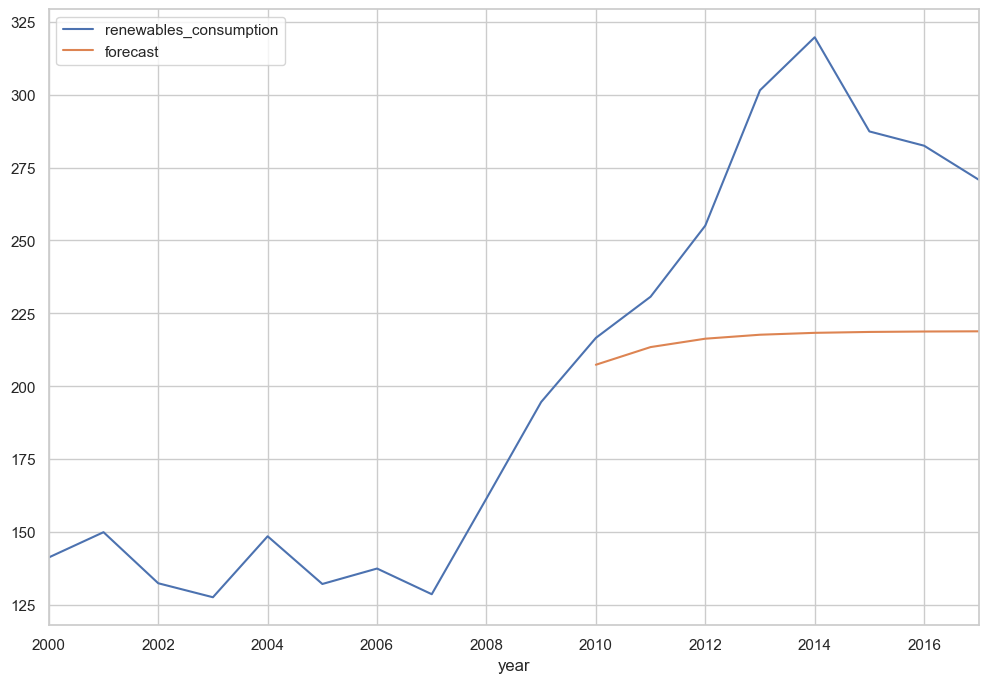

In [309]:
df_ITA_RC["forecast"]=model_fit.predict(start=10,end=17,dynamic=True)
df_ITA_RC[["renewables_consumption","forecast"]].plot(figsize=(12,8))

In [310]:
model=sm.tsa.statespace.SARIMAX(df_ITA_RC["renewables_consumption"],order=(1, 1, 1),seasonal_order=(1,1,1,6))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.01334D+00    |proj g|=  2.00830D-01

At iterate    5    f=  2.95541D+00    |proj g|=  2.79671D-02

At iterate   10    f=  2.91673D+00    |proj g|=  5.50870D-02

At iterate   15    f=  2.88351D+00    |proj g|=  1.47521D-03

At iterate   20    f=  2.88295D+00    |proj g|=  8.64565D-03

At iterate   25    f=  2.88244D+00    |proj g|=  1.13030D-02

At iterate   30    f=  2.88222D+00    |proj g|=  4.22823D-03

At iterate   35    f=  2.88212D+00    |proj g|=  1.14703D-03

At iterate   40    f=  2.88205D+00    |proj g|=  1.19207D-03

At iterate   45    f=  2.88201D+00    |proj g|=  1.69637D-03

At iterate   50    f=  2.88198D+00    |proj g|=  6.70677D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

<Axes: xlabel='year'>

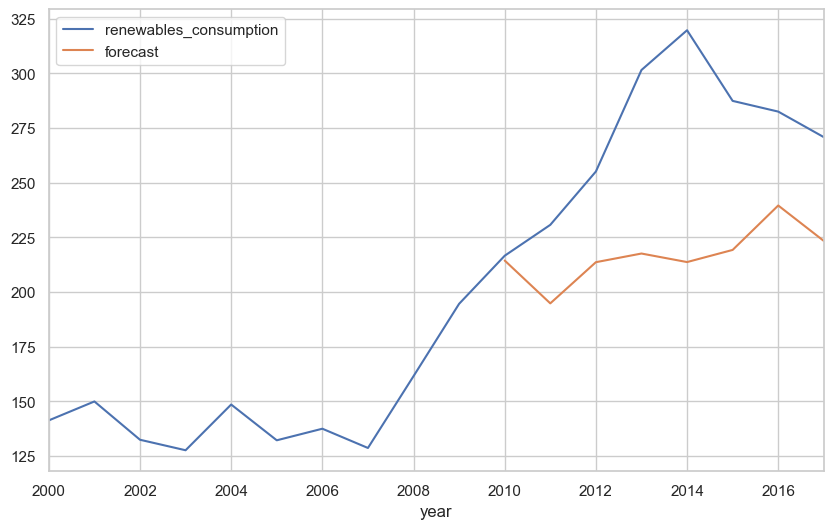

In [311]:
df_ITA_RC["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_ITA_RC[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [312]:
df_ITA_RC[["renewables_consumption","forecast"]]

,renewables_consumption,forecast
year,,
2000-01-01,141.333,NaN
2001-01-01,149.984,NaN
2002-01-01,132.479,NaN
2003-01-01,127.680,NaN
2004-01-01,148.583,NaN
2005-01-01,132.228,NaN
2006-01-01,137.523,NaN
2007-01-01,128.720,NaN
2008-01-01,161.552,NaN


In [313]:
df_ITA_RC_future=pd.concat([df_ITA_RC,get_future_df(df_ITA_RC)])
df_ITA_RC_future.tail(11)

,renewables_consumption,first_difference,seasonal_first_difference,forecast
2017-01-01,270.806,-11.675,142.086,223.358652
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

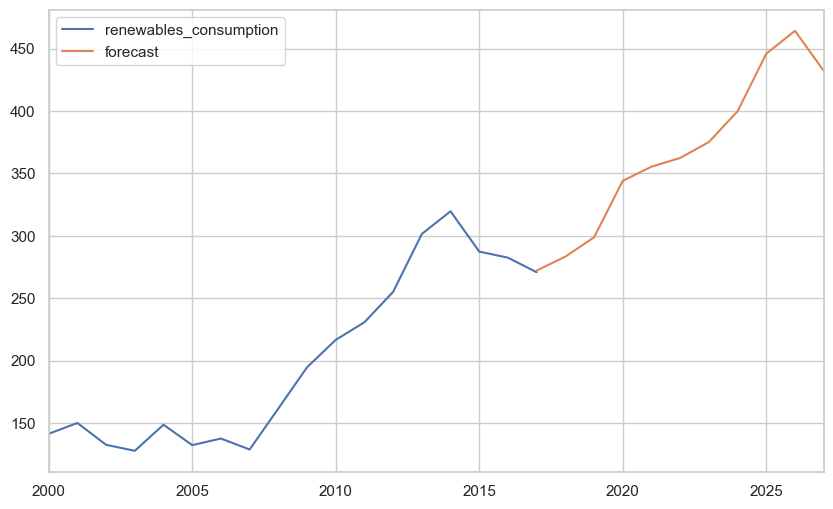

In [314]:
df_ITA_RC_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_ITA_RC_future[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [315]:
get_sarima_forecast_percentage_diff(df_ITA_RC_future, "ITA", "renewables_consumption")

ITA's actual 2018 renewables_consumption value: 296.093 TWh
ITA's forecasted 2018 renewables_consumption value: 283.354 TWh

ITA's actual 2019 renewables_consumption value: 288.399 TWh
ITA's forecasted 2019 renewables_consumption value: 298.791 TWh

The Sarima model's renewables_consumption forecast for ITA is 4.3% less in 2018
The Sarima model's renewables_consumption forecast for ITA is 3.6% more in 2019


### JAPAN

In [316]:
df_JPN_RC.set_index("year",inplace=True)

<Axes: xlabel='year'>

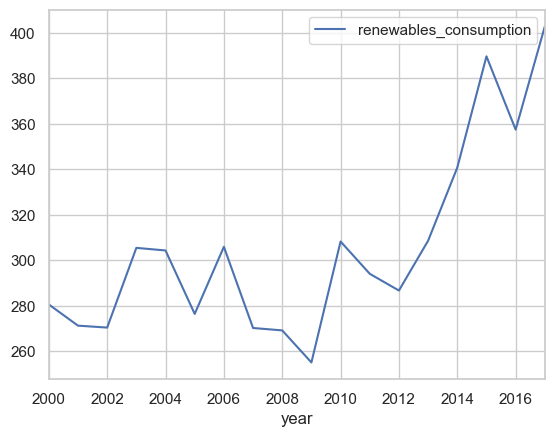

In [317]:
df_JPN_RC.plot()

In [318]:
adfuller_test(df_JPN_RC["renewables_consumption"])

ADF Test Statistic : -0.7537862088790901
p-value : 0.8323216896211203
#Lags Used : 7
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [319]:
df_JPN_RC["first_difference"] = (df_JPN_RC["renewables_consumption"]
                                 - df_JPN_RC["renewables_consumption"].shift(1))

In [320]:
adfuller_test(df_JPN_RC["first_difference"].dropna())

ADF Test Statistic : 0.06897294773853371
p-value : 0.9638777649533392
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [321]:
from scipy.stats import boxcox

# Performing Box-Cox transformation
df_JPN_RC["boxcox_value"], lam = boxcox(df_JPN_RC["renewables_consumption"])

In [322]:
# Differencing after transformation
df_JPN_RC["diff_boxcox"] = df_JPN_RC["boxcox_value"].diff()

In [323]:
adfuller_test(df_JPN_RC["diff_boxcox"].dropna())

ADF Test Statistic : -5.689700143874509
p-value : 8.124598485418324e-07
#Lags Used : 0
Number of Observations Used : 16
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

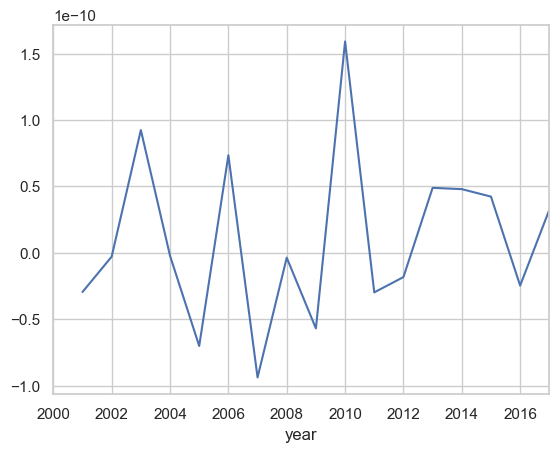

In [324]:
df_JPN_RC["diff_boxcox"].plot()

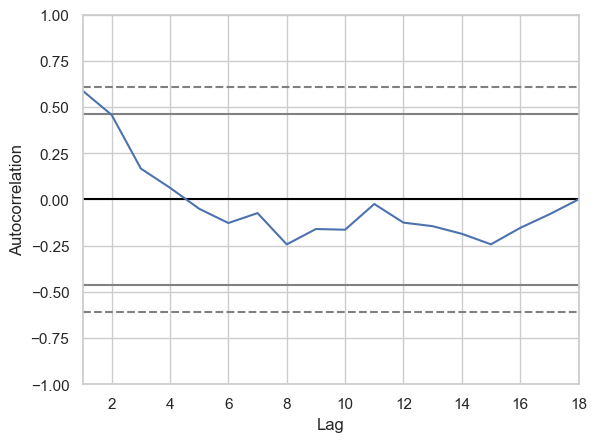

In [325]:
autocorrelation_plot(df_JPN_RC["renewables_consumption"])
plt.grid(True)
plt.show()

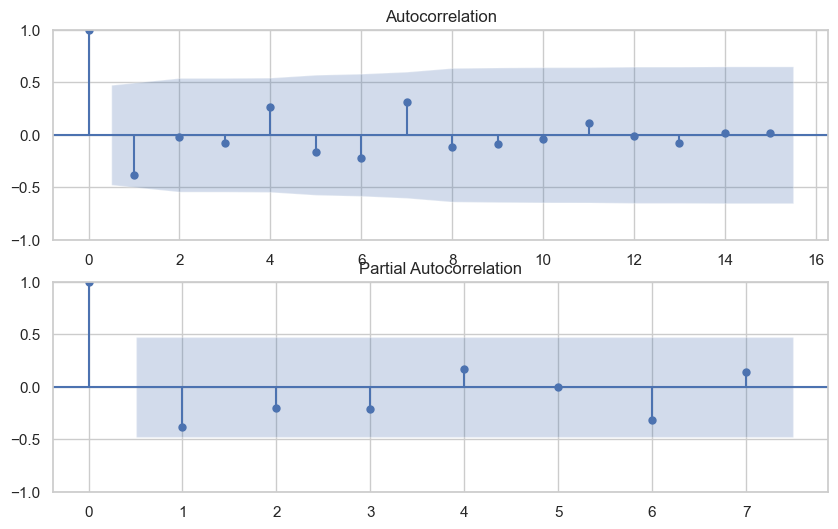

In [326]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_JPN_RC["diff_boxcox"].dropna(),lags=15,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_JPN_RC["diff_boxcox"].dropna(),lags=7,ax=ax2)

In [327]:
model=sm.tsa.statespace.SARIMAX(df_JPN_RC["renewables_consumption"],order=(4, 1, 2),seasonal_order=(4,1,2,5))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.11737D+13    |proj g|=  9.88152D+17
  ys=-3.409E-01  -gs= 7.475E+01 BFGS update SKIPPED

At iterate    5    f=  2.13623D+07    |proj g|=  7.63335D+09

At iterate   10    f=  3.01518D+06    |proj g|=  4.04920D+08

At iterate   15    f=  4.08923D+05    |proj g|=  2.02922D+07

At iterate   20    f=  5.47285D+04    |proj g|=  1.00539D+06

At iterate   25    f=  6.78490D+03    |proj g|=  4.68985D+04

At iterate   30    f=  6.35355D+02    |proj g|=  1.81351D+03

At iterate   35    f=  5.32103D+01    |proj g|=  3.49250D+02

At iterate   40    f=  4.91148D+00    |proj g|=  5.45424D+00

At iterate   45    f=  3.06528D+00    |proj g|=  3.09160D-01

At iterate   50    f=  3.03818D+00    |proj g|=  2.21890D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

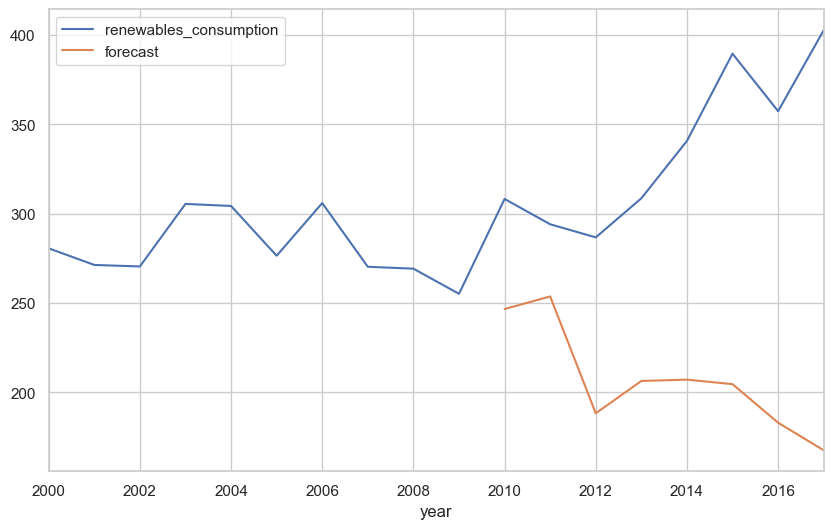

In [328]:
df_JPN_RC["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_JPN_RC[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [329]:
df_JPN_RC[["renewables_consumption","forecast"]]

,renewables_consumption,forecast
year,,
2000-01-01,280.645,NaN
2001-01-01,271.331,NaN
2002-01-01,270.484,NaN
2003-01-01,305.495,NaN
2004-01-01,304.355,NaN
2005-01-01,276.486,NaN
2006-01-01,305.962,NaN
2007-01-01,270.301,NaN
2008-01-01,269.245,NaN


In [330]:
df_JPN_RC_future=pd.concat([df_JPN_RC,get_future_df(df_JPN_RC)])
df_JPN_RC_future.tail(11)

,renewables_consumption,first_difference,boxcox_value,diff_boxcox,forecast
2017-01-01,402.741,45.312,0.269477,3.233031e-11,167.57218
2018-01-01,NaN,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN,NaN


<Axes: >

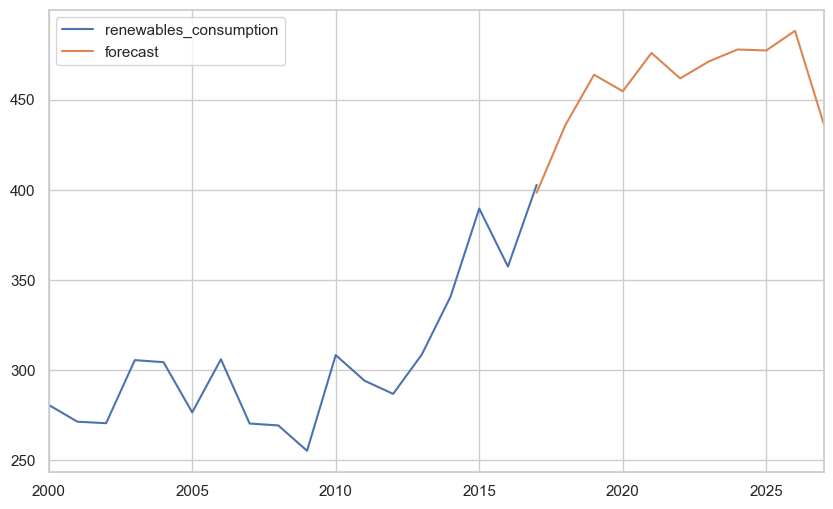

In [331]:
df_JPN_RC_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_JPN_RC_future[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [332]:
get_sarima_forecast_percentage_diff(df_JPN_RC_future, "JPN", "renewables_consumption")

JPN's actual 2018 renewables_consumption value: 441.828 TWh
JPN's forecasted 2018 renewables_consumption value: 435.939 TWh

JPN's actual 2019 renewables_consumption value: 483.082 TWh
JPN's forecasted 2019 renewables_consumption value: 463.905 TWh

The Sarima model's renewables_consumption forecast for JPN is 1.33% less in 2018
The Sarima model's renewables_consumption forecast for JPN is 3.97% less in 2019


### UNITED KINGDOM

In [333]:
df_GBR_RC.set_index("year",inplace=True)

<Axes: xlabel='year'>

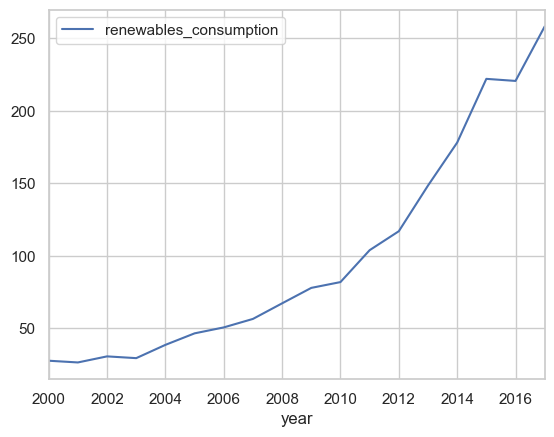

In [334]:
df_GBR_RC.plot()

In [335]:
adfuller_test(df_GBR_RC["renewables_consumption"])

ADF Test Statistic : 2.399750108667479
p-value : 0.9990101919755713
#Lags Used : 5
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [336]:
df_GBR_RC["first_difference"] = (df_GBR_RC["renewables_consumption"]
                                 - df_GBR_RC["renewables_consumption"].shift(1))

In [337]:
adfuller_test(df_GBR_RC["first_difference"].dropna())

ADF Test Statistic : 0.33629428092317837
p-value : 0.9789497252192728
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [338]:
df_GBR_RC["seasonal_first_difference"] = (df_GBR_RC["renewables_consumption"]
                                 - df_GBR_RC["renewables_consumption"].shift(3))

In [339]:
adfuller_test(df_GBR_RC["seasonal_first_difference"].dropna())

ADF Test Statistic : -1.9481574344162962
p-value : 0.30975620997721787
#Lags Used : 2
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


<Axes: xlabel='year'>

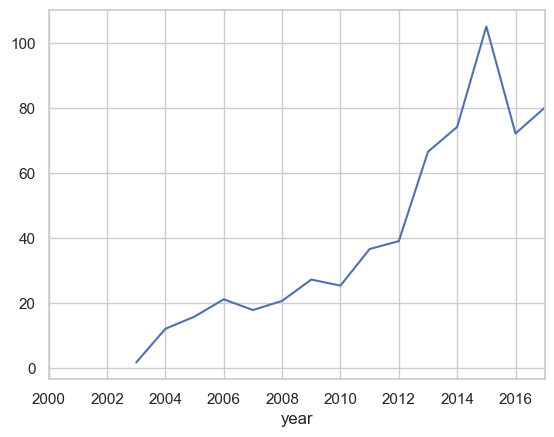

In [340]:
df_GBR_RC["seasonal_first_difference"].plot()

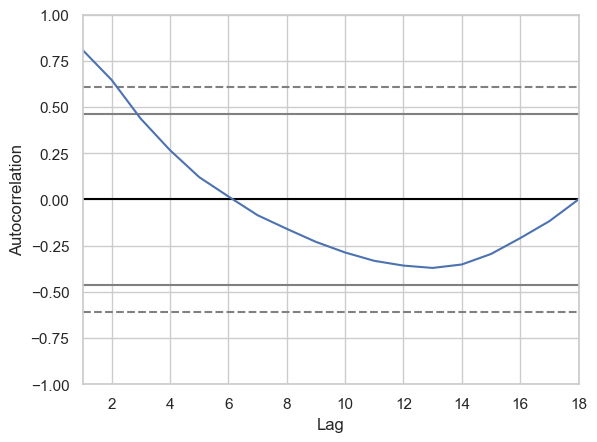

In [341]:
autocorrelation_plot(df_GBR_RC["renewables_consumption"])
plt.grid(True)
plt.show()

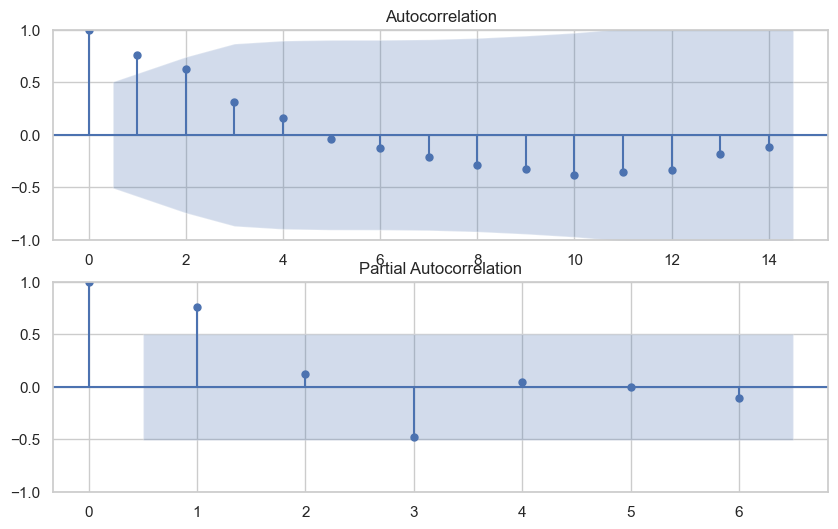

In [342]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_GBR_RC["seasonal_first_difference"].dropna(),lags=14,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_GBR_RC["seasonal_first_difference"].dropna(),lags=6,ax=ax2)

In [343]:
model=sm.tsa.statespace.SARIMAX(df_GBR_RC["renewables_consumption"],order=(2, 1, 4),seasonal_order=(2,1,4,7))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.70700D+00    |proj g|=  9.65428D-01

At iterate    5    f=  2.32711D+00    |proj g|=  7.02788D-02

At iterate   10    f=  2.26691D+00    |proj g|=  2.19137D-02

At iterate   15    f=  2.26168D+00    |proj g|=  1.42544D-02

At iterate   20    f=  2.24993D+00    |proj g|=  5.30358D-02

At iterate   25    f=  2.23003D+00    |proj g|=  5.13819D-02

At iterate   30    f=  2.21581D+00    |proj g|=  4.43678D-03

At iterate   35    f=  2.21568D+00    |proj g|=  2.89334D-03

At iterate   40    f=  2.21515D+00    |proj g|=  4.09289D-03

At iterate   45    f=  2.21471D+00    |proj g|=  6.05501D-03

At iterate   50    f=  2.21455D+00    |proj g|=  2.01214D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

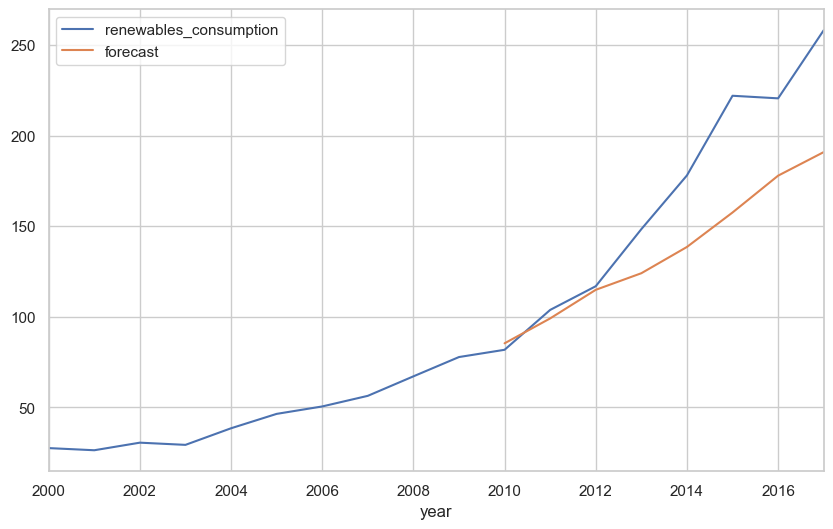

In [344]:
df_GBR_RC["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_GBR_RC[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [345]:
df_GBR_RC[["renewables_consumption","forecast"]]

,renewables_consumption,forecast
year,,
2000-01-01,27.540,NaN
2001-01-01,26.349,NaN
2002-01-01,30.535,NaN
2003-01-01,29.320,NaN
2004-01-01,38.480,NaN
2005-01-01,46.419,NaN
2006-01-01,50.521,NaN
2007-01-01,56.377,NaN
2008-01-01,67.131,NaN


In [346]:
df_GBR_RC_future=pd.concat([df_GBR_RC,get_future_df(df_GBR_RC)])
df_GBR_RC_future.tail(11)

,renewables_consumption,first_difference,seasonal_first_difference,forecast
2017-01-01,258.123,37.578,80.115,190.874652
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

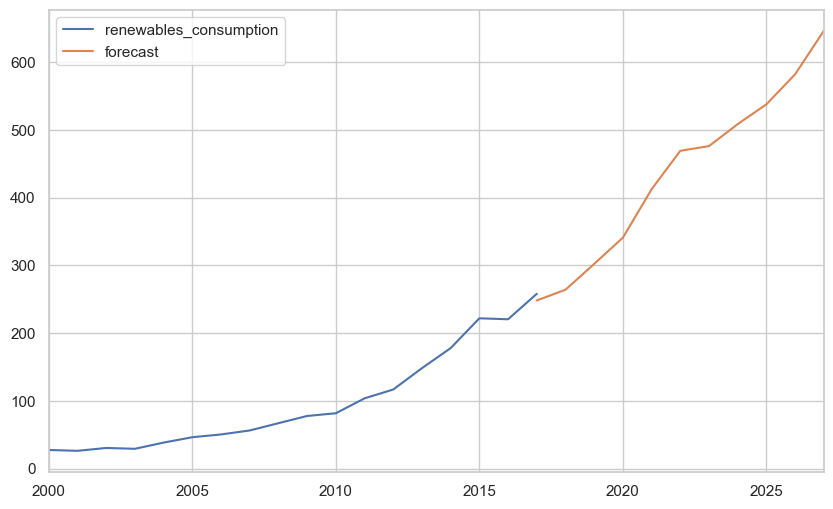

In [347]:
df_GBR_RC_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_GBR_RC_future[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [348]:
get_sarima_forecast_percentage_diff(df_GBR_RC_future, "GBR", "renewables_consumption")

GBR's actual 2018 renewables_consumption value: 288.536 TWh
GBR's forecasted 2018 renewables_consumption value: 264.137 TWh

GBR's actual 2019 renewables_consumption value: 314.788 TWh
GBR's forecasted 2019 renewables_consumption value: 302.293 TWh

The Sarima model's renewables_consumption forecast for GBR is 8.46% less in 2018
The Sarima model's renewables_consumption forecast for GBR is 3.97% less in 2019


### USA

In [349]:
df_USA_RC.set_index("year",inplace=True)

<Axes: xlabel='year'>

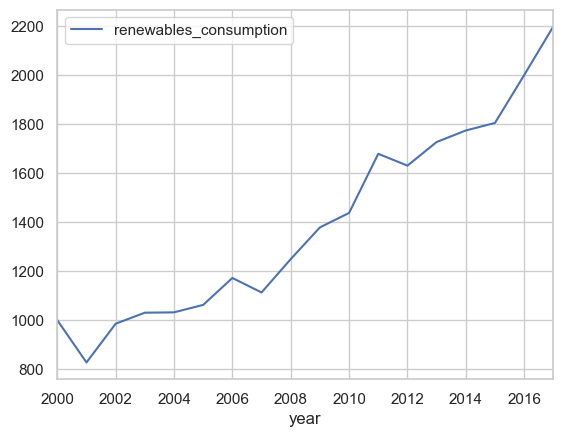

In [350]:
df_USA_RC.plot()

In [351]:
adfuller_test(df_USA_RC["renewables_consumption"])

ADF Test Statistic : 2.0993200197222532
p-value : 0.9987888921165782
#Lags Used : 6
Number of Observations Used : 11
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [352]:
df_USA_RC["first_difference"] = (df_USA_RC["renewables_consumption"]
                                 - df_USA_RC["renewables_consumption"].shift(1))

In [353]:
adfuller_test(df_USA_RC["first_difference"].dropna())

ADF Test Statistic : -0.6439674387516658
p-value : 0.860734555317298
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [354]:
df_USA_RC["seasonal_first_difference"] = (df_USA_RC["renewables_consumption"]
                                 - df_USA_RC["renewables_consumption"].shift(7))

In [355]:
adfuller_test(df_USA_RC["seasonal_first_difference"].dropna())

ADF Test Statistic : -3.2893592747629254
p-value : 0.015360867175351888
#Lags Used : 2
Number of Observations Used : 8
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

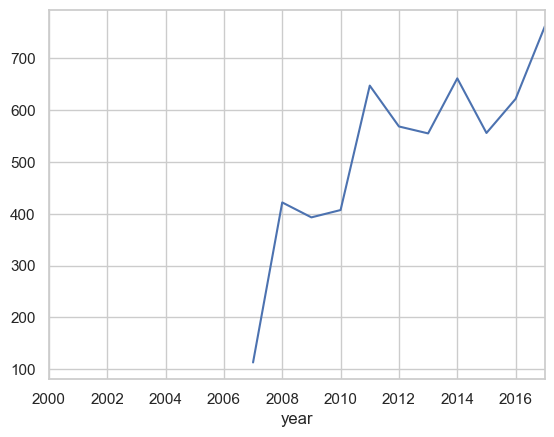

In [356]:
df_USA_RC["seasonal_first_difference"].plot()

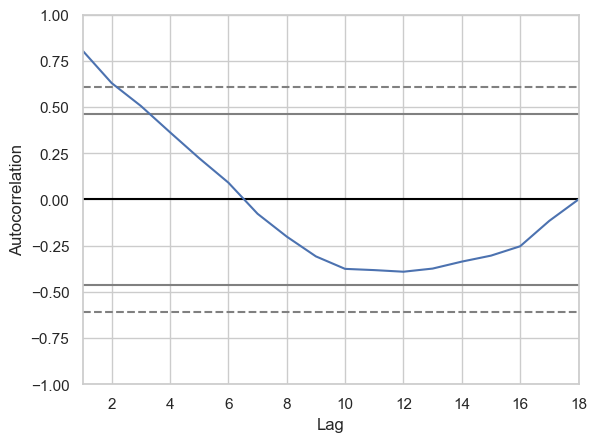

In [357]:
autocorrelation_plot(df_USA_RC["renewables_consumption"])
plt.grid(True)
plt.show()

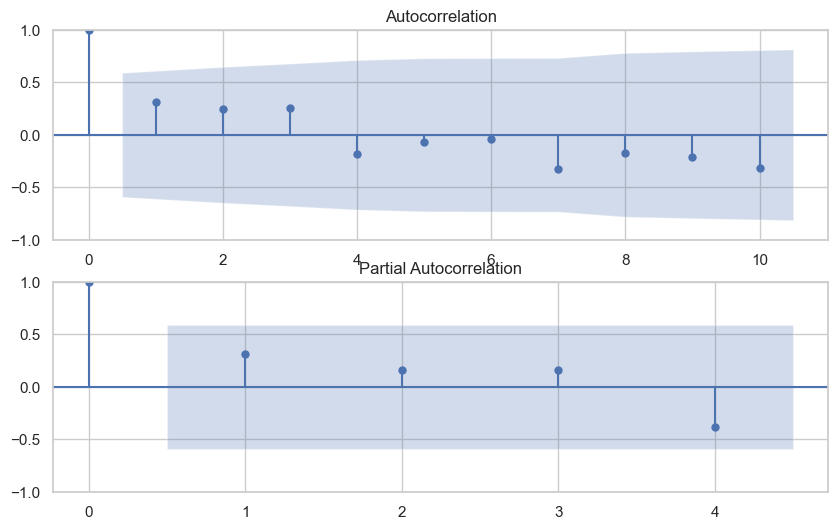

In [358]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_USA_RC["seasonal_first_difference"].dropna(),lags=10,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_USA_RC["seasonal_first_difference"].dropna(),lags=4,ax=ax2)

In [359]:
model=sm.tsa.statespace.SARIMAX(df_USA_RC["renewables_consumption"],order=(2, 1, 2),seasonal_order=(2,1,2,7))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.25268D+13    |proj g|=  9.49729D+17

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    9      2     18      1     0     0   6.194D+09   3.794D+07
  F =   37939152.401638009     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


<Axes: xlabel='year'>

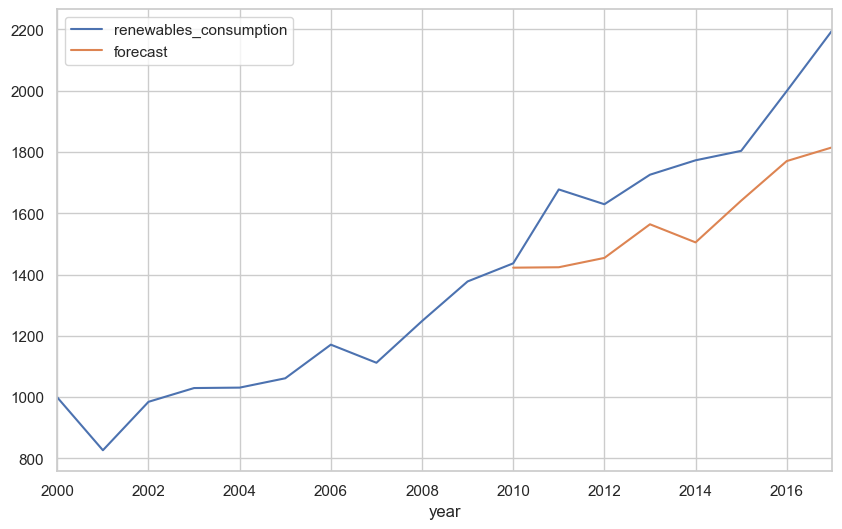

In [360]:
df_USA_RC["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_USA_RC[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [361]:
df_USA_RC[["renewables_consumption","forecast"]]

,renewables_consumption,forecast
year,,
2000-01-01,998.832,NaN
2001-01-01,826.501,NaN
2002-01-01,984.608,NaN
2003-01-01,1029.536,NaN
2004-01-01,1030.934,NaN
2005-01-01,1061.403,NaN
2006-01-01,1171.152,NaN
2007-01-01,1112.113,NaN
2008-01-01,1248.159,NaN


In [362]:
df_USA_RC_future=pd.concat([df_USA_RC,get_future_df(df_USA_RC)])
df_USA_RC_future.tail(11)

,renewables_consumption,first_difference,seasonal_first_difference,forecast
2017-01-01,2197.375,198.599,760.831,1815.302717
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

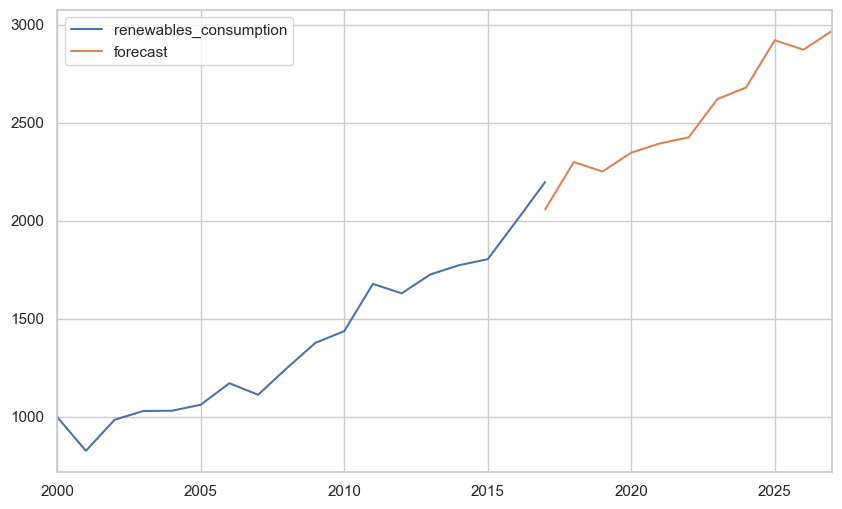

In [363]:
df_USA_RC_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_USA_RC_future[["renewables_consumption","forecast"]].plot(figsize=(10,6))

In [364]:
get_sarima_forecast_percentage_diff(df_USA_RC_future, "USA", "renewables_consumption")

USA's actual 2018 renewables_consumption value: 2248.427 TWh
USA's forecasted 2018 renewables_consumption value: 2299.038 TWh

USA's actual 2019 renewables_consumption value: 2290.491 TWh
USA's forecasted 2019 renewables_consumption value: 2250.76 TWh

The Sarima model's renewables_consumption forecast for USA is 2.25% more in 2018
The Sarima model's renewables_consumption forecast for USA is 1.73% less in 2019


### RENEWABLES ELECTRICITY

In [365]:
df_CAN_RE = df_CAN[["year", "renewables_electricity"]]
df_CAN_RE

,year,renewables_electricity
0,2000-01-01,363.460
1,2001-01-01,338.984
2,2002-01-01,356.558
3,2003-01-01,344.009
4,2004-01-01,347.244
5,2005-01-01,369.001
6,2006-01-01,360.582
7,2007-01-01,375.434
8,2008-01-01,384.642
9,2009-01-01,381.463


In [366]:
df_FRA_RE = df_FRA[["year", "renewables_electricity"]]
df_FRA_RE

,year,renewables_electricity
18,2000-01-01,69.403
19,2001-01-01,77.739
20,2002-01-01,64.207
21,2003-01-01,63.057
22,2004-01-01,63.940
23,2005-01-01,56.325
24,2006-01-01,62.340
25,2007-01-01,65.908
26,2008-01-01,73.826
27,2009-01-01,69.658


In [367]:
df_DEU_RE = df_DEU[["year", "renewables_electricity"]]
df_DEU_RE

,year,renewables_electricity
36,2000-01-01,37.840
37,2001-01-01,39.000
38,2002-01-01,46.100
39,2003-01-01,46.100
40,2004-01-01,57.500
41,2005-01-01,63.500
42,2006-01-01,72.500
43,2007-01-01,89.400
44,2008-01-01,94.200
45,2009-01-01,95.938


In [368]:
df_ITA_RE = df_ITA[["year", "renewables_electricity"]]
df_ITA_RE

,year,renewables_electricity
54,2000-01-01,50.879
55,2001-01-01,54.348
56,2002-01-01,48.316
57,2003-01-01,46.865
58,2004-01-01,53.872
59,2005-01-01,48.440
60,2006-01-01,50.634
61,2007-01-01,47.715
62,2008-01-01,58.164
63,2009-01-01,69.254


In [369]:
df_JPN_RE = df_JPN[["year", "renewables_electricity"]]
df_JPN_RE

,year,renewables_electricity
72,2000-01-01,125.398
73,2001-01-01,122.919
74,2002-01-01,122.746
75,2003-01-01,137.851
76,2004-01-01,137.534
77,2005-01-01,124.983
78,2006-01-01,137.313
79,2007-01-01,125.323
80,2008-01-01,121.830
81,2009-01-01,122.695


In [370]:
df_GBR_RE = df_GBR[["year", "renewables_electricity"]]
df_GBR_RE

,year,renewables_electricity
90,2000-01-01,9.970
91,2001-01-01,9.549
92,2002-01-01,11.125
93,2003-01-01,10.619
94,2004-01-01,14.138
95,2005-01-01,16.937
96,2006-01-01,18.106
97,2007-01-01,19.691
98,2008-01-01,21.847
99,2009-01-01,25.245


In [371]:
df_USA_RE = df_USA[["year", "renewables_electricity"]]
df_USA_RE

,year,renewables_electricity
108,2000-01-01,350.939
109,2001-01-01,278.906
110,2002-01-01,334.695
111,2003-01-01,346.758
112,2004-01-01,342.996
113,2005-01-01,351.093
114,2006-01-01,379.214
115,2007-01-01,345.851
116,2008-01-01,374.644
117,2009-01-01,413.096


### CANADA

In [372]:
df_CAN_RE.set_index("year",inplace=True)

<Axes: xlabel='year'>

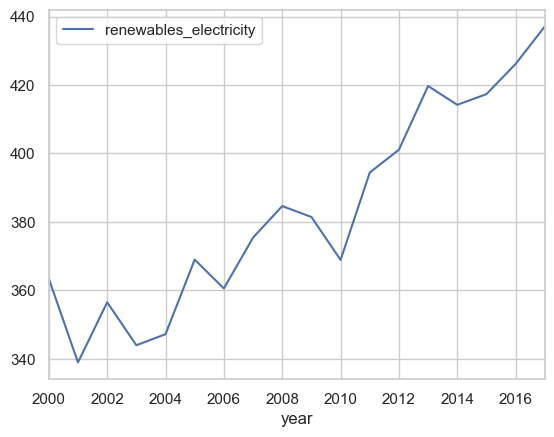

In [373]:
df_CAN_RE.plot()

In [374]:
adfuller_test(df_CAN_RE["renewables_electricity"])

ADF Test Statistic : 1.29667257433704
p-value : 0.9965902403319155
#Lags Used : 7
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [375]:
df_CAN_RE["first_difference"] = (df_CAN_RE["renewables_electricity"]
                                 - df_CAN_RE["renewables_electricity"].shift(1))

In [376]:
adfuller_test(df_CAN_RE["first_difference"].dropna())

ADF Test Statistic : -2.0732340515608656
p-value : 0.2554126074492197
#Lags Used : 4
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [377]:
df_CAN_RE["seasonal_first_difference"] = (df_CAN_RE["renewables_electricity"]
                                 - df_CAN_RE["renewables_electricity"].shift(2))

In [378]:
adfuller_test(df_CAN_RE["seasonal_first_difference"].dropna())

ADF Test Statistic : -3.364593346028286
p-value : 0.012226753005658291
#Lags Used : 1
Number of Observations Used : 14
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

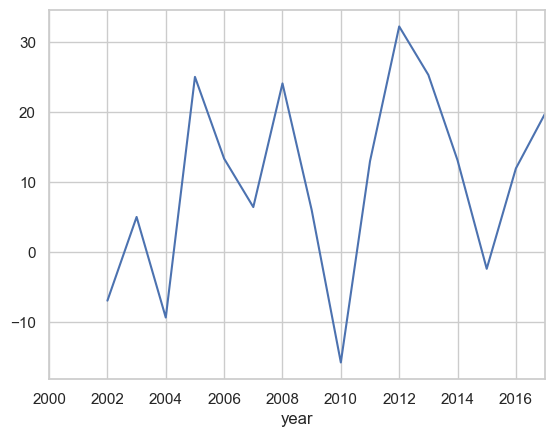

In [379]:
df_CAN_RE["seasonal_first_difference"].plot()

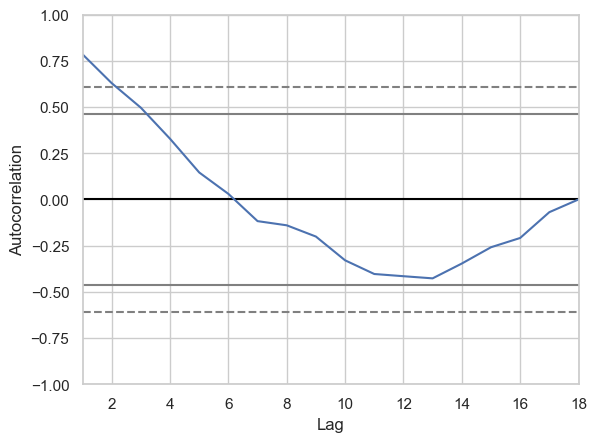

In [380]:
autocorrelation_plot(df_CAN_RE["renewables_electricity"])
plt.grid(True)
plt.show()

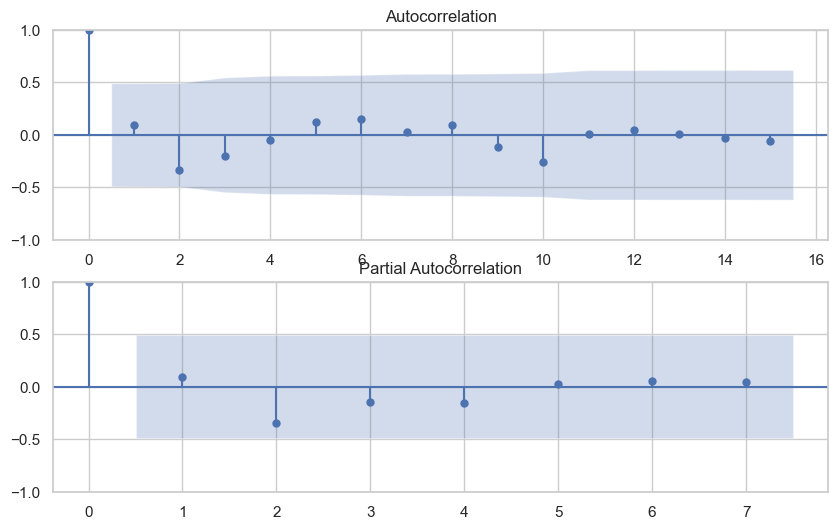

In [381]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_CAN_RE["seasonal_first_difference"].dropna(),lags=15,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_CAN_RE["seasonal_first_difference"].dropna(),lags=7,ax=ax2)

In [382]:
model=sm.tsa.statespace.SARIMAX(df_CAN_RE["renewables_electricity"],order=(1, 1, 1),seasonal_order=(1,1,1,5))
results=model.fit()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.73812D+00    |proj g|=  9.54781D-02

At iterate    5    f=  2.71224D+00    |proj g|=  2.48469D-02

At iterate   10    f=  2.70700D+00    |proj g|=  1.06374D-02

At iterate   15    f=  2.70488D+00    |proj g|=  2.59575D-03

At iterate   20    f=  2.70440D+00    |proj g|=  1.86007D-04

At iterate   25    f=  2.70437D+00    |proj g|=  1.00946D-03

At iterate   30    f=  2.70433D+00    |proj g|=  6.53539D-04

At iterate   35    f=  2.70433D+00    |proj g|=  2.20271D-04

At iterate   40    f=  2.70432D+00    |proj g|=  3.29959D-05

At iterate   45    f=  2.70432D+00    |proj g|=  9.19259D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


<Axes: xlabel='year'>

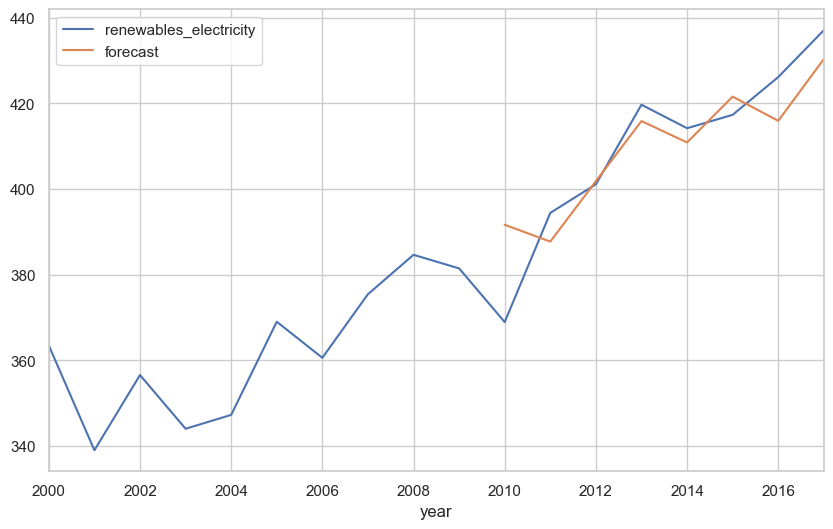

In [383]:
df_CAN_RE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_CAN_RE[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [384]:
df_CAN_RE[["renewables_electricity","forecast"]]

,renewables_electricity,forecast
year,,
2000-01-01,363.460,NaN
2001-01-01,338.984,NaN
2002-01-01,356.558,NaN
2003-01-01,344.009,NaN
2004-01-01,347.244,NaN
2005-01-01,369.001,NaN
2006-01-01,360.582,NaN
2007-01-01,375.434,NaN
2008-01-01,384.642,NaN


In [385]:
df_CAN_RE_future=pd.concat([df_CAN_RE,get_future_df(df_CAN_RE)])
df_CAN_RE_future.tail(11)

,renewables_electricity,first_difference,seasonal_first_difference,forecast
2017-01-01,437.096,10.942,19.757,430.35958
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

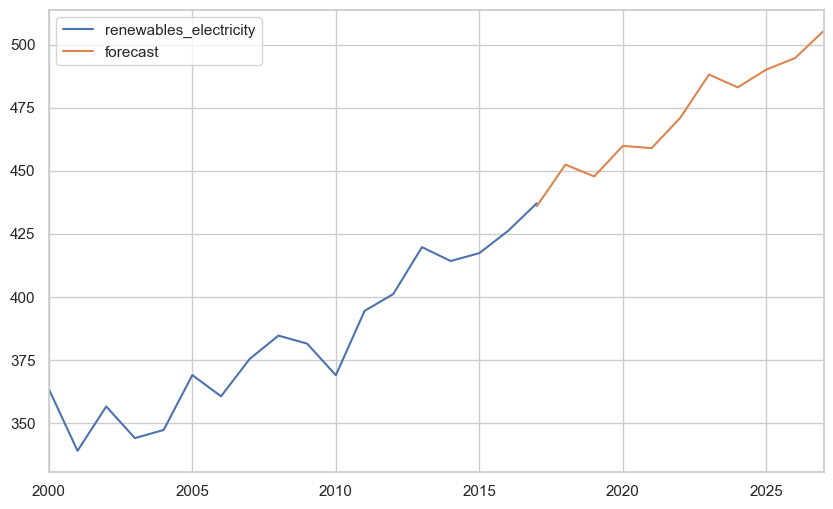

In [386]:
df_CAN_RE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_CAN_RE_future[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [387]:
get_sarima_forecast_percentage_diff(df_CAN_RE_future, "CAN", "renewables_electricity")

CAN's actual 2018 renewables_electricity value: 429.615 TWh
CAN's forecasted 2018 renewables_electricity value: 452.416 TWh

CAN's actual 2019 renewables_electricity value: 423.82 TWh
CAN's forecasted 2019 renewables_electricity value: 447.723 TWh

The Sarima model's renewables_electricity forecast for CAN is 5.31% more in 2018
The Sarima model's renewables_electricity forecast for CAN is 5.64% more in 2019


### FRANCE

In [388]:
df_FRA_RE.set_index("year",inplace=True)

<Axes: xlabel='year'>

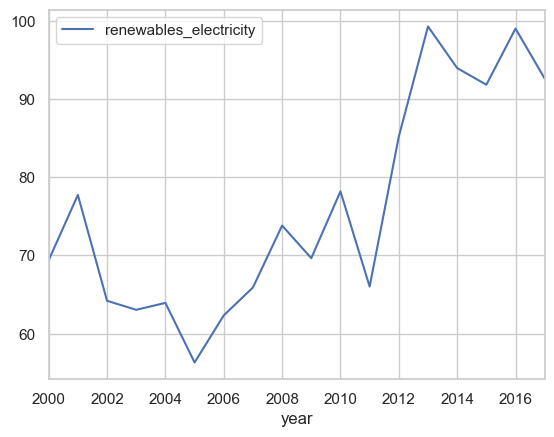

In [389]:
df_FRA_RE.plot()

In [390]:
adfuller_test(df_FRA_RE["renewables_electricity"])

ADF Test Statistic : 1.498757938117241
p-value : 0.9975196861807111
#Lags Used : 7
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [391]:
df_FRA_RE["first_difference"] = (df_FRA_RE["renewables_electricity"]
                                 - df_FRA_RE["renewables_electricity"].shift(1))

In [392]:
adfuller_test(df_FRA_RE["first_difference"].dropna())

ADF Test Statistic : -5.653754566485018
p-value : 9.726528443060642e-07
#Lags Used : 6
Number of Observations Used : 10
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

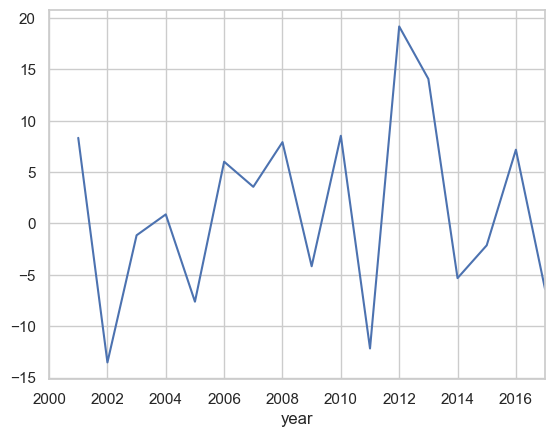

In [393]:
df_FRA_RE["first_difference"].plot()

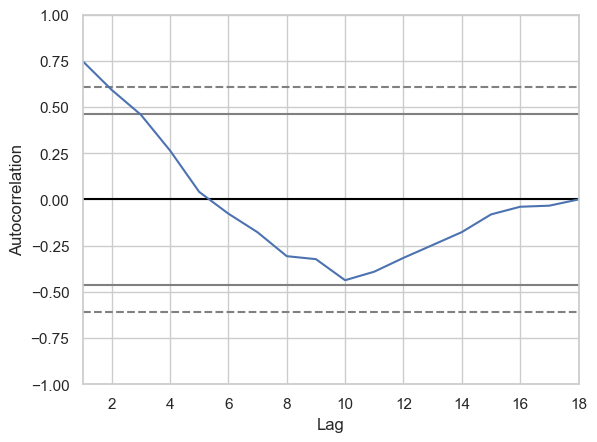

In [394]:
autocorrelation_plot(df_FRA_RE["renewables_electricity"])
plt.grid(True)
plt.show()

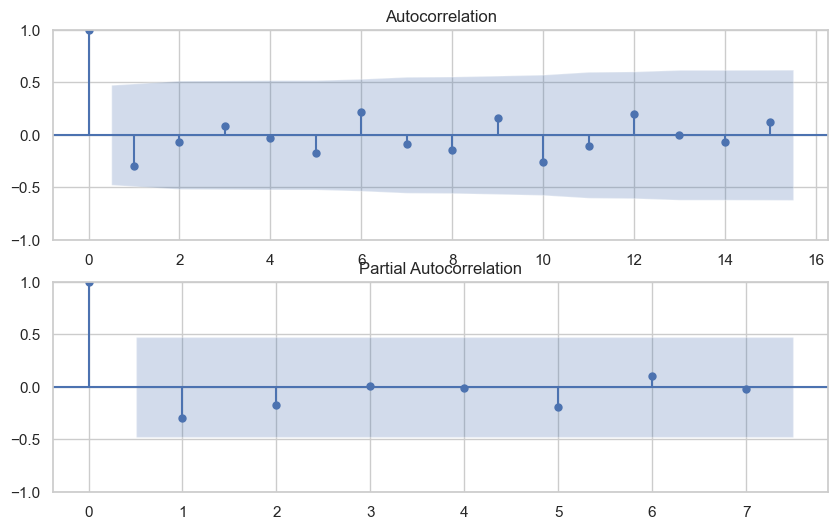

In [395]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_FRA_RE["first_difference"].dropna(),lags=15,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_FRA_RE["first_difference"].dropna(),lags=7,ax=ax2)

In [396]:
model=sm.tsa.statespace.SARIMAX(df_FRA_RE["renewables_electricity"],order=(3, 1, 3),seasonal_order=(3,1,3,10))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.65668D+00    |proj g|=  1.48639D-01

At iterate    5    f=  1.57506D+00    |proj g|=  1.47335D-02

At iterate   10    f=  1.55966D+00    |proj g|=  2.65552D-02

At iterate   15    f=  1.54403D+00    |proj g|=  1.61728D-02

At iterate   20    f=  1.54084D+00    |proj g|=  1.02554D-02

At iterate   25    f=  1.54034D+00    |proj g|=  1.95063D-02

At iterate   30    f=  1.54019D+00    |proj g|=  1.81342D-03

At iterate   35    f=  1.53968D+00    |proj g|=  8.58686D-03

At iterate   40    f=  1.53940D+00    |proj g|=  6.09761D-04

At iterate   45    f=  1.53939D+00    |proj g|=  1.85789D-03

At iterate   50    f=  1.53936D+00    |proj g|=  2.61451D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

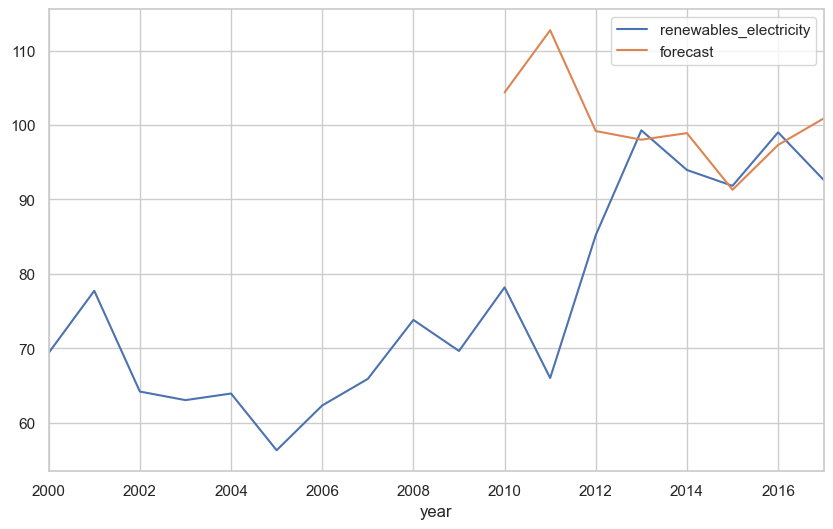

In [397]:
df_FRA_RE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_FRA_RE[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [398]:
df_FRA_RE[["renewables_electricity","forecast"]]

,renewables_electricity,forecast
year,,
2000-01-01,69.403,NaN
2001-01-01,77.739,NaN
2002-01-01,64.207,NaN
2003-01-01,63.057,NaN
2004-01-01,63.940,NaN
2005-01-01,56.325,NaN
2006-01-01,62.340,NaN
2007-01-01,65.908,NaN
2008-01-01,73.826,NaN


In [399]:
df_FRA_RE_future=pd.concat([df_FRA_RE,get_future_df(df_FRA_RE)])
df_FRA_RE_future.tail(11)

,renewables_electricity,first_difference,forecast
2017-01-01,92.617,-6.396,100.880859
2018-01-01,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN


<Axes: >

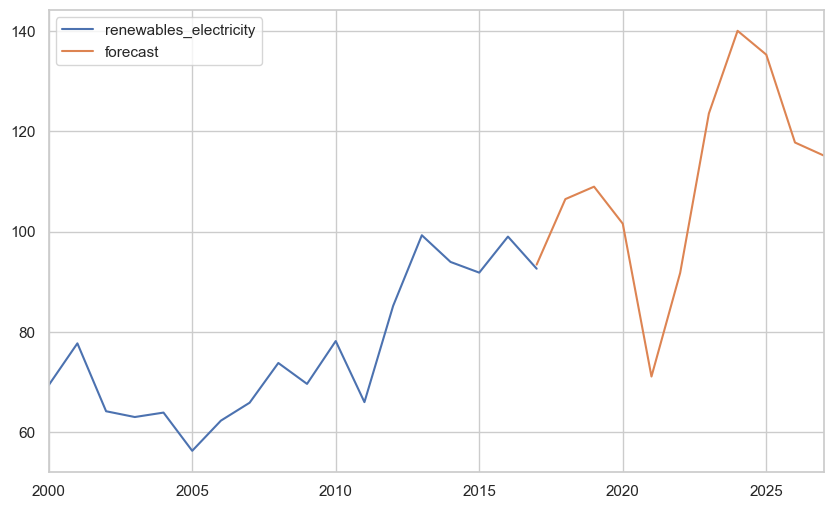

In [400]:
df_FRA_RE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_FRA_RE_future[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [401]:
get_sarima_forecast_percentage_diff(df_FRA_RE_future, "FRA", "renewables_electricity")

FRA's actual 2018 renewables_electricity value: 113.397 TWh
FRA's forecasted 2018 renewables_electricity value: 106.485 TWh

FRA's actual 2019 renewables_electricity value: 112.397 TWh
FRA's forecasted 2019 renewables_electricity value: 108.963 TWh

The Sarima model's renewables_electricity forecast for FRA is 6.1% less in 2018
The Sarima model's renewables_electricity forecast for FRA is 3.06% less in 2019


### GERMANY

In [402]:
df_DEU_RE.set_index("year",inplace=True)

<Axes: xlabel='year'>

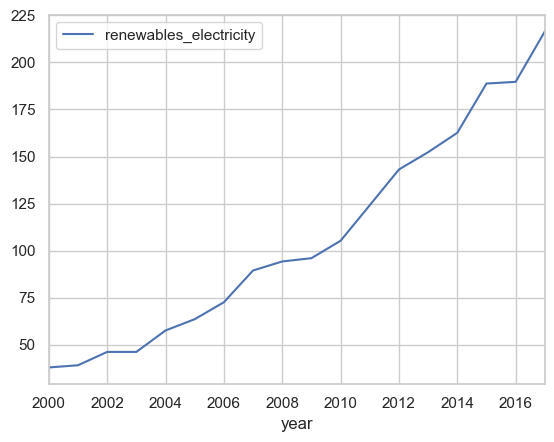

In [403]:
df_DEU_RE.plot()

In [404]:
adfuller_test(df_DEU_RE["renewables_electricity"])

ADF Test Statistic : 7.172522836954843
p-value : 1.0
#Lags Used : 7
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [405]:
df_DEU_RE["first_difference"] = (df_DEU_RE["renewables_electricity"]
                                 - df_DEU_RE["renewables_electricity"].shift(1))

In [406]:
adfuller_test(df_DEU_RE["first_difference"].dropna())

ADF Test Statistic : -4.153569823413887
p-value : 0.0007888386639879737
#Lags Used : 0
Number of Observations Used : 16
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

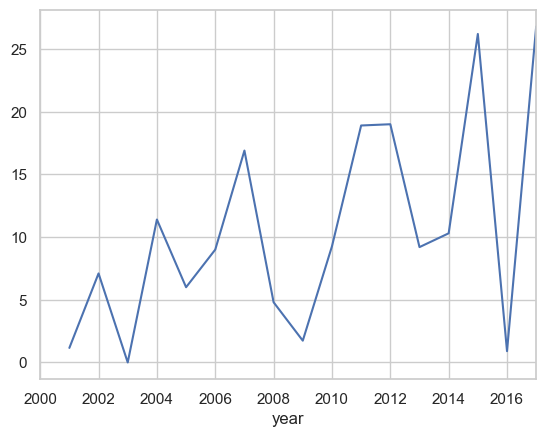

In [407]:
df_DEU_RE["first_difference"].plot()

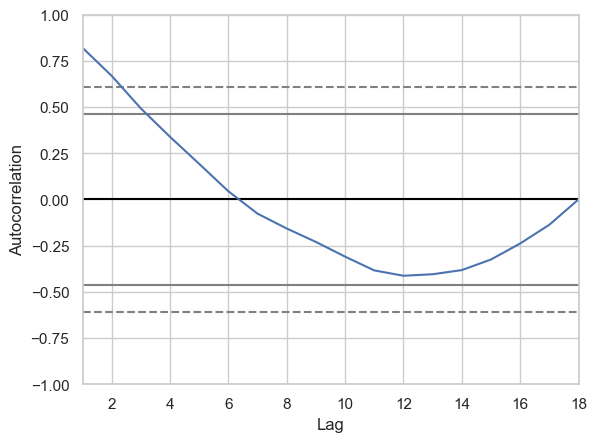

In [408]:
autocorrelation_plot(df_DEU_RE["renewables_electricity"])
plt.grid(True)
plt.show()

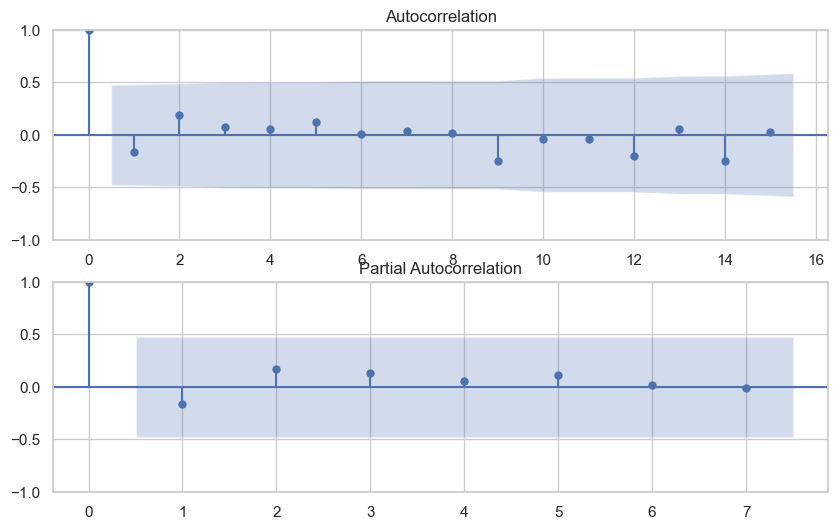

In [409]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_DEU_RE["first_difference"].dropna(),lags=15,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_DEU_RE["first_difference"].dropna(),lags=7,ax=ax2)

In [410]:
model=sm.tsa.statespace.SARIMAX(df_DEU_RE["renewables_electricity"],order=(4, 1, 4),seasonal_order=(4,1,4,5))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.51015D+00    |proj g|=  2.61016D-01

At iterate    5    f=  2.35426D+00    |proj g|=  4.68621D-02

At iterate   10    f=  2.31059D+00    |proj g|=  1.21318D-01

At iterate   15    f=  2.28295D+00    |proj g|=  6.75099D-02

At iterate   20    f=  2.26468D+00    |proj g|=  6.66454D-02

At iterate   25    f=  2.26380D+00    |proj g|=  3.61239D-02

At iterate   30    f=  2.26283D+00    |proj g|=  1.41652D-02

At iterate   35    f=  2.26169D+00    |proj g|=  3.45450D-02

At iterate   40    f=  2.26026D+00    |proj g|=  3.36915D-02

At iterate   45    f=  2.25988D+00    |proj g|=  6.97259D-03

At iterate   50    f=  2.25910D+00    |proj g|=  1.53410D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

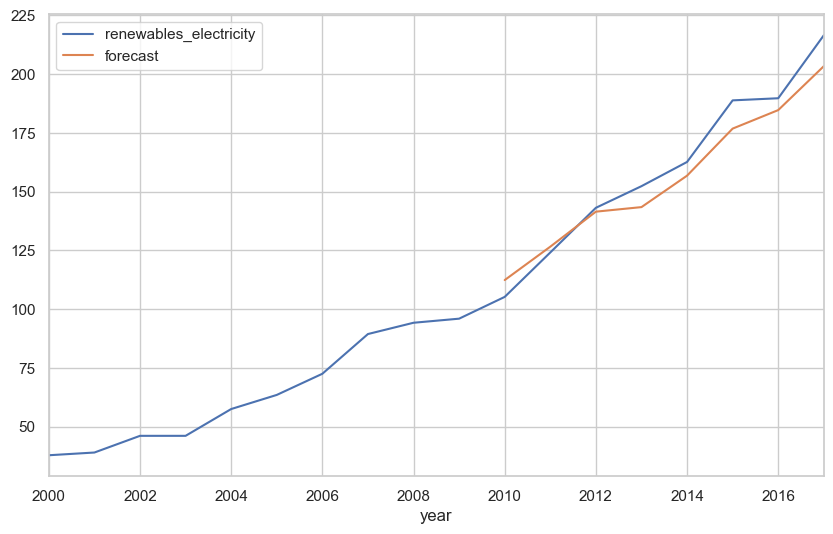

In [411]:
df_DEU_RE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_DEU_RE[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [412]:
df_DEU_RE[["renewables_electricity","forecast"]]

,renewables_electricity,forecast
year,,
2000-01-01,37.840,NaN
2001-01-01,39.000,NaN
2002-01-01,46.100,NaN
2003-01-01,46.100,NaN
2004-01-01,57.500,NaN
2005-01-01,63.500,NaN
2006-01-01,72.500,NaN
2007-01-01,89.400,NaN
2008-01-01,94.200,NaN


In [413]:
df_DEU_RE_future=pd.concat([df_DEU_RE,get_future_df(df_DEU_RE)])
df_DEU_RE_future.tail(11)

,renewables_electricity,first_difference,forecast
2017-01-01,216.5,26.8,203.345806
2018-01-01,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN


<Axes: >

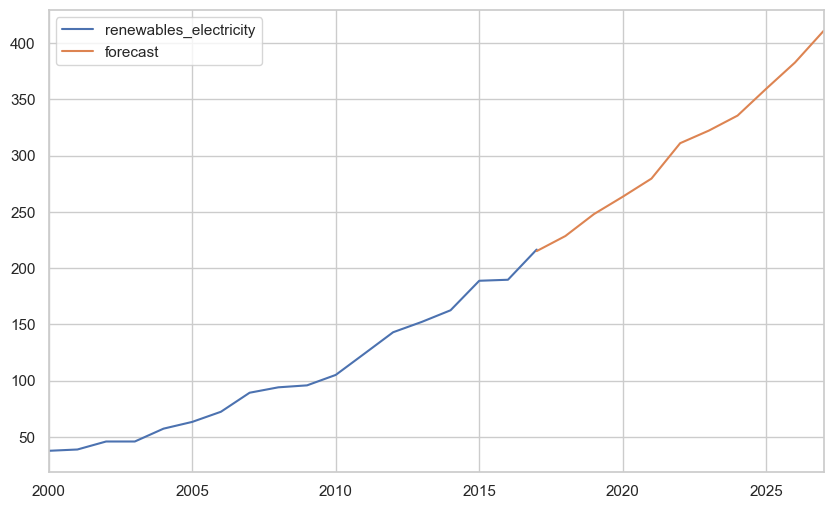

In [414]:
df_DEU_RE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_DEU_RE_future[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [415]:
get_sarima_forecast_percentage_diff(df_DEU_RE_future, "DEU", "renewables_electricity")

DEU's actual 2018 renewables_electricity value: 224.9 TWh
DEU's forecasted 2018 renewables_electricity value: 228.511 TWh

DEU's actual 2019 renewables_electricity value: 242.4 TWh
DEU's forecasted 2019 renewables_electricity value: 248.048 TWh

The Sarima model's renewables_electricity forecast for DEU is 1.61% more in 2018
The Sarima model's renewables_electricity forecast for DEU is 2.33% more in 2019


### ITALY

In [416]:
df_ITA_RE.set_index("year",inplace=True)

<Axes: xlabel='year'>

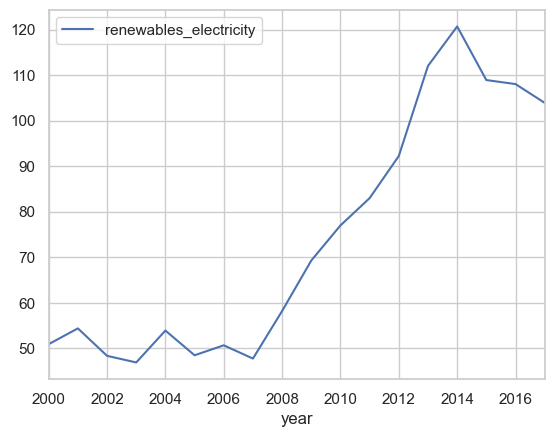

In [417]:
df_ITA_RE.plot()

In [418]:
adfuller_test(df_ITA_RE["renewables_electricity"])

ADF Test Statistic : -4.030056028580287
p-value : 0.0012610534760868117
#Lags Used : 7
Number of Observations Used : 10
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


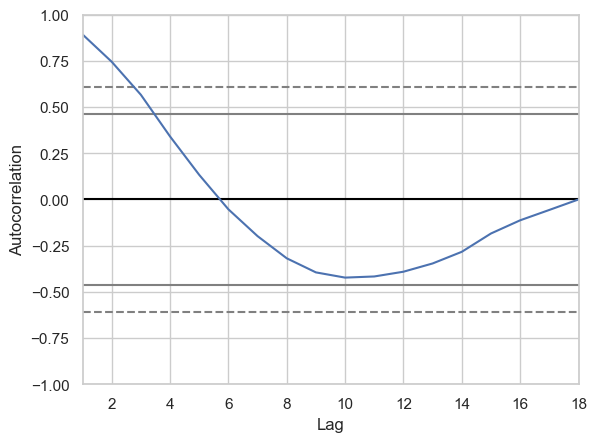

In [419]:
autocorrelation_plot(df_ITA_RE["renewables_electricity"])
plt.grid(True)
plt.show()

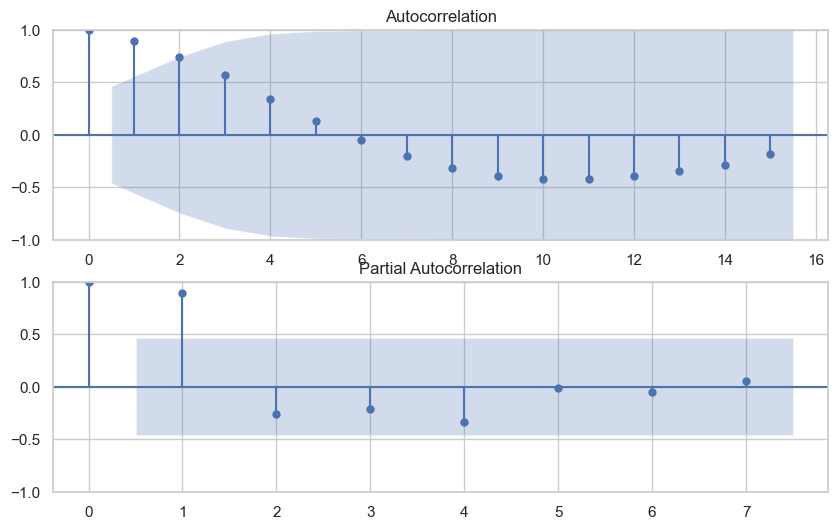

In [420]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_ITA_RE["renewables_electricity"].dropna(),lags=15,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_ITA_RE["renewables_electricity"].dropna(),lags=7,ax=ax2)

In [421]:
model=ARIMA(df_ITA_RE["renewables_electricity"],order=(5,1,3))
model_fit=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [422]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                  
==================================================================================
Dep. Variable:     renewables_electricity   No. Observations:                   18
Model:                     ARIMA(5, 1, 3)   Log Likelihood                 -56.943
Date:                    Thu, 14 Dec 2023   AIC                            131.886
Time:                            13:43:58   BIC                            139.385
Sample:                        01-01-2000   HQIC                           132.631
                             - 01-01-2017                                         
Covariance Type:                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2742      1.934     -0.142      0.887      -4.064       3.516
ar.L2         -0.3419      0.785     -0.436      0.663      -1.880       1.196
ar.L3         -0.1982      1.565     -0.127      0.899      -3.266       2.870
ar.L4          0.2609      0.702      0.372      0.710      -1.114       1.636
ar.L5          0.4590      0.526      0.872      0.383      -0.573       1.491
ma.L1          0.5834      2.606      0.224      0.823      -4.523       5.690
ma.L2          0.8272      2.259      0.366      0.714      -3.599       5.254
ma.L3          0.4999      3.655      0.137      0.891      -6.664       7.664
sigma2        40.4977     56.156      0.721      0.471     -69.567     150.562
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 4.58
Prob(Q):                              0.96   Prob(JB):                         0.10
Heteroskedasticity (H):               2.91   Skew:                            -1.15
Prob(H) (two-sided):                  0.22   Kurtosis:                         4.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Axes: xlabel='year'>

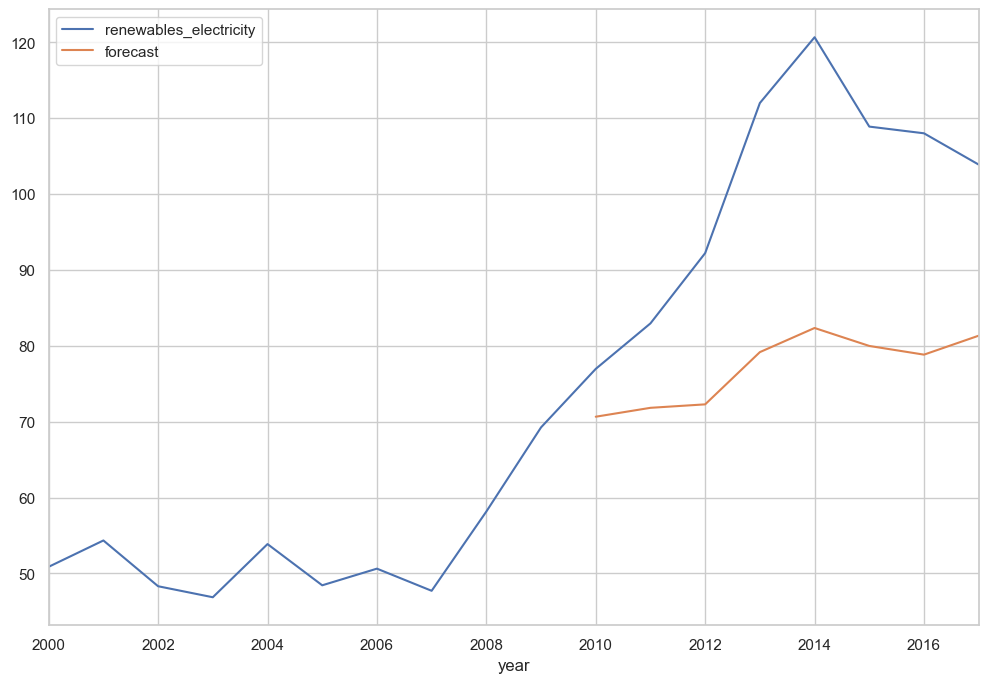

In [423]:
df_ITA_RE["forecast"]=model_fit.predict(start=10,end=17,dynamic=True)
df_ITA_RE[["renewables_electricity","forecast"]].plot(figsize=(12,8))

In [424]:
# model=sm.tsa.statespace.SARIMAX(df_ITA_RE["renewables_electricity"],order=(5, 0, 5),seasonal_order=(5,0,5,12))
# results=model.fit()

In [425]:
# df_ITA_RE["forecast"]=results.predict(start=10,end=17,dynamic=True)
# df_ITA_RE[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [426]:
df_ITA_RE[["renewables_electricity","forecast"]]

,renewables_electricity,forecast
year,,
2000-01-01,50.879,NaN
2001-01-01,54.348,NaN
2002-01-01,48.316,NaN
2003-01-01,46.865,NaN
2004-01-01,53.872,NaN
2005-01-01,48.440,NaN
2006-01-01,50.634,NaN
2007-01-01,47.715,NaN
2008-01-01,58.164,NaN


In [427]:
df_ITA_RE_future=pd.concat([df_ITA_RE,get_future_df(df_ITA_RE)])
df_ITA_RE_future.tail(11)

,renewables_electricity,forecast
2017-01-01,103.886,81.338085
2018-01-01,NaN,NaN
2019-01-01,NaN,NaN
2020-01-01,NaN,NaN
2021-01-01,NaN,NaN
2022-01-01,NaN,NaN
2023-01-01,NaN,NaN
2024-01-01,NaN,NaN
2025-01-01,NaN,NaN
2026-01-01,NaN,NaN


<Axes: >

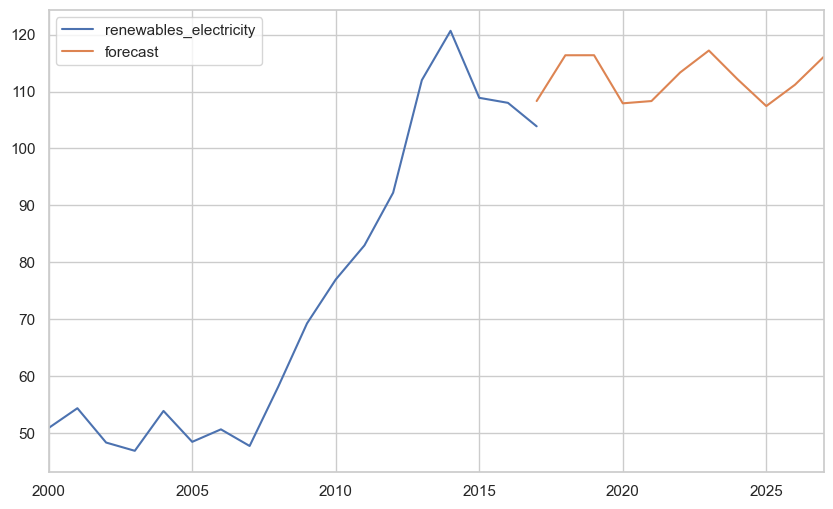

In [428]:
df_ITA_RE_future["forecast"]=model_fit.predict(start=17,end=27,dynamic=True)
df_ITA_RE_future[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [429]:
get_sarima_forecast_percentage_diff(df_ITA_RE_future, "ITA", "renewables_electricity")

ITA's actual 2018 renewables_electricity value: 114.402 TWh
ITA's forecasted 2018 renewables_electricity value: 116.373 TWh

ITA's actual 2019 renewables_electricity value: 117.079 TWh
ITA's forecasted 2019 renewables_electricity value: 116.378 TWh

The Sarima model's renewables_electricity forecast for ITA is 1.72% more in 2018
The Sarima model's renewables_electricity forecast for ITA is 0.6% less in 2019


### JAPAN

In [430]:
df_JPN_RE.set_index("year",inplace=True)

<Axes: xlabel='year'>

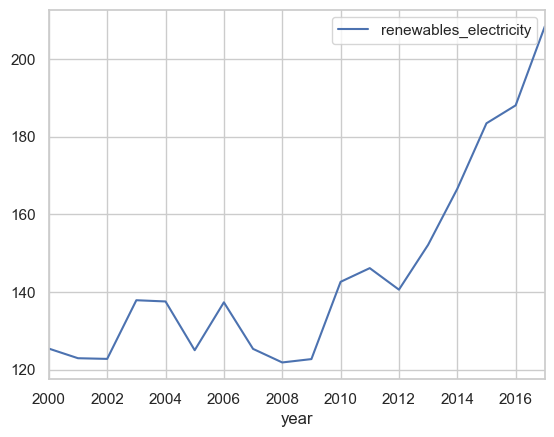

In [431]:
df_JPN_RE.plot()

In [432]:
adfuller_test(df_JPN_RE["renewables_electricity"])

ADF Test Statistic : -0.5805028777303989
p-value : 0.8753269988725674
#Lags Used : 7
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [433]:
df_JPN_RE["first_difference"] = (df_JPN_RE["renewables_electricity"]
                                 - df_JPN_RE["renewables_electricity"].shift(1))

In [434]:
adfuller_test(df_JPN_RE["first_difference"].dropna())

ADF Test Statistic : 0.9163192410510969
p-value : 0.9932996436033633
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [435]:
df_JPN_RE["seasonal_first_difference"] = (df_JPN_RE["renewables_electricity"]
                                 - df_JPN_RE["renewables_electricity"].shift(14))

In [436]:
adfuller_test(df_JPN_RE["seasonal_first_difference"].dropna())

ADF Test Statistic : -4.593818270750367
p-value : 0.00013260123347579527
#Lags Used : 0
Number of Observations Used : 3
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


In [437]:
# df_JPN_RE["seasonal_first_difference"].plot()

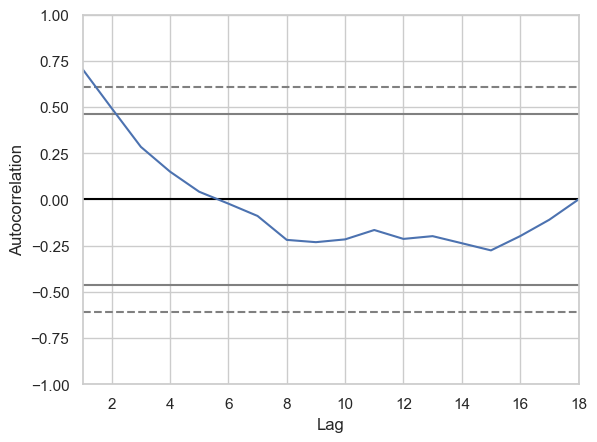

In [438]:
autocorrelation_plot(df_JPN_RE["renewables_electricity"])
plt.grid(True)
plt.show()

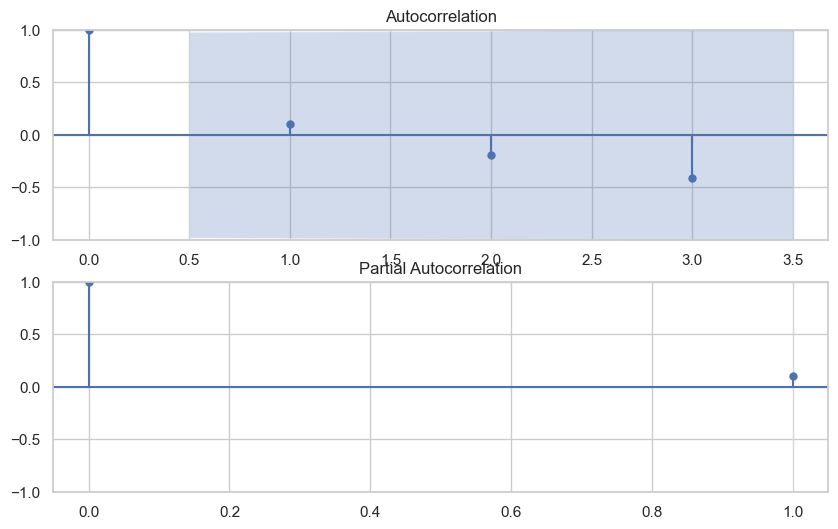

In [439]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_JPN_RE["seasonal_first_difference"].dropna(),lags=3,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_JPN_RE["seasonal_first_difference"].dropna(),lags=1,ax=ax2)

In [440]:
model=sm.tsa.statespace.SARIMAX(df_JPN_RE["renewables_electricity"],order=(1, 1, 1),seasonal_order=(1,1,1,14))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.91392D-01    |proj g|=  1.90370D-01

At iterate    5    f=  6.47263D-01    |proj g|=  1.34699D-02

At iterate   10    f=  6.43961D-01    |proj g|=  8.98363D-03

At iterate   15    f=  6.39372D-01    |proj g|=  3.06546D-02

At iterate   20    f=  6.27841D-01    |proj g|=  2.33637D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     34      1     0     0   4.794D-06   6.278D-01
  F =  0.62783654284008128     

CONVERG

<Axes: xlabel='year'>

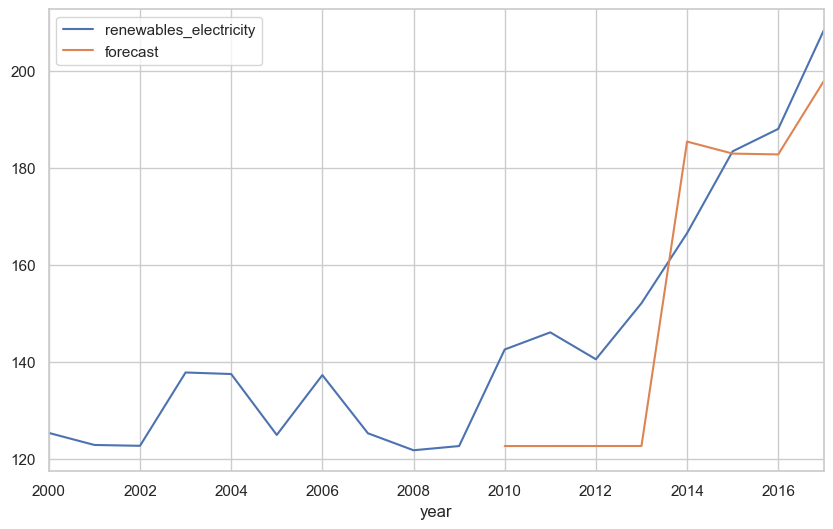

In [441]:
df_JPN_RE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_JPN_RE[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [442]:
df_JPN_RE[["renewables_electricity","forecast"]]

,renewables_electricity,forecast
year,,
2000-01-01,125.398,NaN
2001-01-01,122.919,NaN
2002-01-01,122.746,NaN
2003-01-01,137.851,NaN
2004-01-01,137.534,NaN
2005-01-01,124.983,NaN
2006-01-01,137.313,NaN
2007-01-01,125.323,NaN
2008-01-01,121.830,NaN


In [443]:
df_JPN_RE_future=pd.concat([df_JPN_RE,get_future_df(df_JPN_RE)])
df_JPN_RE_future.tail(11)

,renewables_electricity,first_difference,seasonal_first_difference,forecast
2017-01-01,208.35,20.322,70.499,197.879842
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

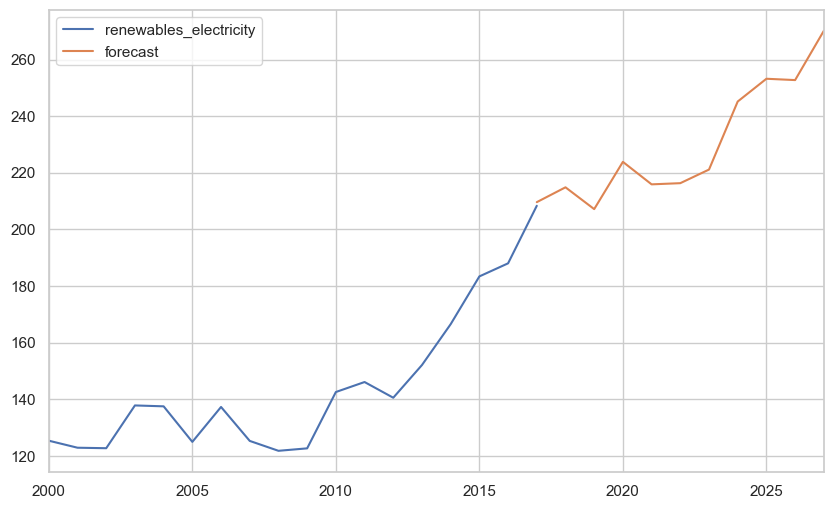

In [444]:
df_JPN_RE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_JPN_RE_future[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [445]:
get_sarima_forecast_percentage_diff(df_JPN_RE_future, "JPN", "renewables_electricity")

JPN's actual 2018 renewables_electricity value: 216.343 TWh
JPN's forecasted 2018 renewables_electricity value: 214.871 TWh

JPN's actual 2019 renewables_electricity value: 225.538 TWh
JPN's forecasted 2019 renewables_electricity value: 207.173 TWh

The Sarima model's renewables_electricity forecast for JPN is 0.68% less in 2018
The Sarima model's renewables_electricity forecast for JPN is 8.14% less in 2019


### UNITED KINGDOM

In [446]:
df_GBR_RE.set_index("year",inplace=True)

<Axes: xlabel='year'>

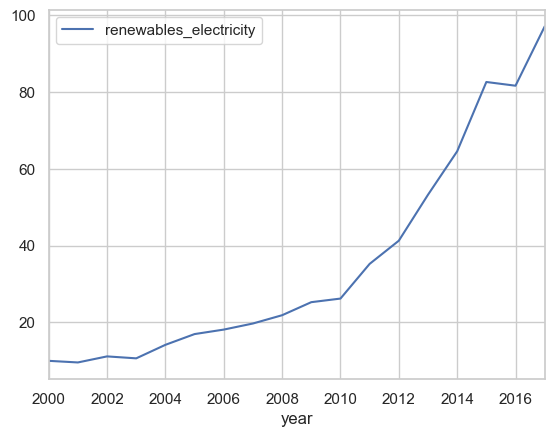

In [447]:
df_GBR_RE.plot()

In [448]:
adfuller_test(df_GBR_RE["renewables_electricity"])

ADF Test Statistic : 1.507013793990137
p-value : 0.9975499696068452
#Lags Used : 6
Number of Observations Used : 11
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [449]:
df_GBR_RE["first_difference"] = (df_GBR_RE["renewables_electricity"]
                                 - df_GBR_RE["renewables_electricity"].shift(1))

In [450]:
adfuller_test(df_GBR_RE["first_difference"].dropna())

ADF Test Statistic : -1.7396049926880122
p-value : 0.41083090908830266
#Lags Used : 4
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [451]:
df_GBR_RE["seasonal_first_difference"] = (df_GBR_RE["renewables_electricity"]
                                 - df_GBR_RE["renewables_electricity"].shift(3))

In [452]:
adfuller_test(df_GBR_RE["seasonal_first_difference"].dropna())

ADF Test Statistic : -14.091676361981108
p-value : 2.7146665230959416e-26
#Lags Used : 5
Number of Observations Used : 9
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

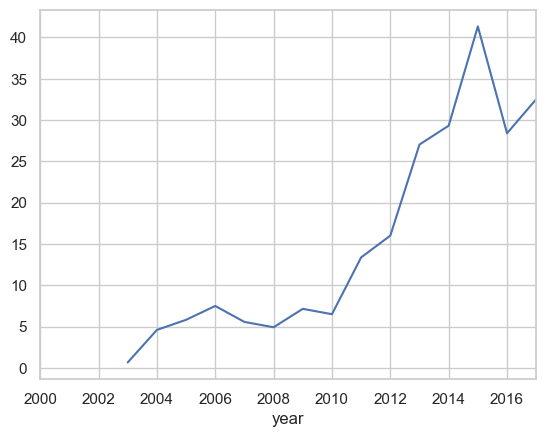

In [453]:
df_GBR_RE["seasonal_first_difference"].plot()

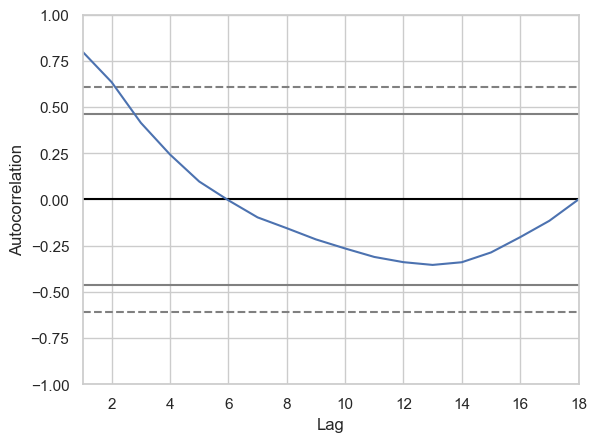

In [454]:
autocorrelation_plot(df_GBR_RE["renewables_electricity"])
plt.grid(True)
plt.show()

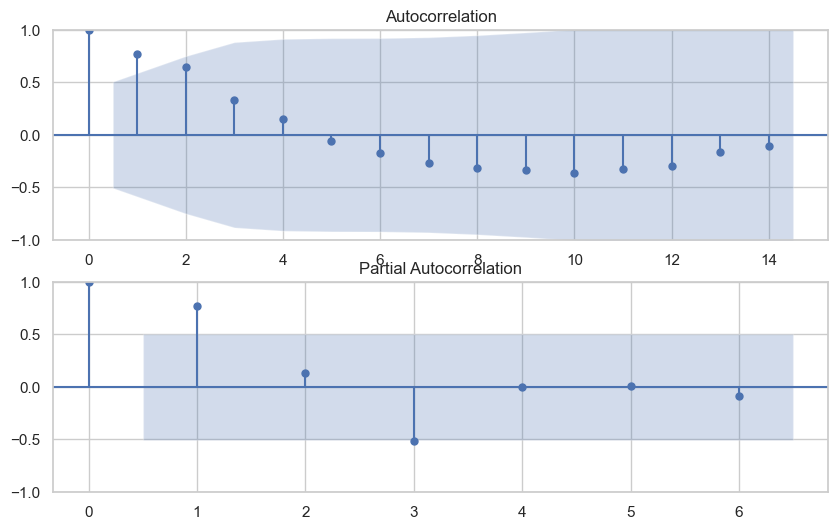

In [455]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_GBR_RE["seasonal_first_difference"].dropna(),lags=14,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_GBR_RE["seasonal_first_difference"].dropna(),lags=6,ax=ax2)

In [456]:
model=sm.tsa.statespace.SARIMAX(df_GBR_RE["renewables_electricity"],order=(2, 1, 4),seasonal_order=(2,1,4,7))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.20117D+00    |proj g|=  9.80302D-01

At iterate    5    f=  1.81611D+00    |proj g|=  3.74639D-02

At iterate   10    f=  1.79863D+00    |proj g|=  2.80118D-02

At iterate   15    f=  1.78430D+00    |proj g|=  4.65726D-02

At iterate   20    f=  1.74408D+00    |proj g|=  5.51817D-02

At iterate   25    f=  1.73642D+00    |proj g|=  3.24430D-02

At iterate   30    f=  1.73390D+00    |proj g|=  4.53783D-03

At iterate   35    f=  1.73256D+00    |proj g|=  1.47696D-02

At iterate   40    f=  1.72987D+00    |proj g|=  3.47318D-02

At iterate   45    f=  1.72876D+00    |proj g|=  1.28903D-02

At iterate   50    f=  1.72620D+00    |proj g|=  1.04807D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

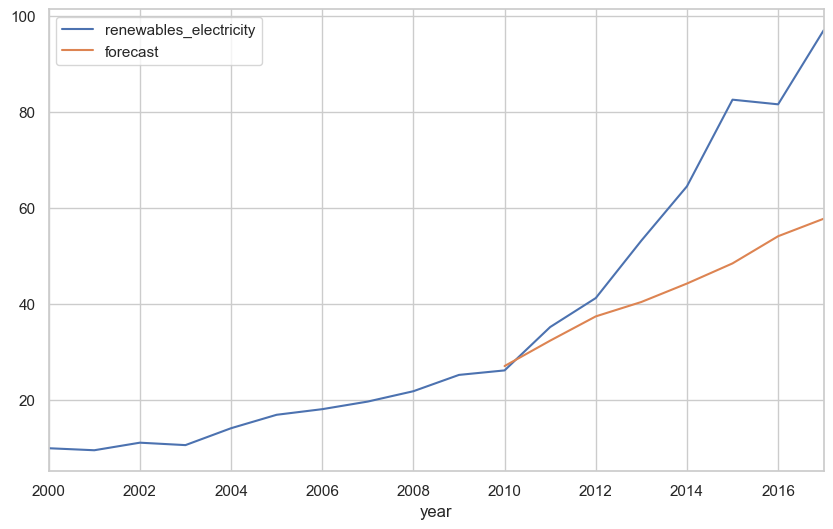

In [457]:
df_GBR_RE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_GBR_RE[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [458]:
df_GBR_RE[["renewables_electricity","forecast"]]

,renewables_electricity,forecast
year,,
2000-01-01,9.970,NaN
2001-01-01,9.549,NaN
2002-01-01,11.125,NaN
2003-01-01,10.619,NaN
2004-01-01,14.138,NaN
2005-01-01,16.937,NaN
2006-01-01,18.106,NaN
2007-01-01,19.691,NaN
2008-01-01,21.847,NaN


In [459]:
df_GBR_RE_future=pd.concat([df_GBR_RE,get_future_df(df_GBR_RE)])
df_GBR_RE_future.tail(11)

,renewables_electricity,first_difference,seasonal_first_difference,forecast
2017-01-01,97.038,15.43,32.515,57.778899
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

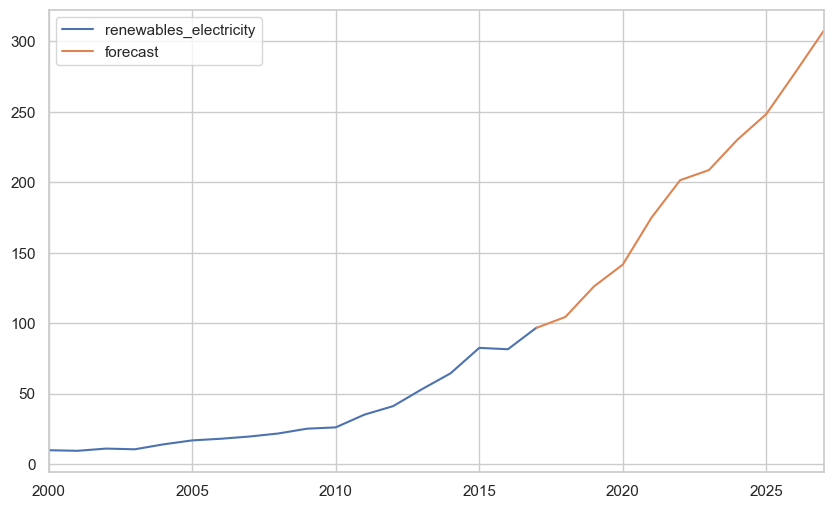

In [460]:
df_GBR_RE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_GBR_RE_future[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [461]:
get_sarima_forecast_percentage_diff(df_GBR_RE_future, "GBR", "renewables_electricity")

GBR's actual 2018 renewables_electricity value: 108.131 TWh
GBR's forecasted 2018 renewables_electricity value: 104.51 TWh

GBR's actual 2019 renewables_electricity value: 117.333 TWh
GBR's forecasted 2019 renewables_electricity value: 126.248 TWh

The Sarima model's renewables_electricity forecast for GBR is 3.35% less in 2018
The Sarima model's renewables_electricity forecast for GBR is 7.6% more in 2019


### USA

In [462]:
df_USA_RE.set_index("year",inplace=True)

<Axes: xlabel='year'>

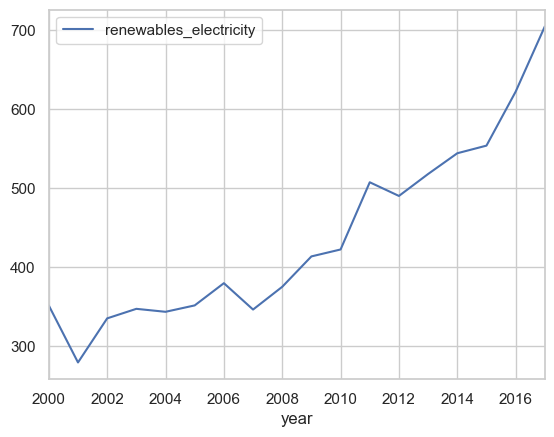

In [463]:
df_USA_RE.plot()

In [464]:
adfuller_test(df_USA_RE["renewables_electricity"])

ADF Test Statistic : 2.7399945370189083
p-value : 0.9990880801028669
#Lags Used : 6
Number of Observations Used : 11
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [465]:
df_USA_RE["first_difference"] = (df_USA_RE["renewables_electricity"]
                                 - df_USA_RE["renewables_electricity"].shift(1))

In [466]:
adfuller_test(df_USA_RE["first_difference"].dropna())

ADF Test Statistic : 0.2730707541310124
p-value : 0.9760746891204901
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [467]:
df_USA_RE["seasonal_first_difference"] = (df_USA_RE["renewables_electricity"]
                                 - df_USA_RE["renewables_electricity"].shift(5))

In [468]:
adfuller_test(df_USA_RE["seasonal_first_difference"].dropna())

ADF Test Statistic : -1.5291391390905789
p-value : 0.5190505532529172
#Lags Used : 0
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [469]:
# Applying log transformation
df_USA_RE["log_value"] = np.log(df_USA_RE["renewables_electricity"] + 1e-8) # Adding a small constant (1e-8) to avoid log(0)


In [470]:
adfuller_test(df_USA_RE["log_value"])

ADF Test Statistic : 2.4209233525494755
p-value : 0.999019818598772
#Lags Used : 6
Number of Observations Used : 11
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [471]:
# Performing Box-Cox transformation
df_USA_RE["boxcox_value"], lam = boxcox(df_USA_RE["renewables_electricity"])

In [472]:
# Differencing after transformation
df_USA_RE["diff_boxcox"] = df_USA_RE["boxcox_value"].diff()

In [473]:
adfuller_test(df_USA_RE["diff_boxcox"].dropna())

ADF Test Statistic : -1.400467145710133
p-value : 0.5820521425176983
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [474]:
df_USA_RE['seasonal_diff_boxcox'] = df_USA_RE['boxcox_value'].diff(2)

In [475]:
adfuller_test(df_USA_RE["seasonal_diff_boxcox"].dropna())

ADF Test Statistic : -20.979613027080056
p-value : 0.0
#Lags Used : 6
Number of Observations Used : 9
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

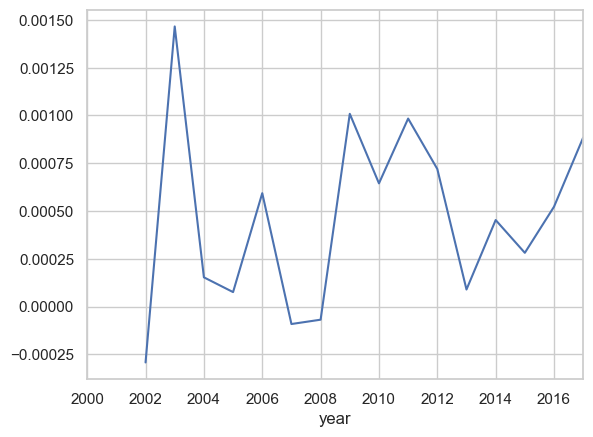

In [476]:
df_USA_RE["seasonal_diff_boxcox"].plot()

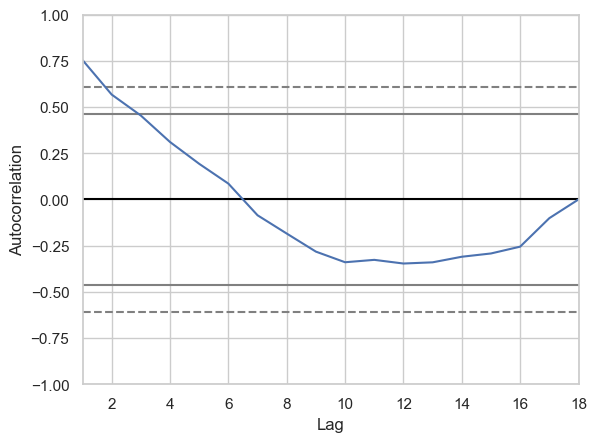

In [477]:
autocorrelation_plot(df_USA_RE["renewables_electricity"])
plt.grid(True)
plt.show()

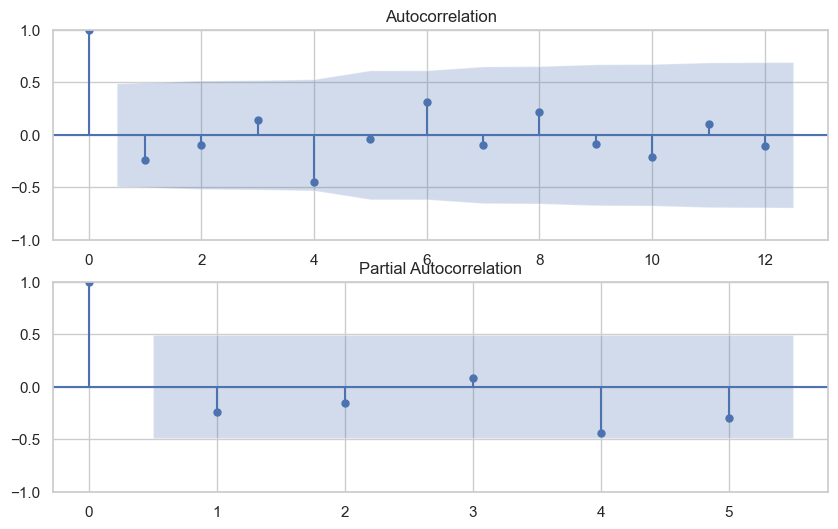

In [478]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_USA_RE["seasonal_diff_boxcox"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_USA_RE["seasonal_diff_boxcox"].dropna(),lags=5,ax=ax2)

In [479]:
model=sm.tsa.statespace.SARIMAX(df_USA_RE["renewables_electricity"],order=(3, 1, 3),seasonal_order=(3,1,3,7))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.02243D+00    |proj g|=  5.17516D-01

At iterate    5    f=  2.79782D+00    |proj g|=  4.19588D-02

At iterate   10    f=  2.78183D+00    |proj g|=  8.50585D-03

At iterate   15    f=  2.77470D+00    |proj g|=  1.15927D-02

At iterate   20    f=  2.69063D+00    |proj g|=  6.55752D-02

At iterate   25    f=  2.48802D+00    |proj g|=  6.80261D-01

At iterate   30    f=  2.44921D+00    |proj g|=  1.24712D-01

At iterate   35    f=  2.43267D+00    |proj g|=  7.90930D-02

At iterate   40    f=  2.42603D+00    |proj g|=  1.91400D-02

At iterate   45    f=  2.41692D+00    |proj g|=  8.16835D-02

At iterate   50    f=  2.41134D+00    |proj g|=  8.79846D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

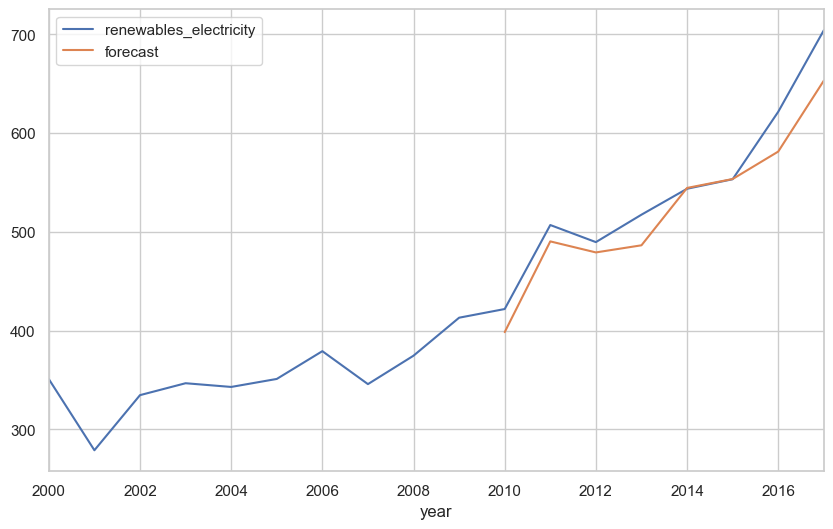

In [480]:
df_USA_RE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_USA_RE[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [481]:
df_USA_RE[["renewables_electricity","forecast"]]

,renewables_electricity,forecast
year,,
2000-01-01,350.939,NaN
2001-01-01,278.906,NaN
2002-01-01,334.695,NaN
2003-01-01,346.758,NaN
2004-01-01,342.996,NaN
2005-01-01,351.093,NaN
2006-01-01,379.214,NaN
2007-01-01,345.851,NaN
2008-01-01,374.644,NaN


In [482]:
df_USA_RE_future=pd.concat([df_USA_RE,get_future_df(df_USA_RE)])
df_USA_RE_future.tail(11)

,renewables_electricity,first_difference,seasonal_first_difference,log_value,boxcox_value,diff_boxcox,seasonal_diff_boxcox,forecast
2017-01-01,704.106,82.535,214.483,6.556929,1.143621,0.000434,0.000885,653.10584
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

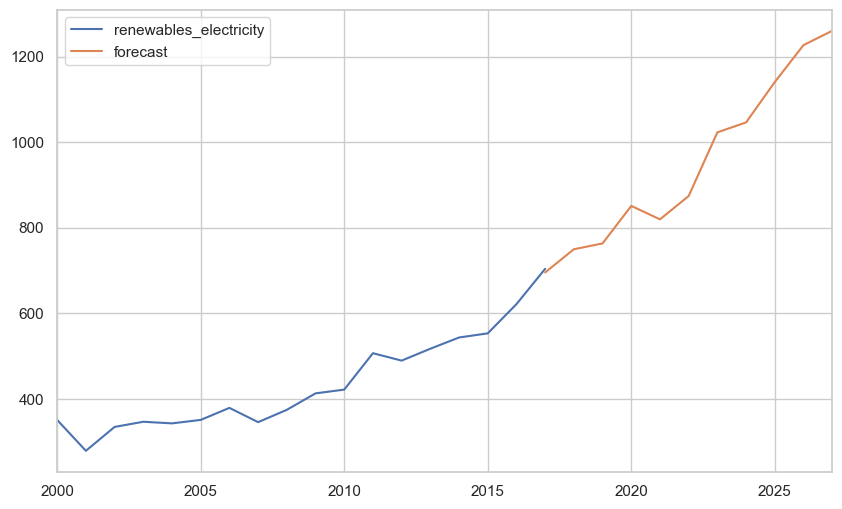

In [483]:
df_USA_RE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_USA_RE_future[["renewables_electricity","forecast"]].plot(figsize=(10,6))

In [484]:
get_sarima_forecast_percentage_diff(df_USA_RE_future, "USA", "renewables_electricity")

USA's actual 2018 renewables_electricity value: 730.502 TWh
USA's forecasted 2018 renewables_electricity value: 749.789 TWh

USA's actual 2019 renewables_electricity value: 757.393 TWh
USA's forecasted 2019 renewables_electricity value: 763.413 TWh

The Sarima model's renewables_electricity forecast for USA is 2.64% more in 2018
The Sarima model's renewables_electricity forecast for USA is 0.79% more in 2019


### RENEWABLES SHARE ELEC

In [485]:
df_CAN_RSE = df_CAN[["year", "renewables_share_elec"]]
df_CAN_RSE

,year,renewables_share_elec
0,2000-01-01,61.768
1,2001-01-01,59.225
2,2002-01-01,61.061
3,2003-01-01,60.101
4,2004-01-01,59.622
5,2005-01-01,60.854
6,2006-01-01,60.841
7,2007-01-01,61.246
8,2008-01-01,62.569
9,2009-01-01,63.889


In [486]:
df_FRA_RSE = df_FRA[["year", "renewables_share_elec"]]
df_FRA_RSE

,year,renewables_share_elec
18,2000-01-01,12.968
19,2001-01-01,14.256
20,2002-01-01,11.597
21,2003-01-01,11.230
22,2004-01-01,11.243
23,2005-01-01,9.861
24,2006-01-01,10.948
25,2007-01-01,11.690
26,2008-01-01,12.978
27,2009-01-01,13.125


In [487]:
df_DEU_RSE = df_DEU[["year", "renewables_share_elec"]]
df_DEU_RSE

,year,renewables_share_elec
36,2000-01-01,6.616
37,2001-01-01,6.701
38,2002-01-01,7.922
39,2003-01-01,7.631
40,2004-01-01,9.397
41,2005-01-01,10.300
42,2006-01-01,11.443
43,2007-01-01,14.090
44,2008-01-01,14.823
45,2009-01-01,16.235


In [488]:
df_ITA_RSE = df_ITA[["year", "renewables_share_elec"]]
df_ITA_RSE

,year,renewables_share_elec
54,2000-01-01,18.903
55,2001-01-01,20.049
56,2002-01-01,17.457
57,2003-01-01,16.422
58,2004-01-01,18.272
59,2005-01-01,16.380
60,2006-01-01,16.511
61,2007-01-01,15.532
62,2008-01-01,18.612
63,2009-01-01,24.082


In [489]:
df_JPN_RSE = df_JPN[["year", "renewables_share_elec"]]
df_JPN_RSE

,year,renewables_share_elec
72,2000-01-01,12.361
73,2001-01-01,12.330
74,2002-01-01,12.102
75,2003-01-01,13.711
76,2004-01-01,13.310
77,2005-01-01,11.966
78,2006-01-01,12.923
79,2007-01-01,11.353
80,2008-01-01,11.820
81,2009-01-01,12.244


In [490]:
df_GBR_RSE = df_GBR[["year", "renewables_share_elec"]]
df_GBR_RSE

,year,renewables_share_elec
90,2000-01-01,2.663
91,2001-01-01,2.497
92,2002-01-01,2.893
93,2003-01-01,2.685
94,2004-01-01,3.613
95,2005-01-01,4.283
96,2006-01-01,4.602
97,2007-01-01,5.011
98,2008-01-01,5.677
99,2009-01-01,6.767


In [491]:
df_USA_RSE = df_USA[["year", "renewables_share_elec"]]
df_USA_RSE

,year,renewables_share_elec
108,2000-01-01,9.230
109,2001-01-01,7.464
110,2002-01-01,8.674
111,2003-01-01,8.930
112,2004-01-01,8.639
113,2005-01-01,8.657
114,2006-01-01,9.329
115,2007-01-01,8.320
116,2008-01-01,9.095
117,2009-01-01,10.457


### CANADA

In [492]:
df_CAN_RSE.set_index("year",inplace=True)

<Axes: xlabel='year'>

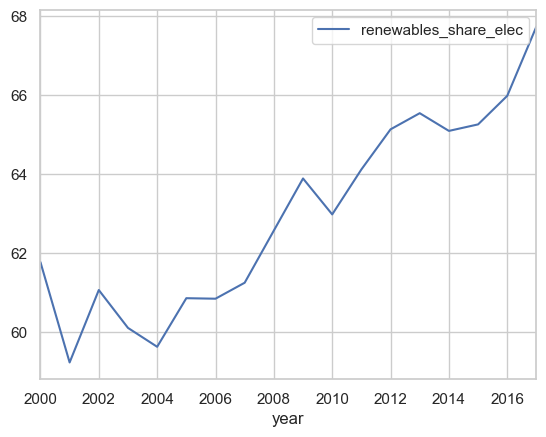

In [493]:
df_CAN_RSE.plot()

In [494]:
adfuller_test(df_CAN_RSE["renewables_share_elec"])

ADF Test Statistic : 0.20456477976286047
p-value : 0.9725164595062161
#Lags Used : 3
Number of Observations Used : 14
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [495]:
df_CAN_RSE["first_difference"] = (df_CAN_RSE["renewables_share_elec"]
                                 - df_CAN_RSE["renewables_share_elec"].shift(1))

In [496]:
adfuller_test(df_CAN_RSE["first_difference"].dropna())

ADF Test Statistic : -2.6607430727173944
p-value : 0.081081239233878
#Lags Used : 2
Number of Observations Used : 14
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [497]:
df_CAN_RSE["seasonal_first_difference"] = (df_CAN_RSE["renewables_share_elec"]
                                 - df_CAN_RSE["renewables_share_elec"].shift(2))

In [498]:
adfuller_test(df_CAN_RSE["seasonal_first_difference"].dropna())

ADF Test Statistic : -3.138424165849814
p-value : 0.023837244741376763
#Lags Used : 6
Number of Observations Used : 9
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

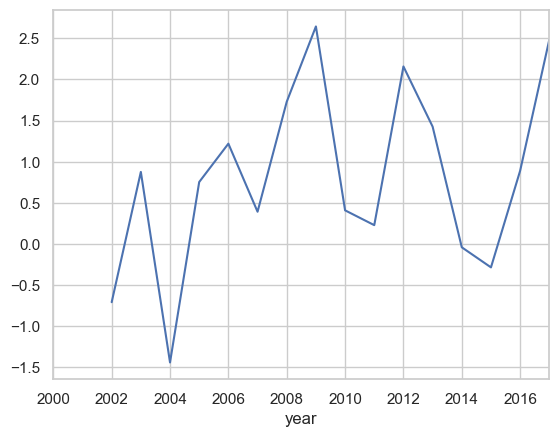

In [499]:
df_CAN_RSE["seasonal_first_difference"].plot()

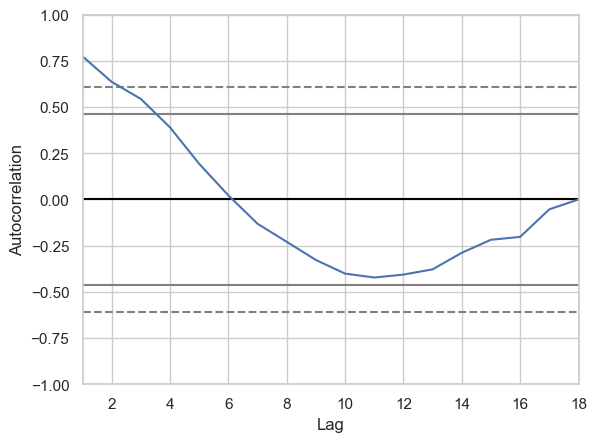

In [500]:
autocorrelation_plot(df_CAN_RSE["renewables_share_elec"])
plt.grid(True)
plt.show()

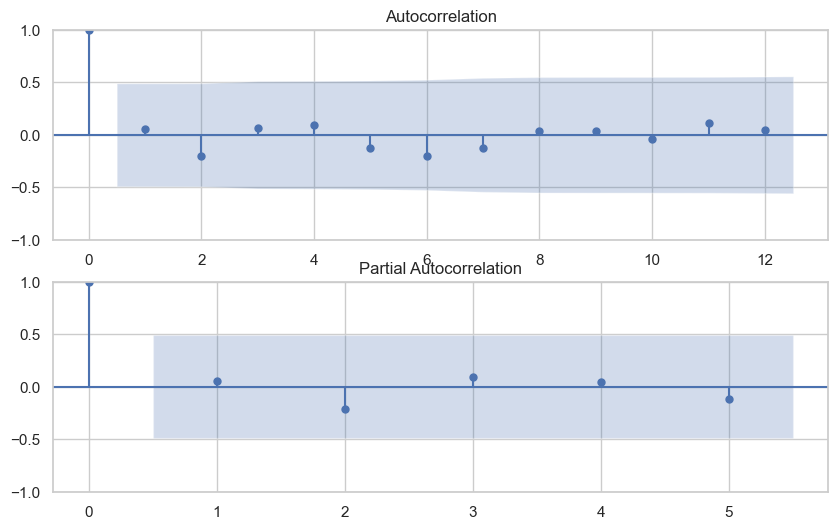

In [501]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_CAN_RSE["seasonal_first_difference"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_CAN_RSE["seasonal_first_difference"].dropna(),lags=5,ax=ax2)

In [502]:
model=sm.tsa.statespace.SARIMAX(df_CAN_RSE["renewables_share_elec"],order=(1, 1, 1),seasonal_order=(1,1,1,4))
results=model.fit()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.76587D+00    |proj g|=  2.23301D+00

At iterate    5    f=  1.28305D+00    |proj g|=  1.16518D-02

At iterate   10    f=  1.27684D+00    |proj g|=  2.96420D-02

At iterate   15    f=  1.24755D+00    |proj g|=  1.26260D-01

At iterate   20    f=  1.20092D+00    |proj g|=  1.80709D-02

At iterate   25    f=  1.19830D+00    |proj g|=  1.15494D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     41      1     0     0   

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


<Axes: xlabel='year'>

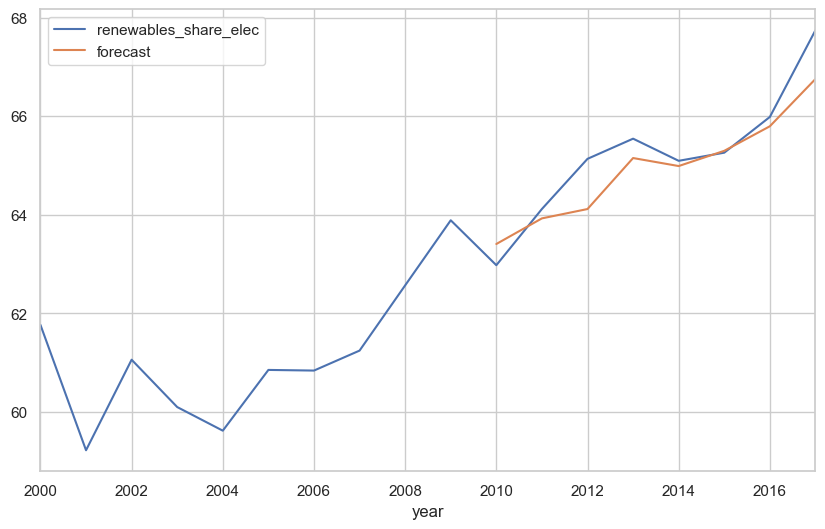

In [503]:
df_CAN_RSE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_CAN_RSE[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [504]:
df_CAN_RSE[["renewables_share_elec","forecast"]]

,renewables_share_elec,forecast
year,,
2000-01-01,61.768,NaN
2001-01-01,59.225,NaN
2002-01-01,61.061,NaN
2003-01-01,60.101,NaN
2004-01-01,59.622,NaN
2005-01-01,60.854,NaN
2006-01-01,60.841,NaN
2007-01-01,61.246,NaN
2008-01-01,62.569,NaN


In [505]:
df_CAN_RSE_future=pd.concat([df_CAN_RSE,get_future_df(df_CAN_RSE)])
df_CAN_RSE_future.tail(11)

,renewables_share_elec,first_difference,seasonal_first_difference,forecast
2017-01-01,67.743,1.758,2.483,66.754457
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

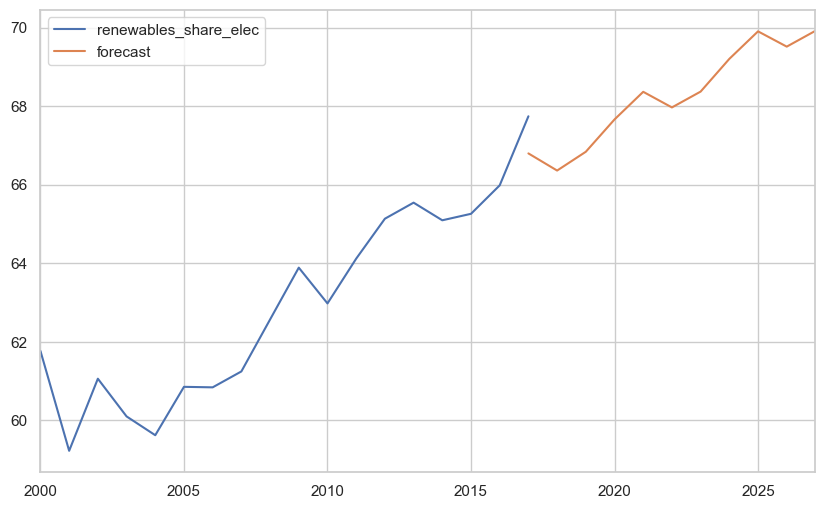

In [506]:
df_CAN_RSE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_CAN_RSE_future[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [507]:
get_sarima_forecast_percentage_diff(df_CAN_RSE_future, "CAN", "renewables_share_elec")

CAN's actual 2018 renewables_share_elec value: 67.42 TWh
CAN's forecasted 2018 renewables_share_elec value: 66.361 TWh

CAN's actual 2019 renewables_share_elec value: 67.018 TWh
CAN's forecasted 2019 renewables_share_elec value: 66.84 TWh

The Sarima model's renewables_share_elec forecast for CAN is 1.57% less in 2018
The Sarima model's renewables_share_elec forecast for CAN is 0.27% less in 2019


### FRANCE

In [508]:
df_FRA_RSE.set_index("year",inplace=True)

<Axes: xlabel='year'>

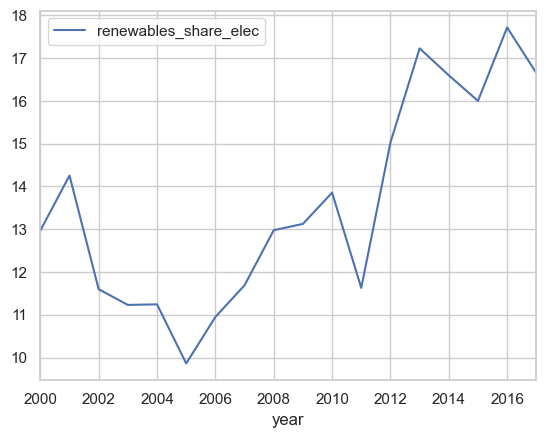

In [509]:
df_FRA_RSE.plot()

In [510]:
adfuller_test(df_FRA_RSE["renewables_share_elec"])

ADF Test Statistic : -0.18510400487899578
p-value : 0.9402740447156234
#Lags Used : 6
Number of Observations Used : 11
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [511]:
df_FRA_RSE["first_difference"] = (df_FRA_RSE["renewables_share_elec"]
                                 - df_FRA_RSE["renewables_share_elec"].shift(1))

In [512]:
adfuller_test(df_FRA_RSE["first_difference"].dropna())

ADF Test Statistic : -4.3035363209039215
p-value : 0.0004379902234960933
#Lags Used : 6
Number of Observations Used : 10
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

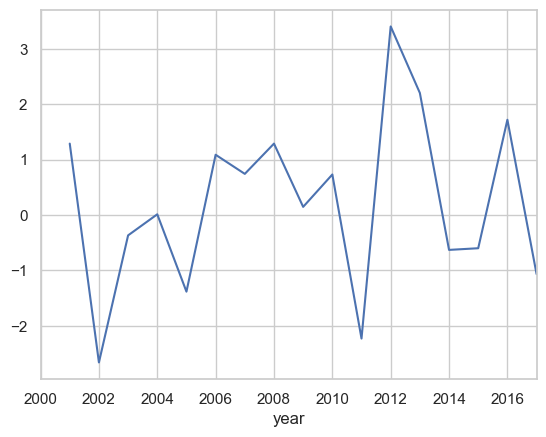

In [513]:
df_FRA_RSE["first_difference"].plot()

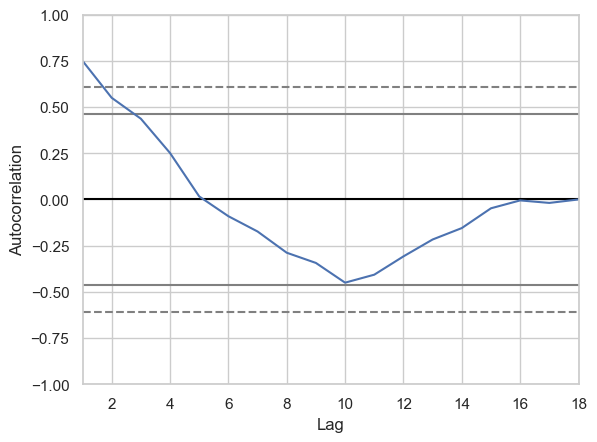

In [514]:
autocorrelation_plot(df_FRA_RSE["renewables_share_elec"])
plt.grid(True)
plt.show()

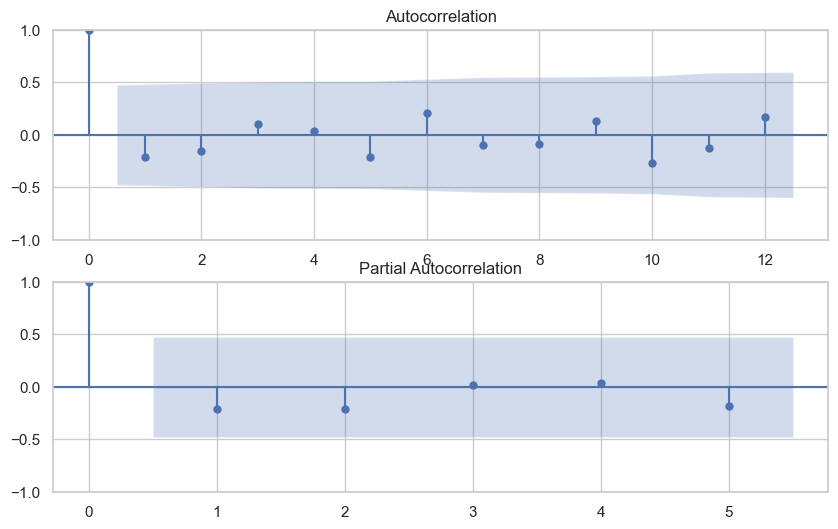

In [515]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_FRA_RSE["first_difference"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_FRA_RSE["first_difference"].dropna(),lags=5,ax=ax2)

In [516]:
model=ARIMA(df_FRA_RSE["renewables_share_elec"],order=(3,1,3))
model_fit=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [517]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 SARIMAX Results                                 
=================================================================================
Dep. Variable:     renewables_share_elec   No. Observations:                   18
Model:                    ARIMA(3, 1, 3)   Log Likelihood                 -30.829
Date:                   Thu, 14 Dec 2023   AIC                             75.658
Time:                           13:44:07   BIC                             81.490
Sample:                       01-01-2000   HQIC                            76.238
                            - 01-01-2017                                         
Covariance Type:                     opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9207     28.949     -0.032      0.975     -57.660      55.819
ar.L2         -0.8543      1.870     -0.457      0.648      -4.519       2.810
ar.L3         -0.9247     26.049     -0.035      0.972     -51.980      50.131
ma.L1          0.7623     41.553      0.018      0.985     -80.680      82.205
ma.L2          0.7415     12.536      0.059      0.953     -23.829      25.312
ma.L3          0.9753     37.844      0.026      0.979     -73.197      75.148
sigma2         1.9767     24.694      0.080      0.936     -46.422      50.376
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):                 0.25
Prob(Q):                              0.78   Prob(JB):                         0.88
Heteroskedasticity (H):               1.57   Skew:                            -0.02
Prob(H) (two-sided):                  0.60   Kurtosis:                         2.41
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Axes: xlabel='year'>

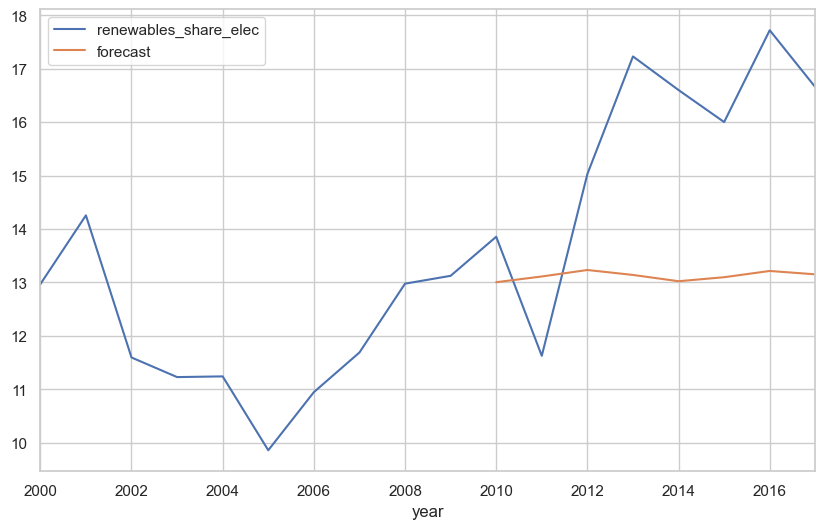

In [518]:
df_FRA_RSE["forecast"]=model_fit.predict(start=10,end=17,dynamic=True)
df_FRA_RSE[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [519]:
model=sm.tsa.statespace.SARIMAX(df_FRA_RSE["renewables_share_elec"],order=(3, 1, 3),seasonal_order=(3,1,3,12))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.45671D-01    |proj g|=  1.09785D+00

At iterate    5    f=  3.48406D-01    |proj g|=  2.88722D-02

At iterate   10    f=  3.27631D-01    |proj g|=  8.27388D-02

At iterate   15    f=  2.97327D-01    |proj g|=  1.21219D-01

At iterate   20    f=  2.89738D-01    |proj g|=  7.79993D-03

At iterate   25    f=  2.85224D-01    |proj g|=  1.35907D-01

At iterate   30    f=  2.84319D-01    |proj g|=  1.39216D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f=  2.84258D-01    |proj g|=  3.41923D-04

At iterate   40    f=  2.84257D-01    |proj g|=  3.59772D-03

At iterate   45    f=  2.84245D-01    |proj g|=  4.20092D-03

At iterate   50    f=  2.84241D-01    |proj g|=  5.18217D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     50     84      2     0     0   5.182D-03   2.842D-01
  F =  0.28424136104825859     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

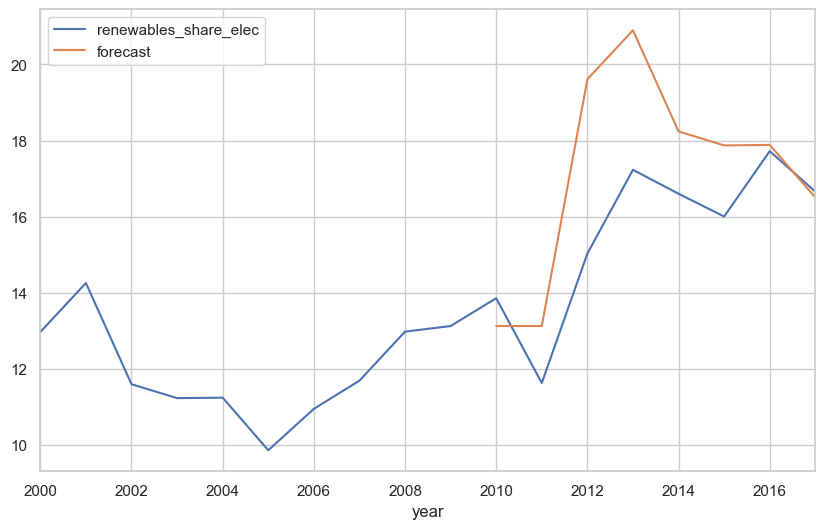

In [520]:
df_FRA_RSE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_FRA_RSE[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [521]:
df_FRA_RSE[["renewables_share_elec","forecast"]]

,renewables_share_elec,forecast
year,,
2000-01-01,12.968,NaN
2001-01-01,14.256,NaN
2002-01-01,11.597,NaN
2003-01-01,11.230,NaN
2004-01-01,11.243,NaN
2005-01-01,9.861,NaN
2006-01-01,10.948,NaN
2007-01-01,11.690,NaN
2008-01-01,12.978,NaN


In [522]:
df_FRA_RSE_future=pd.concat([df_FRA_RSE,get_future_df(df_FRA_RSE)])
df_FRA_RSE_future.tail(11)

,renewables_share_elec,first_difference,forecast
2017-01-01,16.655,-1.065,16.502034
2018-01-01,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN


<Axes: >

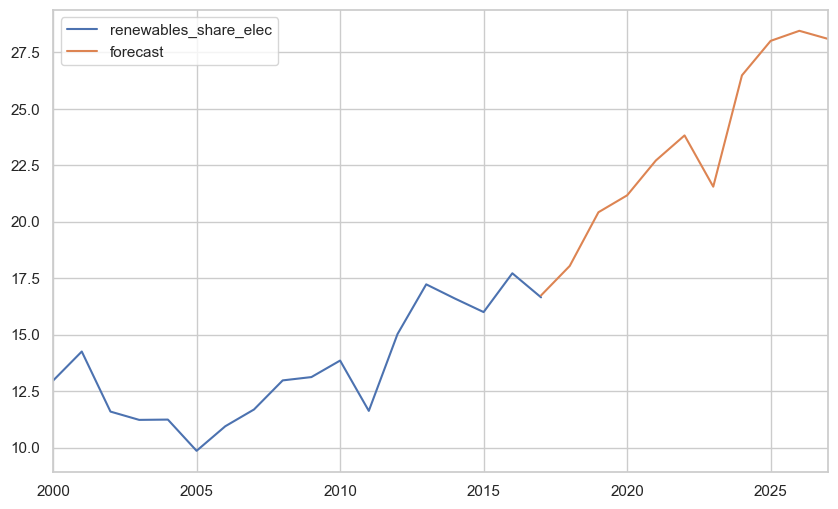

In [523]:
df_FRA_RSE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_FRA_RSE_future[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [524]:
get_sarima_forecast_percentage_diff(df_FRA_RSE_future, "FRA", "renewables_share_elec")

FRA's actual 2018 renewables_share_elec value: 19.688 TWh
FRA's forecasted 2018 renewables_share_elec value: 18.045 TWh

FRA's actual 2019 renewables_share_elec value: 19.894 TWh
FRA's forecasted 2019 renewables_share_elec value: 20.422 TWh

The Sarima model's renewables_share_elec forecast for FRA is 8.34% less in 2018
The Sarima model's renewables_share_elec forecast for FRA is 2.65% more in 2019


### GERMANY

In [525]:
df_DEU_RSE.set_index("year",inplace=True)

<Axes: xlabel='year'>

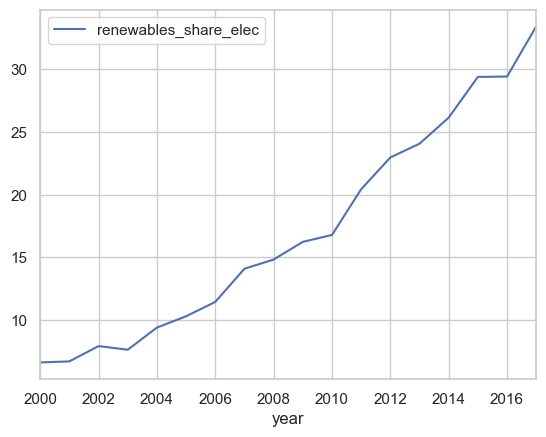

In [526]:
df_DEU_RSE.plot()

In [527]:
adfuller_test(df_DEU_RSE["renewables_share_elec"])

ADF Test Statistic : 1.8181462132435888
p-value : 0.9983843362419884
#Lags Used : 6
Number of Observations Used : 11
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [528]:
df_DEU_RSE["first_difference"] = (df_DEU_RSE["renewables_share_elec"]
                                 - df_DEU_RSE["renewables_share_elec"].shift(1))

In [529]:
adfuller_test(df_DEU_RSE["first_difference"].dropna())

ADF Test Statistic : -4.672098693268812
p-value : 9.491732291839864e-05
#Lags Used : 0
Number of Observations Used : 16
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

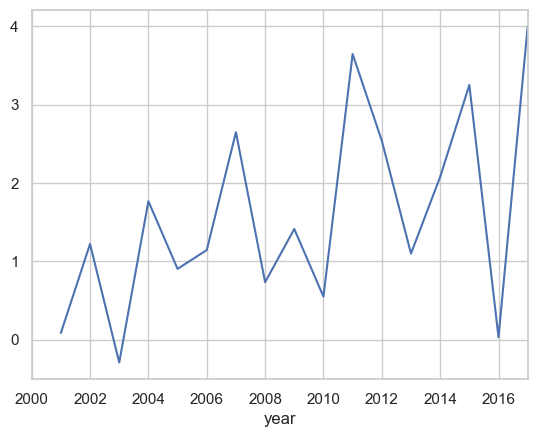

In [530]:
df_DEU_RSE["first_difference"].plot()

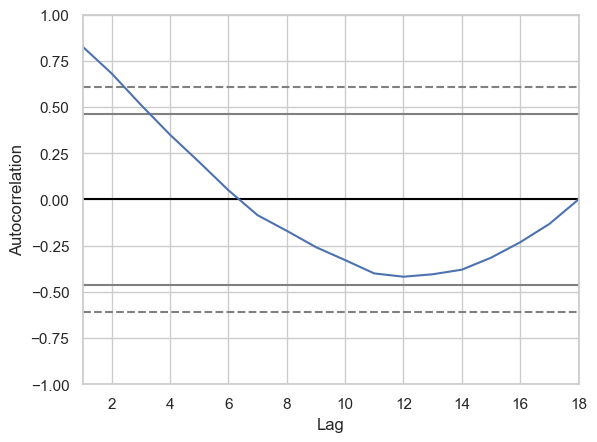

In [531]:
autocorrelation_plot(df_DEU_RSE["renewables_share_elec"])
plt.grid(True)
plt.show()

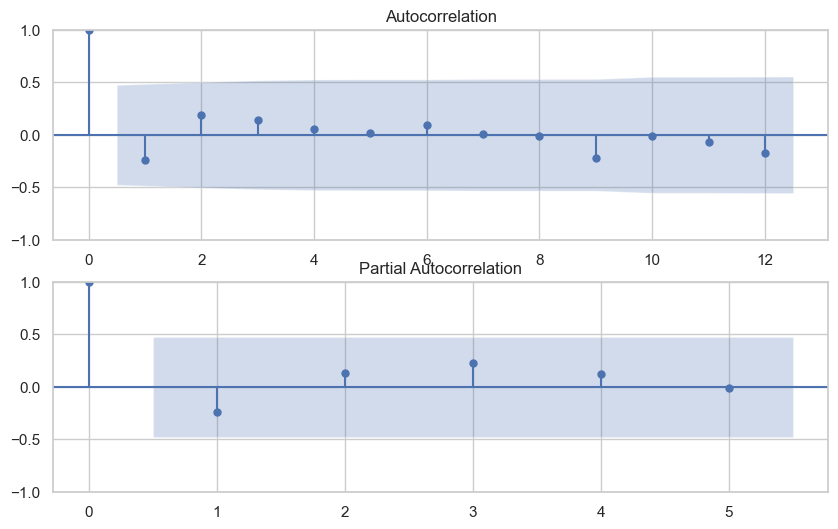

In [532]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_DEU_RSE["first_difference"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_DEU_RSE["first_difference"].dropna(),lags=5,ax=ax2)

In [533]:
model=sm.tsa.statespace.SARIMAX(df_DEU_RSE["renewables_share_elec"],order=(2, 1, 5),seasonal_order=(2,1,5,6))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.23030D+00    |proj g|=  4.34811D-01

At iterate    5    f=  1.02454D+00    |proj g|=  2.83741D-02

At iterate   10    f=  9.94748D-01    |proj g|=  3.11841D-02

At iterate   15    f=  9.85100D-01    |proj g|=  4.30047D-02

At iterate   20    f=  9.83299D-01    |proj g|=  4.30866D-02

At iterate   25    f=  9.82871D-01    |proj g|=  3.58537D-03

At iterate   30    f=  9.82766D-01    |proj g|=  8.63128D-03

At iterate   35    f=  9.82661D-01    |proj g|=  1.18187D-02

At iterate   40    f=  9.82380D-01    |proj g|=  7.85832D-03

At iterate   45    f=  9.82372D-01    |proj g|=  7.68729D-04

At iterate   50    f=  9.82366D-01    |proj g|=  3.67860D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

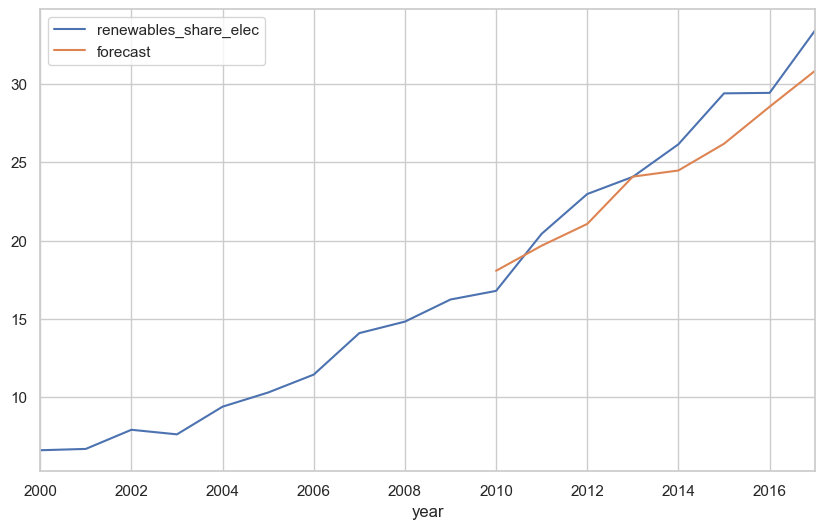

In [534]:
df_DEU_RSE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_DEU_RSE[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [535]:
df_DEU_RSE[["renewables_share_elec","forecast"]]

,renewables_share_elec,forecast
year,,
2000-01-01,6.616,NaN
2001-01-01,6.701,NaN
2002-01-01,7.922,NaN
2003-01-01,7.631,NaN
2004-01-01,9.397,NaN
2005-01-01,10.300,NaN
2006-01-01,11.443,NaN
2007-01-01,14.090,NaN
2008-01-01,14.823,NaN


In [536]:
df_DEU_RSE_future=pd.concat([df_DEU_RSE,get_future_df(df_DEU_RSE)])
df_DEU_RSE_future.tail(11)

,renewables_share_elec,first_difference,forecast
2017-01-01,33.416,3.996,30.835088
2018-01-01,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN


<Axes: >

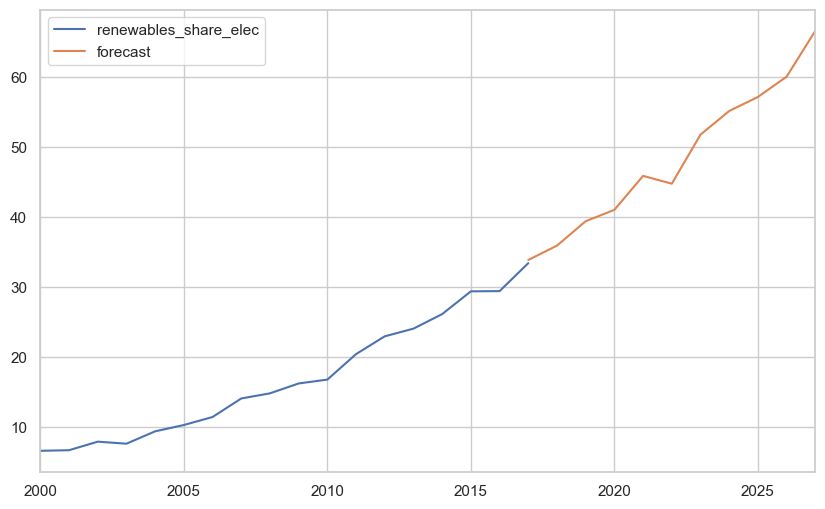

In [537]:
df_DEU_RSE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_DEU_RSE_future[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [538]:
get_sarima_forecast_percentage_diff(df_DEU_RSE_future, "DEU", "renewables_share_elec")

DEU's actual 2018 renewables_share_elec value: 35.284 TWh
DEU's forecasted 2018 renewables_share_elec value: 35.921 TWh

DEU's actual 2019 renewables_share_elec value: 40.139 TWh
DEU's forecasted 2019 renewables_share_elec value: 39.406 TWh

The Sarima model's renewables_share_elec forecast for DEU is 1.8% more in 2018
The Sarima model's renewables_share_elec forecast for DEU is 1.83% less in 2019


### ITALY

In [539]:
df_ITA_RSE.set_index("year",inplace=True)

<Axes: xlabel='year'>

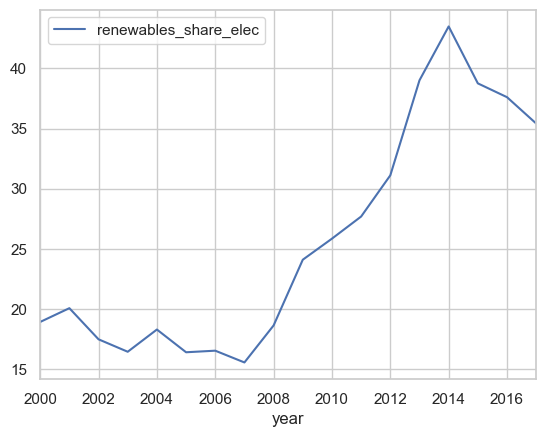

In [540]:
df_ITA_RSE.plot()

In [541]:
adfuller_test(df_ITA_RSE["renewables_share_elec"])

ADF Test Statistic : -16.9072463040052
p-value : 1.0170460712533446e-29
#Lags Used : 7
Number of Observations Used : 10
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


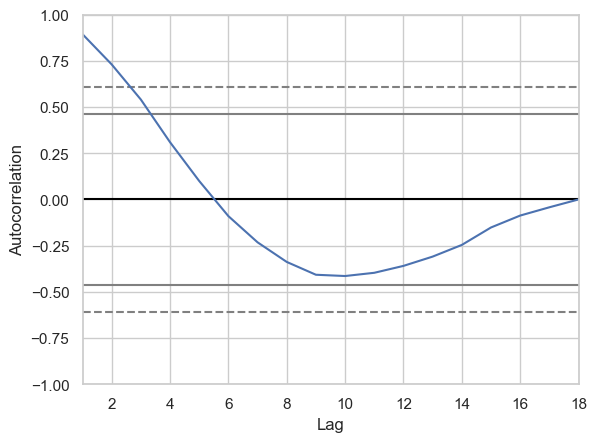

In [542]:
autocorrelation_plot(df_ITA_RSE["renewables_share_elec"])
plt.grid(True)
plt.show()

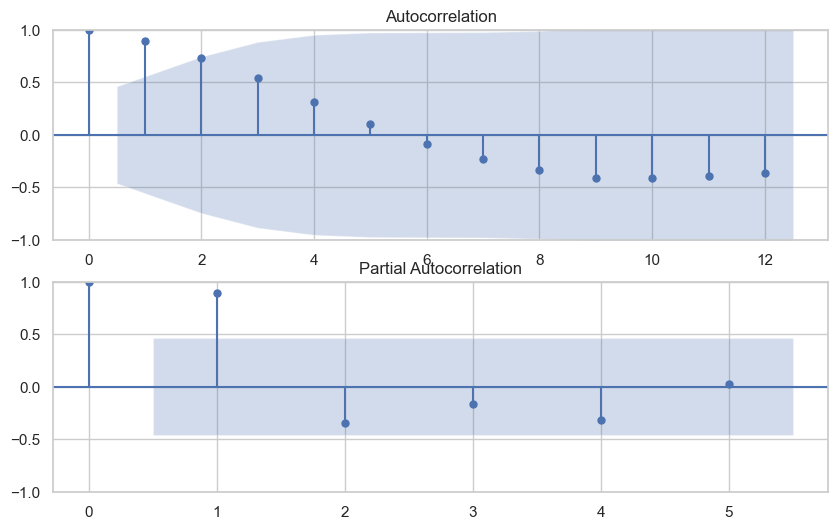

In [543]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_ITA_RSE["renewables_share_elec"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_ITA_RSE["renewables_share_elec"].dropna(),lags=5,ax=ax2)

In [544]:
model=sm.tsa.statespace.SARIMAX(df_ITA_RSE["renewables_share_elec"],order=(1, 0, 1),seasonal_order=(1,0,1,10))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.10068D+01    |proj g|=  3.54013D+01

At iterate    5    f=  2.78826D+00    |proj g|=  2.62962D-01

At iterate   10    f=  2.58727D+00    |proj g|=  4.68404D-02

At iterate   15    f=  2.58492D+00    |proj g|=  2.25155D-03

At iterate   20    f=  2.58481D+00    |proj g|=  1.56899D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     24      1     0     0   3.427D-06   2.585D+00
  F =   2.5848108894640895     

CONVERG

<Axes: xlabel='year'>

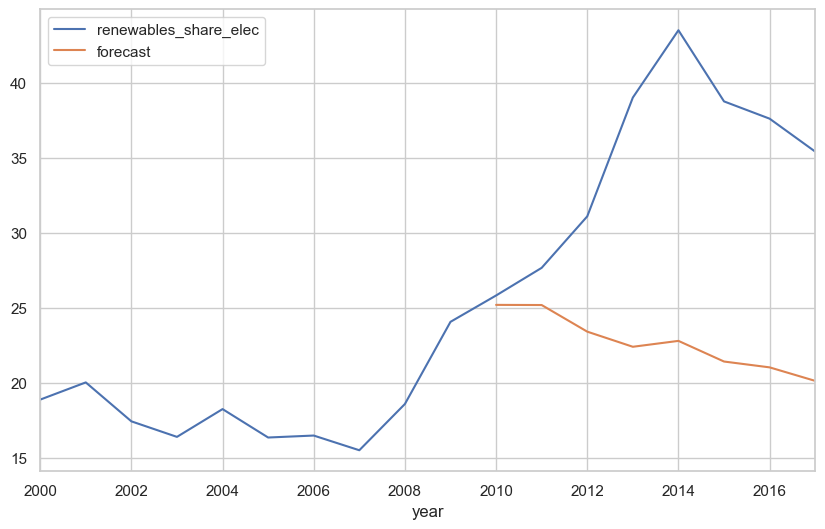

In [545]:
df_ITA_RSE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_ITA_RSE[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [546]:
df_ITA_RSE[["renewables_share_elec","forecast"]]

,renewables_share_elec,forecast
year,,
2000-01-01,18.903,NaN
2001-01-01,20.049,NaN
2002-01-01,17.457,NaN
2003-01-01,16.422,NaN
2004-01-01,18.272,NaN
2005-01-01,16.380,NaN
2006-01-01,16.511,NaN
2007-01-01,15.532,NaN
2008-01-01,18.612,NaN


In [547]:
df_ITA_RSE_future=pd.concat([df_ITA_RSE,get_future_df(df_ITA_RSE)])
df_ITA_RSE_future.tail(11)

,renewables_share_elec,forecast
2017-01-01,35.416,20.150766
2018-01-01,NaN,NaN
2019-01-01,NaN,NaN
2020-01-01,NaN,NaN
2021-01-01,NaN,NaN
2022-01-01,NaN,NaN
2023-01-01,NaN,NaN
2024-01-01,NaN,NaN
2025-01-01,NaN,NaN
2026-01-01,NaN,NaN


<Axes: >

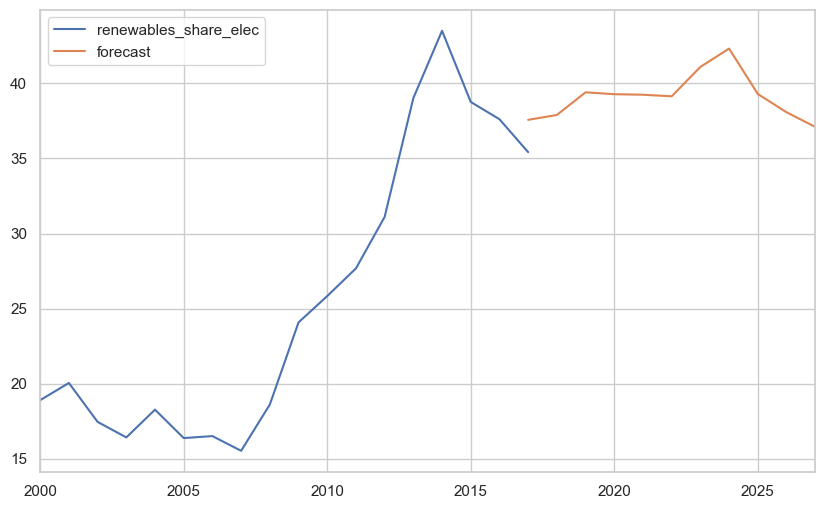

In [548]:
df_ITA_RSE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_ITA_RSE_future[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [549]:
get_sarima_forecast_percentage_diff(df_ITA_RSE_future, "ITA", "renewables_share_elec")

ITA's actual 2018 renewables_share_elec value: 39.809 TWh
ITA's forecasted 2018 renewables_share_elec value: 37.892 TWh

ITA's actual 2019 renewables_share_elec value: 40.351 TWh
ITA's forecasted 2019 renewables_share_elec value: 39.4 TWh

The Sarima model's renewables_share_elec forecast for ITA is 4.81% less in 2018
The Sarima model's renewables_share_elec forecast for ITA is 2.36% less in 2019


### JAPAN

In [550]:
df_JPN_RSE.set_index("year",inplace=True)

<Axes: xlabel='year'>

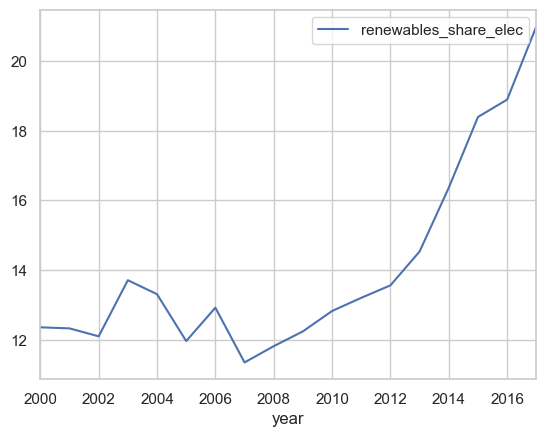

In [551]:
df_JPN_RSE.plot()

In [552]:
adfuller_test(df_JPN_RSE["renewables_share_elec"])

ADF Test Statistic : 1.718745310201115
p-value : 0.9981734799896193
#Lags Used : 0
Number of Observations Used : 17
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [553]:
df_JPN_RSE["first_difference"] = (df_JPN_RSE["renewables_share_elec"]
                                 - df_JPN_RSE["renewables_share_elec"].shift(1))

In [554]:
adfuller_test(df_JPN_RSE["first_difference"].dropna())

ADF Test Statistic : -0.43898021359398387
p-value : 0.9033842317147063
#Lags Used : 4
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [555]:
df_JPN_RSE["seasonal_first_difference"] = (df_JPN_RSE["renewables_share_elec"]
                                 - df_JPN_RSE["renewables_share_elec"].shift(12))

In [556]:
adfuller_test(df_JPN_RSE["seasonal_first_difference"].dropna())

ADF Test Statistic : 0.6049507400930538
p-value : 0.9877370228361042
#Lags Used : 0
Number of Observations Used : 5
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [557]:
# Performing Box-Cox transformation
df_JPN_RSE["boxcox_value"], lam = boxcox(df_JPN_RSE["renewables_share_elec"])

In [558]:
# Differencing after transformation
df_JPN_RSE["diff_boxcox"] = df_JPN_RSE["boxcox_value"].diff()

In [559]:
adfuller_test(df_JPN_RSE["diff_boxcox"].dropna())

ADF Test Statistic : -8.484677739356863
p-value : 1.3634103684320632e-13
#Lags Used : 6
Number of Observations Used : 10
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

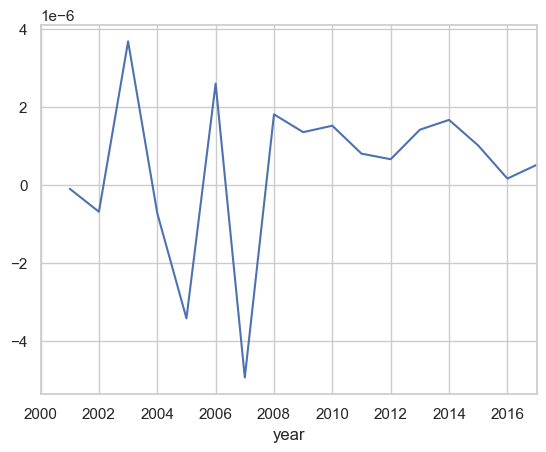

In [560]:
df_JPN_RSE["diff_boxcox"].plot()

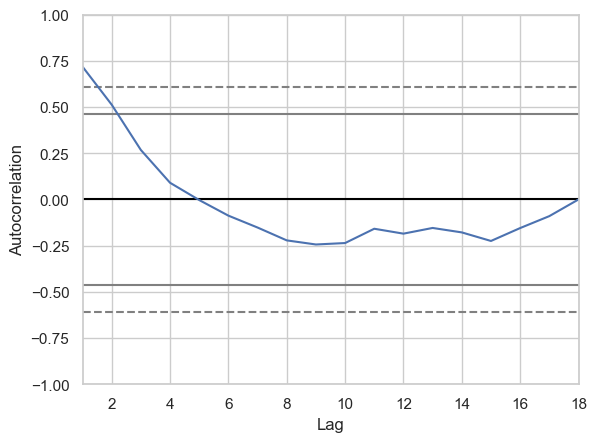

In [561]:
autocorrelation_plot(df_JPN_RSE["renewables_share_elec"])
plt.grid(True)
plt.show()

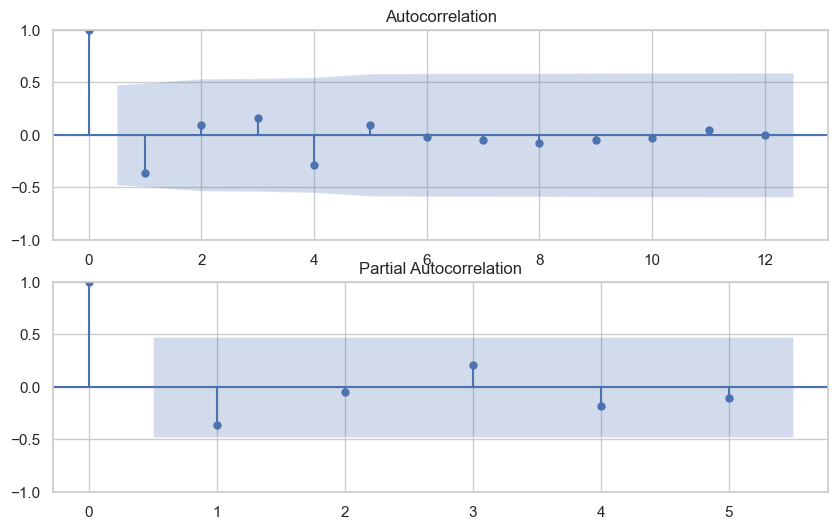

In [562]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_JPN_RSE["diff_boxcox"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_JPN_RSE["diff_boxcox"].dropna(),lags=5,ax=ax2)

In [563]:
model=sm.tsa.statespace.SARIMAX(df_JPN_RSE["renewables_share_elec"],order=(3, 1, 2),seasonal_order=(3,1,2,4))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.52828D+00    |proj g|=  1.55113D+00

At iterate    5    f=  1.14243D+00    |proj g|=  3.28306D-02

At iterate   10    f=  1.11422D+00    |proj g|=  7.58805D-02

At iterate   15    f=  1.08696D+00    |proj g|=  7.94227D-02

At iterate   20    f=  1.07222D+00    |proj g|=  6.59504D-02

At iterate   25    f=  1.07087D+00    |proj g|=  4.74116D-03

At iterate   30    f=  1.06979D+00    |proj g|=  5.67915D-02

At iterate   35    f=  1.06222D+00    |proj g|=  1.48710D-01

At iterate   40    f=  1.05546D+00    |proj g|=  1.21544D-01

At iterate   45    f=  1.05221D+00    |proj g|=  4.25225D-02

At iterate   50    f=  1.04736D+00    |proj g|=  9.11714D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

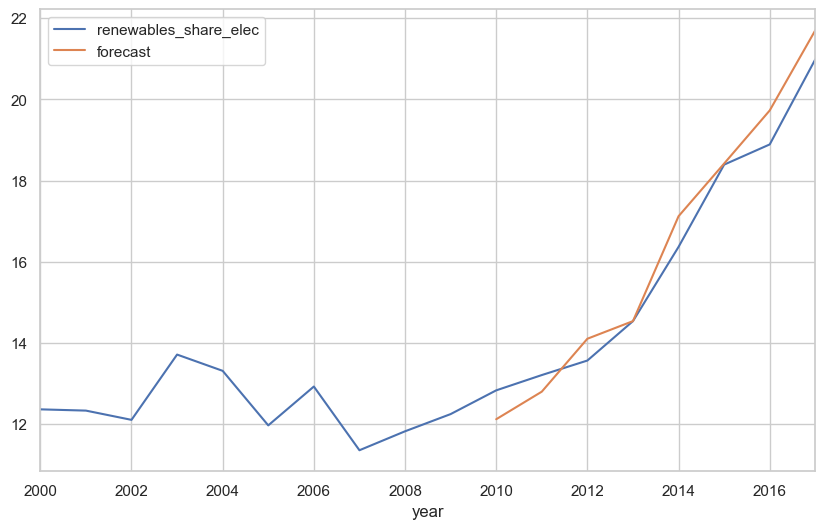

In [564]:
df_JPN_RSE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_JPN_RSE[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [565]:
df_JPN_RSE[["renewables_share_elec","forecast"]]

,renewables_share_elec,forecast
year,,
2000-01-01,12.361,NaN
2001-01-01,12.330,NaN
2002-01-01,12.102,NaN
2003-01-01,13.711,NaN
2004-01-01,13.310,NaN
2005-01-01,11.966,NaN
2006-01-01,12.923,NaN
2007-01-01,11.353,NaN
2008-01-01,11.820,NaN


In [566]:
df_JPN_RSE_future=pd.concat([df_JPN_RSE,get_future_df(df_JPN_RSE)])
df_JPN_RSE_future.tail(11)

,renewables_share_elec,first_difference,seasonal_first_difference,boxcox_value,diff_boxcox,forecast
2017-01-01,20.988,2.098,9.022,0.24481,5.239673e-07,21.703823
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

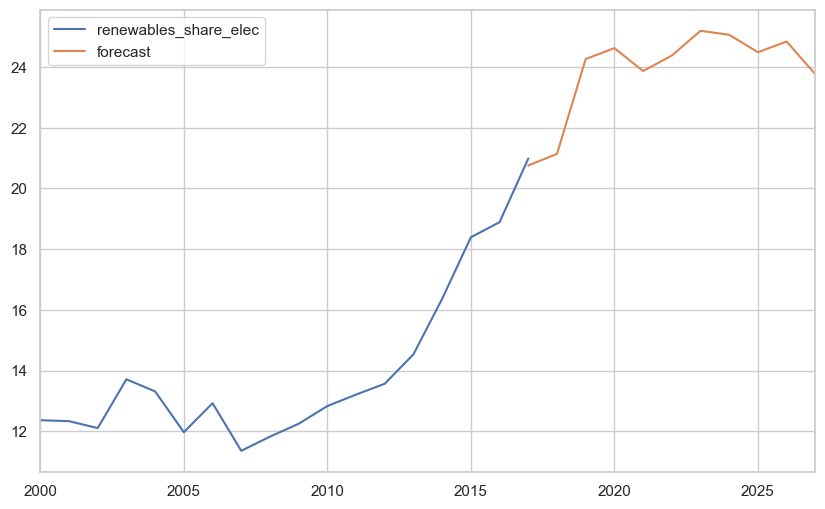

In [567]:
df_JPN_RSE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_JPN_RSE_future[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [568]:
get_sarima_forecast_percentage_diff(df_JPN_RSE_future, "JPN", "renewables_share_elec")

JPN's actual 2018 renewables_share_elec value: 21.898 TWh
JPN's forecasted 2018 renewables_share_elec value: 21.141 TWh

JPN's actual 2019 renewables_share_elec value: 23.681 TWh
JPN's forecasted 2019 renewables_share_elec value: 24.267 TWh

The Sarima model's renewables_share_elec forecast for JPN is 3.46% less in 2018
The Sarima model's renewables_share_elec forecast for JPN is 2.48% more in 2019


### UNITED KINGDOM

In [569]:
df_GBR_RSE.set_index("year",inplace=True)

<Axes: xlabel='year'>

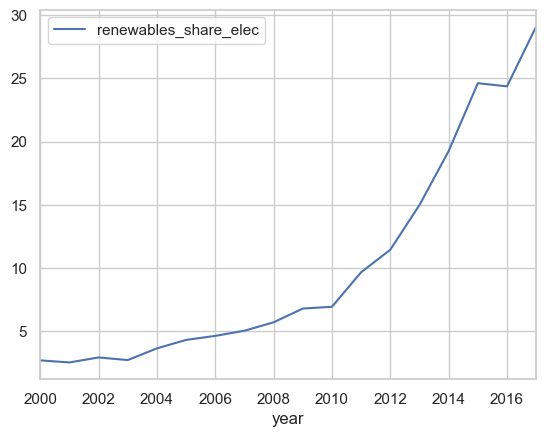

In [570]:
df_GBR_RSE.plot()

In [571]:
adfuller_test(df_GBR_RSE["renewables_share_elec"])

ADF Test Statistic : 2.0778369397804077
p-value : 0.9987659377195276
#Lags Used : 5
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [572]:
df_GBR_RSE["first_difference"] = (df_GBR_RSE["renewables_share_elec"]
                                 - df_GBR_RSE["renewables_share_elec"].shift(1))

In [573]:
adfuller_test(df_GBR_RSE["first_difference"].dropna())

ADF Test Statistic : -1.5682343451596277
p-value : 0.4995279553040904
#Lags Used : 4
Number of Observations Used : 12
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [574]:
df_GBR_RSE["seasonal_first_difference"] = (df_GBR_RSE["renewables_share_elec"]
                                 - df_GBR_RSE["renewables_share_elec"].shift(3))

In [575]:
adfuller_test(df_GBR_RSE["seasonal_first_difference"].dropna())

ADF Test Statistic : -3.17748439631467
p-value : 0.021325525510558475
#Lags Used : 5
Number of Observations Used : 9
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

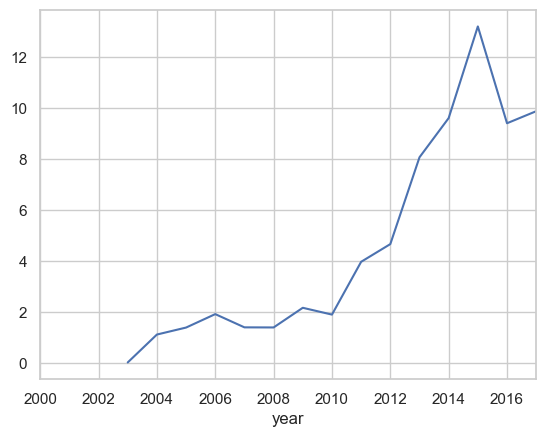

In [576]:
df_GBR_RSE["seasonal_first_difference"].plot()

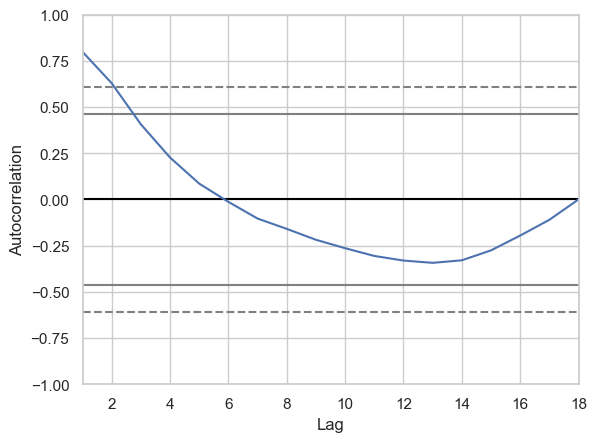

In [577]:
autocorrelation_plot(df_GBR_RSE["renewables_share_elec"])
plt.grid(True)
plt.show()

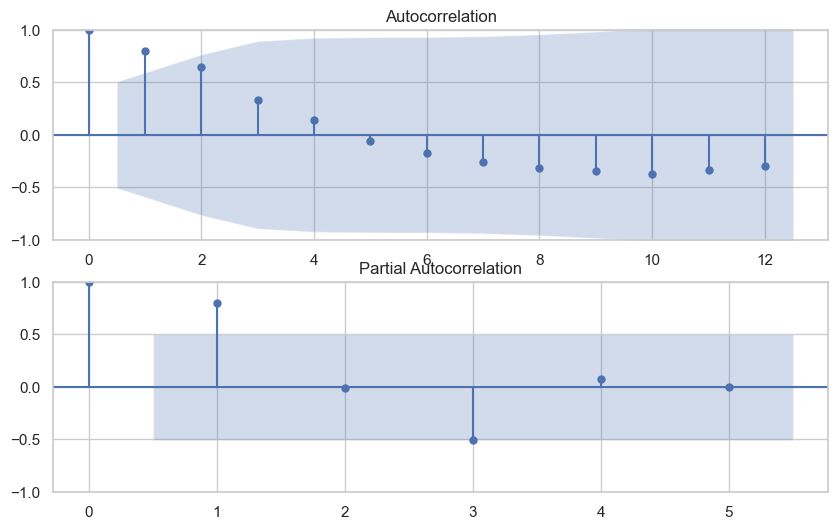

In [578]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_GBR_RSE["seasonal_first_difference"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_GBR_RSE["seasonal_first_difference"].dropna(),lags=5,ax=ax2)

In [579]:
model=sm.tsa.statespace.SARIMAX(df_GBR_RSE["renewables_share_elec"],order=(2, 1, 4),seasonal_order=(2,1,4,11))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.34618D+00    |proj g|=  9.75100D-01

At iterate    5    f=  7.94316D-01    |proj g|=  1.83638D-02

At iterate   10    f=  7.68280D-01    |proj g|=  1.08266D-02

At iterate   15    f=  7.65440D-01    |proj g|=  3.64811D-03

At iterate   20    f=  7.63222D-01    |proj g|=  1.48293D-02

At iterate   25    f=  7.61120D-01    |proj g|=  2.80265D-02

At iterate   30    f=  7.59347D-01    |proj g|=  5.16334D-03

At iterate   35    f=  7.58926D-01    |proj g|=  1.65960D-02

At iterate   40    f=  7.58548D-01    |proj g|=  1.21708D-02

At iterate   45    f=  7.58421D-01    |proj g|=  2.02187D-02

At iterate   50    f=  7.58304D-01    |proj g|=  3.68230D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

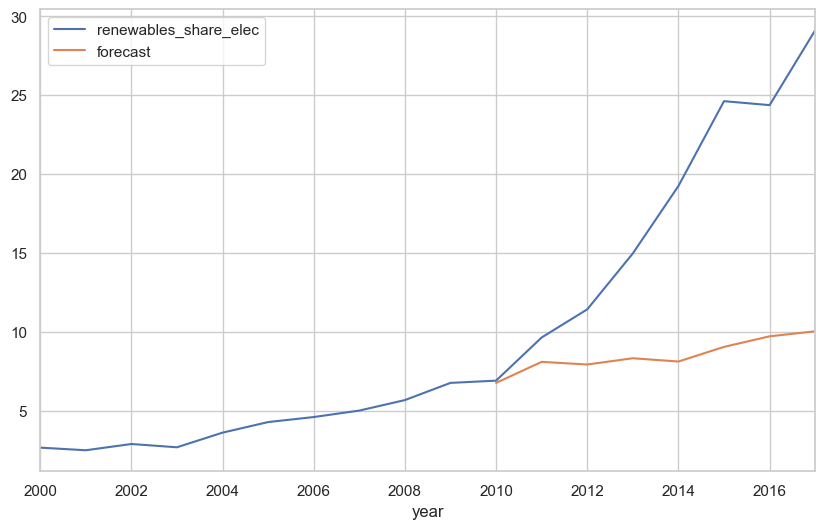

In [580]:
df_GBR_RSE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_GBR_RSE[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [581]:
df_GBR_RSE[["renewables_share_elec","forecast"]]

,renewables_share_elec,forecast
year,,
2000-01-01,2.663,NaN
2001-01-01,2.497,NaN
2002-01-01,2.893,NaN
2003-01-01,2.685,NaN
2004-01-01,3.613,NaN
2005-01-01,4.283,NaN
2006-01-01,4.602,NaN
2007-01-01,5.011,NaN
2008-01-01,5.677,NaN


In [582]:
df_GBR_RSE_future=pd.concat([df_GBR_RSE,get_future_df(df_GBR_RSE)])
df_GBR_RSE_future.tail(11)

,renewables_share_elec,first_difference,seasonal_first_difference,forecast
2017-01-01,29.12,4.746,9.872,10.037925
2018-01-01,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN


<Axes: >

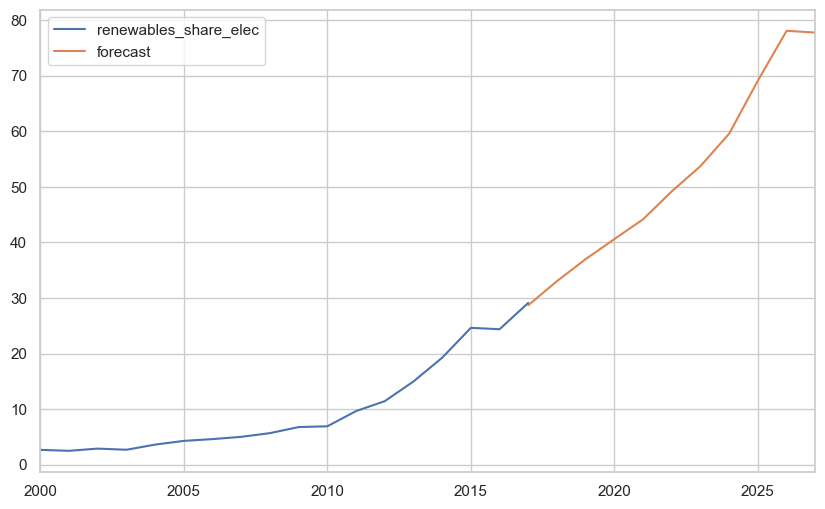

In [583]:
df_GBR_RSE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_GBR_RSE_future[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [584]:
get_sarima_forecast_percentage_diff(df_GBR_RSE_future, "GBR", "renewables_share_elec")

GBR's actual 2018 renewables_share_elec value: 32.942 TWh
GBR's forecasted 2018 renewables_share_elec value: 33.03 TWh

GBR's actual 2019 renewables_share_elec value: 36.722 TWh
GBR's forecasted 2019 renewables_share_elec value: 37.002 TWh

The Sarima model's renewables_share_elec forecast for GBR is 0.27% more in 2018
The Sarima model's renewables_share_elec forecast for GBR is 0.76% more in 2019


### USA

In [585]:
df_USA_RSE.set_index("year",inplace=True)

<Axes: xlabel='year'>

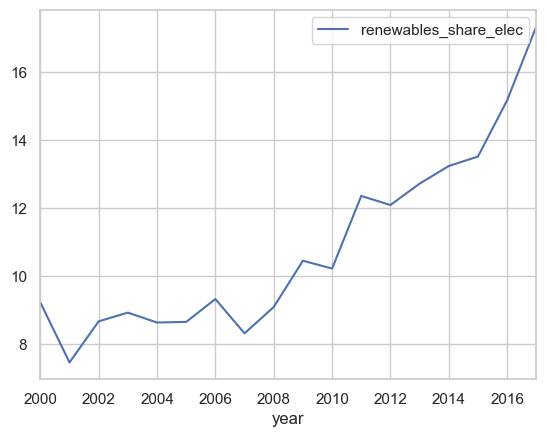

In [586]:
df_USA_RSE.plot()

In [587]:
adfuller_test(df_USA_RSE["renewables_share_elec"])

ADF Test Statistic : 3.3648752439635894
p-value : 1.0
#Lags Used : 6
Number of Observations Used : 11
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [588]:
df_USA_RSE["first_difference"] = (df_USA_RSE["renewables_share_elec"]
                                 - df_USA_RSE["renewables_share_elec"].shift(1))

In [589]:
adfuller_test(df_USA_RSE["first_difference"].dropna())

ADF Test Statistic : 0.5269406248917631
p-value : 0.9856693370263828
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [590]:
df_USA_RSE["seasonal_first_difference"] = (df_USA_RSE["renewables_share_elec"]
                                 - df_USA_RSE["renewables_share_elec"].shift(12))

In [591]:
adfuller_test(df_USA_RSE["seasonal_first_difference"].dropna())

ADF Test Statistic : -0.3347288098417297
p-value : 0.9204396422676056
#Lags Used : 0
Number of Observations Used : 5
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [592]:
# Performing Box-Cox transformation
df_USA_RSE["boxcox_value"], lam = boxcox(df_USA_RSE["renewables_share_elec"])

In [593]:
# Differencing after transformation
df_USA_RSE["diff_boxcox"] = df_USA_RSE["boxcox_value"].diff()

In [594]:
adfuller_test(df_USA_RSE["diff_boxcox"].dropna())

ADF Test Statistic : -2.7768019570952713
p-value : 0.06166460974347456
#Lags Used : 6
Number of Observations Used : 10
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


In [595]:
df_USA_RSE['seasonal_diff_boxcox'] = df_USA_RSE['boxcox_value'].diff(2)

In [596]:
adfuller_test(df_USA_RSE["seasonal_diff_boxcox"].dropna())

ADF Test Statistic : -15.863417512430823
p-value : 9.156030262688159e-29
#Lags Used : 6
Number of Observations Used : 9
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='year'>

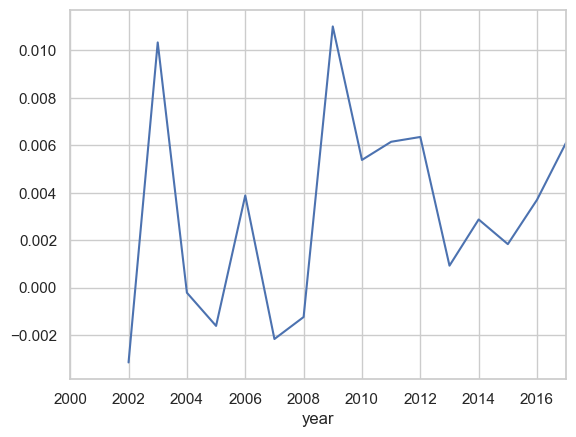

In [597]:
df_USA_RSE["seasonal_diff_boxcox"].plot()

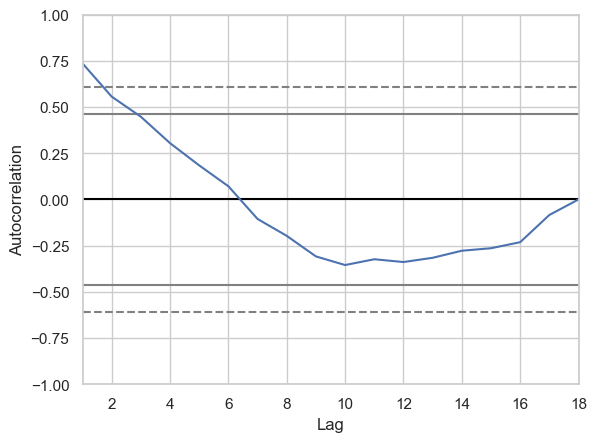

In [598]:
autocorrelation_plot(df_USA_RSE["renewables_share_elec"])
plt.grid(True)
plt.show()

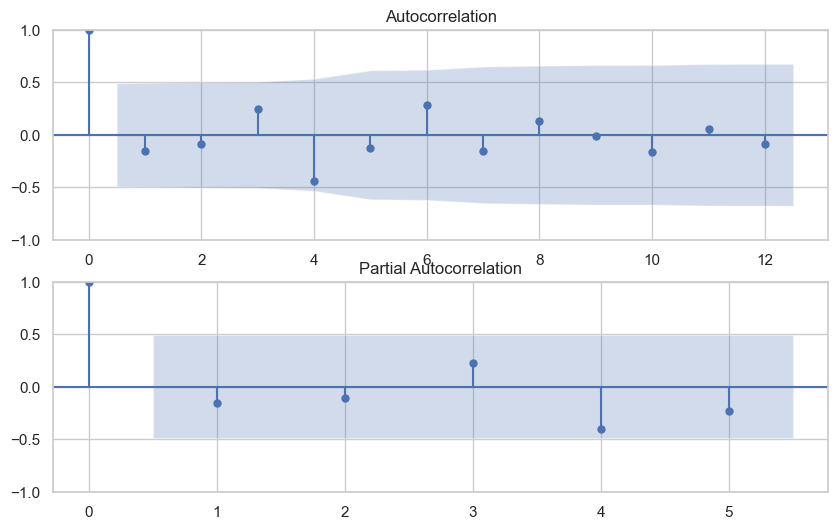

In [599]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_USA_RSE["seasonal_diff_boxcox"].dropna(),lags=12,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_USA_RSE["seasonal_diff_boxcox"].dropna(),lags=5,ax=ax2)

In [600]:
model=sm.tsa.statespace.SARIMAX(df_USA_RSE["renewables_share_elec"],order=(3, 1, 3),seasonal_order=(3,1,3,7))
results=model.fit()

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.01703D+00    |proj g|=  5.16777D-01

At iterate    5    f=  6.86646D-01    |proj g|=  1.58665D-01

At iterate   10    f=  5.56046D-01    |proj g|=  2.08318D-01

At iterate   15    f=  5.19048D-01    |proj g|=  1.45447D-01

At iterate   20    f=  5.07098D-01    |proj g|=  7.99212D-01

At iterate   25    f=  5.01457D-01    |proj g|=  9.08591D-02

At iterate   30    f=  4.70877D-01    |proj g|=  2.77497D+00

At iterate   35    f=  4.27003D-01    |proj g|=  1.04347D+01

At iterate   40    f=  4.14680D-01    |proj g|=  2.93131D+00

At iterate   45    f=  4.09635D-01    |proj g|=  7.02117D+00

At iterate   50    f=  4.06036D-01    |proj g|=  2.76147D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Applications/miniconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='year'>

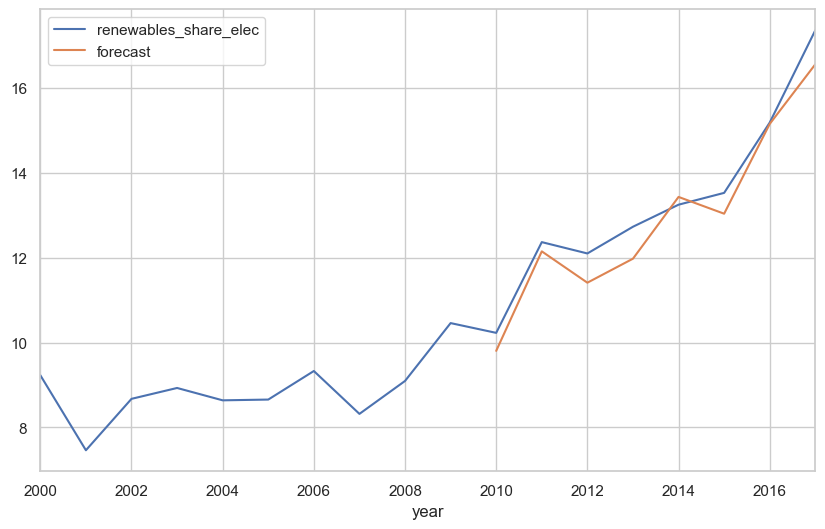

In [601]:
df_USA_RSE["forecast"]=results.predict(start=10,end=17,dynamic=True)
df_USA_RSE[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [602]:
df_USA_RSE[["renewables_share_elec","forecast"]]

,renewables_share_elec,forecast
year,,
2000-01-01,9.230,NaN
2001-01-01,7.464,NaN
2002-01-01,8.674,NaN
2003-01-01,8.930,NaN
2004-01-01,8.639,NaN
2005-01-01,8.657,NaN
2006-01-01,9.329,NaN
2007-01-01,8.320,NaN
2008-01-01,9.095,NaN


In [603]:
df_USA_RSE_future=pd.concat([df_USA_RSE,get_future_df(df_USA_RSE)])
df_USA_RSE_future.tail(11)

,renewables_share_elec,first_difference,seasonal_first_difference,boxcox_value,diff_boxcox,seasonal_diff_boxcox,forecast
2017-01-01,17.35,2.173,8.693,0.720029,0.003026,0.006119,16.548942
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2025-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2026-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

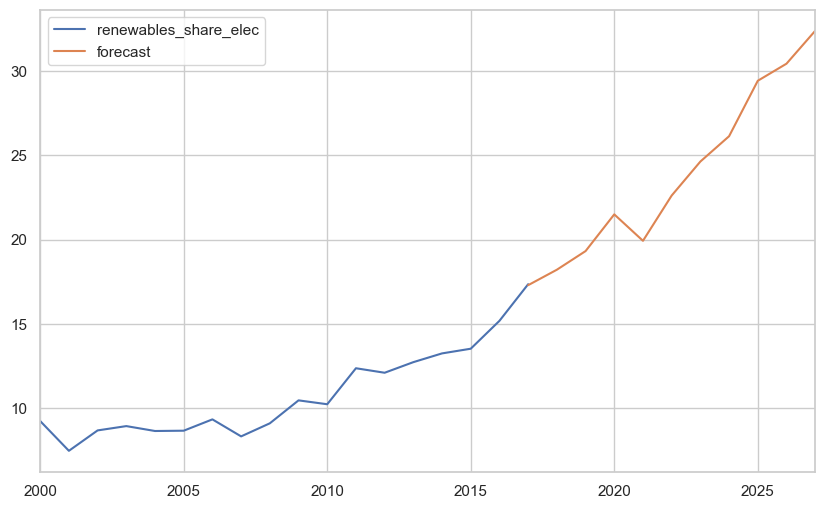

In [604]:
df_USA_RSE_future["forecast"]=results.predict(start=17,end=27,dynamic=True)
df_USA_RSE_future[["renewables_share_elec","forecast"]].plot(figsize=(10,6))

In [605]:
get_sarima_forecast_percentage_diff(df_USA_RSE_future, "USA", "renewables_share_elec")

USA's actual 2018 renewables_share_elec value: 17.377 TWh
USA's forecasted 2018 renewables_share_elec value: 18.209 TWh

USA's actual 2019 renewables_share_elec value: 18.199 TWh
USA's forecasted 2019 renewables_share_elec value: 19.315 TWh

The Sarima model's renewables_share_elec forecast for USA is 4.79% more in 2018
The Sarima model's renewables_share_elec forecast for USA is 6.13% more in 2019
